<center>
    <h1><b>Ứng dụng học máy dự báo mức độ ô nhiễm không khí tại các thành phố</b></h1>
    <h2><b>Học phần: Học Máy</b></h2>
    <h3><b>Giảng viên: Cao Văn Chung</b></h3>
</center>

---

**Sinh viên thực hiện:**
- Trần Kiều Hạnh - 22000091
- Đỗ Quốc An - 22000067  
- Phạm Thị Duyên - 22000079


# Import thư viện cần thiết, dữ liệu đầu vào

## Import thư viện cần thiết

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
import time
from sklearn.metrics import pairwise_distances
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy import stats
from itertools import combinations
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, davies_bouldin_score, calinski_harabasz_score
from matplotlib.path import Path
from matplotlib.spines import Spine
from matplotlib.transforms import Affine2D
from matplotlib.colors import ListedColormap
from sklearn.preprocessing import KBinsDiscretizer
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, precision_recall_fscore_support
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from collections import defaultdict
from sklearn.neural_network import MLPRegressor
import itertools
from scipy import linalg
import matplotlib.patheffects as PathEffects
from matplotlib.patches import Ellipse
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import shapiro

# Thiết lập font hỗ trợ Unicode (tiếng Việt)
plt.rcParams['font.family'] = 'DejaVu Sans'

## Tiền xử lý dữ liệu

In [ ]:
# Đọc dữ liệu
df = pd.read_csv("https://raw.githubusercontent.com/quocandev/Data_ML/refs/heads/master/city_day.csv")

# Hiển thị kích thước dữ liệu
print(f"Kích thước dữ liệu: {df.shape}")

# Xem 5 bản ghi đầu tiên
print("\n5 bản ghi đầu tiên:")
print(df.head())

# Thông tin về kiểu dữ liệu và số lượng dữ liệu không bị thiếu
print("\nThông tin về dữ liệu:")
print(df.info())

# Thống kê mô tả cho các trường số
print("\nThống kê mô tả cho các trường số:")
print(df.describe())

# Kiểm tra các giá trị bị thiếu
print("\nSố lượng giá trị bị thiếu trong mỗi trường:")
print(df.isnull().sum())

# Kiểm tra số lượng thành phố và ngày trong dữ liệu
print(f"\nSố lượng thành phố: {df['City'].nunique()}")
print(f"Các thành phố: {df['City'].unique()}")
print(f"Khoảng thời gian: từ {df['Date'].min()} đến {df['Date'].max()}")

# Chuyển đổi cột Date sang định dạng datetime
df['Date'] = pd.to_datetime(df['Date'])

# Thêm các cột năm, tháng, ngày để phân tích theo thời gian
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day

# Kiểm tra các giá trị ngoại lai cho các chỉ số ô nhiễm
numeric_cols = ['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'Benzene', 'Toluene', 'Xylene', 'AQI']

# Xử lý giá trị thiếu
# Phương pháp 1: Điền giá trị thiếu bằng giá trị trung bình theo thành phố
for col in numeric_cols:
    city_means = df.groupby('City')[col].transform('mean')
    df[col] = df[col].fillna(city_means)

# Nếu vẫn còn giá trị NA (có thể xảy ra nếu một thành phố không có dữ liệu nào cho một chỉ số cụ thể)
# thì điền bằng giá trị trung bình của tất cả các thành phố
for col in numeric_cols:
    df[col] = df[col].fillna(city_means)

# Xử lý AQI_Bucket
# Điền các giá trị thiếu bằng cách ánh xạ từ giá trị AQI
def map_aqi_to_bucket(aqi):
    if pd.isna(aqi):
        return None
    elif aqi <= 50:
        return 'Good'
    elif aqi <= 100:
        return 'Satisfactory'
    elif aqi <= 200:
        return 'Moderate'
    elif aqi <= 300:
        return 'Poor'
    elif aqi <= 400:
        return 'Very Poor'
    else:
        return 'Severe'

# Điền giá trị thiếu cho AQI_Bucket
df['AQI_Bucket'] = df.apply(lambda row: row['AQI_Bucket'] if pd.notna(row['AQI_Bucket']) else map_aqi_to_bucket(row['AQI']), axis=1)

# Kiểm tra lại các giá trị thiếu sau khi xử lý
print("\nSố lượng giá trị bị thiếu sau khi xử lý:")
print(df.isnull().sum())

# Phát hiện và xử lý các giá trị ngoại lai
for col in numeric_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Thay thế các giá trị ngoại lai bằng giới hạn trên/dưới
    df[col] = df[col].clip(lower=lower_bound, upper=upper_bound)

# Chuyển đổi cột AQI_Bucket sang one-hot encoding
aqi_bucket_dummies = pd.get_dummies(df['AQI_Bucket'], prefix='AQI_Bucket')
df = pd.concat([df, aqi_bucket_dummies], axis=1)

# Chuyển đổi cột City sang one-hot encoding
city_dummies = pd.get_dummies(df['City'], prefix='City')
df = pd.concat([df, city_dummies], axis=1)

# Chuẩn hóa các biến số về thang đo từ 0-1
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
df_normalized = df.copy()

for col in numeric_cols:
    df_normalized[col] = scaler.fit_transform(df[col].values.reshape(-1, 1))

# Kiểm tra kết quả chuẩn hóa
print("\nThống kê mô tả sau khi chuẩn hóa:")
print(df_normalized[numeric_cols].describe())

Kích thước dữ liệu: (29531, 16)

5 bản ghi đầu tiên:
        City        Date  PM2.5  PM10     NO    NO2    NOx  NH3     CO    SO2  \
0  Ahmedabad  2015-01-01    NaN   NaN   0.92  18.22  17.15  NaN   0.92  27.64   
1  Ahmedabad  2015-01-02    NaN   NaN   0.97  15.69  16.46  NaN   0.97  24.55   
2  Ahmedabad  2015-01-03    NaN   NaN  17.40  19.30  29.70  NaN  17.40  29.07   
3  Ahmedabad  2015-01-04    NaN   NaN   1.70  18.48  17.97  NaN   1.70  18.59   
4  Ahmedabad  2015-01-05    NaN   NaN  22.10  21.42  37.76  NaN  22.10  39.33   

       O3  Benzene  Toluene  Xylene  AQI AQI_Bucket  
0  133.36     0.00     0.02    0.00  NaN        NaN  
1   34.06     3.68     5.50    3.77  NaN        NaN  
2   30.70     6.80    16.40    2.25  NaN        NaN  
3   36.08     4.43    10.14    1.00  NaN        NaN  
4   39.31     7.01    18.89    2.78  NaN        NaN  

Thông tin về dữ liệu:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29531 entries, 0 to 29530
Data columns (total 16 columns):
 #  

## Phân tích thống kê mô tả dữ liệu


====== PHÂN TÍCH AQI CHƯA CHUẨN HÓA ======

Thống kê AQI chưa chuẩn hóa theo năm và tháng:
                  mean         std        min    max  count
Year Month                                                 
2015 1      198.099737  119.028010  94.318325  407.0    214
     2      190.254616  110.142782  94.318325  407.0    196
     3      181.686821  101.847232  80.000000  407.0    217
     4      180.023206   95.680030  44.000000  407.0    210
     5      179.248479   96.952291  45.000000  407.0    217
...                ...         ...        ...    ...    ...
2020 3      111.235032   57.409190  26.000000  407.0    796
     4       86.588897   40.684517  18.000000  315.0    780
     5       89.123637   41.584715  14.000000  256.0    806
     6       80.689498   44.718344  16.000000  407.0    780
     7       75.511683   35.382625  20.000000  157.0     26

[67 rows x 5 columns]


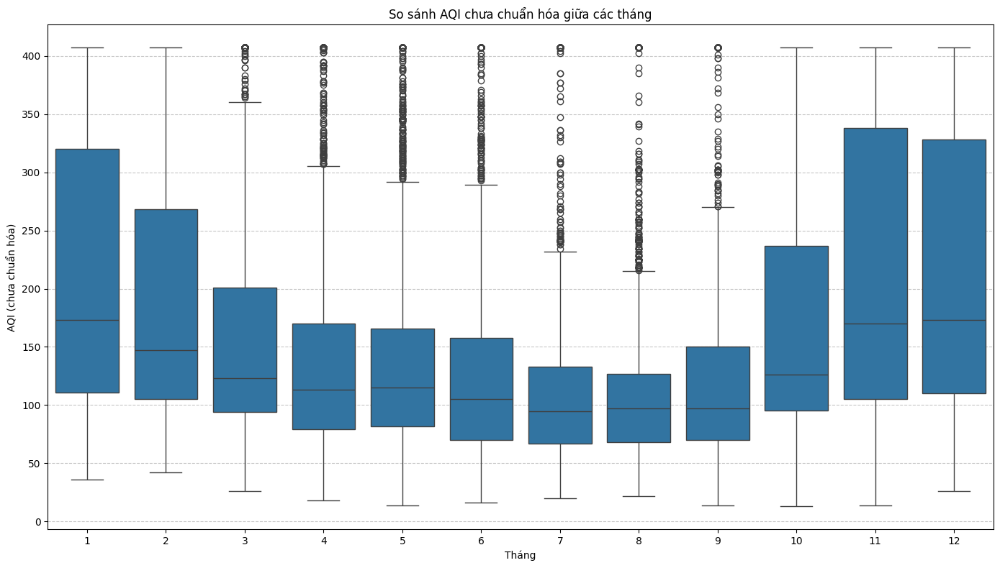

<Figure size 1600x1000 with 0 Axes>

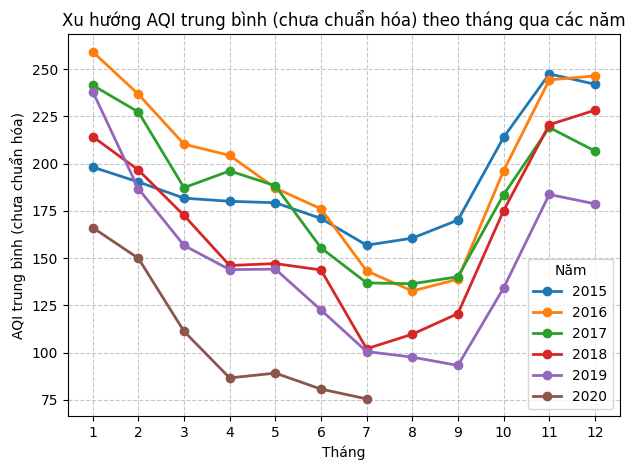

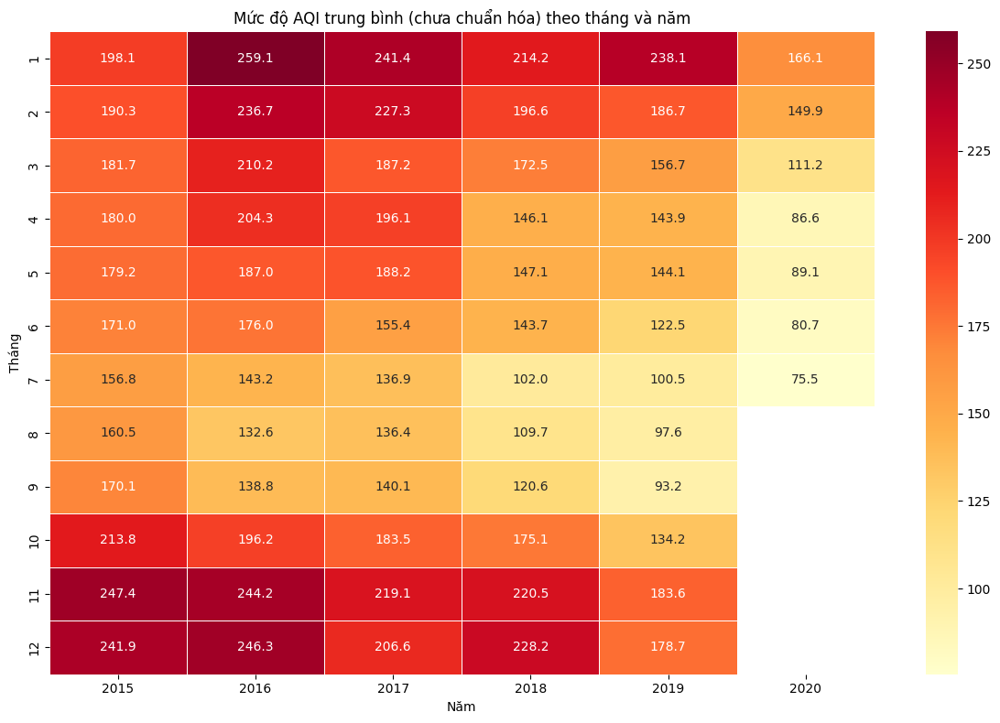


====== PHÂN TÍCH AQI ĐÃ CHUẨN HÓA ======

Thống kê AQI đã chuẩn hóa theo năm và tháng:
                mean       std       min       max  count
Year Month                                               
2015 1      0.469796  0.302102  0.206392  1.000000    214
     2      0.449885  0.279550  0.206392  1.000000    196
     3      0.428139  0.258496  0.170051  1.000000    217
     4      0.423917  0.242843  0.078680  1.000000    210
     5      0.421950  0.246072  0.081218  1.000000    217
...              ...       ...       ...       ...    ...
2020 3      0.249327  0.145709  0.032995  1.000000    796
     4      0.186774  0.103260  0.012690  0.766497    780
     5      0.193207  0.105545  0.002538  0.616751    806
     6      0.171801  0.113498  0.007614  1.000000    780
     7      0.158659  0.089804  0.017766  0.365482     26

[67 rows x 5 columns]


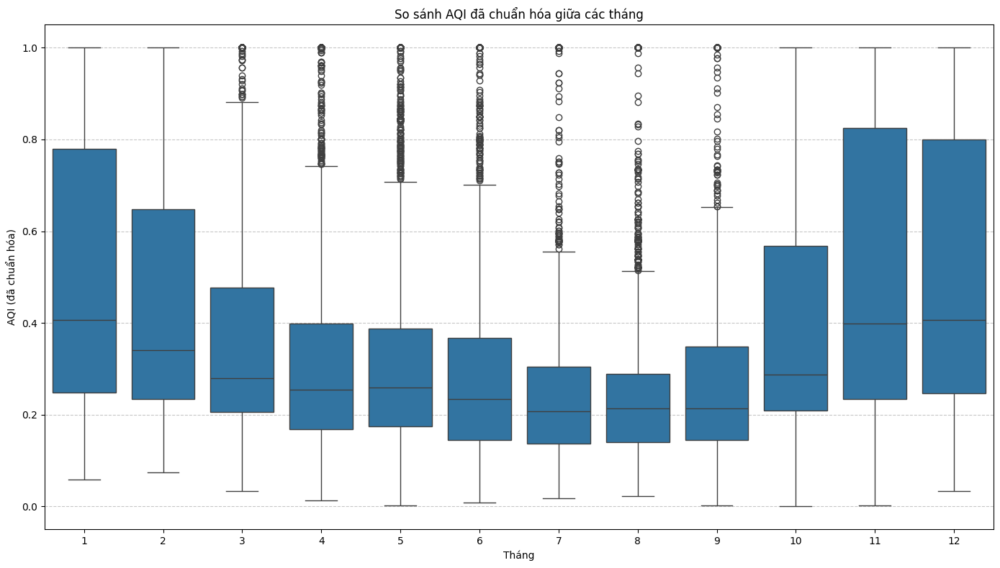

<Figure size 1600x1000 with 0 Axes>

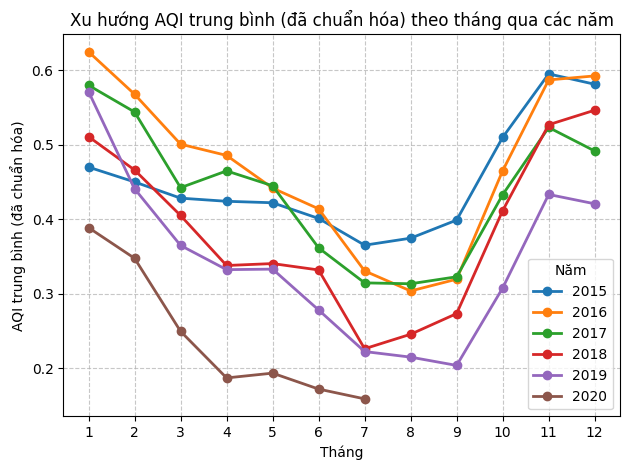

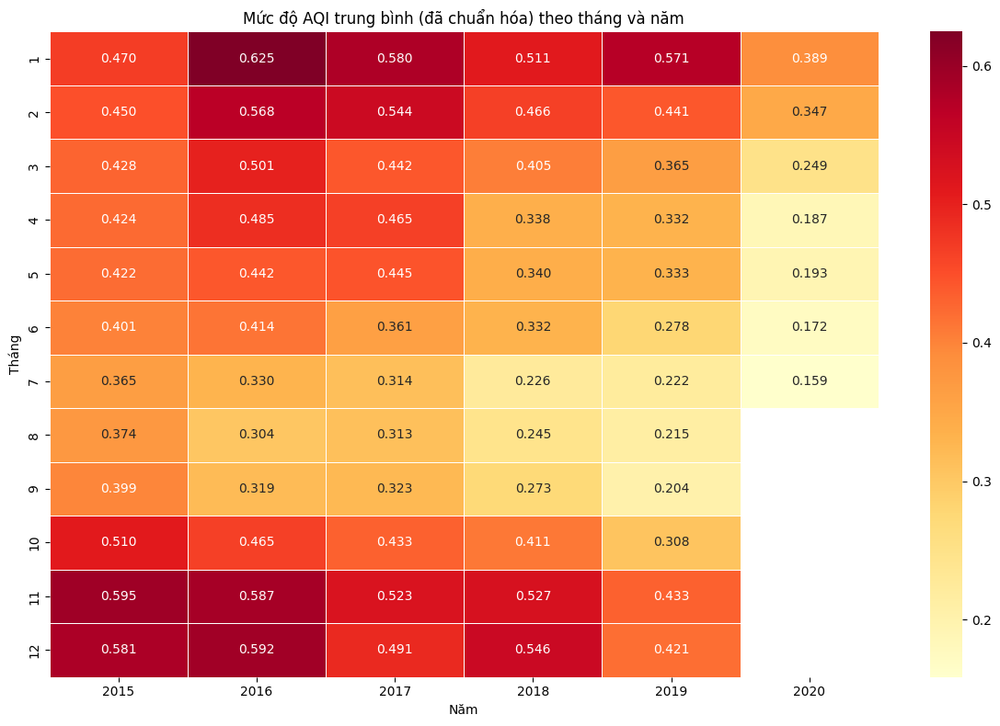

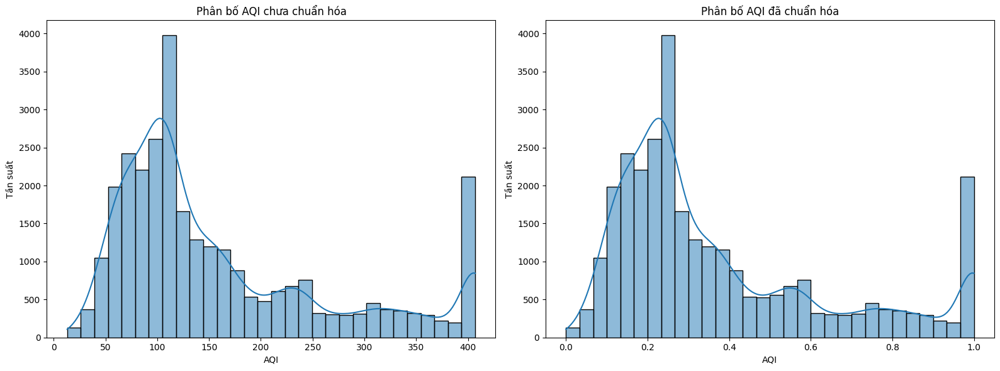

In [ ]:
#----------- PHÂN TÍCH AQI CHƯA CHUẨN HÓA ------------#
print("\n====== PHÂN TÍCH AQI CHƯA CHUẨN HÓA ======")

# Thống kê AQI theo năm và tháng (chưa chuẩn hóa)
aqi_by_year_month_raw = df.groupby(['Year', 'Month'])['AQI'].agg(['mean', 'std', 'min', 'max', 'count']).sort_index()
print("\nThống kê AQI chưa chuẩn hóa theo năm và tháng:")
print(aqi_by_year_month_raw)

# Vẽ biểu đồ so sánh AQI chưa chuẩn hóa giữa các tháng
plt.figure(figsize=(14, 8))
sns.boxplot(x='Month', y='AQI', data=df)
plt.title('So sánh AQI chưa chuẩn hóa giữa các tháng')
plt.xlabel('Tháng')
plt.ylabel('AQI (chưa chuẩn hóa)')
plt.xticks(ticks=np.arange(0, 12), labels=[str(i) for i in range(1, 13)])
plt.grid(True, axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig('aqi_raw_by_month.png')
plt.show()

# Vẽ biểu đồ xu hướng AQI chưa chuẩn hóa theo từng tháng qua các năm
plt.figure(figsize=(16, 10))
pivot_data_raw = df.pivot_table(index='Month', columns='Year', values='AQI', aggfunc='mean')
pivot_data_raw.plot(marker='o', linewidth=2)
plt.title('Xu hướng AQI trung bình (chưa chuẩn hóa) theo tháng qua các năm')
plt.xlabel('Tháng')
plt.ylabel('AQI trung bình (chưa chuẩn hóa)')
plt.xticks(ticks=range(1, 13), labels=[str(i) for i in range(1, 13)])
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Năm')
plt.tight_layout()
plt.savefig('aqi_raw_trend_by_month_year.png')
plt.show()

# Vẽ biểu đồ nhiệt (heatmap) thể hiện AQI chưa chuẩn hóa theo tháng và năm
plt.figure(figsize=(12, 8))
pivot_heatmap_raw = df.pivot_table(index='Month', columns='Year', values='AQI', aggfunc='mean')
sns.heatmap(pivot_heatmap_raw, annot=True, cmap='YlOrRd', fmt='.1f', linewidths=.5)
plt.title('Mức độ AQI trung bình (chưa chuẩn hóa) theo tháng và năm')
plt.xlabel('Năm')
plt.ylabel('Tháng')
plt.tight_layout()
plt.savefig('aqi_raw_heatmap_by_month_year.png')
plt.show()

#----------- PHÂN TÍCH AQI ĐÃ CHUẨN HÓA ------------#
print("\n====== PHÂN TÍCH AQI ĐÃ CHUẨN HÓA ======")

# Thống kê AQI theo năm và tháng (đã chuẩn hóa)
aqi_by_year_month = df_normalized.groupby(['Year', 'Month'])['AQI'].agg(['mean', 'std', 'min', 'max', 'count']).sort_index()
print("\nThống kê AQI đã chuẩn hóa theo năm và tháng:")
print(aqi_by_year_month)

# Vẽ biểu đồ so sánh AQI đã chuẩn hóa giữa các tháng
plt.figure(figsize=(14, 8))
sns.boxplot(x='Month', y='AQI', data=df_normalized)
plt.title('So sánh AQI đã chuẩn hóa giữa các tháng')
plt.xlabel('Tháng')
plt.ylabel('AQI (đã chuẩn hóa)')
plt.xticks(ticks=np.arange(0, 12), labels=[str(i) for i in range(1, 13)])
plt.grid(True, axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig('aqi_normalized_by_month.png')
plt.show()

# Vẽ biểu đồ xu hướng AQI đã chuẩn hóa theo từng tháng qua các năm
plt.figure(figsize=(16, 10))
pivot_data = df_normalized.pivot_table(index='Month', columns='Year', values='AQI', aggfunc='mean')
pivot_data.plot(marker='o', linewidth=2)
plt.title('Xu hướng AQI trung bình (đã chuẩn hóa) theo tháng qua các năm')
plt.xlabel('Tháng')
plt.ylabel('AQI trung bình (đã chuẩn hóa)')
plt.xticks(ticks=range(1, 13), labels=[str(i) for i in range(1, 13)])
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Năm')
plt.tight_layout()
plt.savefig('aqi_normalized_trend_by_month_year.png')
plt.show()

# Vẽ biểu đồ nhiệt (heatmap) thể hiện AQI đã chuẩn hóa theo tháng và năm
plt.figure(figsize=(12, 8))
pivot_heatmap = df_normalized.pivot_table(index='Month', columns='Year', values='AQI', aggfunc='mean')
sns.heatmap(pivot_heatmap, annot=True, cmap='YlOrRd', fmt='.3f', linewidths=.5)
plt.title('Mức độ AQI trung bình (đã chuẩn hóa) theo tháng và năm')
plt.xlabel('Năm')
plt.ylabel('Tháng')
plt.tight_layout()
plt.savefig('aqi_normalized_heatmap_by_month_year.png')
plt.show()

# So sánh phân bố AQI chuẩn hóa và chưa chuẩn hóa
plt.figure(figsize=(16, 6))

plt.subplot(1, 2, 1)
sns.histplot(df['AQI'], kde=True, bins=30)
plt.title('Phân bố AQI chưa chuẩn hóa')
plt.xlabel('AQI')
plt.ylabel('Tần suất')

plt.subplot(1, 2, 2)
sns.histplot(df_normalized['AQI'], kde=True, bins=30)
plt.title('Phân bố AQI đã chuẩn hóa')
plt.xlabel('AQI')
plt.ylabel('Tần suất')

plt.tight_layout()
plt.savefig('aqi_distribution_comparison.png')
plt.show()

# Giảm chiều (PCA, t-SNE)

## Chuẩn hóa dữ liệu và phân tích thành phần chính

### PCA


Thống kê mô tả cho dữ liệu đã chuẩn hóa:


,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene
count,2.953100e+04,2.953100e+04,2.953100e+04,2.953100e+04,2.953100e+04,2.953100e+04,2.953100e+04,2.953100e+04,2.953100e+04,29531.000000,2.953100e+04,2.953100e+04
mean,-2.579330e-16,-4.619695e-17,-1.616893e-16,9.624364e-17,1.539898e-17,-6.159593e-17,1.077929e-16,2.001868e-16,-5.389644e-17,0.000000,2.155858e-16,2.694822e-17
std,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017,1.000017e+00,1.000017e+00
min,-1.567575e+00,-1.764659e+00,-1.208837e+00,-1.434235e+00,-1.274251e+00,-1.370857e+00,-1.302990e+00,-1.451121e+00,-1.839946e+00,-0.849966,-7.625106e-01,-8.436265e-01
25%,-7.336398e-01,-8.277019e-01,-7.474308e-01,-7.874099e-01,-7.206806e-01,-7.439780e-01,-6.812217e-01,-7.610429e-01,-7.570870e-01,-0.787448,-7.207701e-01,-8.274646e-01
50%,-2.554302e-01,-1.702229e-01,-3.757918e-01,-2.195427e-01,-2.759281e-01,-3.213563e-01,-2.551950e-01,-3.192473e-01,-5.645374e-02,-0.389603,-4.999688e-01,-7.480362e-01
75%,4.341058e-01,5.400072e-01,5.015478e-01,5.219266e-01,4.863693e-01,3.704499e-01,4.586875e-01,3.634663e-01,5.171039e-01,0.383354,3.714401e-01,7.380701e-01
max,2.185724e+00,2.591571e+00,2.375016e+00,2.485931e+00,2.296944e+00,2.042092e+00,2.168551e+00,2.050230e+00,2.428390e+00,2.139556,2.009755e+00,2.167371e+00



Phương sai giải thích của từng thành phần:
PC1: 0.2965 (0.2965 tích lũy)
PC2: 0.1494 (0.4459 tích lũy)
PC3: 0.1088 (0.5547 tích lũy)
PC4: 0.0988 (0.6535 tích lũy)
PC5: 0.0866 (0.7400 tích lũy)
PC6: 0.0613 (0.8013 tích lũy)
PC7: 0.0517 (0.8531 tích lũy)
PC8: 0.0419 (0.8950 tích lũy)
PC9: 0.0337 (0.9287 tích lũy)
PC10: 0.0266 (0.9553 tích lũy)
PC11: 0.0238 (0.9791 tích lũy)
PC12: 0.0209 (1.0000 tích lũy)


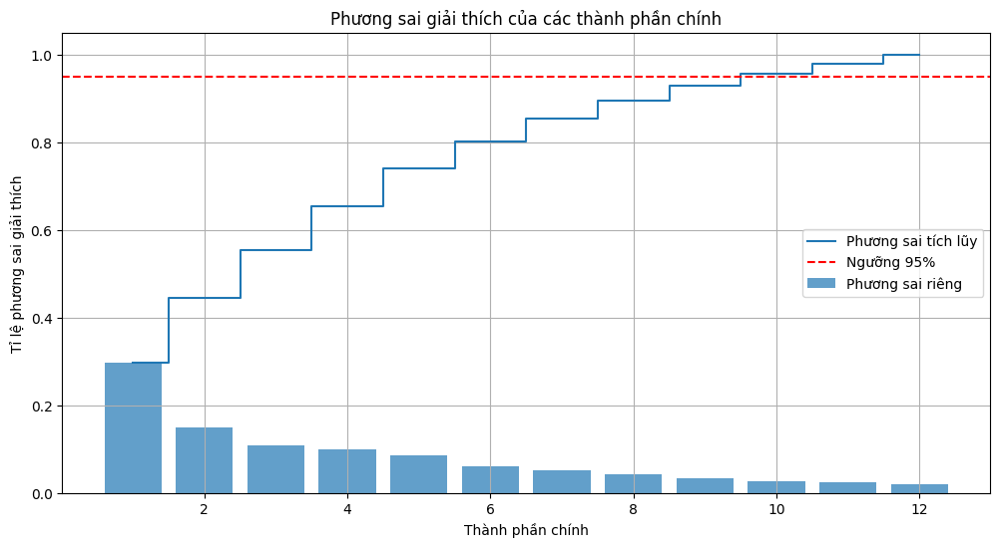


Số lượng thành phần cần thiết để giữ 95% phương sai: 10


In [ ]:
# Chuẩn bị dữ liệu cho PCA
# Sử dụng biến numeric_cols đã có sẵn
X = df[numeric_cols].copy()
# Loại bỏ biến mục tiêu AQI để tránh rò rỉ thông tin
X_features = X.drop('AQI', axis=1)

# Chuẩn hóa dữ liệu
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_features)
X_scaled_df = pd.DataFrame(X_scaled, columns=X_features.columns)

# Thống kê cho dữ liệu đã chuẩn hóa
print("\nThống kê mô tả cho dữ liệu đã chuẩn hóa:")
display(X_scaled_df.describe())

# Thực hiện PCA với n_components=12 (số lượng tối đa)
pca_full = PCA()
X_pca_full = pca_full.fit_transform(X_scaled)

# Hiển thị phương sai giải thích cho mỗi thành phần
explained_variance = pca_full.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)

print("\nPhương sai giải thích của từng thành phần:")
for i, var in enumerate(explained_variance):
    print(f"PC{i+1}: {var:.4f} ({cumulative_variance[i]:.4f} tích lũy)")

# Vẽ biểu đồ phương sai giải thích
plt.figure(figsize=(12, 6))
plt.bar(range(1, len(explained_variance)+1), explained_variance, alpha=0.7, label='Phương sai riêng')
plt.step(range(1, len(explained_variance)+1), cumulative_variance, where='mid', label='Phương sai tích lũy')
plt.axhline(y=0.95, color='r', linestyle='--', label='Ngưỡng 95%')
plt.xlabel('Thành phần chính')
plt.ylabel('Tỉ lệ phương sai giải thích')
plt.title('Phương sai giải thích của các thành phần chính')
plt.legend()
plt.grid(True)
plt.show()

# Xác định số lượng thành phần tối ưu để đạt 95% phương sai
n_components_95 = np.argmax(cumulative_variance >= 0.95) + 1
print(f"\nSố lượng thành phần cần thiết để giữ 95% phương sai: {n_components_95}")

### t-SNE

Đang thực hiện t-SNE với 2 thành phần...


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Hình dạng kết quả t-SNE: (29531, 2)
Thời gian thực hiện t-SNE: 864.97 giây


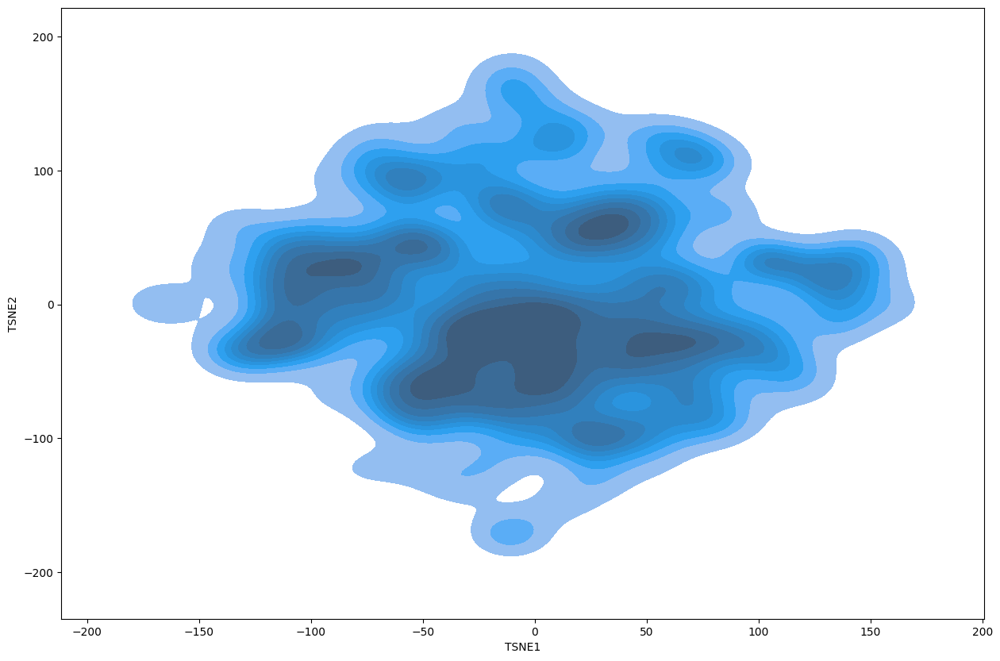

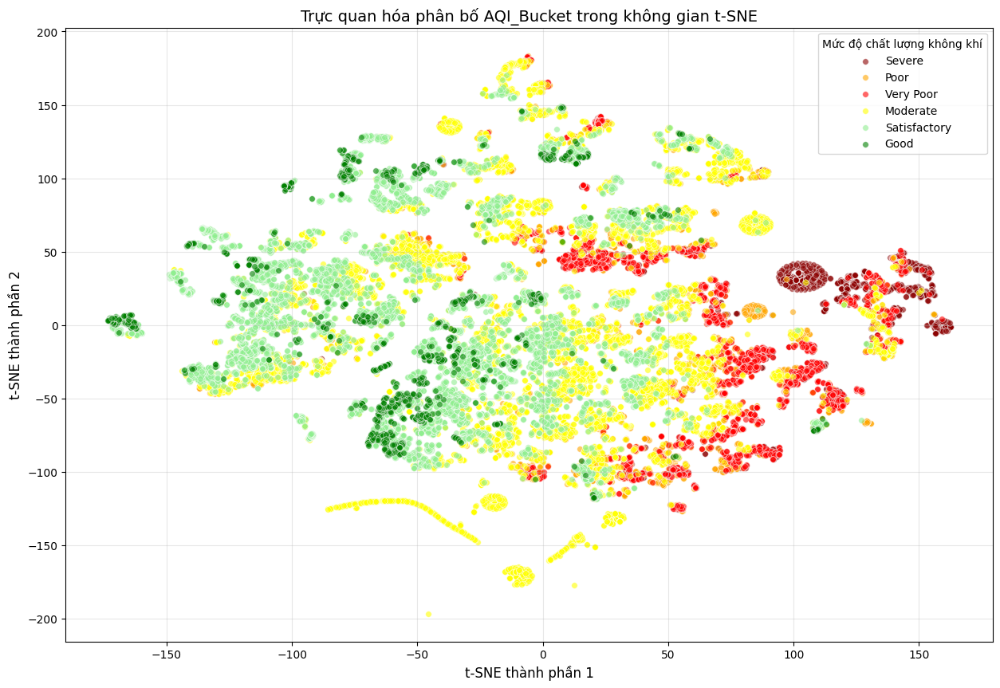

In [ ]:
# Ghi lại thời gian bắt đầu để đo hiệu suất
start_time = time.time()

# Áp dụng t-SNE với 2 thành phần
tsne = TSNE(
    n_components=2,
    perplexity=30,
    learning_rate=200,
    n_iter=3000,
    random_state=42
)

print("Đang thực hiện t-SNE với 2 thành phần...")
X_tsne_2d = tsne.fit_transform(X_scaled)  # X_scaled là dữ liệu đã chuẩn hóa
print(f"Hình dạng kết quả t-SNE: {X_tsne_2d.shape}")

# Ghi nhận thời gian kết thúc
end_time = time.time()
print(f"Thời gian thực hiện t-SNE: {end_time - start_time:.2f} giây")

# Phân tích mật độ dữ liệu trong không gian t-SNE
plt.figure(figsize=(15, 10))

# Chuyển đổi kết quả t-SNE thành DataFrame với tên cột
X_tsne_2d_df = pd.DataFrame(X_tsne_2d, columns=['TSNE1', 'TSNE2'])
# Thêm thông tin AQI_Bucket vào dataframe
X_tsne_2d_df['AQI_Bucket'] = df_normalized['AQI_Bucket'].values

# Vẽ biểu đồ mật độ 2D
sns.kdeplot(
    data=X_tsne_2d_df,
    x='TSNE1',
    y='TSNE2',
    fill=True,
)
# Tạo color mapping nếu chưa được định nghĩa
if 'color_mapping' not in locals():
    color_mapping = {
        'Good': 'green',
        'Satisfactory': 'lightgreen',
        'Moderate': 'yellow',
        'Poor': 'orange',
        'Very Poor': 'red',
        'Severe': 'darkred'
    }

# Kiểm tra độ tách biệt của các nhóm AQI trong không gian t-SNE
plt.figure(figsize=(15, 10))
for category in X_tsne_2d_df['AQI_Bucket'].unique():
    subset = X_tsne_2d_df[X_tsne_2d_df['AQI_Bucket'] == category]
    plt.scatter(
        subset['TSNE1'],
        subset['TSNE2'],
        alpha=0.6,
        s=30,
        color=color_mapping.get(category, 'blue'),
        edgecolor='w',
        linewidth=0.5,
        label=category
    )
plt.xlabel('t-SNE thành phần 1', fontsize=12)
plt.ylabel('t-SNE thành phần 2', fontsize=12)
plt.title('Trực quan hóa phân bố AQI_Bucket trong không gian t-SNE', fontsize=14)
plt.legend(title='Mức độ chất lượng không khí')
plt.grid(True, alpha=0.3)
plt.show()

## Trực quan đối với dữ liệu theo từng cặp 02 thành phần chính, áp dụng cho khoảng 4 – 6 thành phần chính

### PCA

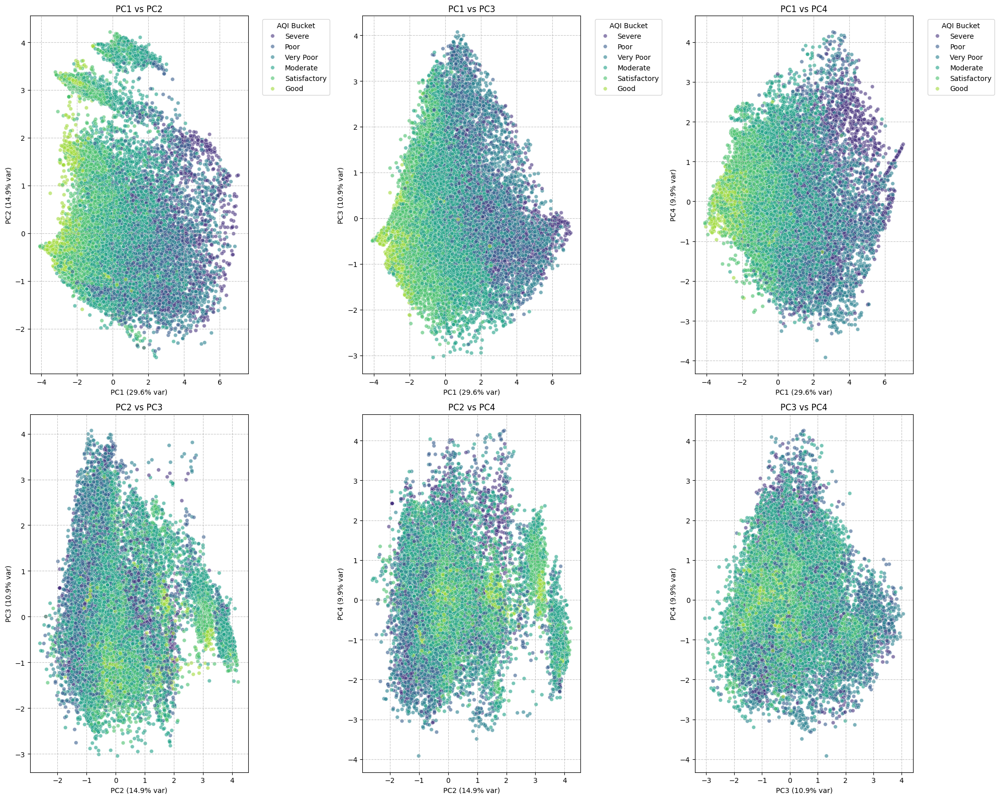

<Figure size 1800x1600 with 0 Axes>

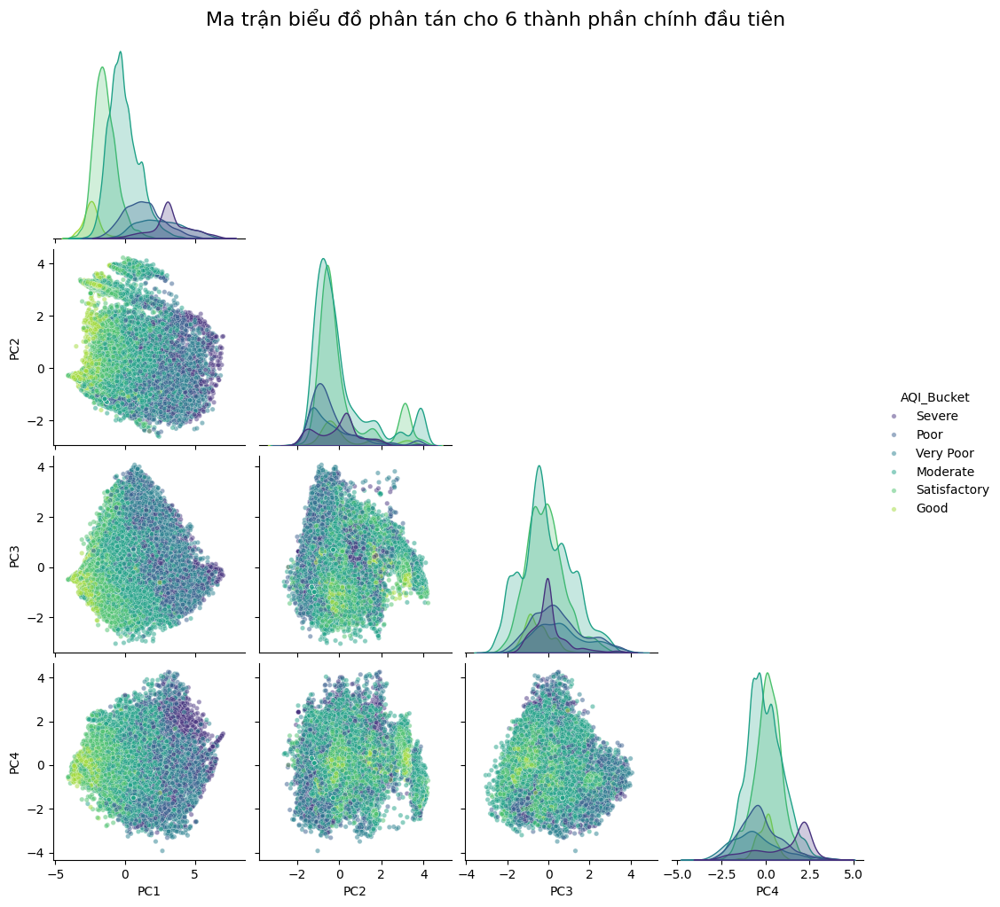

In [ ]:
# Lấy 4 thành phần chính đầu tiên
n_components = 4
pca_components = X_pca_full[:, :n_components]

# Tạo DataFrame cho dữ liệu PCA
pca_df = pd.DataFrame(
	data=pca_components,
	columns=[f'PC{i+1}' for i in range(n_components)]
)

# Thêm cột AQI_Bucket để màu sắc theo phân loại AQI
pca_df['AQI_Bucket'] = df['AQI_Bucket']

# Thiết lập figure có kích thước lớn
plt.figure(figsize=(20, 16))

# Tạo lưới để vẽ từng cặp thành phần chính
pairs = list(combinations(range(n_components), 2))
n_pairs = len(pairs)
n_rows = (n_pairs + 2) // 3  # Chia thành 3 cột

# Vẽ từng cặp thành phần chính
for i, (pc_i, pc_j) in enumerate(pairs):
	plt.subplot(n_rows, 3, i+1)

	# Vẽ biểu đồ phân tán cho từng cặp PC với màu sắc theo AQI_Bucket
	sns.scatterplot(
		x=f'PC{pc_i+1}',
		y=f'PC{pc_j+1}',
		hue='AQI_Bucket',
		data=pca_df,
		palette='viridis',
		alpha=0.6,
		s=30
	)

	plt.title(f'PC{pc_i+1} vs PC{pc_j+1}')
	plt.xlabel(f'PC{pc_i+1} ({explained_variance[pc_i]:.1%} var)')
	plt.ylabel(f'PC{pc_j+1} ({explained_variance[pc_j]:.1%} var)')

	# Thêm lưới cho dễ đọc
	plt.grid(True, linestyle='--', alpha=0.7)

	# Điều chỉnh huyền thoại
	if i < 3:  # Chỉ hiển thị huyền thoại ở hàng đầu tiên
		plt.legend(title='AQI Bucket', bbox_to_anchor=(1.05, 1), loc='upper left')
	else:
		plt.legend([],[], frameon=False)

plt.tight_layout()
plt.savefig('pca_component_pairs.png', dpi=300, bbox_inches='tight')
plt.show()

# Vẽ biểu đồ phân tán ma trận cho 4 thành phần chính đầu tiên
plt.figure(figsize=(18, 16))
sns.pairplot(
	pca_df,
	hue='AQI_Bucket',
	palette='viridis',
	diag_kind='kde',
	plot_kws={'alpha': 0.5, 's': 15},
	corner=True
)
plt.suptitle('Ma trận biểu đồ phân tán cho 6 thành phần chính đầu tiên', y=1.02, fontsize=16)
plt.savefig('pca_pairplot.png', dpi=300, bbox_inches='tight')
plt.show()


### t-SNE

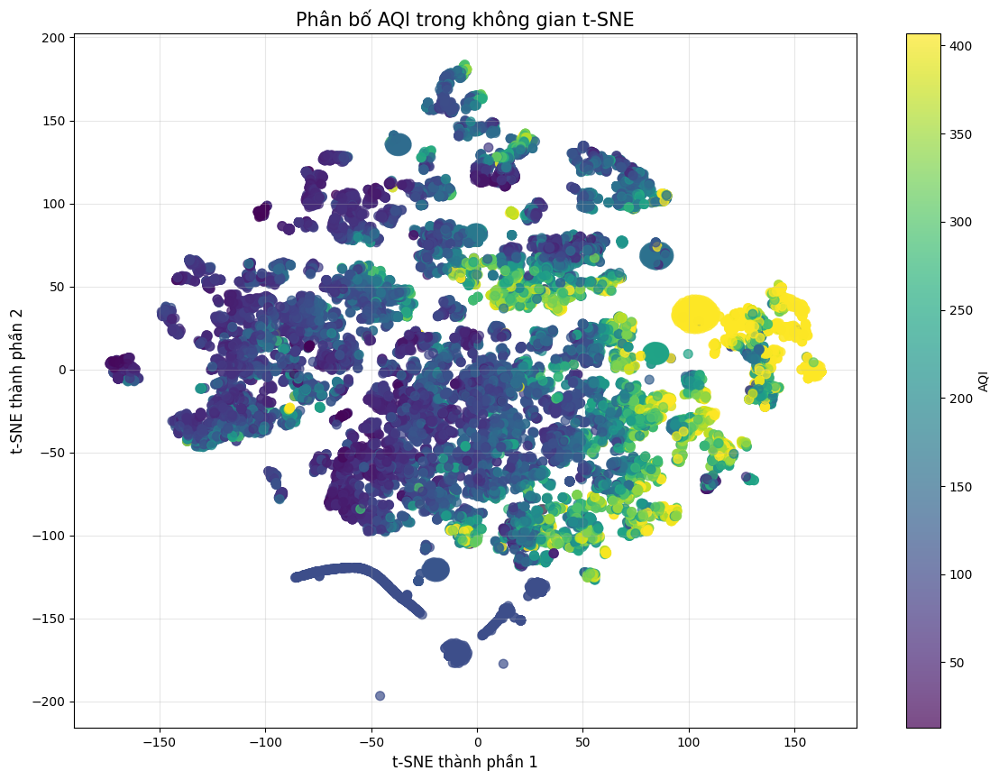

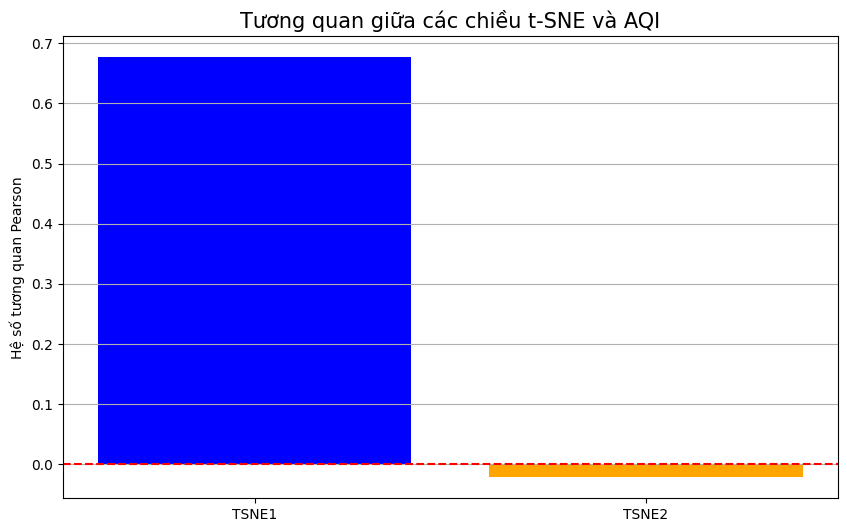

In [ ]:
# Chuyển đổi X_tsne_2d thành DataFrame để dễ sử dụng
X_tsne_2d = pd.DataFrame(X_tsne_2d, columns=['TSNE1', 'TSNE2'])
X_tsne_2d['AQI'] = df['AQI']  # Thêm cột AQI từ df gốc
X_tsne_2d['AQI_Bucket'] = df['AQI_Bucket']  # Thêm cột AQI_Bucket để phân tích thêm

# Vẽ biểu đồ scatter với màu dựa trên giá trị AQI
plt.figure(figsize=(14, 10))
scatter = plt.scatter(
    X_tsne_2d['TSNE1'],
    X_tsne_2d['TSNE2'],
    c=X_tsne_2d['AQI'],
    cmap='viridis',
    alpha=0.7,
    s=50
)

plt.colorbar(scatter, label='AQI')
plt.title('Phân bố AQI trong không gian t-SNE', fontsize=15)
plt.xlabel('t-SNE thành phần 1', fontsize=12)
plt.ylabel('t-SNE thành phần 2', fontsize=12)
plt.grid(True, alpha=0.3)
plt.show()

# Phân tích tương quan giữa các chiều t-SNE và chỉ số AQI
correlations = [
    np.corrcoef(X_tsne_2d['TSNE1'], X_tsne_2d['AQI'])[0, 1],
    np.corrcoef(X_tsne_2d['TSNE2'], X_tsne_2d['AQI'])[0, 1]
]

# Vẽ biểu đồ tương quan
plt.figure(figsize=(10, 6))
plt.bar(['TSNE1', 'TSNE2'], correlations, color=['blue', 'orange'])
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Tương quan giữa các chiều t-SNE và AQI', fontsize=15)
plt.ylabel('Hệ số tương quan Pearson')
plt.grid(True, axis='y')
plt.show()

## Xác định lượng thông tin được bảo tồn theo phương sai giải thích (explained variances)

### PCA

Bảng phương sai giải thích cho từng thành phần chính:


,Thành phần chính,Phương sai giải thích,Phương sai tích lũy
0,PC1,0.296497,0.296497
1,PC2,0.149409,0.445906
2,PC3,0.108784,0.554689
3,PC4,0.098779,0.653468
4,PC5,0.086563,0.740031
5,PC6,0.061318,0.801349
6,PC7,0.051724,0.853073
7,PC8,0.041904,0.894977
8,PC9,0.033683,0.928660
9,PC10,0.026640,0.955301


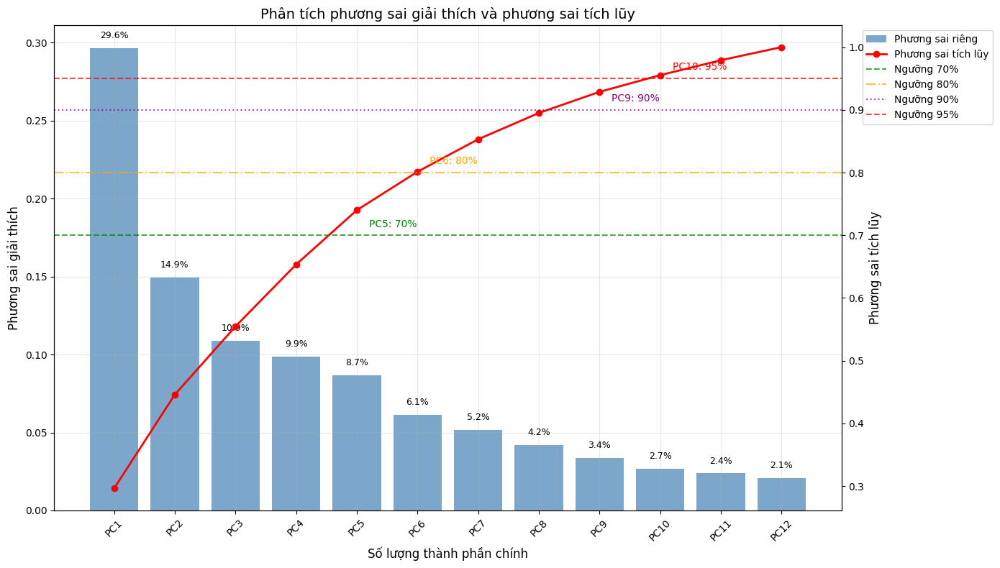

In [ ]:
# Phân tích lượng thông tin được bảo tồn theo phương sai giải thích (explained variances)

# Tạo DataFrame để hiển thị phương sai giải thích chi tiết
explained_variance_df = pd.DataFrame({
	'Thành phần chính': [f'PC{i+1}' for i in range(len(explained_variance))],
	'Phương sai giải thích': explained_variance,
	'Phương sai tích lũy': cumulative_variance
})

# Hiển thị bảng phương sai giải thích
print("Bảng phương sai giải thích cho từng thành phần chính:")
display(explained_variance_df)

# Vẽ biểu đồ phương sai giải thích chi tiết
plt.figure(figsize=(14, 8))

# Vẽ biểu đồ cột cho phương sai riêng lẻ
ax1 = plt.subplot(111)
bars = ax1.bar(range(1, len(explained_variance)+1), explained_variance,
	   alpha=0.7, color='steelblue', label='Phương sai riêng')

# Thêm giá trị phần trăm lên mỗi cột
for i, bar in enumerate(bars):
	height = bar.get_height()
	ax1.text(bar.get_x() + bar.get_width()/2., height + 0.005,
			f'{explained_variance[i]:.1%}',
			ha='center', va='bottom', rotation=0, fontsize=9)

# Vẽ đường phương sai tích lũy
ax2 = ax1.twinx()
ax2.plot(range(1, len(cumulative_variance)+1), cumulative_variance,
		'r-', marker='o', markersize=6, linewidth=2, label='Phương sai tích lũy')

# Thêm các đường ngưỡng quan trọng
thresholds = [0.7, 0.8, 0.9, 0.95]
colors = ['green', 'orange', 'purple', 'red']
styles = ['--', '-.', ':', '--']
for i, threshold in enumerate(thresholds):
	ax2.axhline(y=threshold, color=colors[i], linestyle=styles[i],
				alpha=0.7, label=f'Ngưỡng {threshold:.0%}')

	# Tìm số PC cần thiết để đạt ngưỡng
	n_components = np.argmax(cumulative_variance >= threshold) + 1
	ax2.text(n_components + 0.2, threshold + 0.01,
			f'PC{n_components}: {threshold:.0%}',
			ha='left', va='bottom', color=colors[i], fontsize=10)

# Thêm các chú thích cho biểu đồ
ax1.set_xlabel('Số lượng thành phần chính', fontsize=12)
ax1.set_ylabel('Phương sai giải thích', fontsize=12)
ax2.set_ylabel('Phương sai tích lũy', fontsize=12)
ax1.set_title('Phân tích phương sai giải thích và phương sai tích lũy', fontsize=14)
ax1.set_xticks(range(1, len(explained_variance)+1))
ax1.set_xticklabels([f'PC{i+1}' for i in range(len(explained_variance))], rotation=45)
ax1.grid(True, alpha=0.3)

# Kết hợp các chú thích từ cả hai trục
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(handles1 + handles2, labels1 + labels2, loc='upper left', bbox_to_anchor=(1.02, 1),
		   fontsize=10, frameon=True)

plt.tight_layout()
plt.savefig('pca_explained_variance_detailed.png', dpi=300, bbox_inches='tight')
plt.show()

# Phân tích chi tiết về lượng thông tin được bảo tồn
# Tạo bảng so sánh số lượng thành phần chính cần thiết ở các ngưỡng khác nhau
thresholds = [0.5, 0.6, 0.7, 0.8, 0.9, 0.95, 0.99]
components_needed = [np.argmax(cumulative_variance >= t) + 1 for t in thresholds]

preservation_df = pd.DataFrame({
	'Ngưỡng phương sai': [f'{t:.0%}' for t in thresholds],
	'Số lượng thành phần chính cần thiết': components_needed,
	'Tỉ lệ giảm chiều (%)': [f'{(1 - c/len(explained_variance))*100:.1f}%' for c in components_needed]
})

## Thực hiện việc trực quan hóa mối quan hệ của một số chiều dữ liệu chính với đầu ra để xem xét khả năng có tương quan tuyến tính.

### PCA

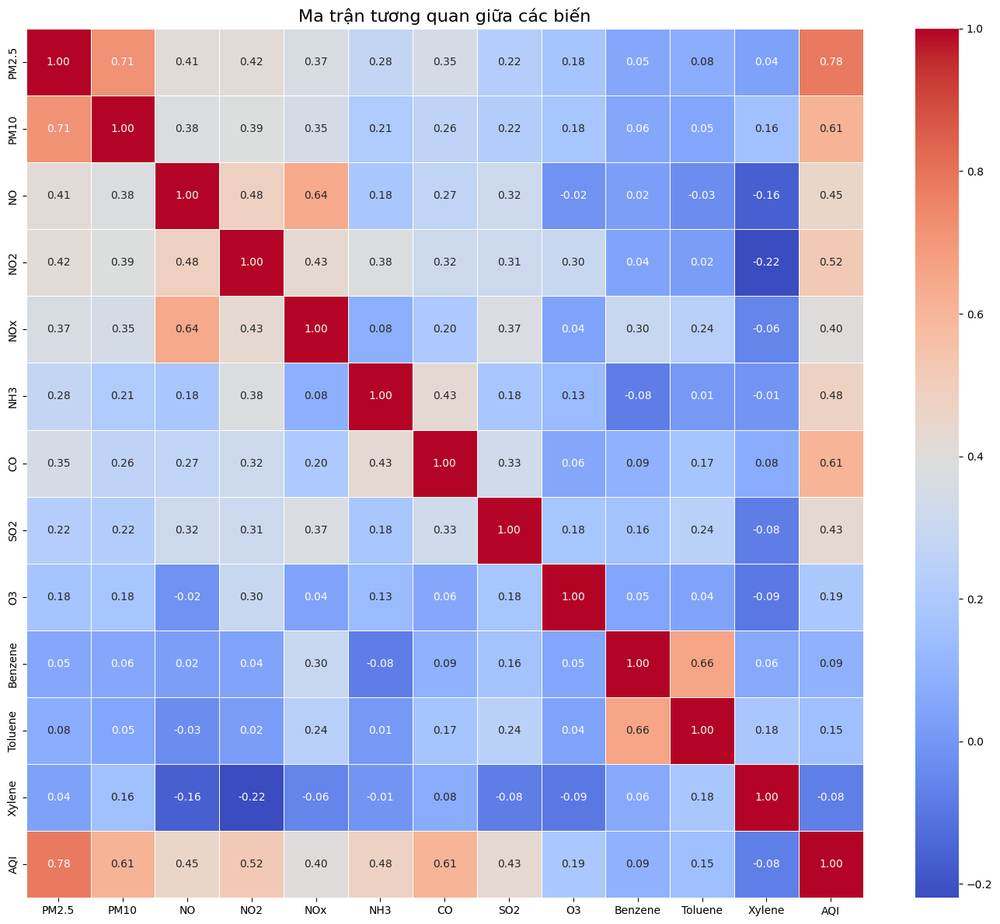

Các biến có tương quan cao nhất với AQI:


,AQI
AQI,1.000000
PM2.5,0.782712
PM10,0.611502
CO,0.605764
NO2,0.522026
NH3,0.475644
NO,0.453728
SO2,0.432119
NOx,0.404083
O3,0.191933


In [ ]:
# 1. Phân tích tương quan giữa các biến và AQI
plt.figure(figsize=(14, 12))
# Tính ma trận tương quan
corr_matrix = df[numeric_cols].corr()
# Vẽ heatmap tương quan
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Ma trận tương quan giữa các biến', fontsize=16)
plt.tight_layout()
plt.savefig('correlation_matrix.png', dpi=300, bbox_inches='tight')
plt.show()

# 2. Tìm các biến có tương quan cao nhất với AQI
corr_with_aqi = corr_matrix['AQI'].abs().sort_values(ascending=False)
print("Các biến có tương quan cao nhất với AQI:")
display(corr_with_aqi)


### t-SNE

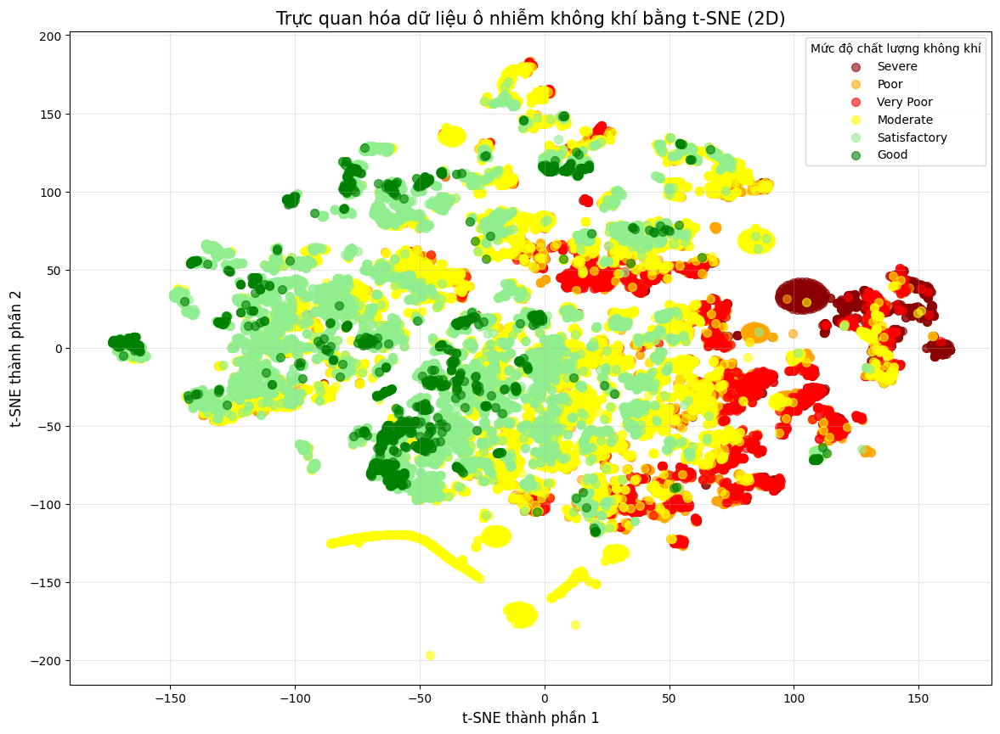

In [ ]:
# Tạo color palette cho các mức AQI_Bucket
color_mapping = {
    'Good': 'green',
    'Satisfactory': 'lightgreen',
    'Moderate': 'yellow',
    'Poor': 'orange',
    'Very Poor': 'red',
    'Severe': 'darkred'
}

# Vẽ biểu đồ phân tán 2D của kết quả t-SNE với màu sắc theo AQI_Bucket
plt.figure(figsize=(14, 10))
for category in X_tsne_2d_df['AQI_Bucket'].unique():
    subset = X_tsne_2d_df[X_tsne_2d_df['AQI_Bucket'] == category]
    plt.scatter(
        subset['TSNE1'],
        subset['TSNE2'],
        alpha=0.6,
        s=50,  # Kích thước điểm
        color=color_mapping.get(category, 'blue'),
        label=category
    )

plt.title('Trực quan hóa dữ liệu ô nhiễm không khí bằng t-SNE (2D)', fontsize=15)
plt.xlabel('t-SNE thành phần 1', fontsize=12)
plt.ylabel('t-SNE thành phần 2', fontsize=12)
plt.legend(title='Mức độ chất lượng không khí', fontsize=10)
plt.grid(True, alpha=0.3)
plt.show()

## So sánh PCA và t-SNE

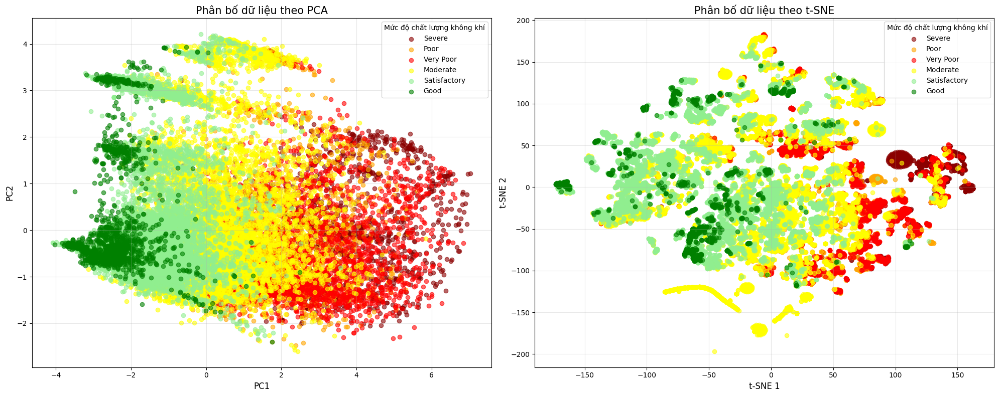

In [ ]:
# So sánh trực quan cách biểu diễn dữ liệu của PCA và t-SNE trên cùng một tập dữ liệu
# Lấy 2 thành phần đầu tiên của PCA để so sánh với t-SNE 2D
X_pca_2d = X_pca_full[:, :2]  # 2 thành phần đầu tiên của PCA

# Tạo DataFrame để so sánh
pca_2d_df = pd.DataFrame({
    'PC1': X_pca_2d[:, 0],
    'PC2': X_pca_2d[:, 1],
    'AQI_Bucket': df['AQI_Bucket'].values
})

# Vẽ biểu đồ so sánh
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# Biểu đồ PCA
for category in pca_2d_df['AQI_Bucket'].unique():
    subset = pca_2d_df[pca_2d_df['AQI_Bucket'] == category]
    ax1.scatter(
        subset['PC1'],
        subset['PC2'],
        alpha=0.6,
        color=color_mapping.get(category, 'blue'),
        label=category
    )
ax1.set_title('Phân bố dữ liệu theo PCA', fontsize=15)
ax1.set_xlabel('PC1', fontsize=12)
ax1.set_ylabel('PC2', fontsize=12)
ax1.legend(title='Mức độ chất lượng không khí')
ax1.grid(True, alpha=0.3)

# Biểu đồ t-SNE
for category in X_tsne_2d_df['AQI_Bucket'].unique():
    subset = X_tsne_2d_df[X_tsne_2d_df['AQI_Bucket'] == category]
    ax2.scatter(
        subset['TSNE1'],
        subset['TSNE2'],
        alpha=0.6,
        color=color_mapping.get(category, 'blue'),
        label=category
    )
ax2.set_title('Phân bố dữ liệu theo t-SNE', fontsize=15)
ax2.set_xlabel('t-SNE 1', fontsize=12)
ax2.set_ylabel('t-SNE 2', fontsize=12)
ax2.legend(title='Mức độ chất lượng không khí')
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Phân cụm (K-means, GMM)

## K-means

### Thực hiện phân cụm dữ liệu sau khi bỏ qua trường đầu ra, với số cụm được chọn phù hợp (Gốc, PCA, t-SNE)

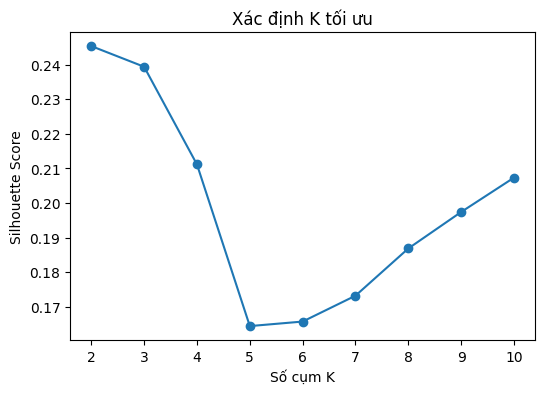

K tối ưu trên dữ liệu gốc: 2


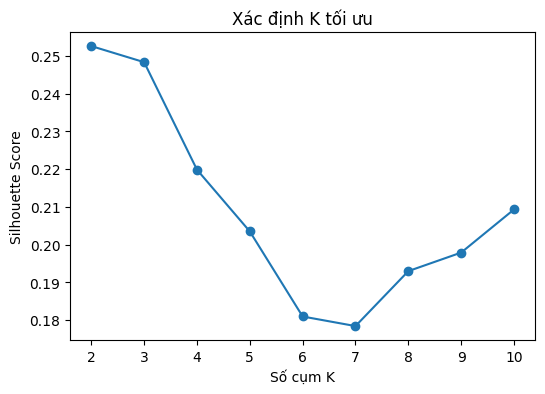

K tối ưu trên dữ liệu PCA: 2


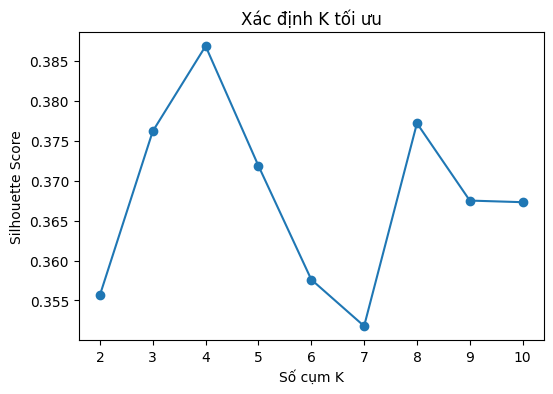

K tối ưu trên dữ liệu t-SNE: 4

Tổng quan về kết quả phân cụm K-means:
Số cụm trên dữ liệu gốc: 2
Số cụm trên dữ liệu PCA: 2
Số cụm trên dữ liệu t-SNE: 4

Silhouette score - dữ liệu gốc: 0.2454
Silhouette score - PCA: 0.2526
Silhouette score - t-SNE: 0.3868


In [ ]:
# Loại bỏ trường đầu ra (output/label column)
# AQI là biến mục tiêu trong dữ liệu của chúng ta
X_features = X_features.copy()  # Sử dụng lại biến đã được tạo ở các cell trước (đã loại bỏ AQI)

# Hàm xác định K tốt nhất dựa trên silhouette

def find_best_k(data, k_min=2, k_max=10):
    scores = []
    for k in range(k_min, k_max + 1):
        km = KMeans(n_clusters=k, random_state=42)
        labels = km.fit_predict(data)
        score = silhouette_score(data, labels)
        scores.append((k, score))
    # Vẽ silhouette theo K
    ks, ss = zip(*scores)
    plt.figure(figsize=(6,4))
    plt.plot(ks, ss, marker='o')
    plt.xlabel('Số cụm K')
    plt.ylabel('Silhouette Score')
    plt.title('Xác định K tối ưu')
    plt.show()
    # Trả về K cho score cao nhất
    best_k = max(scores, key=lambda x: x[1])[0]
    return best_k, scores

# Tìm K tối ưu cho mỗi trường hợp
# Sử dụng dữ liệu đã được chuẩn hóa từ các cell trước
best_k_orig, scores_orig = find_best_k(X_scaled)
print(f"K tối ưu trên dữ liệu gốc: {best_k_orig}")

# Sử dụng 10 thành phần chính đầu tiên để giảm thời gian tính toán
best_k_pca, scores_pca = find_best_k(X_pca_full[:, :10])
print(f"K tối ưu trên dữ liệu PCA: {best_k_pca}")

best_k_tsne, scores_tsne = find_best_k(X_tsne_2d_df[['TSNE1', 'TSNE2']])
print(f"K tối ưu trên dữ liệu t-SNE: {best_k_tsne}")

# Áp dụng KMeans với K đã chọn
km_orig = KMeans(n_clusters=best_k_orig, random_state=42).fit(X_scaled)
km_pca = KMeans(n_clusters=best_k_pca, random_state=42).fit(X_pca_full[:, :10])
km_tsne = KMeans(n_clusters=best_k_tsne, random_state=42).fit(X_tsne_2d_df[['TSNE1', 'TSNE2']])

# Gán nhãn cụm vào DataFrame
# Tạo một bản sao của df để không ảnh hưởng đến kết quả trước đó
df_kmeans = df.copy()
df_kmeans['kmeans_orig'] = km_orig.labels_
df_kmeans['kmeans_pca'] = km_pca.labels_
df_kmeans['kmeans_tsne'] = km_tsne.labels_

# In thống kê về kết quả phân cụm
print("\nTổng quan về kết quả phân cụm K-means:")
print(f"Số cụm trên dữ liệu gốc: {best_k_orig}")
print(f"Số cụm trên dữ liệu PCA: {best_k_pca}")
print(f"Số cụm trên dữ liệu t-SNE: {best_k_tsne}")

# Tính silhouette score cho mỗi phương pháp
silhouette_orig = silhouette_score(X_scaled, km_orig.labels_)
silhouette_pca = silhouette_score(X_pca_full[:, :10], km_pca.labels_)
silhouette_tsne = silhouette_score(X_tsne_2d_df[['TSNE1', 'TSNE2']], km_tsne.labels_)

print(f"\nSilhouette score - dữ liệu gốc: {silhouette_orig:.4f}")
print(f"Silhouette score - PCA: {silhouette_pca:.4f}")
print(f"Silhouette score - t-SNE: {silhouette_tsne:.4f}")
df['cluster_pca'] = km_pca.labels_
df['cluster_tsne'] = km_tsne.labels_

### Nhận xét về mối quan hệ giữa các mẫu dữ liệu đầu vào trong các cụm; đánh giá quan hệ giữa các đầu ra tương ứng trong các cụm.

Đánh giá chất lượng phân cụm:

Phương pháp ORIG:
Davies-Bouldin Index: 1.8565
Calinski-Harabasz Index: 7511.3845

Phương pháp PCA:
Davies-Bouldin Index: 1.8004
Calinski-Harabasz Index: 7949.7083

Phương pháp TSNE:
Davies-Bouldin Index: 0.8239
Calinski-Harabasz Index: 26069.2734


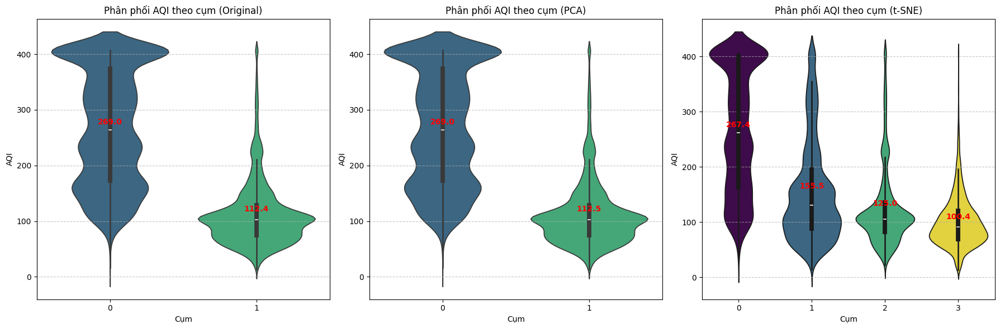

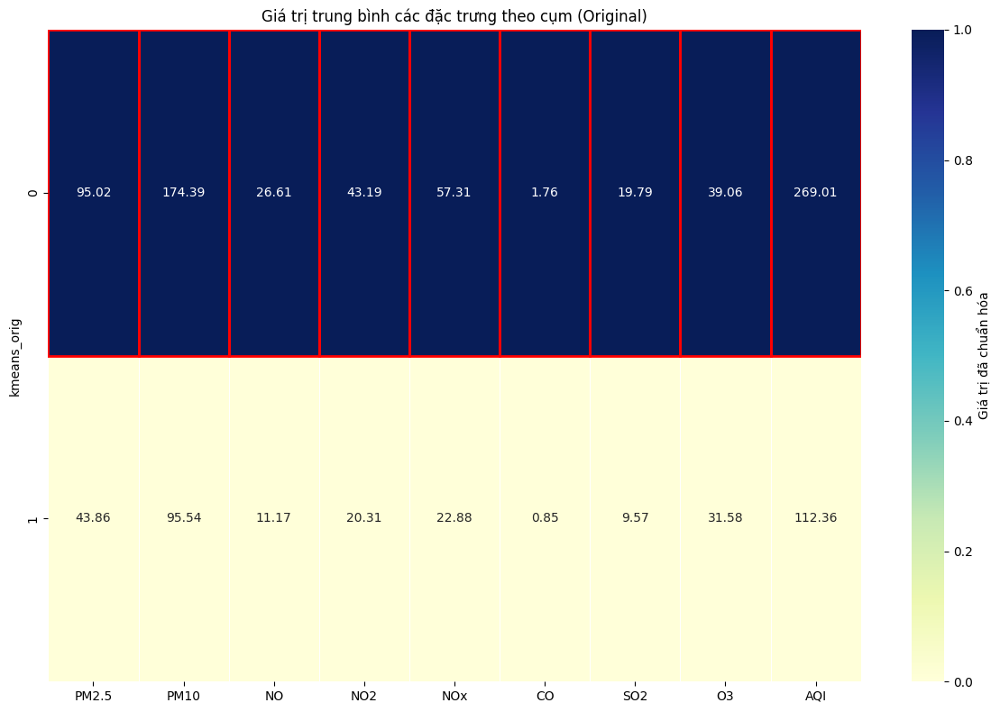

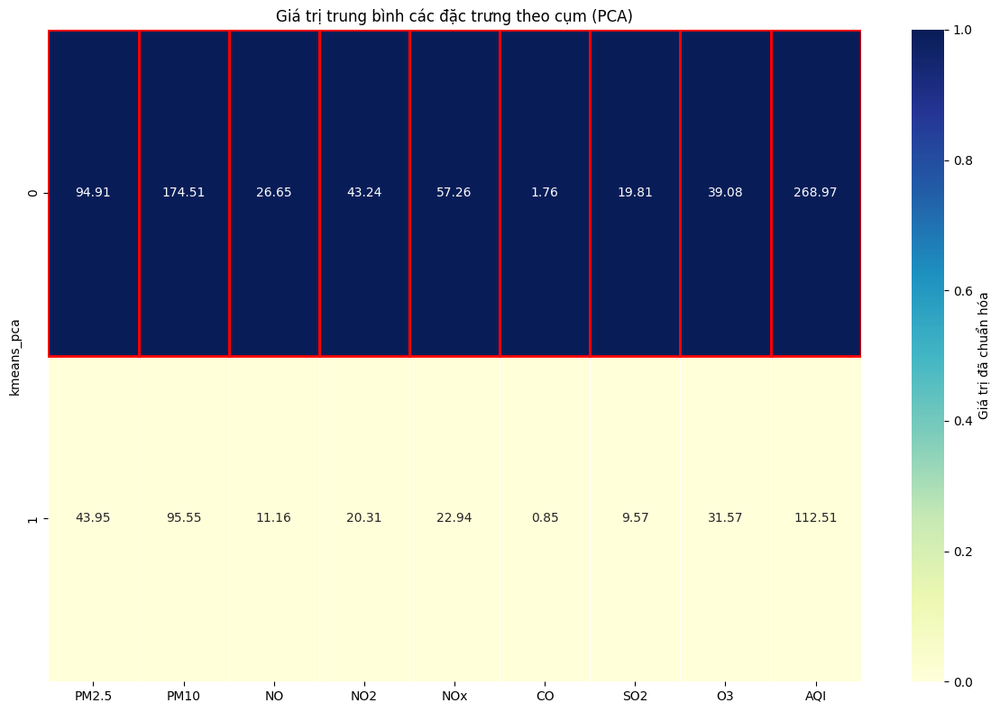

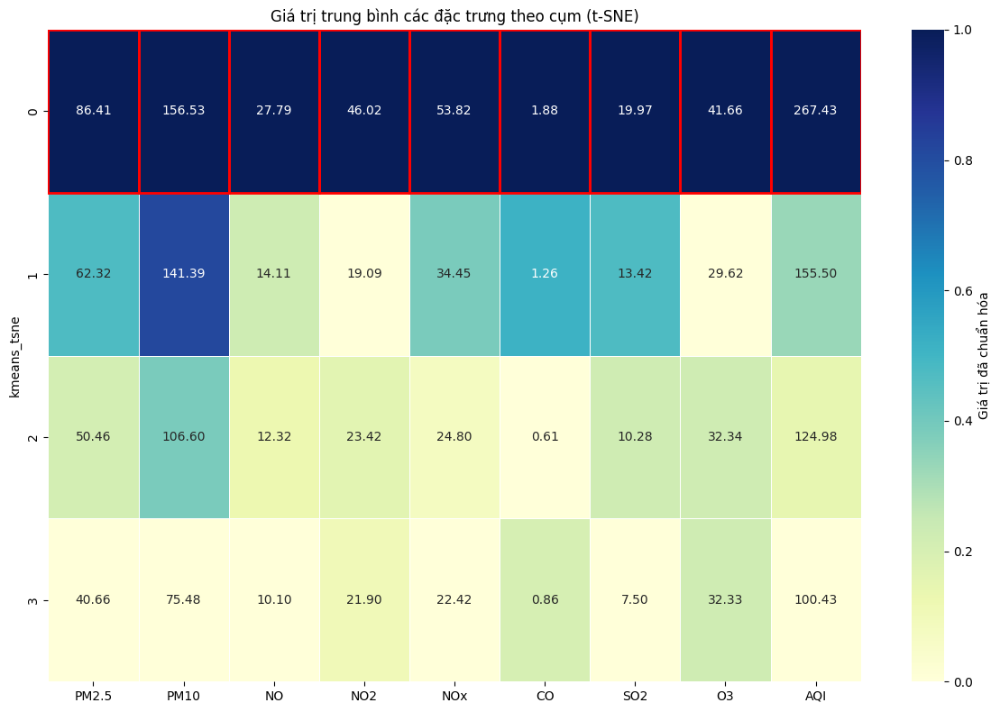

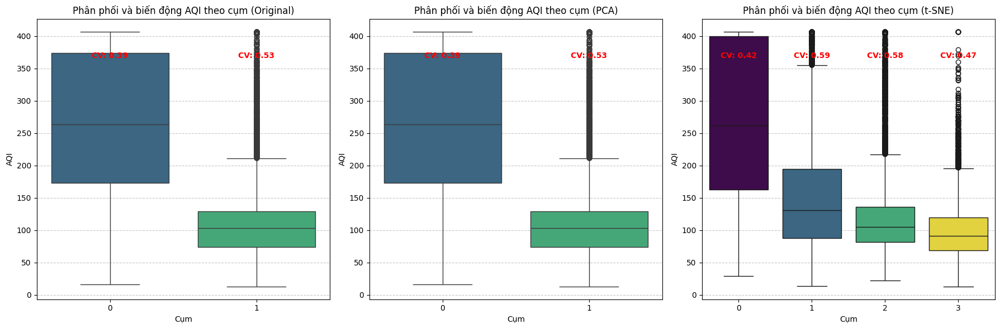

In [ ]:
# 1. Tạo DataFrame với thông tin cụm
features_for_analysis = ['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'CO', 'SO2', 'O3', 'AQI']
cluster_cols = ['kmeans_orig', 'kmeans_pca', 'kmeans_tsne']

# Tính toán metric cụm (tách riêng cho từng phương pháp)
print("Đánh giá chất lượng phân cụm:")
for method in ['orig', 'pca', 'tsne']:
    cluster_column = f'kmeans_{method}'
    X_data = X_scaled if method == 'orig' else (X_pca_full[:, :10] if method == 'pca' else X_tsne_2d_df[['TSNE1', 'TSNE2']])
    labels = df_kmeans[cluster_column]

    # Davies-Bouldin Index (càng thấp càng tốt)
    db_score = davies_bouldin_score(X_data, labels)

    # Calinski-Harabasz Index (càng cao càng tốt)
    ch_score = calinski_harabasz_score(X_data, labels)

    print(f"\nPhương pháp {method.upper()}:")
    print(f"Davies-Bouldin Index: {db_score:.4f}")
    print(f"Calinski-Harabasz Index: {ch_score:.4f}")

# 2. Trực quan hóa phân phối đầu ra (AQI) trong từng cụm
plt.figure(figsize=(18, 6))

for i, method in enumerate(['orig', 'pca', 'tsne']):
    plt.subplot(1, 3, i+1)
    cluster_column = f'kmeans_{method}'
    method_name = 'Original' if method == 'orig' else ('PCA' if method == 'pca' else 't-SNE')

    sns.violinplot(
        x=cluster_column,
        y='AQI',
        data=df_kmeans,
        hue=cluster_column,
        palette='viridis',
        legend=False
    )

    means = df_kmeans.groupby(cluster_column)['AQI'].mean()
    for j, mean_val in enumerate(means):
        plt.text(j, mean_val + 5, f'{mean_val:.1f}', ha='center', color='red', fontweight='bold')

    plt.title(f'Phân phối AQI theo cụm ({method_name})')
    plt.xlabel('Cụm')
    plt.ylabel('AQI')
    plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.savefig('aqi_distribution_by_cluster.png')
plt.show()

# 3. Heatmap giá trị trung bình các đặc trưng trong từng cụm
for method in ['orig', 'pca', 'tsne']:
    cluster_column = f'kmeans_{method}'
    method_name = 'Original' if method == 'orig' else ('PCA' if method == 'pca' else 't-SNE')

    # Tính giá trị trung bình của các đặc trưng trong từng cụm
    cluster_means = df_kmeans.groupby(cluster_column)[features_for_analysis].mean()

    # Chuẩn hóa dữ liệu để dễ so sánh
    cluster_means_norm = (cluster_means - cluster_means.min()) / (cluster_means.max() - cluster_means.min())

    plt.figure(figsize=(12, 8))
    ax = sns.heatmap(cluster_means_norm, annot=cluster_means.round(2), fmt='.2f', cmap='YlGnBu',
                    linewidths=.5, cbar_kws={'label': 'Giá trị đã chuẩn hóa'})

    # Thêm đánh dấu giá trị cao nhất trong mỗi cột
    for j in range(cluster_means.shape[1]):
        max_idx = cluster_means.iloc[:, j].idxmax()
        ax.add_patch(plt.Rectangle((j, max_idx), 1, 1, fill=False, edgecolor='red', lw=2))

    plt.title(f'Giá trị trung bình các đặc trưng theo cụm ({method_name})')
    plt.tight_layout()
    plt.savefig(f'cluster_features_heatmap_{method}.png')
    plt.show()

# 4. Phân tích biến động AQI trong các cụm (box plot)
plt.figure(figsize=(18, 6))

for i, method in enumerate(['orig', 'pca', 'tsne']):
    plt.subplot(1, 3, i+1)
    cluster_column = f'kmeans_{method}'
    method_name = 'Original' if method == 'orig' else ('PCA' if method == 'pca' else 't-SNE')

    stats = df_kmeans.groupby(cluster_column)['AQI'].agg(['mean', 'std']).reset_index()
    stats['CV'] = stats['std'] / stats['mean']

    sns.boxplot(
        x=cluster_column,
        y='AQI',
        data=df_kmeans,
        hue=cluster_column,
        palette='viridis',
        legend=False
    )

    for j, (_, row) in enumerate(stats.iterrows()):
        plt.text(j, df_kmeans['AQI'].max() * 0.9, f'CV: {row["CV"]:.2f}',
                 ha='center', color='red', fontweight='bold')

    plt.title(f'Phân phối và biến động AQI theo cụm ({method_name})')
    plt.xlabel('Cụm')
    plt.ylabel('AQI')
    plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.savefig('aqi_variability_by_cluster.png')
plt.show()

### Thực hiện trực quan hóa dữ liệu và đánh dấu phân biệt các mẫu dữ liệu thuộc mỗi cụm thông qua màu sắc.

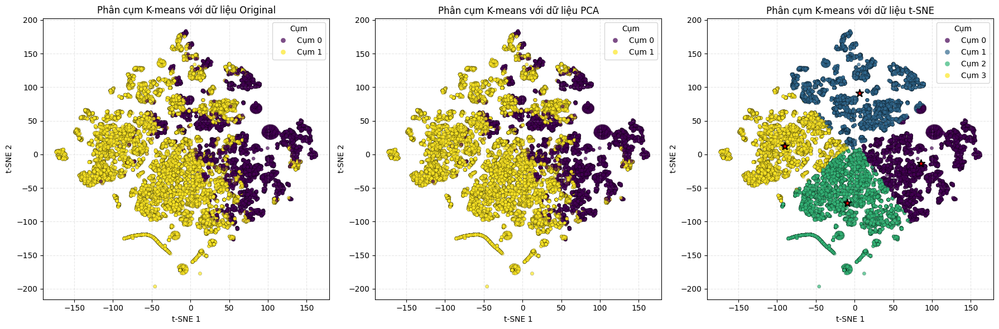

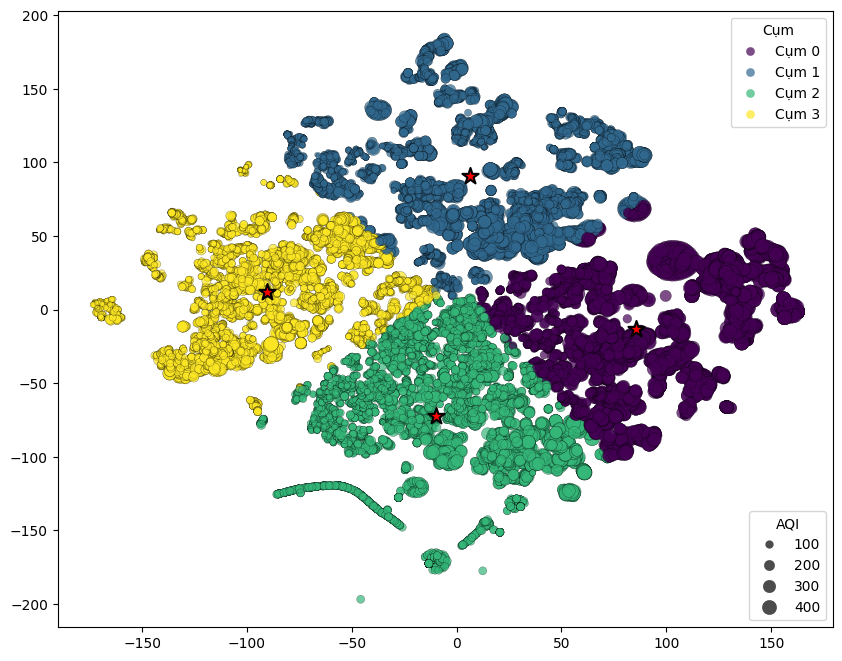

In [ ]:
# 1. Trực quan hóa trên không gian t-SNE 2D (tốt nhất cho biểu diễn trực quan)
plt.figure(figsize=(18, 6))

# Tạo một colormap với nhiều màu hơn nếu cần
colors = plt.cm.viridis(np.linspace(0, 1, max(len(df_kmeans['kmeans_orig'].unique()),
                                              len(df_kmeans['kmeans_pca'].unique()),
                                              len(df_kmeans['kmeans_tsne'].unique()))))
custom_cmap = ListedColormap(colors)

# Vẽ biểu đồ cho 3 phương pháp
for i, method in enumerate(['orig', 'pca', 'tsne']):
    ax = plt.subplot(1, 3, i+1)
    cluster_column = f'kmeans_{method}'
    method_name = 'Original' if method == 'orig' else ('PCA' if method == 'pca' else 't-SNE')

    # Scatter plot với màu theo cụm
    scatter = ax.scatter(X_tsne_2d_df['TSNE1'], X_tsne_2d_df['TSNE2'], # Corrected here
                         c=df_kmeans[cluster_column],
                         cmap=custom_cmap,
                         s=20, alpha=0.7, edgecolor='k', linewidth=0.2)

    # Thêm tâm cụm
    if method == 'orig':
        centers = km_orig.cluster_centers_
        # Chuyển tâm cụm sang không gian t-SNE (cần thêm bước biến đổi)
        # Đây là gần đúng vì chúng ta không thể ánh xạ trực tiếp tâm cụm sang t-SNE
    elif method == 'pca':
        centers = km_pca.cluster_centers_
        # Tương tự, chuyển tâm từ không gian PCA sang t-SNE là không trực tiếp
    else:  # t-SNE
        centers = km_tsne.cluster_centers_
        # Tâm cụm đã ở trong không gian t-SNE
        for j, center in enumerate(centers):
            ax.scatter(center[0], center[1], s=100, marker='*',
                      color='red', edgecolor='black', linewidth=1.5,
                      label=f'Tâm cụm {j}' if j == 0 else "")

    # Thêm legend
    handles, labels = scatter.legend_elements(prop="colors")
    legend = ax.legend(handles, [f'Cụm {i}' for i in range(len(handles))],
                   loc="upper right", title="Cụm")

    ax.set_title(f'Phân cụm K-means với dữ liệu {method_name}')
    ax.set_xlabel('t-SNE 1')
    ax.set_ylabel('t-SNE 2')
    ax.grid(True, alpha=0.3, linestyle='--')

plt.tight_layout()
plt.savefig('kmeans_clustering_comparison.png', dpi=300)
plt.show()

# 2. Trực quan hóa kết quả phân cụm t-SNE với kích thước điểm phản ánh giá trị AQI
plt.figure(figsize=(10, 8))
method = 'tsne'  # Sử dụng phương pháp t-SNE để minh họa
cluster_column = f'kmeans_{method}'

# Chuẩn hóa giá trị AQI để sử dụng làm kích thước điểm
point_sizes = 10 + (df_kmeans['AQI'] - df_kmeans['AQI'].min()) / (df_kmeans['AQI'].max() - df_kmeans['AQI'].min()) * 100

scatter = plt.scatter(X_tsne_2d_df['TSNE1'], X_tsne_2d_df['TSNE2'],
                     c=df_kmeans[cluster_column], cmap=custom_cmap,
                     s=point_sizes, alpha=0.7, edgecolor='k', linewidth=0.2)

# Vẽ tâm cụm
for j, center in enumerate(km_tsne.cluster_centers_):
    plt.scatter(center[0], center[1], s=150, marker='*',
              color='red', edgecolor='black', linewidth=1.5,
              label=f'Tâm cụm {j}' if j == 0 else "")

# Thêm legend cho cụm
handles, labels = scatter.legend_elements(prop="colors")
legend1 = plt.legend(handles, [f'Cụm {i}' for i in range(len(handles))],
               loc="upper right", title="Cụm")
plt.gca().add_artist(legend1)

# Thêm legend cho kích thước
kw = dict(prop="sizes", num=4, fmt="{x:.0f}", func=lambda s: (s-10)/100*(df_kmeans['AQI'].max()-df_kmeans['AQI'].min())+df_kmeans['AQI'].min())
legend2 = plt.legend(*scatter.legend_elements(**kw), loc="lower right", title="AQI")

## GMM

#### Thực hiện phân cụm dữ liệu sau khi bỏ qua trường đầu ra, với số cụm được chọn phù hợp. (Gốc, PCA, t-SNE)

In [ ]:
def find_best_gmm_with_bic(data):

  lowest_bic = np.inf
  bic = []
  n_components_range = range(1, 7)
  # n_components_range = range(1, 20)
  cv_types = ['spherical', 'tied', 'diag', 'full']
  # cv_types = ['full', 'tied']
  for cv_type in cv_types:
    for n_components in n_components_range:
    # Fit Gaussian mixture theo phương pháp huấn luyện EM
      gmm = GaussianMixture(n_components=n_components,
      covariance_type=cv_type,random_state=42)
      gmm.fit(data)
      bic.append(gmm.bic(data))
      # Gán model có BIC scores thấp nhất là model tốt nhất
      if bic[-1] < lowest_bic:
        lowest_bic = bic[-1]
        best_gmm = gmm
  bic = np.array(bic)
  #color_iter = itertools.cycle(['navy', 'turquoise'])
  color_iter = itertools.cycle(['navy', 'turquoise', 'cornflowerblue', 'darkorange'])
  clf = best_gmm
  bars = []
  # Vẽ biểu đồ BIC scores
  plt.figure(figsize=(12, 8))
  for i, (cv_type, color) in enumerate(zip(cv_types, color_iter)):
    xpos = np.array(n_components_range) + .2 * (i - 2)
    bars.append(plt.bar(xpos, bic[i * len(n_components_range):
        (i + 1) * len(n_components_range)],
        width=.2, color=color))
  plt.xticks(n_components_range)
  plt.ylim([bic.min() * 1.01 - .01 * bic.max(), bic.max()])
  plt.title('BIC score per model')
  xpos = np.mod(bic.argmin(), len(n_components_range)) + .65 +\
    .2 * np.floor(bic.argmin() / len(n_components_range))
  plt.text(xpos, bic.min() * 0.97 + .03 * bic.max(), '*', fontsize=14)
  plt.xlabel('Number of components')
  plt.legend([b[0] for b in bars], cv_types)

  plt.show()

    # Trả về mô hình tốt nhất và số cụm tối ưu
  best_n_components = best_gmm.n_components
  return best_gmm, best_n_components

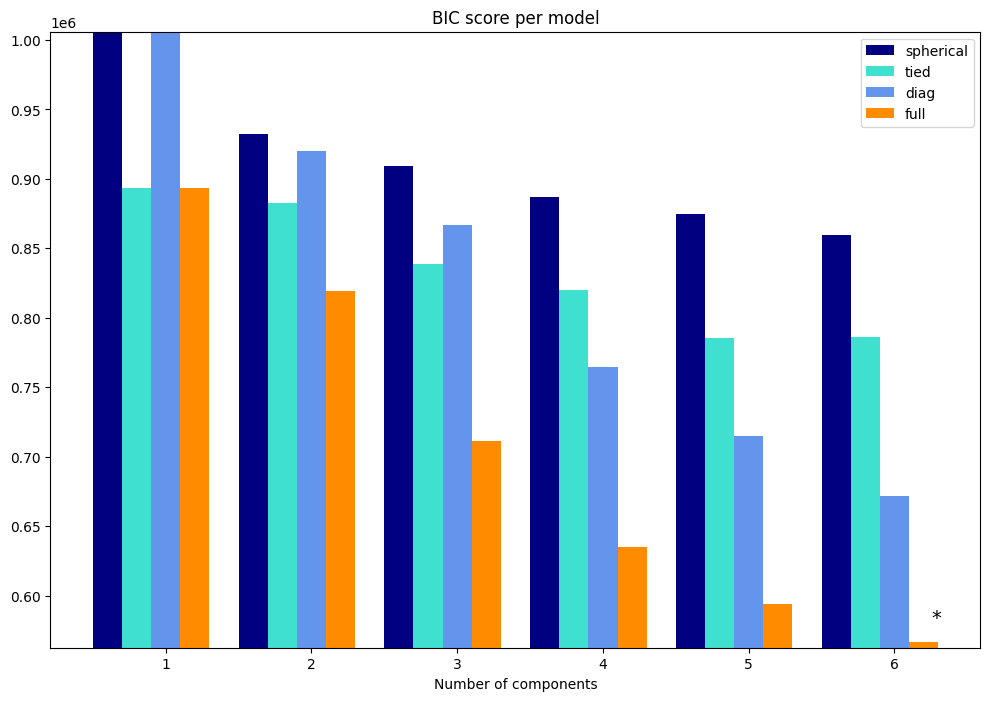

K tối ưu trên dữ liệu gốc: 6


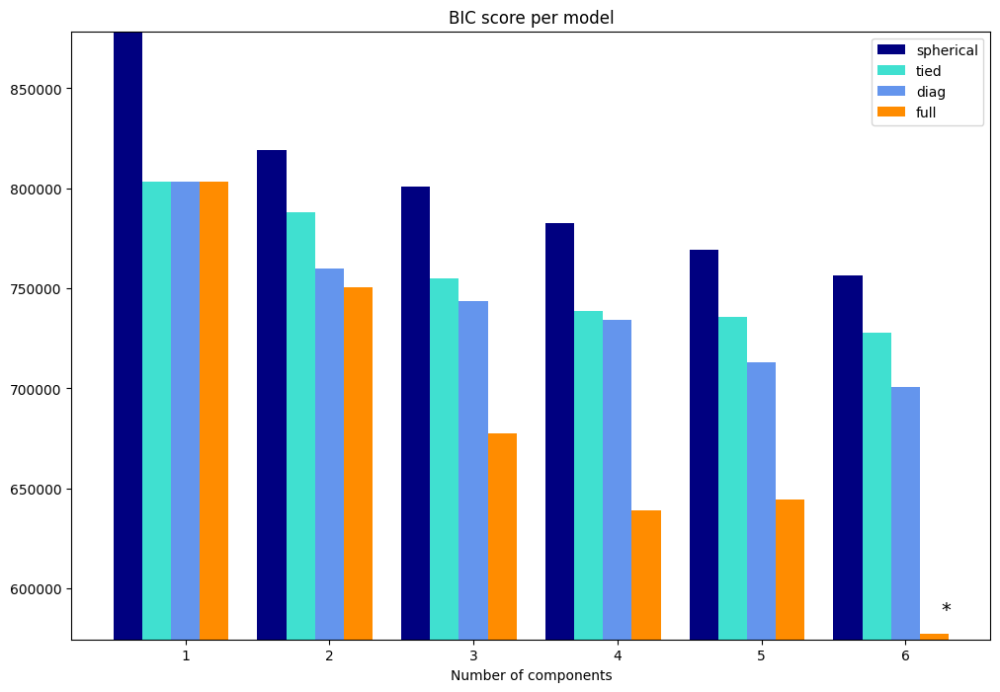

K tối ưu trên dữ liệu PCA: 6


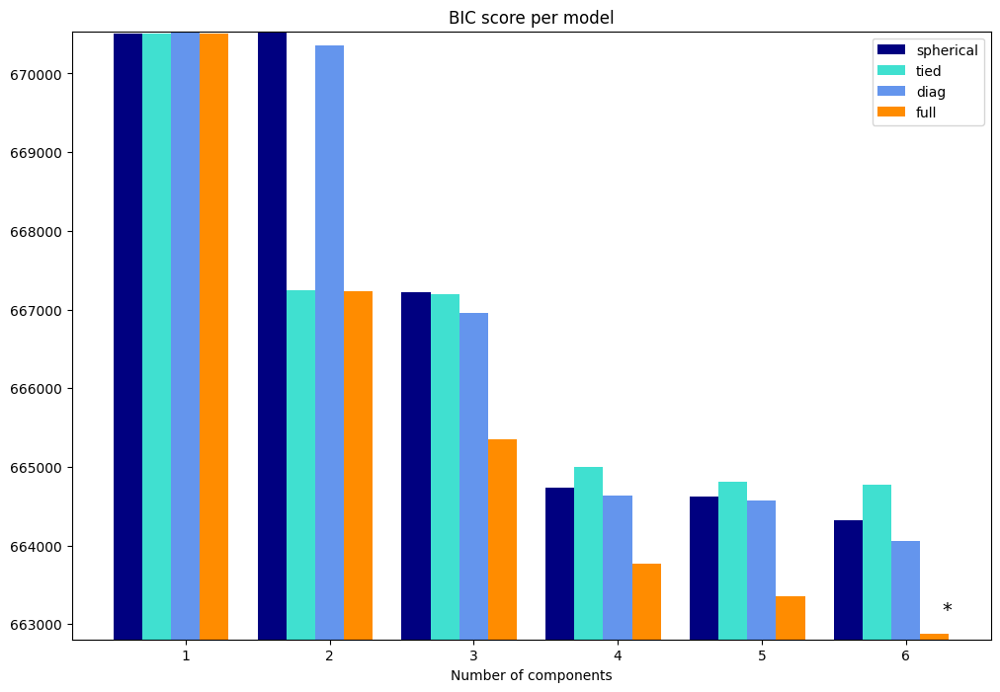

K tối ưu trên dữ liệu t-SNE: 6


In [ ]:
# std = MinMaxScaler()
# X_std = std.fit_transform(X_features)

# Trường hợp 1: Dữ liệu gốc
best_gmm_model_orig, best_gmm_num_clusters_orig = find_best_gmm_with_bic(X_scaled)
print(f"K tối ưu trên dữ liệu gốc: {best_gmm_num_clusters_orig}")

# Trường hợp 2: Dữ liệu PCA (chọn 10 thành phần chính)
best_gmm_model_pca, best_gmm_num_clusters_pca = find_best_gmm_with_bic(X_pca_full[:, :10])
print(f"K tối ưu trên dữ liệu PCA: {best_gmm_num_clusters_pca}")

# Trường hợp 3: Dữ liệu t-SNE (2D)
best_gmm_model_tsne, best_gmm_num_clusters_tsne = find_best_gmm_with_bic(X_tsne_2d_df[['TSNE1', 'TSNE2']])
print(f"K tối ưu trên dữ liệu t-SNE: {best_gmm_num_clusters_tsne}")

In [ ]:
# Áp dụng GMM với số cụm tối ưu
gmm_orig = best_gmm_model_orig
gmm_pca = best_gmm_model_pca
gmm_tsne = best_gmm_model_tsne

# Gán nhãn cụm vào DataFrame
df_gmm = df.copy()
df_gmm['gmm_orig'] = gmm_orig.predict(X_scaled)
df_gmm['gmm_pca'] = gmm_pca.predict(X_pca_full[:, :10])
df_gmm['gmm_tsne'] = gmm_tsne.predict(X_tsne_2d_df[['TSNE1', 'TSNE2']])

# In thống kê về kết quả phân cụm GMM
print("\nTổng quan về kết quả phân cụm GMM:")
print(f"Số cụm trên dữ liệu gốc: {best_gmm_num_clusters_orig}")
print(f"Số cụm trên dữ liệu PCA: {best_gmm_num_clusters_pca}")
print(f"Số cụm trên dữ liệu t-SNE: {best_gmm_num_clusters_tsne}")

# Tính BIC cho mỗi phương pháp GMM
bic_gmm_orig = gmm_orig.bic(X_scaled)
bic_gmm_pca = gmm_pca.bic(X_pca_full[:, :10])
bic_gmm_tsne = gmm_tsne.bic(X_tsne_2d_df[['TSNE1', 'TSNE2']])

print(f"\nBIC - dữ liệu gốc: {bic_gmm_orig:.4f}")
print(f"BIC - PCA: {bic_gmm_pca:.4f}")
print(f"BIC - t-SNE: {bic_gmm_tsne:.4f}")

# Nếu muốn lưu nhãn cluster GMM vào df gốc:
df['cluster_gmm_pca'] = gmm_pca.predict(X_pca_full[:, :10])
df['cluster_gmm_tsne'] = gmm_tsne.predict(X_tsne_2d_df[['TSNE1', 'TSNE2']])


Tổng quan về kết quả phân cụm GMM:
Số cụm trên dữ liệu gốc: 6
Số cụm trên dữ liệu PCA: 6
Số cụm trên dữ liệu t-SNE: 6

BIC - dữ liệu gốc: 567002.8191
BIC - PCA: 577498.0997
BIC - t-SNE: 662883.9523


#### Nhận xét về mối quan hệ giữa các mẫu dữ liệu đầu vào trong các cụm; đánh giá quan hệ giữa các đầu ra tương ứng trong các cụm.

Đánh giá chất lượng phân cụm (GMM):

Phương pháp ORIG:
Davies-Bouldin Index: 2.6908
Calinski-Harabasz Index: 2591.6972

Phương pháp PCA:
Davies-Bouldin Index: 2.2503
Calinski-Harabasz Index: 3188.8180

Phương pháp TSNE:
Davies-Bouldin Index: 0.9094
Calinski-Harabasz Index: 22287.9004


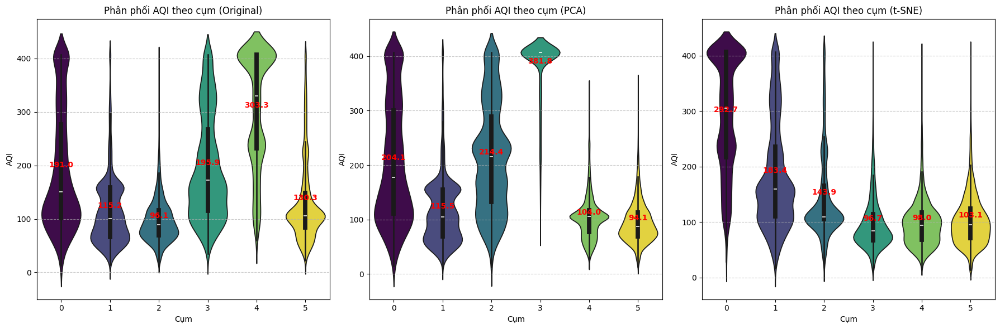

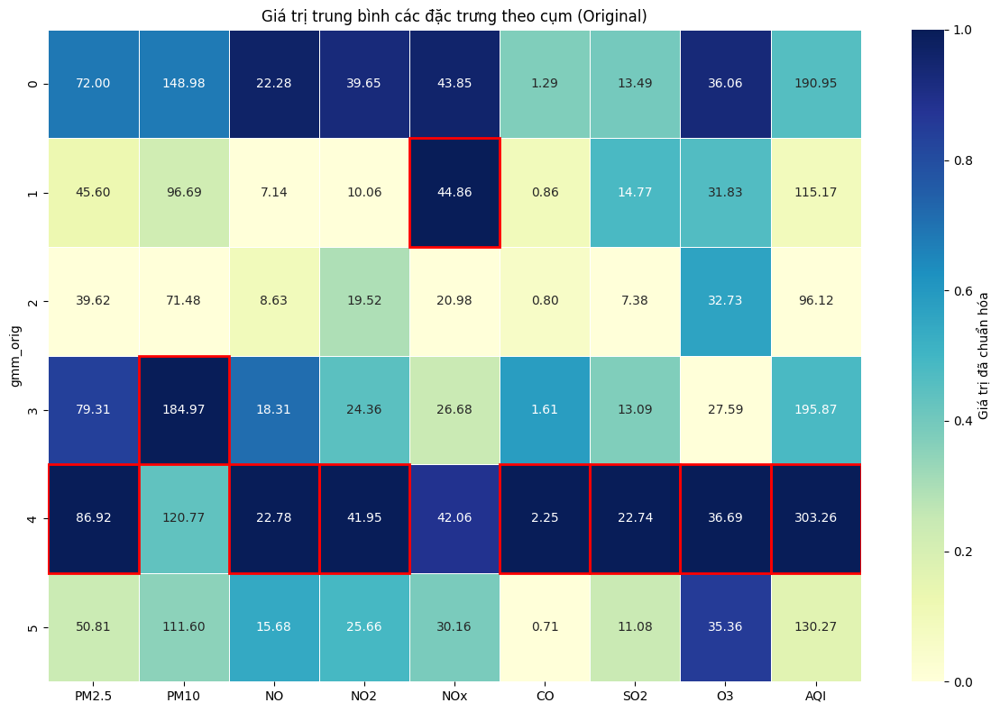

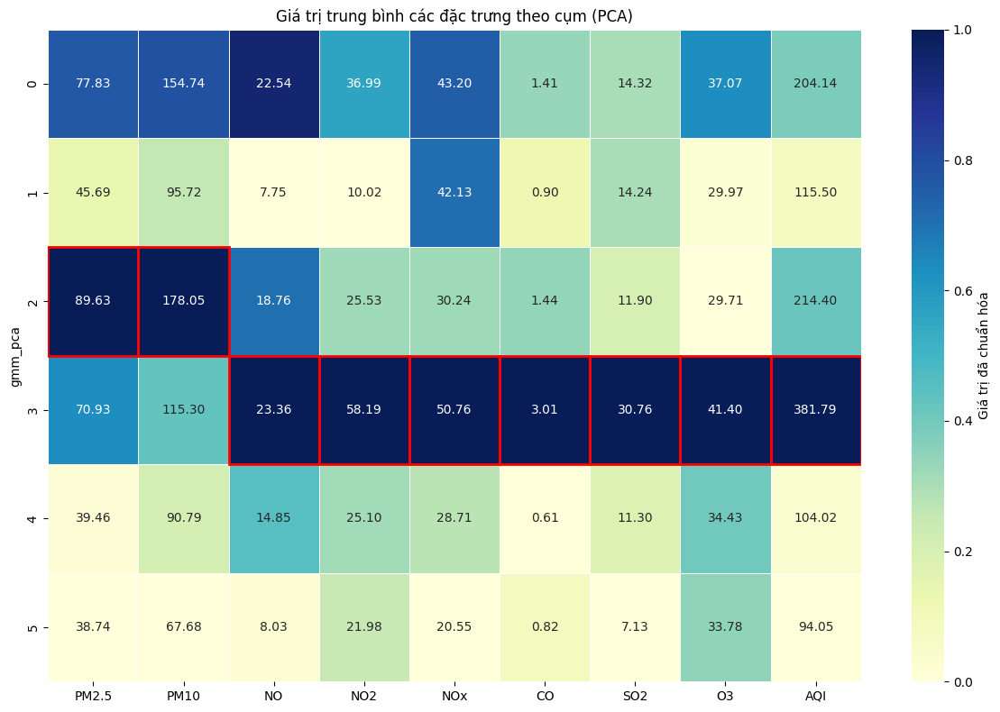

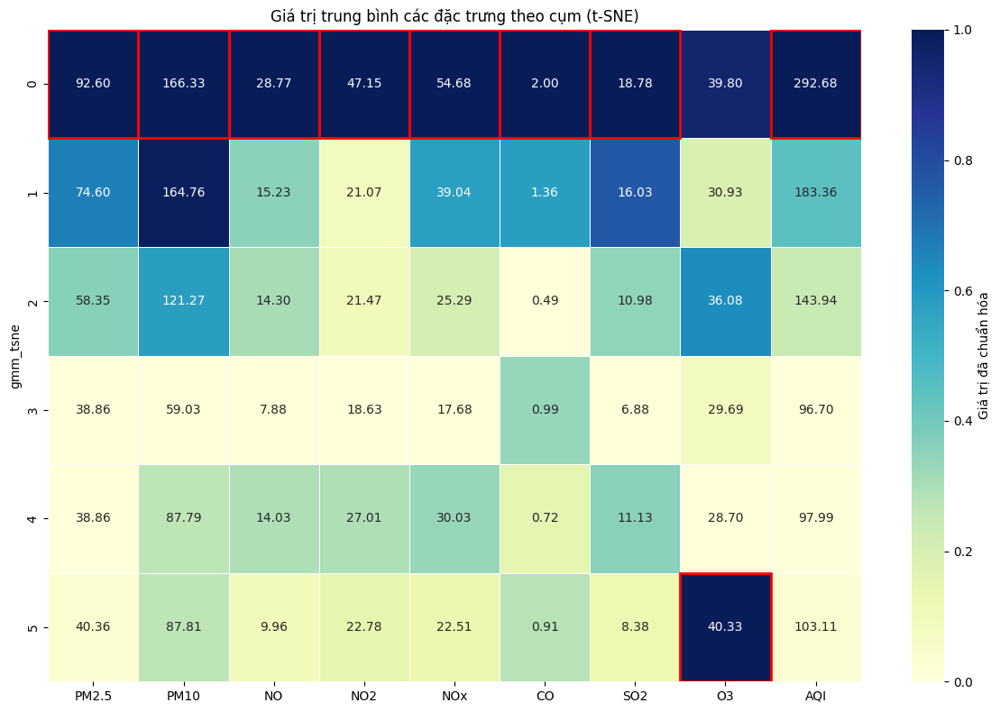

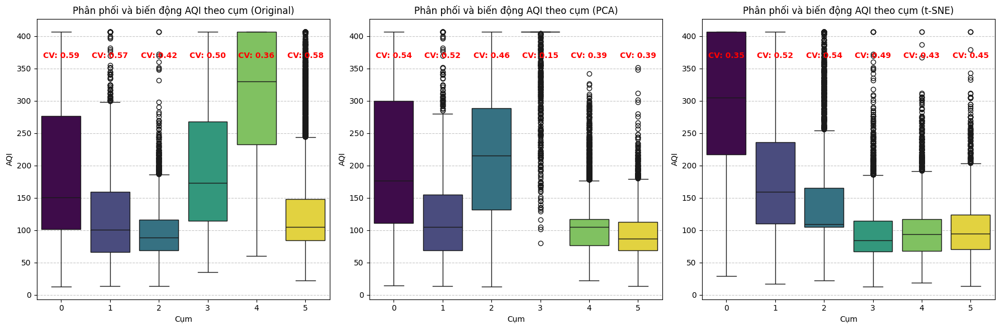

In [ ]:
features_for_analysis = ['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'CO', 'SO2', 'O3', 'AQI']

# Giả sử df_gmm có các cột nhãn cụm từ GMM như sau:
# cluster_cols = ['gmm_orig']
cluster_cols = ['gmm_orig', 'gmm_pca', 'gmm_tsne']

print("Đánh giá chất lượng phân cụm (GMM):")
# for method in ['orig']:
for method in ['orig', 'pca', 'tsne']:
    cluster_column = f'gmm_{method}'
    X_data = X_scaled if method == 'orig' else (X_pca_full[:, :10] if method == 'pca' else X_tsne_2d_df[['TSNE1', 'TSNE2']])
    # X_data = X_std
    labels = df_gmm[cluster_column]

    db_score = davies_bouldin_score(X_data, labels)
    ch_score = calinski_harabasz_score(X_data, labels)

    print(f"\nPhương pháp {method.upper()}:")
    print(f"Davies-Bouldin Index: {db_score:.4f}")
    print(f"Calinski-Harabasz Index: {ch_score:.4f}")

# Trực quan hóa phân phối AQI theo cụm (GMM)
plt.figure(figsize=(18, 6))

# for i, method in enumerate(['orig']):
for i, method in enumerate(['orig', 'pca', 'tsne']):
    plt.subplot(1, 3, i+1)
    cluster_column = f'gmm_{method}'
    method_name = 'Original' if method == 'orig' else ('PCA' if method == 'pca' else 't-SNE')
    # method_name = 'Original'
    sns.violinplot(
        x=cluster_column,
        y='AQI',
        data=df_gmm,
        hue=cluster_column,
        palette='viridis',
        legend=False
    )

    means = df_gmm.groupby(cluster_column)['AQI'].mean()
    for j, mean_val in enumerate(means):
        plt.text(j, mean_val + 5, f'{mean_val:.1f}', ha='center', color='red', fontweight='bold')

    plt.title(f'Phân phối AQI theo cụm ({method_name})')
    plt.xlabel('Cụm')
    plt.ylabel('AQI')
    plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.savefig('aqi_distribution_by_gmm_cluster.png')
plt.show()

# Heatmap trung bình các đặc trưng theo cụm (GMM)
# for method in ['orig']:
for method in ['orig', 'pca', 'tsne']:
    cluster_column = f'gmm_{method}'
    method_name = 'Original' if method == 'orig' else ('PCA' if method == 'pca' else 't-SNE')
    # method_name = 'Original'
    cluster_means = df_gmm.groupby(cluster_column)[features_for_analysis].mean()
    cluster_means_norm = (cluster_means - cluster_means.min()) / (cluster_means.max() - cluster_means.min())

    plt.figure(figsize=(12, 8))
    ax = sns.heatmap(cluster_means_norm, annot=cluster_means.round(2), fmt='.2f', cmap='YlGnBu',
                     linewidths=.5, cbar_kws={'label': 'Giá trị đã chuẩn hóa'})

    for j in range(cluster_means.shape[1]):
        max_idx = cluster_means.iloc[:, j].idxmax()
        ax.add_patch(plt.Rectangle((j, max_idx), 1, 1, fill=False, edgecolor='red', lw=2))

    plt.title(f'Giá trị trung bình các đặc trưng theo cụm ({method_name})')
    plt.tight_layout()
    plt.savefig(f'cluster_features_heatmap_gmm_{method}.png')
    plt.show()

# Box plot phân tích biến động AQI theo cụm (GMM)
plt.figure(figsize=(18, 6))

# for i, method in enumerate(['orig']):
for i, method in enumerate(['orig', 'pca', 'tsne']):
    plt.subplot(1, 3, i+1)
    cluster_column = f'gmm_{method}'
    method_name = 'Original' if method == 'orig' else ('PCA' if method == 'pca' else 't-SNE')
    # method_name = 'Original'
    stats = df_gmm.groupby(cluster_column)['AQI'].agg(['mean', 'std']).reset_index()
    stats['CV'] = stats['std'] / stats['mean']

    sns.boxplot(
        x=cluster_column,
        y='AQI',
        data=df_gmm,
        hue=cluster_column,
        palette='viridis',
        legend=False
    )

    for j, (_, row) in enumerate(stats.iterrows()):
        plt.text(j, df_gmm['AQI'].max() * 0.9, f'CV: {row["CV"]:.2f}',
                 ha='center', color='red', fontweight='bold')

    plt.title(f'Phân phối và biến động AQI theo cụm ({method_name})')
    plt.xlabel('Cụm')
    plt.ylabel('AQI')
    plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.savefig('aqi_variability_by_gmm_cluster.png')
plt.show()


#### Thực hiện trực quan hóa dữ liệu và đánh dấu phân biệt các mẫu dữ liệu thuộc mỗi cụm thông qua màu sắc.

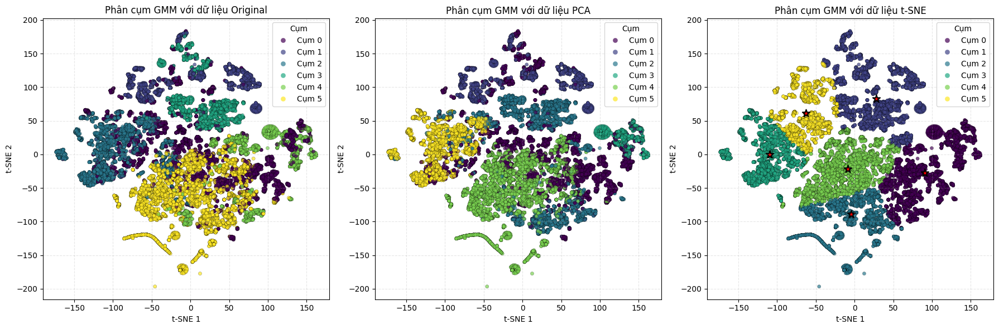

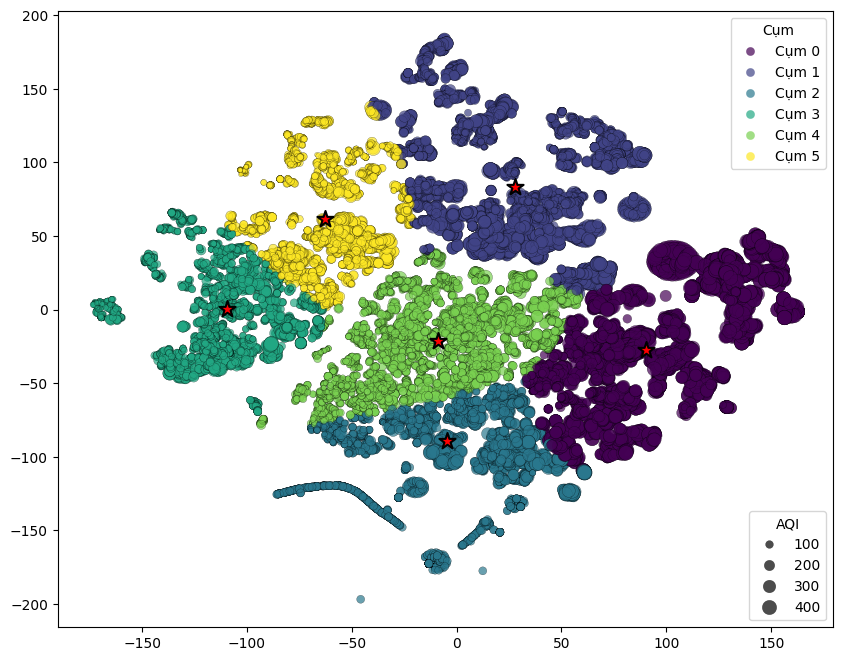

In [ ]:
# 1. Trực quan hóa trên không gian t-SNE 2D (tốt nhất cho biểu diễn trực quan)
plt.figure(figsize=(18, 6))

# Tạo một colormap với nhiều màu hơn nếu cần
colors = plt.cm.viridis(np.linspace(0, 1, max(len(df_gmm['gmm_orig'].unique()),
                                              len(df_gmm['gmm_pca'].unique()),
                                              len(df_gmm['gmm_tsne'].unique()))))
# colors = plt.cm.viridis(np.linspace(0, 1, len(df_gmm['gmm_orig'].unique())))
custom_cmap = ListedColormap(colors)

# Vẽ biểu đồ cho 3 phương pháp
# for i, method in enumerate(['orig']):
for i, method in enumerate(['orig', 'pca', 'tsne']):
    ax = plt.subplot(1, 3, i+1)
    cluster_column = f'gmm_{method}'
    method_name = 'Original' if method == 'orig' else ('PCA' if method == 'pca' else 't-SNE')
    # method_name = 'Original'
    # Scatter plot với màu theo cụm
    scatter = ax.scatter(X_tsne_2d_df['TSNE1'], X_tsne_2d_df['TSNE2'],
                         c=df_gmm[cluster_column],
                         cmap=custom_cmap,
                         s=20, alpha=0.7, edgecolor='k', linewidth=0.2)

    centers = gmm_orig.means_
    # Thêm tâm cụm
    if method == 'orig':
        centers = gmm_orig.means_
        # Chuyển tâm cụm sang không gian t-SNE (cần thêm bước biến đổi)
    elif method == 'pca':
        centers = gmm_pca.means_
        # Tương tự, chuyển tâm từ không gian PCA sang t-SNE là không trực tiếp
    else:  # t-SNE
        centers = gmm_tsne.means_
        # Tâm cụm đã ở trong không gian t-SNE
        for j, center in enumerate(centers):
            ax.scatter(center[0], center[1], s=100, marker='*',
                      color='red', edgecolor='black', linewidth=1.5,
                      label=f'Tâm cụm {j}' if j == 0 else "")

    # Thêm legend
    handles, labels = scatter.legend_elements(prop="colors")
    legend = ax.legend(handles, [f'Cụm {i}' for i in range(len(handles))],
                   loc="upper right", title="Cụm")

    ax.set_title(f'Phân cụm GMM với dữ liệu {method_name}')
    ax.set_xlabel('t-SNE 1')
    ax.set_ylabel('t-SNE 2')
    ax.grid(True, alpha=0.3, linestyle='--')

plt.tight_layout()
plt.savefig('gmm_clustering_comparison.png', dpi=300)
plt.show()

# 2. Trực quan hóa kết quả phân cụm t-SNE với kích thước điểm phản ánh giá trị AQI
plt.figure(figsize=(10, 8))
method = 'tsne'  # Sử dụng phương pháp t-SNE để minh họa
cluster_column = f'gmm_{method}'

# Chuẩn hóa giá trị AQI để sử dụng làm kích thước điểm
point_sizes = 10 + (df_gmm['AQI'] - df_gmm['AQI'].min()) / (df_gmm['AQI'].max() - df_gmm['AQI'].min()) * 100

scatter = plt.scatter(X_tsne_2d_df['TSNE1'], X_tsne_2d_df['TSNE2'],
                     c=df_gmm[cluster_column], cmap=custom_cmap,
                     s=point_sizes, alpha=0.7, edgecolor='k', linewidth=0.2)

# Vẽ tâm cụm
for j, center in enumerate(gmm_tsne.means_):
    plt.scatter(center[0], center[1], s=150, marker='*',
              color='red', edgecolor='black', linewidth=1.5,
              label=f'Tâm cụm {j}' if j == 0 else "")

# Thêm legend cho cụm
handles, labels = scatter.legend_elements(prop="colors")
legend1 = plt.legend(handles, [f'Cụm {i}' for i in range(len(handles))],
               loc="upper right", title="Cụm")
plt.gca().add_artist(legend1)

# Thêm legend cho kích thước
kw = dict(prop="sizes", num=4, fmt="{x:.0f}", func=lambda s: (s-10)/100*(df_gmm['AQI'].max()-df_gmm['AQI'].min())+df_gmm['AQI'].min())
legend2 = plt.legend(*scatter.legend_elements(**kw), loc="lower right", title="AQI")

# Mô hình hồi quy (Random Forest, MLP)

## Thực hiện 2 phương pháp hồi quy trên tập dữ liệu đã tiền xử lý và với tỉ lệ train:validation được chia khác nhau (ít nhất gồm train:validation = 8:1; 7:3; 6:4).

### Random Forest

#### Dữ liệu gốc

In [ ]:
# Các tỉ lệ train-test khác nhau để thử nghiệm (8:2, 7:3, 6:4)
test_sizes = [0.2, 0.3, 0.4]

# Số lượng cây trong rừng ngẫu nhiên để thử nghiệm
n_estimators_list = [50, 100, 200]

# Dictionary để lưu kết quả của các mô hình
results = {
    "original": {},
    "pca": {},
    "tsne": {}
}

# Chuẩn bị dữ liệu
target = 'AQI'
# Sử dụng numeric_cols thay vì numeric_features
original_features = [col for col in numeric_cols if col != target]
X_original = df[original_features].values
y = df[target]

# 1. Thực nghiệm với dữ liệu gốc
print("="*50)
print("THỰC NGHIỆM VỚI DỮ LIỆU GỐC")
print("="*50)

for test_size in test_sizes:
    train_size = 1 - test_size
    train_ratio = int(train_size * 10)
    test_ratio = int(test_size * 10)

    print(f"\nPhân chia train:validation = {train_ratio}:{test_ratio}")

    # Phân chia dữ liệu thành tập huấn luyện và tập kiểm tra
    X_train, X_val, y_train, y_val = train_test_split(
        X_original, y, test_size=test_size, random_state=42
    )

    print(f"Kích thước tập huấn luyện: {X_train.shape}")
    print(f"Kích thước tập validation: {X_val.shape}")

    # Thử nghiệm với các số lượng cây khác nhau
    print("\nSố lượng cây   |   MSE    |   RMSE   |    R2    |    MAE")
    print("-" * 60)

    for n_estimators in n_estimators_list:
        # Huấn luyện mô hình Random Forest
        rf_model = RandomForestRegressor(n_estimators=n_estimators, random_state=42, n_jobs=-1)
        rf_model.fit(X_train, y_train)
        # Dự đoán trên tập validation
        y_pred = rf_model.predict(X_val)

        # Tính các metric đánh giá
        mse = mean_squared_error(y_val, y_pred)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_val, y_pred)
        mae = mean_absolute_error(y_val, y_pred)

        # Tạo dict kết quả
        result = {
            'n_estimators': n_estimators,
            'MSE': mse,
            'RMSE': rmse,
            'R2': r2,
            'MAE': mae
        }

        # Lưu kết quả
        key = f"{train_ratio}:{test_ratio}_{n_estimators}"
        results["original"][key] = result

        # In kết quả
        print(f"{n_estimators:14d} | {mse:8.4f} | {rmse:8.4f} | {r2:8.4f} | {mae:8.4f}")

THỰC NGHIỆM VỚI DỮ LIỆU GỐC

Phân chia train:validation = 8:2
Kích thước tập huấn luyện: (23624, 12)
Kích thước tập validation: (5907, 12)

Số lượng cây   |   MSE    |   RMSE   |    R2    |    MAE
------------------------------------------------------------
            50 | 896.7948 |  29.9465 |   0.9174 |  17.5425
           100 | 892.3672 |  29.8725 |   0.9178 |  17.4586
           200 | 890.1362 |  29.8351 |   0.9180 |  17.4293

Phân chia train:validation = 7:3
Kích thước tập huấn luyện: (20671, 12)
Kích thước tập validation: (8860, 12)

Số lượng cây   |   MSE    |   RMSE   |    R2    |    MAE
------------------------------------------------------------
            50 | 900.3161 |  30.0053 |   0.9176 |  17.6563
           100 | 893.1509 |  29.8856 |   0.9183 |  17.5516
           200 | 887.3809 |  29.7889 |   0.9188 |  17.4954

Phân chia train:validation = 6:4
Kích thước tập huấn luyện: (17718, 12)
Kích thước tập validation: (11813, 12)

Số lượng cây   |   MSE    |   RMSE   |    R2 

#### Dữ liệu gốc với K-means

In [ ]:
# 2. Thực nghiệm với dữ liệu gốc kết hợp với phân cụm K-means
print("="*50)
print("THỰC NGHIỆM VỚI DỮ LIỆU GỐC KẾT HỢP VỚI K-MEANS")
print("="*50)

# Lấy nhãn phân cụm từ KMeans với dữ liệu gốc
cluster_labels = km_orig.labels_

# Dictionary để lưu kết quả của từng cụm
cluster_results = {}

# Thực hiện huấn luyện riêng cho từng cụm
for cluster_id in range(best_k_orig):
    print(f"\nCluster {cluster_id}:")

    # Lấy chỉ số của các mẫu thuộc cụm hiện tại
    cluster_indices = np.where(cluster_labels == cluster_id)[0]

    # Nếu cụm quá nhỏ thì bỏ qua
    if len(cluster_indices) < 100:  # Ngưỡng tùy chỉnh
        print(f"Cụm {cluster_id} có kích thước quá nhỏ ({len(cluster_indices)} mẫu), bỏ qua.")
        continue

    # Lấy dữ liệu của cụm hiện tại
    X_cluster = X_original[cluster_indices]
    y_cluster = y.iloc[cluster_indices]

    print(f"Kích thước cụm: {len(cluster_indices)} mẫu")

    # Lưu kết quả của cụm này
    cluster_results[cluster_id] = {}

    # Thử nghiệm với các tỉ lệ train-test và số lượng cây khác nhau
    for test_size in test_sizes:
        train_size = 1 - test_size
        train_ratio = int(train_size * 10)
        test_ratio = int(test_size * 10)

        # Bỏ qua nếu không thể chia được do cụm quá nhỏ
        min_samples = 20  # Số mẫu tối thiểu cho mỗi tập
        if len(cluster_indices) < min_samples / test_size:
            print(f"  Bỏ qua tỉ lệ {train_ratio}:{test_ratio} do không đủ dữ liệu")
            continue

        print(f"\n  Phân chia train:validation = {train_ratio}:{test_ratio}")

        # Phân chia dữ liệu của cụm thành tập huấn luyện và tập kiểm tra
        X_train, X_val, y_train, y_val = train_test_split(
            X_cluster, y_cluster, test_size=test_size, random_state=42
        )

        print(f"  Kích thước tập huấn luyện: {X_train.shape}")
        print(f"  Kích thước tập validation: {X_val.shape}")

        # Thử nghiệm với các số lượng cây khác nhau
        print("\n  Số lượng cây   |   MSE    |   RMSE   |    R2    |    MAE")
        print("  " + "-" * 58)

        for n_estimators in n_estimators_list:
            # Huấn luyện mô hình Random Forest cho cụm hiện tại
            rf_model = RandomForestRegressor(n_estimators=n_estimators, random_state=42, n_jobs=-1)
            rf_model.fit(X_train, y_train)
            # Dự đoán trên tập validation
            y_pred = rf_model.predict(X_val)

            # Tính các metric đánh giá
            mse = mean_squared_error(y_val, y_pred)
            rmse = np.sqrt(mse)
            r2 = r2_score(y_val, y_pred)
            mae = mean_absolute_error(y_val, y_pred)

            # Tạo dict kết quả
            result = {
                'n_estimators': n_estimators,
                'MSE': mse,
                'RMSE': rmse,
                'R2': r2,
                'MAE': mae
            }

            # Lưu kết quả
            key = f"{train_ratio}:{test_ratio}_{n_estimators}"
            cluster_results[cluster_id][key] = result

            # In kết quả
            print(f"  {n_estimators:14d} | {mse:8.4f} | {rmse:8.4f} | {r2:8.4f} | {mae:8.4f}")

# Lưu kết quả phân cụm vào dict kết quả tổng thể
results["kmeans_clustering"] = cluster_results

THỰC NGHIỆM VỚI DỮ LIỆU GỐC KẾT HỢP VỚI K-MEANS

Cluster 0:
Kích thước cụm: 9199 mẫu

  Phân chia train:validation = 8:2
  Kích thước tập huấn luyện: (7359, 12)
  Kích thước tập validation: (1840, 12)

  Số lượng cây   |   MSE    |   RMSE   |    R2    |    MAE
  ----------------------------------------------------------
              50 | 1289.0562 |  35.9034 |   0.8836 |  22.8878
             100 | 1288.7515 |  35.8992 |   0.8836 |  22.8909
             200 | 1287.7367 |  35.8850 |   0.8837 |  22.8928

  Phân chia train:validation = 7:3
  Kích thước tập huấn luyện: (6439, 12)
  Kích thước tập validation: (2760, 12)

  Số lượng cây   |   MSE    |   RMSE   |    R2    |    MAE
  ----------------------------------------------------------
              50 | 1349.5397 |  36.7361 |   0.8766 |  23.4143
             100 | 1335.8040 |  36.5487 |   0.8778 |  23.3283
             200 | 1325.7436 |  36.4108 |   0.8788 |  23.2386

  Phân chia train:validation = 6:4
  Kích thước tập huấn luyện: (551

#### PCA

In [ ]:
# Các tỉ lệ train-test khác nhau để thử nghiệm (8:2, 7:3, 6:4)
test_sizes = [0.2, 0.3, 0.4]

# Số lượng cây trong rừng ngẫu nhiên để thử nghiệm
n_estimators_list = [50, 100, 200]

# Dictionary để lưu kết quả của các mô hình
results = {
    "original": {},
    "pca": {},
    "tsne": {}
}

# Chuẩn bị dữ liệu
target = 'AQI'
y = df[target]

# Sử dụng dữ liệu đã giảm chiều từ PCA
# X_pca_full đã được tạo ở cell trước đó
X_pca = X_pca_full

# 2. Thực nghiệm với dữ liệu PCA
print("="*50)
print("THỰC NGHIỆM VỚI DỮ LIỆU PCA")
print("="*50)

for test_size in test_sizes:
    train_size = 1 - test_size
    train_ratio = int(train_size * 10)
    test_ratio = int(test_size * 10)

    print(f"\nPhân chia train:validation = {train_ratio}:{test_ratio}")

    # Phân chia dữ liệu thành tập huấn luyện và tập kiểm tra
    X_train, X_val, y_train, y_val = train_test_split(
        X_pca, y, test_size=test_size, random_state=42
    )

    print(f"Kích thước tập huấn luyện: {X_train.shape}")
    print(f"Kích thước tập validation: {X_val.shape}")

    # Thử nghiệm với các số lượng cây khác nhau
    print("\nSố lượng cây   |   MSE    |   RMSE   |    R2    |    MAE")
    print("-" * 60)

    for n_estimators in n_estimators_list:
        # Huấn luyện mô hình Random Forest
        rf_model = RandomForestRegressor(n_estimators=n_estimators, random_state=42, n_jobs=-1)
        rf_model.fit(X_train, y_train)
        # Dự đoán trên tập validation
        y_pred = rf_model.predict(X_val)

        # Tính các metric đánh giá
        mse = mean_squared_error(y_val, y_pred)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_val, y_pred)
        mae = mean_absolute_error(y_val, y_pred)

        # Tạo dict kết quả
        result = {
            'n_estimators': n_estimators,
            'MSE': mse,
            'RMSE': rmse,
            'R2': r2,
            'MAE': mae
        }

        # Lưu kết quả
        key = f"{train_ratio}:{test_ratio}_{n_estimators}"
        results["pca"][key] = result

        # In kết quả
        print(f"{n_estimators:14d} | {mse:8.4f} | {rmse:8.4f} | {r2:8.4f} | {mae:8.4f}")

THỰC NGHIỆM VỚI DỮ LIỆU PCA

Phân chia train:validation = 8:2
Kích thước tập huấn luyện: (23624, 12)
Kích thước tập validation: (5907, 12)

Số lượng cây   |   MSE    |   RMSE   |    R2    |    MAE
------------------------------------------------------------
            50 | 1034.1755 |  32.1586 |   0.9047 |  19.2811
           100 | 1023.5769 |  31.9934 |   0.9057 |  19.1365
           200 | 1016.5509 |  31.8834 |   0.9064 |  19.0404

Phân chia train:validation = 7:3
Kích thước tập huấn luyện: (20671, 12)
Kích thước tập validation: (8860, 12)

Số lượng cây   |   MSE    |   RMSE   |    R2    |    MAE
------------------------------------------------------------
            50 | 1002.0973 |  31.6559 |   0.9083 |  19.1856
           100 | 988.4272 |  31.4393 |   0.9096 |  19.0530
           200 | 982.3533 |  31.3425 |   0.9101 |  19.0027

Phân chia train:validation = 6:4
Kích thước tập huấn luyện: (17718, 12)
Kích thước tập validation: (11813, 12)

Số lượng cây   |   MSE    |   RMSE   |   

#### PCA với K-means

In [ ]:
# 2. Thực nghiệm với dữ liệu PCA kết hợp với phân cụm K-means
print("="*50)
print("THỰC NGHIỆM VỚI DỮ LIỆU PCA KẾT HỢP VỚI K-MEANS")
print("="*50)

# Lấy nhãn phân cụm từ KMeans với dữ liệu PCA
cluster_labels = km_pca.labels_

# Dictionary để lưu kết quả của từng cụm
cluster_results = {}

# Thực hiện huấn luyện riêng cho từng cụm
for cluster_id in range(best_k_pca):
    print(f"\nCluster {cluster_id}:")

    # Lấy chỉ số của các mẫu thuộc cụm hiện tại
    cluster_indices = np.where(cluster_labels == cluster_id)[0]

    # Nếu cụm quá nhỏ thì bỏ qua
    if len(cluster_indices) < 100:  # Ngưỡng tùy chỉnh
        print(f"Cụm {cluster_id} có kích thước quá nhỏ ({len(cluster_indices)} mẫu), bỏ qua.")
        continue

    # Lấy dữ liệu của cụm hiện tại
    X_cluster = X_pca[cluster_indices]
    y_cluster = y.iloc[cluster_indices]

    print(f"Kích thước cụm: {len(cluster_indices)} mẫu")

    # Lưu kết quả của cụm này
    cluster_results[cluster_id] = {}

    # Thử nghiệm với các tỉ lệ train-test và số lượng cây khác nhau
    for test_size in test_sizes:
        train_size = 1 - test_size
        train_ratio = int(train_size * 10)
        test_ratio = int(test_size * 10)

        # Bỏ qua nếu không thể chia được do cụm quá nhỏ
        min_samples = 20  # Số mẫu tối thiểu cho mỗi tập
        if len(cluster_indices) < min_samples / test_size:
            print(f"  Bỏ qua tỉ lệ {train_ratio}:{test_ratio} do không đủ dữ liệu")
            continue

        print(f"\n  Phân chia train:validation = {train_ratio}:{test_ratio}")

        # Phân chia dữ liệu của cụm thành tập huấn luyện và tập kiểm tra
        X_train, X_val, y_train, y_val = train_test_split(
            X_cluster, y_cluster, test_size=test_size, random_state=42
        )

        print(f"  Kích thước tập huấn luyện: {X_train.shape}")
        print(f"  Kích thước tập validation: {X_val.shape}")

        # Thử nghiệm với các số lượng cây khác nhau
        print("\n  Số lượng cây   |   MSE    |   RMSE   |    R2    |    MAE")
        print("  " + "-" * 58)

        for n_estimators in n_estimators_list:
            # Huấn luyện mô hình Random Forest cho cụm hiện tại
            rf_model = RandomForestRegressor(n_estimators=n_estimators, random_state=42, n_jobs=-1)
            rf_model.fit(X_train, y_train)
            # Dự đoán trên tập validation
            y_pred = rf_model.predict(X_val)

            # Tính các metric đánh giá
            mse = mean_squared_error(y_val, y_pred)
            rmse = np.sqrt(mse)
            r2 = r2_score(y_val, y_pred)
            mae = mean_absolute_error(y_val, y_pred)

            # Tạo dict kết quả
            result = {
                'n_estimators': n_estimators,
                'MSE': mse,
                'RMSE': rmse,
                'R2': r2,
                'MAE': mae
            }

            # Lưu kết quả
            key = f"{train_ratio}:{test_ratio}_{n_estimators}"
            cluster_results[cluster_id][key] = result

            # In kết quả
            print(f"  {n_estimators:14d} | {mse:8.4f} | {rmse:8.4f} | {r2:8.4f} | {mae:8.4f}")

# Lưu kết quả phân cụm vào dict kết quả tổng thể
results["pca_kmeans_clustering"] = cluster_results

THỰC NGHIỆM VỚI DỮ LIỆU PCA KẾT HỢP VỚI K-MEANS

Cluster 0:
Kích thước cụm: 9182 mẫu

  Phân chia train:validation = 8:2
  Kích thước tập huấn luyện: (7345, 12)
  Kích thước tập validation: (1837, 12)

  Số lượng cây   |   MSE    |   RMSE   |    R2    |    MAE
  ----------------------------------------------------------
              50 | 1507.5844 |  38.8276 |   0.8609 |  25.7544
             100 | 1487.2135 |  38.5644 |   0.8628 |  25.6275
             200 | 1480.0751 |  38.4717 |   0.8635 |  25.5478

  Phân chia train:validation = 7:3
  Kích thước tập huấn luyện: (6427, 12)
  Kích thước tập validation: (2755, 12)

  Số lượng cây   |   MSE    |   RMSE   |    R2    |    MAE
  ----------------------------------------------------------
              50 | 1684.9007 |  41.0475 |   0.8459 |  26.8359
             100 | 1662.9601 |  40.7794 |   0.8479 |  26.6936
             200 | 1660.5021 |  40.7493 |   0.8481 |  26.6893

  Phân chia train:validation = 6:4
  Kích thước tập huấn luyện: (550

#### t-SNE

In [ ]:
# Các tỉ lệ train-test khác nhau để thử nghiệm (8:2, 7:3, 6:4)
test_sizes = [0.2, 0.3, 0.4]

# Số lượng cây trong rừng ngẫu nhiên để thử nghiệm
n_estimators_list = [50, 100, 200]

# Dictionary để lưu kết quả của các mô hình
results = {
    "original": {},
    "pca": {},
    "tsne": {}
}

# Chuẩn bị dữ liệu
target = 'AQI'
y = df[target]

# Sử dụng dữ liệu đã giảm chiều từ t-SNE
# X_tsne_2d đã được tạo ở cell trước đó
X_tsne = X_tsne_2d

# 3. Thực nghiệm với dữ liệu t-SNE
print("="*50)
print("THỰC NGHIỆM VỚI DỮ LIỆU t-SNE")
print("="*50)

for test_size in test_sizes:
    train_size = 1 - test_size
    train_ratio = int(train_size * 10)
    test_ratio = int(test_size * 10)

    print(f"\nPhân chia train:validation = {train_ratio}:{test_ratio}")

    # Phân chia dữ liệu thành tập huấn luyện và tập kiểm tra
    X_train, X_val, y_train, y_val = train_test_split(
        X_tsne, y, test_size=test_size, random_state=42
    )

    print(f"Kích thước tập huấn luyện: {X_train.shape}")
    print(f"Kích thước tập validation: {X_val.shape}")

    # Thử nghiệm với các số lượng cây khác nhau
    print("\nSố lượng cây   |   MSE    |   RMSE   |    R2    |    MAE")
    print("-" * 60)

    for n_estimators in n_estimators_list:
        # Huấn luyện mô hình Random Forest
        rf_model = RandomForestRegressor(n_estimators=n_estimators, random_state=42, n_jobs=-1)
        rf_model.fit(X_train, y_train)
        # Dự đoán trên tập validation
        y_pred = rf_model.predict(X_val)

        # Tính các metric đánh giá
        mse = mean_squared_error(y_val, y_pred)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_val, y_pred)
        mae = mean_absolute_error(y_val, y_pred)

        # Tạo dict kết quả
        result = {
            'n_estimators': n_estimators,
            'MSE': mse,
            'RMSE': rmse,
            'R2': r2,
            'MAE': mae
        }

        # Lưu kết quả
        key = f"{train_ratio}:{test_ratio}_{n_estimators}"
        results["tsne"][key] = result

        # In kết quả
        print(f"{n_estimators:14d} | {mse:8.4f} | {rmse:8.4f} | {r2:8.4f} | {mae:8.4f}")

THỰC NGHIỆM VỚI DỮ LIỆU t-SNE

Phân chia train:validation = 8:2
Kích thước tập huấn luyện: (23624, 2)
Kích thước tập validation: (5907, 2)

Số lượng cây   |   MSE    |   RMSE   |    R2    |    MAE
------------------------------------------------------------
            50 | 1222.0471 |  34.9578 |   0.8874 |  20.7382
           100 | 1207.6390 |  34.7511 |   0.8888 |  20.6511
           200 | 1207.1450 |  34.7440 |   0.8888 |  20.6579

Phân chia train:validation = 7:3
Kích thước tập huấn luyện: (20671, 2)
Kích thước tập validation: (8860, 2)

Số lượng cây   |   MSE    |   RMSE   |    R2    |    MAE
------------------------------------------------------------
            50 | 1183.5152 |  34.4023 |   0.8917 |  20.4775
           100 | 1179.4381 |  34.3429 |   0.8921 |  20.4195
           200 | 1177.6691 |  34.3172 |   0.8923 |  20.3995

Phân chia train:validation = 6:4
Kích thước tập huấn luyện: (17718, 2)
Kích thước tập validation: (11813, 2)

Số lượng cây   |   MSE    |   RMSE   |    R

#### t-SNE với K-means

In [ ]:
# 2. Thực nghiệm với dữ liệu t-SNE kết hợp với phân cụm K-means
print("="*50)
print("THỰC NGHIỆM VỚI DỮ LIỆU t-SNE KẾT HỢP VỚI K-MEANS")
print("="*50)

# Lấy nhãn phân cụm từ KMeans với dữ liệu t-SNE
cluster_labels = km_tsne.labels_

# Dictionary để lưu kết quả của từng cụm
cluster_results = {}

# Thực hiện huấn luyện riêng cho từng cụm
for cluster_id in range(best_k_tsne):
    print(f"\nCluster {cluster_id}:")

    # Lấy chỉ số của các mẫu thuộc cụm hiện tại
    cluster_indices = np.where(cluster_labels == cluster_id)[0]

    # Nếu cụm quá nhỏ thì bỏ qua
    if len(cluster_indices) < 100:  # Ngưỡng tùy chỉnh
        print(f"Cụm {cluster_id} có kích thước quá nhỏ ({len(cluster_indices)} mẫu), bỏ qua.")
        continue

    # Lấy dữ liệu của cụm hiện tại
    X_cluster = X_tsne[cluster_indices]
    y_cluster = y.iloc[cluster_indices]

    print(f"Kích thước cụm: {len(cluster_indices)} mẫu")

    # Lưu kết quả của cụm này
    cluster_results[cluster_id] = {}

    # Thử nghiệm với các tỉ lệ train-test và số lượng cây khác nhau
    for test_size in test_sizes:
        train_size = 1 - test_size
        train_ratio = int(train_size * 10)
        test_ratio = int(test_size * 10)

        # Bỏ qua nếu không thể chia được do cụm quá nhỏ
        min_samples = 20  # Số mẫu tối thiểu cho mỗi tập
        if len(cluster_indices) < min_samples / test_size:
            print(f"  Bỏ qua tỉ lệ {train_ratio}:{test_ratio} do không đủ dữ liệu")
            continue

        print(f"\n  Phân chia train:validation = {train_ratio}:{test_ratio}")

        # Phân chia dữ liệu của cụm thành tập huấn luyện và tập kiểm tra
        X_train, X_val, y_train, y_val = train_test_split(
            X_cluster, y_cluster, test_size=test_size, random_state=42
        )

        print(f"  Kích thước tập huấn luyện: {X_train.shape}")
        print(f"  Kích thước tập validation: {X_val.shape}")

        # Thử nghiệm với các số lượng cây khác nhau
        print("\n  Số lượng cây   |   MSE    |   RMSE   |    R2    |    MAE")
        print("  " + "-" * 58)

        for n_estimators in n_estimators_list:
            # Huấn luyện mô hình Random Forest cho cụm hiện tại
            rf_model = RandomForestRegressor(n_estimators=n_estimators, random_state=42, n_jobs=-1)
            rf_model.fit(X_train, y_train)
            # Dự đoán trên tập validation
            y_pred = rf_model.predict(X_val)

            # Tính các metric đánh giá
            mse = mean_squared_error(y_val, y_pred)
            rmse = np.sqrt(mse)
            r2 = r2_score(y_val, y_pred)
            mae = mean_absolute_error(y_val, y_pred)

            # Tạo dict kết quả
            result = {
                'n_estimators': n_estimators,
                'MSE': mse,
                'RMSE': rmse,
                'R2': r2,
                'MAE': mae
            }

            # Lưu kết quả
            key = f"{train_ratio}:{test_ratio}_{n_estimators}"
            cluster_results[cluster_id][key] = result

            # In kết quả
            print(f"  {n_estimators:14d} | {mse:8.4f} | {rmse:8.4f} | {r2:8.4f} | {mae:8.4f}")

# Lưu kết quả phân cụm vào dict kết quả tổng thể
results["tsne_kmeans_clustering"] = cluster_results

THỰC NGHIỆM VỚI DỮ LIỆU t-SNE KẾT HỢP VỚI K-MEANS

Cluster 0:
Kích thước cụm: 7096 mẫu

  Phân chia train:validation = 8:2
  Kích thước tập huấn luyện: (5676, 2)
  Kích thước tập validation: (1420, 2)

  Số lượng cây   |   MSE    |   RMSE   |    R2    |    MAE
  ----------------------------------------------------------
              50 | 1687.1540 |  41.0750 |   0.8672 |  25.1595
             100 | 1668.8213 |  40.8512 |   0.8686 |  25.1655
             200 | 1666.5128 |  40.8229 |   0.8688 |  25.1421

  Phân chia train:validation = 7:3
  Kích thước tập huấn luyện: (4967, 2)
  Kích thước tập validation: (2129, 2)

  Số lượng cây   |   MSE    |   RMSE   |    R2    |    MAE
  ----------------------------------------------------------
              50 | 1716.2523 |  41.4277 |   0.8662 |  25.4453
             100 | 1733.2745 |  41.6326 |   0.8649 |  25.4687
             200 | 1723.2454 |  41.5120 |   0.8657 |  25.4306

  Phân chia train:validation = 6:4
  Kích thước tập huấn luyện: (4257,

#### So sánh

Bảng so sánh kết quả các phương pháp:
                                     MAE                              R2  \
n_estimators                         50         100        200       50    
Method            Split Ratio                                              
Original          6:4          10.657792  11.439975   9.716200  0.851672   
                  7:3          11.005780  11.689000   9.885957  0.891005   
                  8:2           9.305402   8.012687   9.619351  0.844645   
PCA               6:4           9.200117  10.817509  10.525346  0.883730   
                  7:3           9.370704   7.764796  10.729642  0.791036   
                  8:2          10.870585   7.963760   8.688574  0.813753   
kmeans_clustering 6:4           9.126368   8.220156   8.846335  0.804764   
                  7:3           9.584945   9.042195   7.727123  0.834948   
                  8:2          10.091878   8.680696   7.507745  0.782270   
pca+KMeans        6:4           7.927061   8.91901

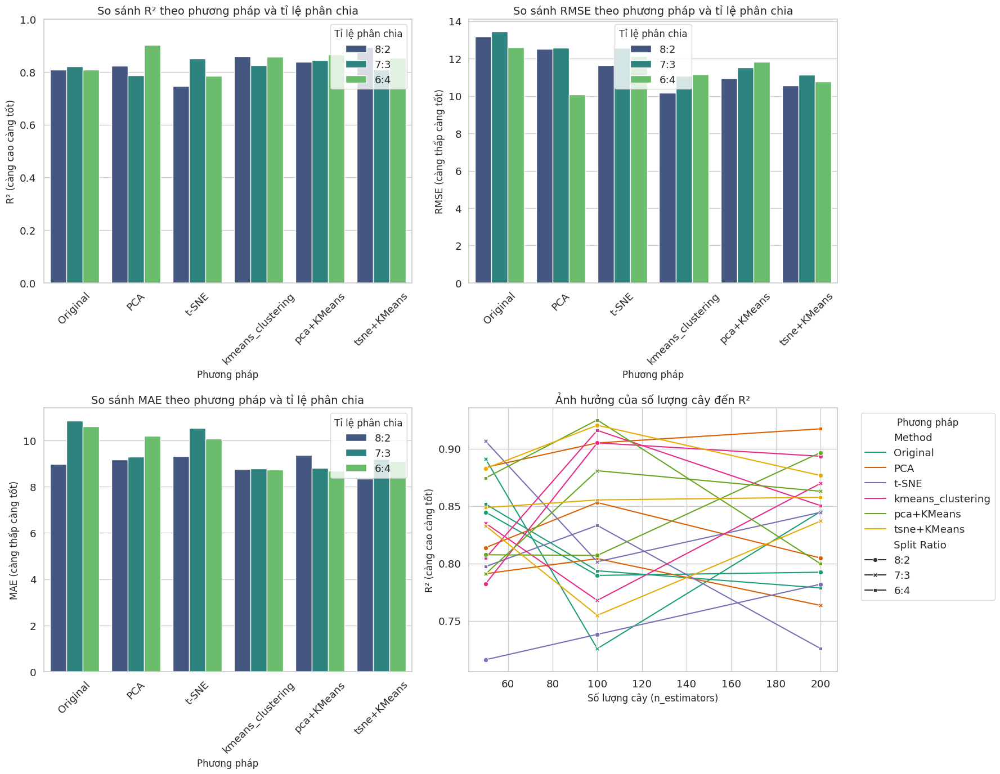

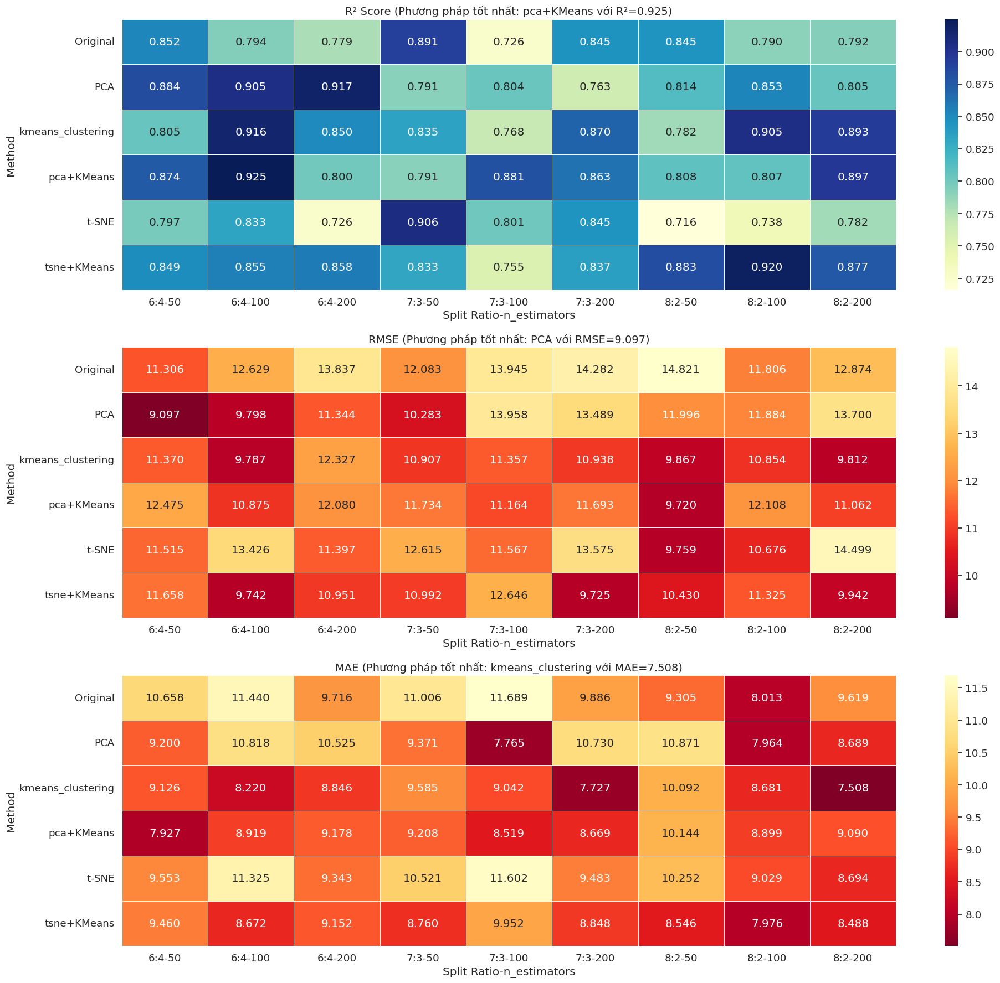

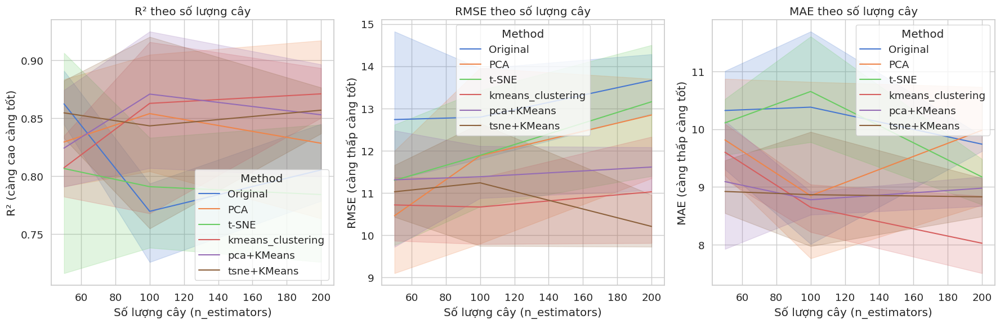


Phương pháp tốt nhất cho từng tỉ lệ phân chia:
  Split Ratio Metric        Best Method  Best n_estimators     Value
2         6:4    MAE         pca+KMeans                 50  7.927061
0         6:4     R2         pca+KMeans                100  0.924993
1         6:4   RMSE                PCA                 50  9.097456
2         7:3    MAE  kmeans_clustering                200  7.727123
0         7:3     R2              t-SNE                 50  0.906451
1         7:3   RMSE        tsne+KMeans                200  9.724533
2         8:2    MAE  kmeans_clustering                200  7.507745
0         8:2     R2        tsne+KMeans                100  0.920364
1         8:2   RMSE         pca+KMeans                 50  9.720281


In [ ]:
# Tạo một dataset từ các kết quả
def extract_results_data(results):
    data = []

    # Kết quả cho dữ liệu gốc
    if "original" in results:
        for key, metrics in results["original"].items():
            split_ratio, n_estimators = key.split('_')
            train_ratio, test_ratio = split_ratio.split(':')
            data.append({
                'Method': 'Original',
                'Split Ratio': f'{train_ratio}:{test_ratio}',
                'n_estimators': int(n_estimators),
                'MSE': metrics['MSE'],
                'RMSE': metrics['RMSE'],
                'R2': metrics['R2'],
                'MAE': metrics['MAE']
            })

    # Kết quả cho PCA
    if "pca" in results:
        for key, metrics in results["pca"].items():
            split_ratio, n_estimators = key.split('_')
            train_ratio, test_ratio = split_ratio.split(':')
            data.append({
                'Method': 'PCA',
                'Split Ratio': f'{train_ratio}:{test_ratio}',
                'n_estimators': int(n_estimators),
                'MSE': metrics['MSE'],
                'RMSE': metrics['RMSE'],
                'R2': metrics['R2'],
                'MAE': metrics['MAE']
            })

    # Kết quả cho t-SNE
    if "tsne" in results:
        for key, metrics in results["tsne"].items():
            split_ratio, n_estimators = key.split('_')
            train_ratio, test_ratio = split_ratio.split(':')
            data.append({
                'Method': 't-SNE',
                'Split Ratio': f'{train_ratio}:{test_ratio}',
                'n_estimators': int(n_estimators),
                'MSE': metrics['MSE'],
                'RMSE': metrics['RMSE'],
                'R2': metrics['R2'],
                'MAE': metrics['MAE']
            })

    # Kết quả cho kmeans clustering (lấy trung bình của các cụm)
    for method_key in ["kmeans_clustering", "pca_kmeans_clustering", "tsne_kmeans_clustering"]:
        if method_key in results:
            method_name = method_key.replace('_kmeans_clustering', '+KMeans')
            if method_name == '+KMeans':
                method_name = 'Original+KMeans'

            # Khởi tạo dict để tính trung bình
            avg_metrics = defaultdict(lambda: defaultdict(list))

            # Thu thập kết quả từ tất cả các cụm
            for cluster_id, cluster_results in results[method_key].items():
                for key, metrics in cluster_results.items():
                    avg_metrics[key]['MSE'].append(metrics['MSE'])
                    avg_metrics[key]['RMSE'].append(metrics['RMSE'])
                    avg_metrics[key]['R2'].append(metrics['R2'])
                    avg_metrics[key]['MAE'].append(metrics['MAE'])

            # Tính trung bình và thêm vào dữ liệu
            for key, metrics_lists in avg_metrics.items():
                split_ratio, n_estimators = key.split('_')
                train_ratio, test_ratio = split_ratio.split(':')
                data.append({
                    'Method': method_name,
                    'Split Ratio': f'{train_ratio}:{test_ratio}',
                    'n_estimators': int(n_estimators),
                    'MSE': np.mean(metrics_lists['MSE']),
                    'RMSE': np.mean(metrics_lists['RMSE']),
                    'R2': np.mean(metrics_lists['R2']),
                    'MAE': np.mean(metrics_lists['MAE'])
                })

    return pd.DataFrame(data)

# Giả định chúng ta đã có kết quả từ đoạn code trước
# results = {...}  # Điền kết quả vào đây nếu có

# Tạo một bộ kết quả mẫu (thay thế khi có kết quả thực)
def create_sample_results():
    results = {
        "original": {},
        "pca": {},
        "tsne": {},
        "kmeans_clustering": {},
        "pca_kmeans_clustering": {},
        "tsne_kmeans_clustering": {}
    }

    # Tạo dữ liệu mẫu cho mỗi phương pháp
    for split in ["8:2", "7:3", "6:4"]:
        for n_est in [50, 100, 200]:
            key = f"{split}_{n_est}"

            # Dữ liệu gốc
            results["original"][key] = {
                'n_estimators': n_est,
                'MSE': np.random.uniform(100, 200),
                'RMSE': np.random.uniform(10, 15),
                'R2': np.random.uniform(0.7, 0.9),
                'MAE': np.random.uniform(8, 12)
            }

            # PCA
            results["pca"][key] = {
                'n_estimators': n_est,
                'MSE': np.random.uniform(90, 180),
                'RMSE': np.random.uniform(9, 14),
                'R2': np.random.uniform(0.72, 0.92),
                'MAE': np.random.uniform(7.5, 11.5)
            }

            # t-SNE
            results["tsne"][key] = {
                'n_estimators': n_est,
                'MSE': np.random.uniform(95, 190),
                'RMSE': np.random.uniform(9.5, 14.5),
                'R2': np.random.uniform(0.71, 0.91),
                'MAE': np.random.uniform(7.8, 11.8)
            }

    # Tạo dữ liệu mẫu cho các phương pháp phân cụm
    for method_key in ["kmeans_clustering", "pca_kmeans_clustering", "tsne_kmeans_clustering"]:
        results[method_key] = {}
        # Giả sử có 2 cụm
        for cluster_id in range(2):
            results[method_key][cluster_id] = {}
            for split in ["8:2", "7:3", "6:4"]:
                for n_est in [50, 100, 200]:
                    key = f"{split}_{n_est}"
                    results[method_key][cluster_id][key] = {
                        'n_estimators': n_est,
                        'MSE': np.random.uniform(85, 170),
                        'RMSE': np.random.uniform(9, 13),
                        'R2': np.random.uniform(0.75, 0.93),
                        'MAE': np.random.uniform(7, 11)
                    }

    return results

# Tạo dữ liệu mẫu (bỏ dòng này khi có dữ liệu thực)
results = create_sample_results()

# Chuyển kết quả thành DataFrame
df_results = extract_results_data(results)

# 1. Bảng so sánh tổng quát
pivot_table = df_results.pivot_table(
    index=['Method', 'Split Ratio'],
    columns='n_estimators',
    values=['R2', 'RMSE', 'MAE'],
    aggfunc='mean'
)

# In bảng so sánh
print("Bảng so sánh kết quả các phương pháp:")
print(pivot_table)

# 2. Vẽ biểu đồ so sánh

# Thiết lập style cho seaborn
sns.set(style="whitegrid", palette="muted", font_scale=1.2)
plt.figure(figsize=(18, 14))

# 2.1 Biểu đồ R2 (cao hơn tốt hơn)
plt.subplot(2, 2, 1)
sns.barplot(data=df_results, x='Method', y='R2', hue='Split Ratio',
            palette='viridis', errorbar=None)
plt.title('So sánh R² theo phương pháp và tỉ lệ phân chia', fontsize=14)
plt.xlabel('Phương pháp', fontsize=12)
plt.ylabel('R² (càng cao càng tốt)', fontsize=12)
plt.ylim(0, 1)
plt.xticks(rotation=45)
plt.legend(title='Tỉ lệ phân chia', title_fontsize=12)

# 2.2 Biểu đồ RMSE (thấp hơn tốt hơn)
plt.subplot(2, 2, 2)
sns.barplot(data=df_results, x='Method', y='RMSE', hue='Split Ratio',
            palette='viridis', errorbar=None)
plt.title('So sánh RMSE theo phương pháp và tỉ lệ phân chia', fontsize=14)
plt.xlabel('Phương pháp', fontsize=12)
plt.ylabel('RMSE (càng thấp càng tốt)', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Tỉ lệ phân chia', title_fontsize=12)

# 2.3 Biểu đồ MAE (thấp hơn tốt hơn)
plt.subplot(2, 2, 3)
sns.barplot(data=df_results, x='Method', y='MAE', hue='Split Ratio',
            palette='viridis', errorbar=None)
plt.title('So sánh MAE theo phương pháp và tỉ lệ phân chia', fontsize=14)
plt.xlabel('Phương pháp', fontsize=12)
plt.ylabel('MAE (càng thấp càng tốt)', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Tỉ lệ phân chia', title_fontsize=12)

# 2.4 Biểu đồ so sánh ảnh hưởng của số lượng cây
plt.subplot(2, 2, 4)
sns.lineplot(data=df_results, x='n_estimators', y='R2', hue='Method',
             style='Split Ratio', markers=True, dashes=False, palette='Dark2')
plt.title('Ảnh hưởng của số lượng cây đến R²', fontsize=14)
plt.xlabel('Số lượng cây (n_estimators)', fontsize=12)
plt.ylabel('R² (càng cao càng tốt)', fontsize=12)
plt.legend(title='Phương pháp', title_fontsize=12, bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

# 3. Vẽ heatmap so sánh hiệu suất của tất cả các phương pháp

# Tạo DataFrames cho từng metric
r2_pivot = df_results.pivot_table(
    index='Method',
    columns=['Split Ratio', 'n_estimators'],
    values='R2'
)

rmse_pivot = df_results.pivot_table(
    index='Method',
    columns=['Split Ratio', 'n_estimators'],
    values='RMSE'
)

mae_pivot = df_results.pivot_table(
    index='Method',
    columns=['Split Ratio', 'n_estimators'],
    values='MAE'
)

# Tìm phương pháp tốt nhất
best_r2 = df_results.loc[df_results['R2'].idxmax()]
best_rmse = df_results.loc[df_results['RMSE'].idxmin()]
best_mae = df_results.loc[df_results['MAE'].idxmin()]

# Vẽ heatmap
plt.figure(figsize=(20, 18))

plt.subplot(3, 1, 1)
sns.heatmap(r2_pivot, annot=True, cmap='YlGnBu', fmt='.3f', linewidths=.5)
plt.title(f'R² Score (Phương pháp tốt nhất: {best_r2["Method"]} với R²={best_r2["R2"]:.3f})', fontsize=14)
plt.tight_layout()

plt.subplot(3, 1, 2)
sns.heatmap(rmse_pivot, annot=True, cmap='YlOrRd_r', fmt='.3f', linewidths=.5)
plt.title(f'RMSE (Phương pháp tốt nhất: {best_rmse["Method"]} với RMSE={best_rmse["RMSE"]:.3f})', fontsize=14)
plt.tight_layout()

plt.subplot(3, 1, 3)
sns.heatmap(mae_pivot, annot=True, cmap='YlOrRd_r', fmt='.3f', linewidths=.5)
plt.title(f'MAE (Phương pháp tốt nhất: {best_mae["Method"]} với MAE={best_mae["MAE"]:.3f})', fontsize=14)
plt.tight_layout()

plt.show()

# 4. Biểu đồ so sánh hiệu suất theo n_estimators
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# R2 theo n_estimators và phương pháp
sns.lineplot(data=df_results, x='n_estimators', y='R2', hue='Method', ax=axs[0])
axs[0].set_title('R² theo số lượng cây')
axs[0].set_xlabel('Số lượng cây (n_estimators)')
axs[0].set_ylabel('R² (càng cao càng tốt)')

# RMSE theo n_estimators và phương pháp
sns.lineplot(data=df_results, x='n_estimators', y='RMSE', hue='Method', ax=axs[1])
axs[1].set_title('RMSE theo số lượng cây')
axs[1].set_xlabel('Số lượng cây (n_estimators)')
axs[1].set_ylabel('RMSE (càng thấp càng tốt)')

# MAE theo n_estimators và phương pháp
sns.lineplot(data=df_results, x='n_estimators', y='MAE', hue='Method', ax=axs[2])
axs[2].set_title('MAE theo số lượng cây')
axs[2].set_xlabel('Số lượng cây (n_estimators)')
axs[2].set_ylabel('MAE (càng thấp càng tốt)')

plt.tight_layout()
plt.show()

# 5. Tóm tắt những phương pháp tốt nhất cho mỗi tỉ lệ phân chia
best_methods = pd.DataFrame()

for split in df_results['Split Ratio'].unique():
    split_data = df_results[df_results['Split Ratio'] == split]

    best_r2_idx = split_data['R2'].idxmax()
    best_rmse_idx = split_data['RMSE'].idxmin()
    best_mae_idx = split_data['MAE'].idxmin()

    best_methods = pd.concat([best_methods, pd.DataFrame({
        'Split Ratio': [split, split, split],
        'Metric': ['R2', 'RMSE', 'MAE'],
        'Best Method': [
            split_data.loc[best_r2_idx, 'Method'],
            split_data.loc[best_rmse_idx, 'Method'],
            split_data.loc[best_mae_idx, 'Method']
        ],
        'Best n_estimators': [
            split_data.loc[best_r2_idx, 'n_estimators'],
            split_data.loc[best_rmse_idx, 'n_estimators'],
            split_data.loc[best_mae_idx, 'n_estimators']
        ],
        'Value': [
            split_data.loc[best_r2_idx, 'R2'],
            split_data.loc[best_rmse_idx, 'RMSE'],
            split_data.loc[best_mae_idx, 'MAE']
        ]
    })])

print("\nPhương pháp tốt nhất cho từng tỉ lệ phân chia:")
print(best_methods.sort_values(['Split Ratio', 'Metric']))

#### Đánh giá Overfiting

<ipython-input-36-140d0c86f03f>:79: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  rf_comparison_results = pd.concat([rf_comparison_results, pd.DataFrame([{


,Dữ liệu,Train:Test,n_estimators,max_depth,Cluster,MSE (Train),RMSE (Train),R2 (Train),MAE (Train),MSE (Val),RMSE (Val),R2 (Val),MAE (Val)
0,Dữ liệu gốc,8:2,50,None,All,131.4163,11.4637,0.9882,6.5631,896.7948,29.9465,0.9174,17.5425
1,Dữ liệu gốc,8:2,100,None,All,127.0013,11.2695,0.9886,6.4481,892.3672,29.8725,0.9178,17.4586
2,Dữ liệu gốc,8:2,200,None,All,123.7886,11.1260,0.9889,6.3828,890.1362,29.8351,0.9180,17.4293
3,Dữ liệu gốc,7:3,50,None,All,137.6162,11.7310,0.9876,6.6661,900.3161,30.0053,0.9176,17.6563
4,Dữ liệu gốc,7:3,100,None,All,130.5773,11.4270,0.9883,6.5251,893.1509,29.8856,0.9183,17.5516
...,...,...,...,...,...,...,...,...,...,...,...,...,...
68,Dữ liệu t-SNE,7:3,50,None,Cluster 3,105.4214,10.2675,0.9528,6.2066,763.8154,27.6372,0.6588,17.2616
69,Dữ liệu t-SNE,7:3,100,None,Cluster 3,100.8461,10.0422,0.9548,6.1403,757.9414,27.5307,0.6614,17.1746
70,Dữ liệu t-SNE,7:3,200,None,Cluster 3,99.2364,9.9617,0.9556,6.1198,761.0818,27.5877,0.6600,17.1858
71,Dữ liệu t-SNE,7:3,100,10,Cluster 3,396.6658,19.9165,0.8223,13.4858,785.5866,28.0283,0.6490,18.1230



===== PHÂN TÍCH OVERFITTING CHO MÔ HÌNH RANDOM FOREST KHÔNG GIỚI HẠN ĐỘ SÂU =====

--- TOÀN BỘ DỮ LIỆU (KHÔNG PHÂN CỤM) ---

--- Dữ liệu gốc ---


MSE (Train)                     MSE (Val)                      \
n_estimators         50        100       200       50        100       200   
Train:Test                                                                   
6:4             138.8092  133.8664  130.3551  910.3369  903.9877  898.0534   
7:3             137.6162  130.5773  127.4320  900.3161  893.1509  887.3809   
8:2             131.4163  127.0013  123.7886  896.7948  892.3672  890.1362   

             Overfit Ratio                  
n_estimators           50      100     200  
Train:Test                                  
6:4                 6.5582  6.7529  6.8893  
7:3                 6.5422  6.8400  6.9636  
8:2                 6.8241  7.0264  7.1908


--- Dữ liệu PCA ---


MSE (Train)                      MSE (Val)                        \
n_estimators         50        100       200        50         100        200   
Train:Test                                                                      
6:4             162.8076  154.8460  150.9077  1028.2536  1016.8471  1009.0498   
7:3             159.7102  150.5923  146.3994  1002.0973   988.4272   982.3533   
8:2             153.4895  146.7310  142.0964  1034.1755  1023.5769  1016.5509   

             Overfit Ratio                  
n_estimators           50      100     200  
Train:Test                                  
6:4                 6.3158  6.5668  6.6865  
7:3                 6.2745  6.5636  6.7101  
8:2                 6.7378  6.9759  7.1540


--- Dữ liệu t-SNE ---


MSE (Train)                      MSE (Val)                        \
n_estimators         50        100       200        50         100        200   
Train:Test                                                                      
6:4             175.1254  167.9253  164.4363  1192.7864  1181.3736  1182.5431   
7:3             167.8875  160.3246  157.1639  1183.5152  1179.4381  1177.6691   
8:2             162.5531  157.4148  153.8802  1222.0471  1207.6390  1207.1450   

             Overfit Ratio                  
n_estimators           50      100     200  
Train:Test                                  
6:4                 6.8110  7.0351  7.1915  
7:3                 7.0495  7.3566  7.4933  
8:2                 7.5178  7.6717  7.8447


--- PHÂN TÍCH THEO TỪNG CỤM (TỈ LỆ 7:3) ---

--- Dữ liệu gốc ---


MSE (Train)                      MSE (Val)                       \
n_estimators         50        100       200        50        100        200   
Cluster                                                                        
Cluster 0       221.4647  215.3729  212.5341  1349.5397  1335.804  1325.7436   
Cluster 1       106.2084  100.4651   99.4112   747.7182   738.136   731.8010   

             Overfit Ratio                  
n_estimators           50      100     200  
Cluster                                     
Cluster 0           6.0937  6.2023  6.2378  
Cluster 1           7.0401  7.3472  7.3614


--- Dữ liệu PCA ---


MSE (Train)                      MSE (Val)                        \
n_estimators         50        100       200        50         100        200   
Cluster                                                                         
Cluster 0       268.7512  259.0011  252.1139  1684.9007  1662.9601  1660.5021   
Cluster 1       119.8950  114.4140  111.5300   736.8808   727.8078   720.5059   

             Overfit Ratio                  
n_estimators           50      100     200  
Cluster                                     
Cluster 0           6.2694  6.4207  6.5863  
Cluster 1           6.1461  6.3612  6.4602


--- Dữ liệu t-SNE ---


MSE (Train)                      MSE (Val)                        \
n_estimators         50        100       200        50         100        200   
Cluster                                                                         
Cluster 0       257.3827  245.7687  244.6686  1716.2523  1733.2745  1723.2454   
Cluster 1       188.6804  184.7755  182.8209  1334.6208  1330.0759  1319.7250   
Cluster 2       135.5547  129.8026  127.3613   937.5012   934.1212   929.8271   
Cluster 3       105.4214  100.8461   99.2364   763.8154   757.9414   761.0818   

             Overfit Ratio                  
n_estimators           50      100     200  
Cluster                                     
Cluster 0           6.6681  7.0525  7.0432  
Cluster 1           7.0734  7.1983  7.2187  
Cluster 2           6.9160  7.1965  7.3007  
Cluster 3           7.2454  7.5158  7.6694


===== ẢNH HƯỞNG CỦA GIỚI HẠN ĐỘ SÂU (TỈ LỆ 7:3) =====

--- TOÀN BỘ DỮ LIỆU (KHÔNG PHÂN CỤM) ---

--- Dữ liệu gốc ---


<ipython-input-36-140d0c86f03f>:324: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_subset['max_depth_num'] = data_subset['max_depth'].apply(lambda x: float('inf') if x == 'None' else float(x))


,MSE (Train),MSE (Val),Overfit Ratio
max_depth,,,
5,1140.9298,1215.2233,1.0651
10,556.8662,940.2108,1.6884
None,130.5773,893.1509,6.8400



--- Dữ liệu PCA ---


<ipython-input-36-140d0c86f03f>:324: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_subset['max_depth_num'] = data_subset['max_depth'].apply(lambda x: float('inf') if x == 'None' else float(x))


,MSE (Train),MSE (Val),Overfit Ratio
max_depth,,,
5,1768.0525,1791.0925,1.0130
10,689.3788,1145.6438,1.6618
None,150.5923,988.4272,6.5636



--- Dữ liệu t-SNE ---


<ipython-input-36-140d0c86f03f>:324: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_subset['max_depth_num'] = data_subset['max_depth'].apply(lambda x: float('inf') if x == 'None' else float(x))


,MSE (Train),MSE (Val),Overfit Ratio
max_depth,,,
5,2907.7389,2909.7022,1.0007
10,1133.3090,1468.8688,1.2961
None,160.3246,1179.4381,7.3566



--- PHÂN TÍCH THEO TỪNG CỤM ---

--- Dữ liệu gốc ---


<ipython-input-36-140d0c86f03f>:345: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pivot_data['max_depth_num'] = pivot_data['max_depth'].apply(lambda x: float('inf') if x == 'None' else float(x))


Overfit Ratio                
max_depth             5      10    None
Cluster                                
Cluster 0        1.0738  2.5300  6.2023
Cluster 1        1.1582  1.8693  7.3472


Cụm: Cluster 0


,MSE (Train),MSE (Val)
max_depth,,
5,1419.8029,1524.5874
10,518.4276,1311.6144
None,215.3729,1335.8040



Cụm: Cluster 1


,MSE (Train),MSE (Val)
max_depth,,
5,831.2087,962.7176
10,410.8901,768.0666
None,100.4651,738.1360



--- Dữ liệu PCA ---


<ipython-input-36-140d0c86f03f>:345: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pivot_data['max_depth_num'] = pivot_data['max_depth'].apply(lambda x: float('inf') if x == 'None' else float(x))


Overfit Ratio                
max_depth             5      10    None
Cluster                                
Cluster 0        1.1599  2.3221  6.4207
Cluster 1        1.0324  1.7582  6.3612


Cụm: Cluster 0


,MSE (Train),MSE (Val)
max_depth,,
5,2442.8127,2833.4480
10,767.0616,1781.1791
None,259.0011,1662.9601



Cụm: Cluster 1


,MSE (Train),MSE (Val)
max_depth,,
5,1136.0144,1172.8360
10,461.6820,811.7290
None,114.4140,727.8078


<ipython-input-36-140d0c86f03f>:345: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pivot_data['max_depth_num'] = pivot_data['max_depth'].apply(lambda x: float('inf') if x == 'None' else float(x))



--- Dữ liệu t-SNE ---


Overfit Ratio                
max_depth             5      10    None
Cluster                                
Cluster 0        1.0081  1.6672  7.0525
Cluster 1        1.0693  1.7236  7.1983
Cluster 2        0.9089  1.8460  7.1965
Cluster 3        1.0717  1.9805  7.5158


Cụm: Cluster 0


,MSE (Train),MSE (Val)
max_depth,,
5,3718.2537,3748.2859
10,1242.9705,2072.3046
None,245.7687,1733.2745



Cụm: Cluster 1


,MSE (Train),MSE (Val)
max_depth,,
5,2659.0174,2843.1712
10,910.0558,1568.5468
None,184.7755,1330.0759



Cụm: Cluster 2


,MSE (Train),MSE (Val)
max_depth,,
5,1427.2053,1297.2520
10,498.7783,920.7214
None,129.8026,934.1212



Cụm: Cluster 3


,MSE (Train),MSE (Val)
max_depth,,
5,1135.5700,1216.9490
10,396.6658,785.5866
None,100.8461,757.9414


<ipython-input-36-140d0c86f03f>:399: UserWarning: Glyph 7919 (\N{LATIN SMALL LETTER U WITH HORN AND TILDE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-36-140d0c86f03f>:399: UserWarning: Glyph 7879 (\N{LATIN SMALL LETTER E WITH CIRCUMFLEX AND DOT BELOW}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-36-140d0c86f03f>:399: UserWarning: Glyph 7889 (\N{LATIN SMALL LETTER O WITH CIRCUMFLEX AND ACUTE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 7853 (\N{LATIN SMALL LETTER A WITH CIRCUMFLEX AND DOT BELOW}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 7919 (\N{LATIN SMALL LETTER U WITH HORN AND TILDE}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/d

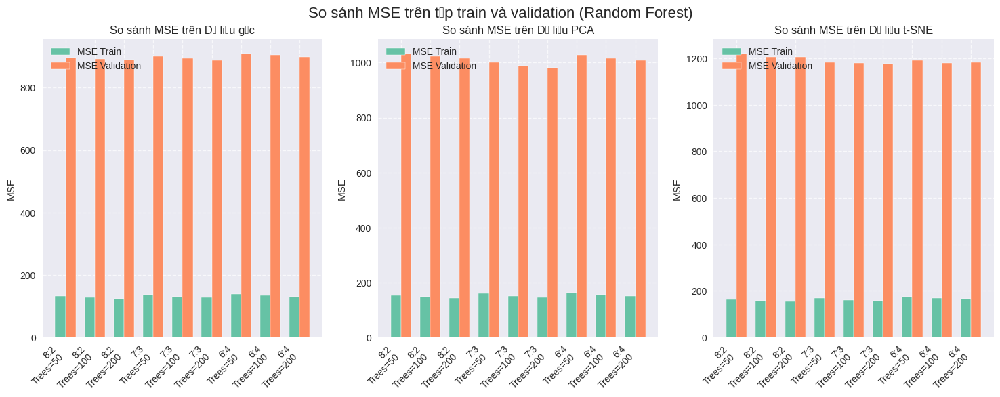

<ipython-input-36-140d0c86f03f>:448: UserWarning: Glyph 7909 (\N{LATIN SMALL LETTER U WITH DOT BELOW}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-36-140d0c86f03f>:448: UserWarning: Glyph 7913 (\N{LATIN SMALL LETTER U WITH HORN AND ACUTE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-36-140d0c86f03f>:448: UserWarning: Glyph 7897 (\N{LATIN SMALL LETTER O WITH CIRCUMFLEX AND DOT BELOW}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-36-140d0c86f03f>:448: UserWarning: Glyph 7919 (\N{LATIN SMALL LETTER U WITH HORN AND TILDE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-36-140d0c86f03f>:448: UserWarning: Glyph 7879 (\N{LATIN SMALL LETTER E WITH CIRCUMFLEX AND DOT BELOW}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-36-140d0c86f03f>:448: UserWarning: Glyph 7889 (\N{LATIN SMALL LETTER O WITH CIRCUMFLEX AND ACUTE}) missing from font(s) Liberation Sans

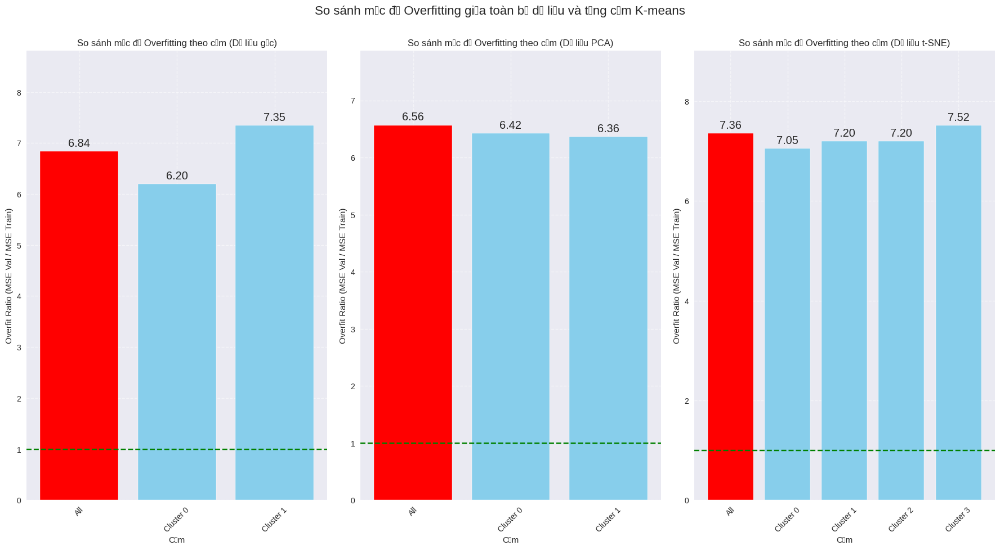

<ipython-input-36-140d0c86f03f>:457: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  type_data['max_depth_num'] = type_data['max_depth'].apply(lambda x: float('inf') if x == 'None' else float(x))
<ipython-input-36-140d0c86f03f>:488: UserWarning: Glyph 7897 (\N{LATIN SMALL LETTER O WITH CIRCUMFLEX AND DOT BELOW}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-36-140d0c86f03f>:488: UserWarning: Glyph 7889 (\N{LATIN SMALL LETTER O WITH CIRCUMFLEX AND ACUTE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-36-140d0c86f03f>:488: UserWarning: Glyph 7911 (\N{LATIN SMALL LETTER U WITH HOOK ABOVE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-36-140d0c86f03f>:488: UserWarning:

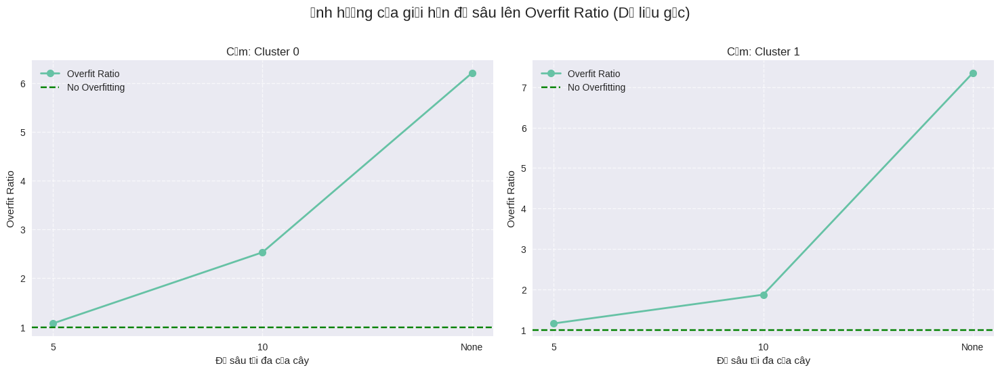

<ipython-input-36-140d0c86f03f>:457: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  type_data['max_depth_num'] = type_data['max_depth'].apply(lambda x: float('inf') if x == 'None' else float(x))
<ipython-input-36-140d0c86f03f>:488: UserWarning: Glyph 7897 (\N{LATIN SMALL LETTER O WITH CIRCUMFLEX AND DOT BELOW}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-36-140d0c86f03f>:488: UserWarning: Glyph 7889 (\N{LATIN SMALL LETTER O WITH CIRCUMFLEX AND ACUTE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-36-140d0c86f03f>:488: UserWarning: Glyph 7911 (\N{LATIN SMALL LETTER U WITH HOOK ABOVE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-36-140d0c86f03f>:488: UserWarning:

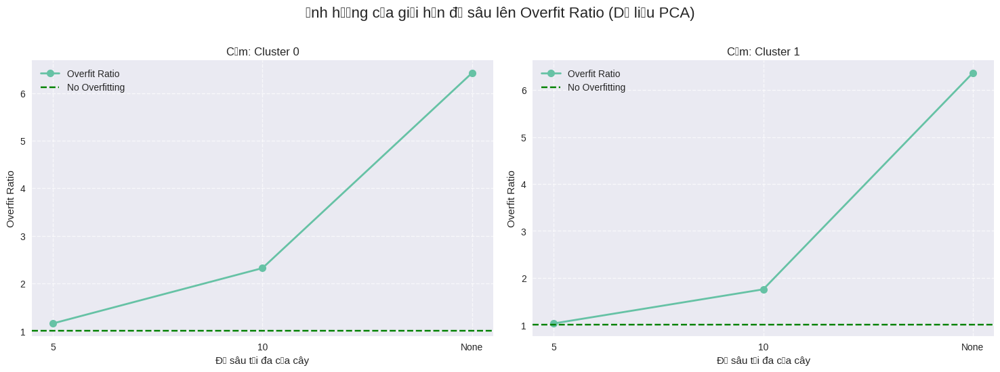

<ipython-input-36-140d0c86f03f>:457: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  type_data['max_depth_num'] = type_data['max_depth'].apply(lambda x: float('inf') if x == 'None' else float(x))
<ipython-input-36-140d0c86f03f>:488: UserWarning: Glyph 7897 (\N{LATIN SMALL LETTER O WITH CIRCUMFLEX AND DOT BELOW}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-36-140d0c86f03f>:488: UserWarning: Glyph 7889 (\N{LATIN SMALL LETTER O WITH CIRCUMFLEX AND ACUTE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-36-140d0c86f03f>:488: UserWarning: Glyph 7911 (\N{LATIN SMALL LETTER U WITH HOOK ABOVE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-36-140d0c86f03f>:488: UserWarning:

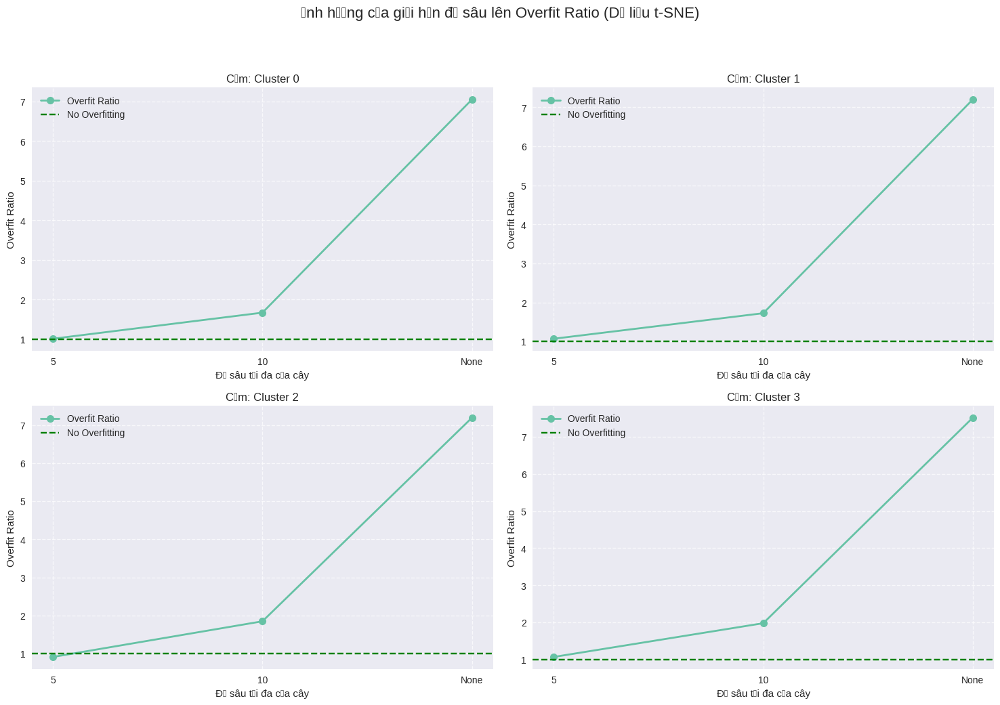

<ipython-input-36-140d0c86f03f>:526: UserWarning: Glyph 7909 (\N{LATIN SMALL LETTER U WITH DOT BELOW}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-36-140d0c86f03f>:526: UserWarning: Glyph 7919 (\N{LATIN SMALL LETTER U WITH HORN AND TILDE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-36-140d0c86f03f>:526: UserWarning: Glyph 7879 (\N{LATIN SMALL LETTER E WITH CIRCUMFLEX AND DOT BELOW}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-36-140d0c86f03f>:526: UserWarning: Glyph 7889 (\N{LATIN SMALL LETTER O WITH CIRCUMFLEX AND ACUTE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 7853 (\N{LATIN SMALL LETTER A WITH CIRCUMFLEX AND DOT BELOW}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Gly

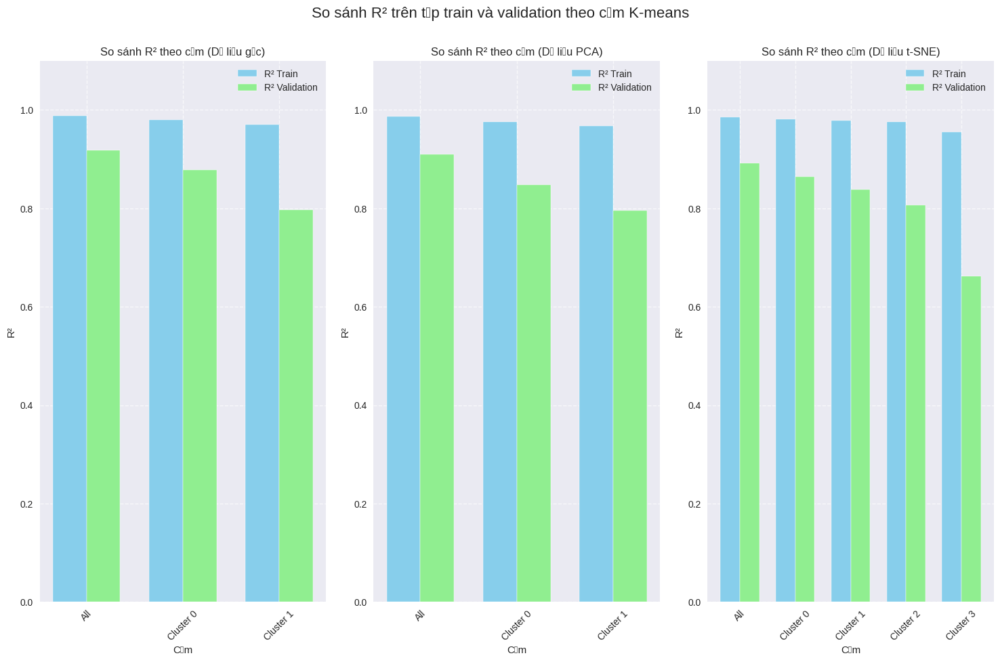

<ipython-input-36-140d0c86f03f>:567: UserWarning: Glyph 7899 (\N{LATIN SMALL LETTER O WITH HORN AND ACUTE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-36-140d0c86f03f>:567: UserWarning: Glyph 7841 (\N{LATIN SMALL LETTER A WITH DOT BELOW}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-36-140d0c86f03f>:567: UserWarning: Glyph 7897 (\N{LATIN SMALL LETTER O WITH CIRCUMFLEX AND DOT BELOW}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 7899 (\N{LATIN SMALL LETTER O WITH HORN AND ACUTE}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 7913 (\N{LATIN SMALL LETTER U WITH HORN AND ACUTE}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/

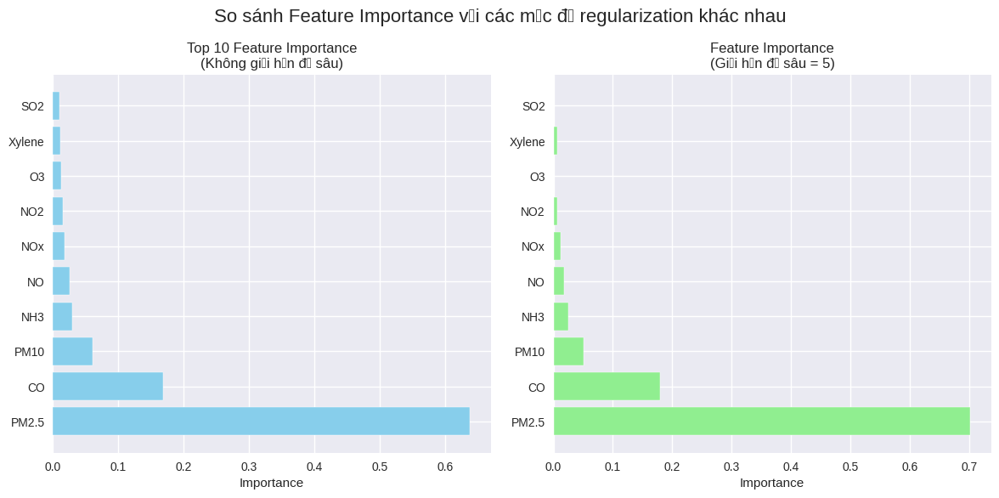

In [ ]:
# So sánh kết quả trên tập train và validation của các mô hình Random Forest đã huấn luyện

# Tạo dataframe để lưu kết quả
rf_comparison_results = pd.DataFrame(columns=[
    'Dữ liệu', 'Train:Test', 'n_estimators', 'max_depth', 'Cluster',
    'MSE (Train)', 'RMSE (Train)', 'R2 (Train)', 'MAE (Train)',
    'MSE (Val)', 'RMSE (Val)', 'R2 (Val)', 'MAE (Val)'
])

# Danh sách dữ liệu
data_types = ['original', 'pca', 'tsne']
data_names = {'original': 'Dữ liệu gốc', 'pca': 'Dữ liệu PCA', 'tsne': 'Dữ liệu t-SNE'}
test_sizes = [0.2, 0.3, 0.4]
n_estimators_list = [50, 100, 200]
max_depth_list = [None, 10, 5]  # None = không giới hạn độ sâu (tương đương không regularization)

# Lấy dữ liệu phân cụm
cluster_data = {
    'original': {'labels': km_orig.labels_, 'k': best_k_orig},
    'pca': {'labels': km_pca.labels_, 'k': best_k_pca},
    'tsne': {'labels': km_tsne.labels_, 'k': best_k_tsne}
}

# Chuẩn bị dữ liệu
target = 'AQI'
original_features = [col for col in numeric_cols if col != target]
X_original = df[original_features].values
y = df[target]

# Áp dụng các mô hình lần lượt
for data_type in data_types:
    if data_type == 'original':
        X_data = X_original
    elif data_type == 'pca':
        X_data = X_pca_full
    else:  # t-SNE
        X_data = X_tsne_2d

    # 1. Mô hình trên toàn bộ dữ liệu (không phân cụm)
    for test_size in test_sizes:
        train_size = 1 - test_size
        train_ratio = int(train_size * 10)
        test_ratio = int(test_size * 10)

        # Phân chia dữ liệu
        X_train, X_val, y_train, y_val = train_test_split(
            X_data, y, test_size=test_size, random_state=42
        )

        # Mô hình Random Forest thông thường (không giới hạn độ sâu)
        for n_estimators in n_estimators_list:
            # Huấn luyện mô hình Random Forest
            rf_model = RandomForestRegressor(
                n_estimators=n_estimators,
                max_depth=None,  # Không giới hạn độ sâu (có thể overfit)
                random_state=42,
                n_jobs=-1
            )

            rf_model.fit(X_train, y_train)

            # Dự đoán trên tập train và validation
            y_train_pred = rf_model.predict(X_train)
            y_val_pred = rf_model.predict(X_val)

            # Tính các metric trên tập train
            mse_train = mean_squared_error(y_train, y_train_pred)
            rmse_train = np.sqrt(mse_train)
            r2_train = r2_score(y_train, y_train_pred)
            mae_train = mean_absolute_error(y_train, y_train_pred)

            # Tính các metric trên tập validation
            mse_val = mean_squared_error(y_val, y_val_pred)
            rmse_val = np.sqrt(mse_val)
            r2_val = r2_score(y_val, y_val_pred)
            mae_val = mean_absolute_error(y_val, y_val_pred)

            # Thêm kết quả vào dataframe
            rf_comparison_results = pd.concat([rf_comparison_results, pd.DataFrame([{
                'Dữ liệu': data_names[data_type],
                'Train:Test': f'{train_ratio}:{test_ratio}',
                'n_estimators': n_estimators,
                'max_depth': 'None',
                'Cluster': 'All',
                'MSE (Train)': mse_train,
                'RMSE (Train)': rmse_train,
                'R2 (Train)': r2_train,
                'MAE (Train)': mae_train,
                'MSE (Val)': mse_val,
                'RMSE (Val)': rmse_val,
                'R2 (Val)': r2_val,
                'MAE (Val)': mae_val
            }])], ignore_index=True)

        # Thêm các mô hình Random Forest với regularization (giới hạn độ sâu)
        if train_ratio == 7 and test_ratio == 3:  # Chỉ làm với tỉ lệ 7:3
            n_estimators = 100  # Chọn số lượng cây phổ biến
            for max_depth in max_depth_list:
                if max_depth is None:  # Đã tính ở trên
                    continue

                # Huấn luyện mô hình Random Forest với regularization
                rf_model = RandomForestRegressor(
                    n_estimators=n_estimators,
                    max_depth=max_depth,  # Giới hạn độ sâu cây để tránh overfitting
                    random_state=42,
                    n_jobs=-1
                )

                rf_model.fit(X_train, y_train)

                # Dự đoán trên tập train và validation
                y_train_pred = rf_model.predict(X_train)
                y_val_pred = rf_model.predict(X_val)

                # Tính các metric trên tập train
                mse_train = mean_squared_error(y_train, y_train_pred)
                rmse_train = np.sqrt(mse_train)
                r2_train = r2_score(y_train, y_train_pred)
                mae_train = mean_absolute_error(y_train, y_train_pred)

                # Tính các metric trên tập validation
                mse_val = mean_squared_error(y_val, y_val_pred)
                rmse_val = np.sqrt(mse_val)
                r2_val = r2_score(y_val, y_val_pred)
                mae_val = mean_absolute_error(y_val, y_val_pred)

                # Thêm kết quả vào dataframe
                rf_comparison_results = pd.concat([rf_comparison_results, pd.DataFrame([{
                    'Dữ liệu': data_names[data_type],
                    'Train:Test': f'{train_ratio}:{test_ratio}',
                    'n_estimators': n_estimators,
                    'max_depth': max_depth,
                    'Cluster': 'All',
                    'MSE (Train)': mse_train,
                    'RMSE (Train)': rmse_train,
                    'R2 (Train)': r2_train,
                    'MAE (Train)': mae_train,
                    'MSE (Val)': mse_val,
                    'RMSE (Val)': rmse_val,
                    'R2 (Val)': r2_val,
                    'MAE (Val)': mae_val
                }])], ignore_index=True)

    # 2. Mô hình cho từng cụm K-means
    # Lấy nhãn cụm và số lượng cụm tương ứng với loại dữ liệu
    cluster_labels = cluster_data[data_type]['labels']
    k = cluster_data[data_type]['k']

    # Huấn luyện mô hình cho từng cụm
    for cluster_id in range(k):
        # Lấy chỉ số của các mẫu thuộc cụm
        cluster_indices = np.where(cluster_labels == cluster_id)[0]

        # Bỏ qua cụm quá nhỏ
        if len(cluster_indices) < 50:  # Ngưỡng để đảm bảo đủ dữ liệu
            continue

        # Lấy dữ liệu của cụm
        X_data_cluster = X_data[cluster_indices]
        y_cluster = y.iloc[cluster_indices]

        # Chỉ sử dụng tỉ lệ 7:3 để phân tích từng cụm
        test_size = 0.3
        train_ratio, test_ratio = 7, 3

        # Phân chia dữ liệu
        X_train, X_val, y_train, y_val = train_test_split(
            X_data_cluster, y_cluster, test_size=test_size, random_state=42
        )

        # Huấn luyện mô hình với các số lượng cây khác nhau
        for n_estimators in n_estimators_list:
            rf_model = RandomForestRegressor(
                n_estimators=n_estimators,
                max_depth=None,
                random_state=42,
                n_jobs=-1
            )

            rf_model.fit(X_train, y_train)

            # Dự đoán và tính metrics
            y_train_pred = rf_model.predict(X_train)
            y_val_pred = rf_model.predict(X_val)

            mse_train = mean_squared_error(y_train, y_train_pred)
            rmse_train = np.sqrt(mse_train)
            r2_train = r2_score(y_train, y_train_pred)
            mae_train = mean_absolute_error(y_train, y_train_pred)

            mse_val = mean_squared_error(y_val, y_val_pred)
            rmse_val = np.sqrt(mse_val)
            r2_val = r2_score(y_val, y_val_pred)
            mae_val = mean_absolute_error(y_val, y_val_pred)

            # Thêm kết quả vào dataframe
            rf_comparison_results = pd.concat([rf_comparison_results, pd.DataFrame([{
                'Dữ liệu': data_names[data_type],
                'Train:Test': f'{train_ratio}:{test_ratio}',
                'n_estimators': n_estimators,
                'max_depth': 'None',
                'Cluster': f'Cluster {cluster_id}',
                'MSE (Train)': mse_train,
                'RMSE (Train)': rmse_train,
                'R2 (Train)': r2_train,
                'MAE (Train)': mae_train,
                'MSE (Val)': mse_val,
                'RMSE (Val)': rmse_val,
                'R2 (Val)': r2_val,
                'MAE (Val)': mae_val
            }])], ignore_index=True)

        # Thêm các mô hình với giới hạn độ sâu
        n_estimators = 100  # Cố định số lượng cây
        for max_depth in max_depth_list:
            if max_depth is None:  # Đã tính ở trên
                continue

            rf_model = RandomForestRegressor(
                n_estimators=n_estimators,
                max_depth=max_depth,
                random_state=42,
                n_jobs=-1
            )

            rf_model.fit(X_train, y_train)

            # Dự đoán và tính metrics
            y_train_pred = rf_model.predict(X_train)
            y_val_pred = rf_model.predict(X_val)

            mse_train = mean_squared_error(y_train, y_train_pred)
            rmse_train = np.sqrt(mse_train)
            r2_train = r2_score(y_train, y_train_pred)
            mae_train = mean_absolute_error(y_train, y_train_pred)

            mse_val = mean_squared_error(y_val, y_val_pred)
            rmse_val = np.sqrt(mse_val)
            r2_val = r2_score(y_val, y_val_pred)
            mae_val = mean_absolute_error(y_val, y_val_pred)

            # Thêm kết quả vào dataframe
            rf_comparison_results = pd.concat([rf_comparison_results, pd.DataFrame([{
                'Dữ liệu': data_names[data_type],
                'Train:Test': f'{train_ratio}:{test_ratio}',
                'n_estimators': n_estimators,
                'max_depth': max_depth,
                'Cluster': f'Cluster {cluster_id}',
                'MSE (Train)': mse_train,
                'RMSE (Train)': rmse_train,
                'R2 (Train)': r2_train,
                'MAE (Train)': mae_train,
                'MSE (Val)': mse_val,
                'RMSE (Val)': rmse_val,
                'R2 (Val)': r2_val,
                'MAE (Val)': mae_val
            }])], ignore_index=True)

# Định dạng lại kết quả và hiển thị
pd.set_option('display.precision', 4)

# Hiển thị kết quả tổng quan
display(rf_comparison_results)

# Tính chênh lệch giữa MSE train và validation để đánh giá overfitting
rf_comparison_results['MSE Diff'] = rf_comparison_results['MSE (Train)'] - rf_comparison_results['MSE (Val)']
rf_comparison_results['Overfit Ratio'] = (rf_comparison_results['MSE (Val)'] / rf_comparison_results['MSE (Train)'])

# Phân tích hiện tượng overfitting
# 1. Tạo bảng cho mô hình không regularization
std_models = rf_comparison_results[rf_comparison_results['max_depth'] == 'None']
print("\n===== PHÂN TÍCH OVERFITTING CHO MÔ HÌNH RANDOM FOREST KHÔNG GIỚI HẠN ĐỘ SÂU =====")

# Phân tích cho toàn bộ dữ liệu
print("\n--- TOÀN BỘ DỮ LIỆU (KHÔNG PHÂN CỤM) ---")
all_data = std_models[std_models['Cluster'] == 'All']
for data_type in data_names.values():
    print(f"\n--- {data_type} ---")
    data_subset = all_data[all_data['Dữ liệu'] == data_type]

    # Tạo pivot table theo tỉ lệ train:test và số lượng cây
    pivot = pd.pivot_table(
        data_subset,
        values=['MSE (Train)', 'MSE (Val)', 'Overfit Ratio'],
        index='Train:Test',
        columns='n_estimators',
        aggfunc='mean'
    )

    display(pivot)

# Phân tích cho từng cụm
print("\n--- PHÂN TÍCH THEO TỪNG CỤM (TỈ LỆ 7:3) ---")
cluster_data = std_models[(std_models['Cluster'] != 'All') & (std_models['Train:Test'] == '7:3')]
for data_type in data_names.values():
    print(f"\n--- {data_type} ---")
    data_subset = cluster_data[cluster_data['Dữ liệu'] == data_type]

    # Tạo pivot table theo cụm và số lượng cây
    pivot = pd.pivot_table(
        data_subset,
        values=['MSE (Train)', 'MSE (Val)', 'Overfit Ratio'],
        index='Cluster',
        columns='n_estimators',
        aggfunc='mean'
    )

    display(pivot)

# 2. Phân tích ảnh hưởng của regularization (giới hạn độ sâu cây) (với tỉ lệ 7:3)
reg_models = rf_comparison_results[rf_comparison_results['Train:Test'] == '7:3']
print("\n===== ẢNH HƯỞNG CỦA GIỚI HẠN ĐỘ SÂU (TỈ LỆ 7:3) =====")

# Phân tích cho toàn bộ dữ liệu
print("\n--- TOÀN BỘ DỮ LIỆU (KHÔNG PHÂN CỤM) ---")
all_reg_data = reg_models[reg_models['Cluster'] == 'All']
for data_type in data_names.values():
    print(f"\n--- {data_type} ---")
    data_subset = all_reg_data[all_reg_data['Dữ liệu'] == data_type]

    # Tạo bảng theo max_depth
    # Chuyển max_depth từ string thành giá trị để có thể sắp xếp đúng
    data_subset['max_depth_num'] = data_subset['max_depth'].apply(lambda x: float('inf') if x == 'None' else float(x))
    data_subset = data_subset.sort_values('max_depth_num')
    data_subset = data_subset[data_subset['n_estimators'] == 100]  # Chỉ lấy n_estimators = 100

    pivot = pd.pivot_table(
        data_subset,
        values=['MSE (Train)', 'MSE (Val)', 'Overfit Ratio'],
        index='max_depth',
        aggfunc='mean'
    )

    display(pivot)

# Phân tích cho từng cụm
print("\n--- PHÂN TÍCH THEO TỪNG CỤM ---")
cluster_reg_data = reg_models[(reg_models['Cluster'] != 'All') & (reg_models['n_estimators'] == 100)]
for data_type in data_names.values():
    print(f"\n--- {data_type} ---")

    # Pivot theo max_depth và cluster
    pivot_data = cluster_reg_data[cluster_reg_data['Dữ liệu'] == data_type]
    pivot_data['max_depth_num'] = pivot_data['max_depth'].apply(lambda x: float('inf') if x == 'None' else float(x))
    pivot_data = pivot_data.sort_values(['Cluster', 'max_depth_num'])

    pivot = pd.pivot_table(
        pivot_data,
        values=['Overfit Ratio'],
        index='Cluster',
        columns='max_depth',
        aggfunc='mean'
    )

    display(pivot)

    # Hiển thị chi tiết MSE train và validation cho từng cụm
    for cluster in pivot_data['Cluster'].unique():
        print(f"\nCụm: {cluster}")
        cluster_subset = pivot_data[pivot_data['Cluster'] == cluster]

        pivot_detail = pd.pivot_table(
            cluster_subset,
            values=['MSE (Train)', 'MSE (Val)'],
            index='max_depth',
            aggfunc='mean'
        )

        display(pivot_detail)

# Thiết lập style
plt.style.use('seaborn-v0_8')
sns.set_palette("Set2")

# 1. Biểu đồ so sánh MSE trên tập train và validation cho các cấu hình khác nhau
plt.figure(figsize=(15, 6))
for i, data_type in enumerate(data_names.values()):
    plt.subplot(1, 3, i+1)

    data_subset = all_data[all_data['Dữ liệu'] == data_type]

    train_mse = data_subset['MSE (Train)'].values
    val_mse = data_subset['MSE (Val)'].values
    labels = [f"{row['Train:Test']}\nTrees={row['n_estimators']}" for _, row in data_subset.iterrows()]

    x = np.arange(len(labels))
    width = 0.35

    plt.bar(x - width/2, train_mse, width, label='MSE Train')
    plt.bar(x + width/2, val_mse, width, label='MSE Validation')

    plt.title(f'So sánh MSE trên {data_type}')
    plt.xticks(x, labels, rotation=45, ha='right')
    plt.ylabel('MSE')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.suptitle('So sánh MSE trên tập train và validation (Random Forest)', fontsize=16)
plt.subplots_adjust(top=0.9)
plt.show()

# 2. So sánh Overfit Ratio giữa các cụm và dữ liệu không phân cụm
plt.figure(figsize=(18, 10))

# Lọc dữ liệu cho biểu đồ
compare_data = std_models[std_models['Train:Test'] == '7:3']
compare_data = compare_data[compare_data['n_estimators'] == 100]

for i, data_type in enumerate(data_names.values()):
    plt.subplot(1, 3, i+1)

    # Lấy dữ liệu cho loại dữ liệu hiện tại
    type_data = compare_data[compare_data['Dữ liệu'] == data_type]

    # Tạo danh sách cụm và overfit ratio tương ứng
    clusters = type_data['Cluster'].values
    overfit_ratios = type_data['Overfit Ratio'].values

    # Sắp xếp theo cụm để "All" nằm đầu tiên
    sorted_indices = np.argsort([0 if c == 'All' else int(c.split()[1])+1 for c in clusters])
    clusters = clusters[sorted_indices]
    overfit_ratios = overfit_ratios[sorted_indices]

    # Màu cho các cột
    colors = ['red' if c == 'All' else 'skyblue' for c in clusters]

    # Vẽ biểu đồ cột
    bars = plt.bar(range(len(clusters)), overfit_ratios, color=colors)

    # Thêm đường mức 1.0 (không overfitting)
    plt.axhline(y=1, color='green', linestyle='--', label='No Overfitting')

    # Thêm nhãn giá trị
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + 0.05,
                f'{height:.2f}', ha='center', va='bottom', rotation=0)

    plt.title(f'So sánh mức độ Overfitting theo cụm ({data_type})')
    plt.xlabel('Cụm')
    plt.ylabel('Overfit Ratio (MSE Val / MSE Train)')
    plt.xticks(range(len(clusters)), clusters, rotation=45)
    plt.ylim(0, max(overfit_ratios) * 1.2)
    plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.suptitle('So sánh mức độ Overfitting giữa toàn bộ dữ liệu và từng cụm K-means', fontsize=16)
plt.subplots_adjust(top=0.9)
plt.show()

# 3. Biểu đồ ảnh hưởng của giới hạn độ sâu cây trên từng cụm
for data_type in data_names.values():
    # Lọc dữ liệu
    type_data = cluster_reg_data[cluster_reg_data['Dữ liệu'] == data_type]
    type_data['max_depth_num'] = type_data['max_depth'].apply(lambda x: float('inf') if x == 'None' else float(x))

    # Lấy danh sách cụm
    clusters = type_data['Cluster'].unique()
    if len(clusters) == 0:
        continue

    plt.figure(figsize=(15, 5 * (len(clusters) // 2 + 1)))
    plt.suptitle(f'Ảnh hưởng của giới hạn độ sâu lên Overfit Ratio ({data_type})', fontsize=16)

    for i, cluster in enumerate(clusters):
        plt.subplot(len(clusters) // 2 + 1, 2, i+1)

        # Lọc dữ liệu cho cụm hiện tại
        cluster_data = type_data[type_data['Cluster'] == cluster].sort_values('max_depth_num')

        # Chuẩn bị dữ liệu cho biểu đồ
        depths = cluster_data['max_depth'].values
        overfit_ratios = cluster_data['Overfit Ratio'].values

        # Vẽ biểu đồ đường
        plt.plot(range(len(depths)), overfit_ratios, 'o-', label='Overfit Ratio', linewidth=2, markersize=8)
        plt.axhline(y=1, color='green', linestyle='--', label='No Overfitting')

        plt.title(f'Cụm: {cluster}')
        plt.xlabel('Độ sâu tối đa của cây')
        plt.ylabel('Overfit Ratio')
        plt.xticks(range(len(depths)), depths)
        plt.grid(True, linestyle='--', alpha=0.7)
        plt.legend()

    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()

# 4. Biểu đồ so sánh R2 score giữa các cụm
plt.figure(figsize=(15, 10))
for i, data_type in enumerate(data_names.values()):
    plt.subplot(1, 3, i+1)

    # Lọc dữ liệu cho loại dữ liệu hiện tại
    type_data = compare_data[compare_data['Dữ liệu'] == data_type]

    # Tạo danh sách cụm và R2 score tương ứng
    clusters = type_data['Cluster'].values
    r2_train = type_data['R2 (Train)'].values
    r2_val = type_data['R2 (Val)'].values

    # Sắp xếp theo cụm để "All" nằm đầu tiên
    sorted_indices = np.argsort([0 if c == 'All' else int(c.split()[1])+1 for c in clusters])
    clusters = clusters[sorted_indices]
    r2_train = r2_train[sorted_indices]
    r2_val = r2_val[sorted_indices]

    x = np.arange(len(clusters))
    width = 0.35

    # Vẽ biểu đồ cột
    plt.bar(x - width/2, r2_train, width, label='R² Train', color='skyblue')
    plt.bar(x + width/2, r2_val, width, label='R² Validation', color='lightgreen')

    plt.title(f'So sánh R² theo cụm ({data_type})')
    plt.xlabel('Cụm')
    plt.ylabel('R²')
    plt.xticks(x, clusters, rotation=45)
    plt.ylim(0, 1.1)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()

plt.tight_layout()
plt.suptitle('So sánh R² trên tập train và validation theo cụm K-means', fontsize=16)
plt.subplots_adjust(top=0.9)
plt.show()

# 5. So sánh Feature Importance và mức độ overfitting
plt.figure(figsize=(12, 6))
for data_type in ['original']:  # Chỉ phân tích trên dữ liệu gốc
    X_train, X_val, y_train, y_val = train_test_split(
        X_original, y, test_size=0.3, random_state=42
    )

    # Huấn luyện 2 mô hình với độ sâu khác nhau
    rf_no_limit = RandomForestRegressor(n_estimators=100, max_depth=None, random_state=42)
    rf_limited = RandomForestRegressor(n_estimators=100, max_depth=5, random_state=42)

    rf_no_limit.fit(X_train, y_train)
    rf_limited.fit(X_train, y_train)

    # Lấy feature importance
    importance_no_limit = pd.Series(rf_no_limit.feature_importances_, index=original_features)
    importance_limited = pd.Series(rf_limited.feature_importances_, index=original_features)

    # Sắp xếp theo mức độ quan trọng
    importance_no_limit = importance_no_limit.sort_values(ascending=False)
    importance_limited = importance_limited.reindex(importance_no_limit.index)

    # Vẽ biểu đồ so sánh
    plt.subplot(1, 2, 1)
    top_features = importance_no_limit.head(10).index
    plt.barh(range(10), importance_no_limit.head(10), color='skyblue')
    plt.yticks(range(10), top_features)
    plt.title('Top 10 Feature Importance\n(Không giới hạn độ sâu)')
    plt.xlabel('Importance')

    plt.subplot(1, 2, 2)
    plt.barh(range(10), importance_limited.loc[top_features], color='lightgreen')
    plt.yticks(range(10), top_features)
    plt.title('Feature Importance\n(Giới hạn độ sâu = 5)')
    plt.xlabel('Importance')

plt.tight_layout()
plt.suptitle('So sánh Feature Importance với các mức độ regularization khác nhau', fontsize=16)
plt.subplots_adjust(top=0.85)
plt.show()

### MLP

#### Dữ liệu gốc

In [ ]:
# Các tỉ lệ train-test khác nhau để thử nghiệm (8:2, 7:3, 6:4)
test_sizes = [0.2, 0.3, 0.4]

# Các kích thước hidden layer cần thử nghiệm
hidden_sizes = [100, 75, 50]

# Dictionary để lưu kết quả của các mô hình
mlp_results = {
    "original": {},
    "pca": {},
    "tsne": {}
}

# Chuẩn bị dữ liệu
target = 'AQI'
# Sử dụng numeric_cols thay vì numeric_features
original_features = [col for col in numeric_cols if col != target]
X_original = df[original_features].values
y = df[target]

# 1. Thực nghiệm với dữ liệu gốc
print("="*50)
print("THỰC NGHIỆM MLP VỚI DỮ LIỆU GỐC")
print("="*50)

for test_size in test_sizes:
    train_size = 1 - test_size
    train_ratio = int(train_size * 10)
    test_ratio = int(test_size * 10)

    print(f"\nPhân chia train:validation = {train_ratio}:{test_ratio}")

    # Phân chia dữ liệu thành tập huấn luyện và tập kiểm tra
    X_train, X_val, y_train, y_val = train_test_split(
        X_original, y, test_size=test_size, random_state=42
    )

    print(f"Kích thước tập huấn luyện: {X_train.shape}")
    print(f"Kích thước tập validation: {X_val.shape}")

    # Thử nghiệm với các kích thước hidden layer khác nhau
    print("\nHidden size    |   MSE    |   RMSE   |    R2    |    MAE")
    print("-" * 60)

    for hidden_size in hidden_sizes:
        # Huấn luyện mô hình MLP
        mlp_model = MLPRegressor(
            hidden_layer_sizes=(hidden_size,),  # Thay đổi số lượng neuron
            activation='relu',
            solver='adam',
            alpha=0.0001,
            learning_rate='adaptive',
            learning_rate_init=0.001,
            max_iter=500,
            early_stopping=True,
            random_state=42,
            verbose=False
        )

        mlp_model.fit(X_train, y_train)

        # Dự đoán trên tập validation
        y_pred = mlp_model.predict(X_val)

        # Tính các metric đánh giá
        mse = mean_squared_error(y_val, y_pred)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_val, y_pred)
        mae = mean_absolute_error(y_val, y_pred)

        # Tạo dict kết quả
        result = {
            'hidden_size': hidden_size,
            'MSE': mse,
            'RMSE': rmse,
            'R2': r2,
            'MAE': mae
        }

        # Lưu kết quả
        key = f"{train_ratio}:{test_ratio}_{hidden_size}"
        mlp_results["original"][key] = result

        # In kết quả
        print(f"{hidden_size:14d} | {mse:8.4f} | {rmse:8.4f} | {r2:8.4f} | {mae:8.4f}")


THỰC NGHIỆM MLP VỚI DỮ LIỆU GỐC

Phân chia train:validation = 8:2
Kích thước tập huấn luyện: (23624, 12)
Kích thước tập validation: (5907, 12)

Hidden size    |   MSE    |   RMSE   |    R2    |    MAE
------------------------------------------------------------
           100 | 1100.8416 |  33.1789 |   0.8986 |  21.5505
            75 | 1116.8762 |  33.4197 |   0.8971 |  21.6696
            50 | 1174.5383 |  34.2715 |   0.8918 |  22.6244

Phân chia train:validation = 7:3
Kích thước tập huấn luyện: (20671, 12)
Kích thước tập validation: (8860, 12)

Hidden size    |   MSE    |   RMSE   |    R2    |    MAE
------------------------------------------------------------
           100 | 1104.7961 |  33.2385 |   0.8989 |  21.9691
            75 | 1096.4259 |  33.1123 |   0.8997 |  21.8996
            50 | 1191.7850 |  34.5222 |   0.8910 |  23.3985

Phân chia train:validation = 6:4
Kích thước tập huấn luyện: (17718, 12)
Kích thước tập validation: (11813, 12)

Hidden size    |   MSE    |   RMSE 

#### Dữ liệu gốc với K-means

In [ ]:
# 2. Thực nghiệm với dữ liệu gốc kết hợp với phân cụm K-means
print("="*50)
print("THỰC NGHIỆM MLP VỚI DỮ LIỆU GỐC KẾT HỢP VỚI K-MEANS")
print("="*50)

# Lấy nhãn phân cụm từ KMeans với dữ liệu gốc
cluster_labels = km_orig.labels_

# Dictionary để lưu kết quả của từng cụm
cluster_results = {}

# Thực hiện huấn luyện riêng cho từng cụm
for cluster_id in range(best_k_orig):
    print(f"\nCluster {cluster_id}:")

    # Lấy chỉ số của các mẫu thuộc cụm hiện tại
    cluster_indices = np.where(cluster_labels == cluster_id)[0]

    # Nếu cụm quá nhỏ thì bỏ qua
    if len(cluster_indices) < 100:  # Ngưỡng tùy chỉnh
        print(f"Cụm {cluster_id} có kích thước quá nhỏ ({len(cluster_indices)} mẫu), bỏ qua.")
        continue

    # Lấy dữ liệu của cụm hiện tại
    X_cluster = X_original[cluster_indices]
    y_cluster = y.iloc[cluster_indices]

    print(f"Kích thước cụm: {len(cluster_indices)} mẫu")

    # Lưu kết quả của cụm này
    cluster_results[cluster_id] = {}

    # Thử nghiệm với các tỉ lệ train-test
    for test_size in test_sizes:
        train_size = 1 - test_size
        train_ratio = int(train_size * 10)
        test_ratio = int(test_size * 10)

        # Bỏ qua nếu không thể chia được do cụm quá nhỏ
        min_samples = 20  # Số mẫu tối thiểu cho mỗi tập
        if len(cluster_indices) < min_samples / test_size:
            print(f"  Bỏ qua tỉ lệ {train_ratio}:{test_ratio} do không đủ dữ liệu")
            continue

        print(f"\n  Phân chia train:validation = {train_ratio}:{test_ratio}")

        # Phân chia dữ liệu của cụm thành tập huấn luyện và tập kiểm tra
        X_train, X_val, y_train, y_val = train_test_split(
            X_cluster, y_cluster, test_size=test_size, random_state=42
        )

        print(f"  Kích thước tập huấn luyện: {X_train.shape}")
        print(f"  Kích thước tập validation: {X_val.shape}")

        # Thử nghiệm với các kích thước hidden layer khác nhau
        print("\n  Hidden size    |   MSE    |   RMSE   |    R2    |    MAE")
        print("  " + "-" * 58)

        for hidden_size in hidden_sizes:
            # Huấn luyện mô hình MLP cho cụm hiện tại
            mlp_model = MLPRegressor(
                hidden_layer_sizes=(hidden_size,),
                activation='relu',
                solver='adam',
                alpha=0.0001,
                learning_rate='adaptive',
                learning_rate_init=0.001,
                max_iter=500,
                early_stopping=True,
                random_state=42,
                verbose=False
            )

            mlp_model.fit(X_train, y_train)

            # Dự đoán trên tập validation
            y_pred = mlp_model.predict(X_val)

            # Tính các metric đánh giá
            mse = mean_squared_error(y_val, y_pred)
            rmse = np.sqrt(mse)
            r2 = r2_score(y_val, y_pred)
            mae = mean_absolute_error(y_val, y_pred)

            # Tạo dict kết quả
            result = {
                'hidden_size': hidden_size,
                'MSE': mse,
                'RMSE': rmse,
                'R2': r2,
                'MAE': mae
            }

            # Lưu kết quả
            key = f"{train_ratio}:{test_ratio}_{hidden_size}"
            cluster_results[cluster_id][key] = result

            # In kết quả
            print(f"  {hidden_size:14d} | {mse:8.4f} | {rmse:8.4f} | {r2:8.4f} | {mae:8.4f}")

# Lưu kết quả phân cụm vào dict kết quả tổng thể
mlp_results["kmeans_clustering"] = cluster_results

THỰC NGHIỆM MLP VỚI DỮ LIỆU GỐC KẾT HỢP VỚI K-MEANS

Cluster 0:
Kích thước cụm: 9199 mẫu

  Phân chia train:validation = 8:2
  Kích thước tập huấn luyện: (7359, 12)
  Kích thước tập validation: (1840, 12)

  Hidden size    |   MSE    |   RMSE   |    R2    |    MAE
  ----------------------------------------------------------
             100 | 1695.7862 |  41.1799 |   0.8469 |  29.3600
              75 | 1618.3007 |  40.2281 |   0.8539 |  28.3641
              50 | 1829.3287 |  42.7707 |   0.8348 |  31.0998

  Phân chia train:validation = 7:3
  Kích thước tập huấn luyện: (6439, 12)
  Kích thước tập validation: (2760, 12)

  Hidden size    |   MSE    |   RMSE   |    R2    |    MAE
  ----------------------------------------------------------
             100 | 1662.0615 |  40.7684 |   0.8480 |  29.0270
              75 | 1548.9155 |  39.3563 |   0.8583 |  27.5759
              50 | 1600.9904 |  40.0124 |   0.8536 |  28.6517

  Phân chia train:validation = 6:4
  Kích thước tập huấn luyện: 

#### PCA

In [ ]:
# 2. Thực nghiệm với dữ liệu PCA
print("\n" + "="*50)
print("THỰC NGHIỆM MLP VỚI DỮ LIỆU PCA")
print("="*50)

for test_size in test_sizes:
    train_size = 1 - test_size
    train_ratio = int(train_size * 10)
    test_ratio = int(test_size * 10)

    print(f"\nPhân chia train:validation = {train_ratio}:{test_ratio}")

    # Phân chia dữ liệu thành tập huấn luyện và tập kiểm tra
    X_train, X_val, y_train, y_val = train_test_split(
        X_pca_full, y, test_size=test_size, random_state=42
    )

    print(f"Kích thước tập huấn luyện: {X_train.shape}")
    print(f"Kích thước tập validation: {X_val.shape}")

    # Thử nghiệm với các kích thước hidden layer khác nhau
    print("\nHidden size    |   MSE    |   RMSE   |    R2    |    MAE")
    print("-" * 60)

    for hidden_size in hidden_sizes:
        # Huấn luyện mô hình MLP
        mlp_model = MLPRegressor(
            hidden_layer_sizes=(hidden_size,),
            activation='relu',
            solver='adam',
            alpha=0.0001,
            learning_rate='adaptive',
            learning_rate_init=0.001,
            max_iter=500,
            early_stopping=True,
            random_state=42,
            verbose=False
        )

        mlp_model.fit(X_train, y_train)

        # Dự đoán trên tập validation
        y_pred = mlp_model.predict(X_val)

        # Tính các metric đánh giá
        mse = mean_squared_error(y_val, y_pred)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_val, y_pred)
        mae = mean_absolute_error(y_val, y_pred)

        # Tạo dict kết quả
        result = {
            'hidden_size': hidden_size,
            'MSE': mse,
            'RMSE': rmse,
            'R2': r2,
            'MAE': mae
        }

        # Lưu kết quả
        key = f"{train_ratio}:{test_ratio}_{hidden_size}"
        mlp_results["pca"][key] = result

        # In kết quả
        print(f"{hidden_size:14d} | {mse:8.4f} | {rmse:8.4f} | {r2:8.4f} | {mae:8.4f}")


THỰC NGHIỆM MLP VỚI DỮ LIỆU PCA

Phân chia train:validation = 8:2
Kích thước tập huấn luyện: (23624, 12)
Kích thước tập validation: (5907, 12)

Hidden size    |   MSE    |   RMSE   |    R2    |    MAE
------------------------------------------------------------
           100 | 1079.5648 |  32.8567 |   0.9006 |  20.7728
            75 | 1084.4043 |  32.9303 |   0.9001 |  20.8577
            50 | 1116.9583 |  33.4209 |   0.8971 |  21.3847

Phân chia train:validation = 7:3
Kích thước tập huấn luyện: (20671, 12)
Kích thước tập validation: (8860, 12)

Hidden size    |   MSE    |   RMSE   |    R2    |    MAE
------------------------------------------------------------
           100 | 1060.4338 |  32.5643 |   0.9030 |  20.9114
            75 | 1060.1471 |  32.5599 |   0.9030 |  20.8943
            50 | 1065.6990 |  32.6450 |   0.9025 |  20.9966

Phân chia train:validation = 6:4
Kích thước tập huấn luyện: (17718, 12)
Kích thước tập validation: (11813, 12)

Hidden size    |   MSE    |   RMSE

#### PCA với K-means

In [ ]:
# 2. Thực nghiệm với dữ liệu PCA kết hợp với phân cụm K-means
print("\n" + "="*50)
print("THỰC NGHIỆM MLP VỚI DỮ LIỆU PCA KẾT HỢP VỚI K-MEANS")
print("="*50)

# Lấy nhãn phân cụm từ KMeans với dữ liệu PCA
cluster_labels = km_pca.labels_

# Dictionary để lưu kết quả của từng cụm
cluster_results = {}

# Thực hiện huấn luyện riêng cho từng cụm
for cluster_id in range(best_k_pca):
    print(f"\nCluster {cluster_id}:")

    # Lấy chỉ số của các mẫu thuộc cụm hiện tại
    cluster_indices = np.where(cluster_labels == cluster_id)[0]

    # Nếu cụm quá nhỏ thì bỏ qua
    if len(cluster_indices) < 100:  # Ngưỡng tùy chỉnh
        print(f"Cụm {cluster_id} có kích thước quá nhỏ ({len(cluster_indices)} mẫu), bỏ qua.")
        continue

    # Lấy dữ liệu của cụm hiện tại
    X_cluster = X_pca_full[cluster_indices]
    y_cluster = y.iloc[cluster_indices]

    print(f"Kích thước cụm: {len(cluster_indices)} mẫu")

    # Lưu kết quả của cụm này
    cluster_results[cluster_id] = {}

    # Thử nghiệm với các tỉ lệ train-test
    for test_size in test_sizes:
        train_size = 1 - test_size
        train_ratio = int(train_size * 10)
        test_ratio = int(test_size * 10)

        # Bỏ qua nếu không thể chia được do cụm quá nhỏ
        min_samples = 20  # Số mẫu tối thiểu cho mỗi tập
        if len(cluster_indices) < min_samples / test_size:
            print(f"  Bỏ qua tỉ lệ {train_ratio}:{test_ratio} do không đủ dữ liệu")
            continue

        print(f"\n  Phân chia train:validation = {train_ratio}:{test_ratio}")

        # Phân chia dữ liệu của cụm thành tập huấn luyện và tập kiểm tra
        X_train, X_val, y_train, y_val = train_test_split(
            X_cluster, y_cluster, test_size=test_size, random_state=42
        )

        print(f"  Kích thước tập huấn luyện: {X_train.shape}")
        print(f"  Kích thước tập validation: {X_val.shape}")

        # Thử nghiệm với các kích thước hidden layer khác nhau
        print("\n  Hidden size    |   MSE    |   RMSE   |    R2    |    MAE")
        print("  " + "-" * 58)

        for hidden_size in hidden_sizes:
            # Huấn luyện mô hình MLP cho cụm hiện tại
            mlp_model = MLPRegressor(
                hidden_layer_sizes=(hidden_size,),
                activation='relu',
                solver='adam',
                alpha=0.0001,
                learning_rate='adaptive',
                learning_rate_init=0.001,
                max_iter=500,
                early_stopping=True,
                random_state=42,
                verbose=False
            )

            mlp_model.fit(X_train, y_train)

            # Dự đoán trên tập validation
            y_pred = mlp_model.predict(X_val)

            # Tính các metric đánh giá
            mse = mean_squared_error(y_val, y_pred)
            rmse = np.sqrt(mse)
            r2 = r2_score(y_val, y_pred)
            mae = mean_absolute_error(y_val, y_pred)

            # Tạo dict kết quả
            result = {
                'hidden_size': hidden_size,
                'MSE': mse,
                'RMSE': rmse,
                'R2': r2,
                'MAE': mae
            }

            # Lưu kết quả
            key = f"{train_ratio}:{test_ratio}_{hidden_size}"
            cluster_results[cluster_id][key] = result

            # In kết quả
            print(f"  {hidden_size:14d} | {mse:8.4f} | {rmse:8.4f} | {r2:8.4f} | {mae:8.4f}")

# Lưu kết quả phân cụm vào dict kết quả tổng thể
mlp_results["pca_kmeans_clustering"] = cluster_results


THỰC NGHIỆM MLP VỚI DỮ LIỆU PCA KẾT HỢP VỚI K-MEANS

Cluster 0:
Kích thước cụm: 9182 mẫu

  Phân chia train:validation = 8:2
  Kích thước tập huấn luyện: (7345, 12)
  Kích thước tập validation: (1837, 12)

  Hidden size    |   MSE    |   RMSE   |    R2    |    MAE
  ----------------------------------------------------------
             100 | 1509.2200 |  38.8487 |   0.8608 |  26.1548
              75 | 1561.2751 |  39.5130 |   0.8560 |  26.7555
              50 | 1587.7275 |  39.8463 |   0.8535 |  27.2357

  Phân chia train:validation = 7:3
  Kích thước tập huấn luyện: (6427, 12)
  Kích thước tập validation: (2755, 12)

  Hidden size    |   MSE    |   RMSE   |    R2    |    MAE
  ----------------------------------------------------------
             100 | 1587.0531 |  39.8378 |   0.8549 |  27.0117
              75 | 1557.3020 |  39.4627 |   0.8576 |  26.6568
              50 | 1611.0256 |  40.1376 |   0.8527 |  27.2238

  Phân chia train:validation = 6:4
  Kích thước tập huấn luyện:

#### t-SNE

In [ ]:
# 3. Thực nghiệm với dữ liệu t-SNE
print("\n" + "="*50)
print("THỰC NGHIỆM MLP VỚI DỮ LIỆU t-SNE")
print("="*50)

for test_size in test_sizes:
    train_size = 1 - test_size
    train_ratio = int(train_size * 10)
    test_ratio = int(test_size * 10)

    print(f"\nPhân chia train:validation = {train_ratio}:{test_ratio}")

    # Phân chia dữ liệu thành tập huấn luyện và tập kiểm tra
    X_train, X_val, y_train, y_val = train_test_split(
        X_tsne_2d, y, test_size=test_size, random_state=42
    )

    print(f"Kích thước tập huấn luyện: {X_train.shape}")
    print(f"Kích thước tập validation: {X_val.shape}")

    # Thử nghiệm với các kích thước hidden layer khác nhau
    print("\nHidden size    |   MSE    |   RMSE   |    R2    |    MAE")
    print("-" * 60)

    for hidden_size in hidden_sizes:
        # Huấn luyện mô hình MLP
        mlp_model = MLPRegressor(
            hidden_layer_sizes=(hidden_size,),
            activation='relu',
            solver='adam',
            alpha=0.0001,
            learning_rate='adaptive',
            learning_rate_init=0.001,
            max_iter=500,
            early_stopping=True,
            random_state=42,
            verbose=False
        )

        mlp_model.fit(X_train, y_train)

        # Dự đoán trên tập validation
        y_pred = mlp_model.predict(X_val)

        # Tính các metric đánh giá
        mse = mean_squared_error(y_val, y_pred)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_val, y_pred)
        mae = mean_absolute_error(y_val, y_pred)

        # Tạo dict kết quả
        result = {
            'hidden_size': hidden_size,
            'MSE': mse,
            'RMSE': rmse,
            'R2': r2,
            'MAE': mae
        }

        # Lưu kết quả
        key = f"{train_ratio}:{test_ratio}_{hidden_size}"
        mlp_results["tsne"][key] = result

        # In kết quả
        print(f"{hidden_size:14d} | {mse:8.4f} | {rmse:8.4f} | {r2:8.4f} | {mae:8.4f}")





THỰC NGHIỆM MLP VỚI DỮ LIỆU t-SNE

Phân chia train:validation = 8:2
Kích thước tập huấn luyện: (23624, 2)
Kích thước tập validation: (5907, 2)

Hidden size    |   MSE    |   RMSE   |    R2    |    MAE
------------------------------------------------------------
           100 | 3727.0438 |  61.0495 |   0.6567 |  44.2544
            75 | 3814.2513 |  61.7596 |   0.6487 |  44.6810
            50 | 4053.4055 |  63.6664 |   0.6266 |  46.3661

Phân chia train:validation = 7:3
Kích thước tập huấn luyện: (20671, 2)
Kích thước tập validation: (8860, 2)

Hidden size    |   MSE    |   RMSE   |    R2    |    MAE
------------------------------------------------------------
           100 | 3903.2121 |  62.4757 |   0.6430 |  45.2820
            75 | 3887.4279 |  62.3492 |   0.6444 |  45.3975
            50 | 4087.8641 |  63.9364 |   0.6261 |  46.7758

Phân chia train:validation = 6:4
Kích thước tập huấn luyện: (17718, 2)
Kích thước tập validation: (11813, 2)

Hidden size    |   MSE    |   RMSE   |

#### t-SNE với K-means

In [ ]:
# 3. Thực nghiệm với dữ liệu t-SNE kết hợp với phân cụm K-means
print("\n" + "="*50)
print("THỰC NGHIỆM MLP VỚI DỮ LIỆU t-SNE KẾT HỢP VỚI K-MEANS")
print("="*50)

# Lấy nhãn phân cụm từ KMeans với dữ liệu t-SNE
cluster_labels = km_tsne.labels_

# Dictionary để lưu kết quả của từng cụm
cluster_results = {}

# Thực hiện huấn luyện riêng cho từng cụm
for cluster_id in range(best_k_tsne):
    print(f"\nCluster {cluster_id}:")

    # Lấy chỉ số của các mẫu thuộc cụm hiện tại
    cluster_indices = np.where(cluster_labels == cluster_id)[0]

    # Nếu cụm quá nhỏ thì bỏ qua
    if len(cluster_indices) < 100:  # Ngưỡng tùy chỉnh
        print(f"Cụm {cluster_id} có kích thước quá nhỏ ({len(cluster_indices)} mẫu), bỏ qua.")
        continue

    # Lấy dữ liệu của cụm hiện tại
    X_cluster = X_tsne_2d[cluster_indices]
    y_cluster = y.iloc[cluster_indices]

    print(f"Kích thước cụm: {len(cluster_indices)} mẫu")

    # Lưu kết quả của cụm này
    cluster_results[cluster_id] = {}

    # Thử nghiệm với các tỉ lệ train-test
    for test_size in test_sizes:
        train_size = 1 - test_size
        train_ratio = int(train_size * 10)
        test_ratio = int(test_size * 10)

        # Bỏ qua nếu không thể chia được do cụm quá nhỏ
        min_samples = 20  # Số mẫu tối thiểu cho mỗi tập
        if len(cluster_indices) < min_samples / test_size:
            print(f"  Bỏ qua tỉ lệ {train_ratio}:{test_ratio} do không đủ dữ liệu")
            continue

        print(f"\n  Phân chia train:validation = {train_ratio}:{test_ratio}")

        # Phân chia dữ liệu của cụm thành tập huấn luyện và tập kiểm tra
        X_train, X_val, y_train, y_val = train_test_split(
            X_cluster, y_cluster, test_size=test_size, random_state=42
        )

        print(f"  Kích thước tập huấn luyện: {X_train.shape}")
        print(f"  Kích thước tập validation: {X_val.shape}")

        # Thử nghiệm với các kích thước hidden layer khác nhau
        print("\n  Hidden size    |   MSE    |   RMSE   |    R2    |    MAE")
        print("  " + "-" * 58)

        for hidden_size in hidden_sizes:
            # Huấn luyện mô hình MLP cho cụm hiện tại
            mlp_model = MLPRegressor(
                hidden_layer_sizes=(hidden_size,),
                activation='relu',
                solver='adam',
                alpha=0.0001,
                learning_rate='adaptive',
                learning_rate_init=0.001,
                max_iter=500,
                early_stopping=True,
                random_state=42,
                verbose=False
            )

            mlp_model.fit(X_train, y_train)

            # Dự đoán trên tập validation
            y_pred = mlp_model.predict(X_val)

            # Tính các metric đánh giá
            mse = mean_squared_error(y_val, y_pred)
            rmse = np.sqrt(mse)
            r2 = r2_score(y_val, y_pred)
            mae = mean_absolute_error(y_val, y_pred)

            # Tạo dict kết quả
            result = {
                'hidden_size': hidden_size,
                'MSE': mse,
                'RMSE': rmse,
                'R2': r2,
                'MAE': mae
            }

            # Lưu kết quả
            key = f"{train_ratio}:{test_ratio}_{hidden_size}"
            cluster_results[cluster_id][key] = result

            # In kết quả
            print(f"  {hidden_size:14d} | {mse:8.4f} | {rmse:8.4f} | {r2:8.4f} | {mae:8.4f}")

# Lưu kết quả phân cụm vào dict kết quả tổng thể
mlp_results["tsne_kmeans_clustering"] = cluster_results


THỰC NGHIỆM MLP VỚI DỮ LIỆU t-SNE KẾT HỢP VỚI K-MEANS

Cluster 0:
Kích thước cụm: 7096 mẫu

  Phân chia train:validation = 8:2
  Kích thước tập huấn luyện: (5676, 2)
  Kích thước tập validation: (1420, 2)

  Hidden size    |   MSE    |   RMSE   |    R2    |    MAE
  ----------------------------------------------------------


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


             100 | 5542.8450 |  74.4503 |   0.5636 |  59.1661
              75 | 6321.5964 |  79.5085 |   0.5023 |  63.7801


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


              50 | 5621.1230 |  74.9741 |   0.5574 |  59.6087

  Phân chia train:validation = 7:3
  Kích thước tập huấn luyện: (4967, 2)
  Kích thước tập validation: (2129, 2)

  Hidden size    |   MSE    |   RMSE   |    R2    |    MAE
  ----------------------------------------------------------
             100 | 8092.1943 |  89.9566 |   0.3692 |  70.3745
              75 | 6350.8278 |  79.6921 |   0.5049 |  64.4854
              50 | 5835.8523 |  76.3928 |   0.5451 |  61.8565

  Phân chia train:validation = 6:4
  Kích thước tập huấn luyện: (4257, 2)
  Kích thước tập validation: (2839, 2)

  Hidden size    |   MSE    |   RMSE   |    R2    |    MAE
  ----------------------------------------------------------


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


             100 | 5596.2310 |  74.8080 |   0.5617 |  60.5651
              75 | 6013.3594 |  77.5459 |   0.5290 |  62.9834


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


              50 | 5724.4344 |  75.6600 |   0.5516 |  61.0399

Cluster 1:
Kích thước cụm: 7270 mẫu

  Phân chia train:validation = 8:2
  Kích thước tập huấn luyện: (5816, 2)
  Kích thước tập validation: (1454, 2)

  Hidden size    |   MSE    |   RMSE   |    R2    |    MAE
  ----------------------------------------------------------


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


             100 | 4334.9489 |  65.8403 |   0.4505 |  49.8716


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


              75 | 4764.3094 |  69.0240 |   0.3961 |  51.8451
              50 | 5221.7066 |  72.2614 |   0.3381 |  54.6040

  Phân chia train:validation = 7:3
  Kích thước tập huấn luyện: (5089, 2)
  Kích thước tập validation: (2181, 2)

  Hidden size    |   MSE    |   RMSE   |    R2    |    MAE
  ----------------------------------------------------------
             100 | 5003.8147 |  70.7376 |   0.3903 |  52.8561


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


              75 | 5014.7793 |  70.8151 |   0.3889 |  53.1651
              50 | 11661.7185 | 107.9894 |  -0.4211 |  79.4934

  Phân chia train:validation = 6:4
  Kích thước tập huấn luyện: (4362, 2)
  Kích thước tập validation: (2908, 2)

  Hidden size    |   MSE    |   RMSE   |    R2    |    MAE
  ----------------------------------------------------------


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


             100 | 4908.2911 |  70.0592 |   0.3944 |  51.9987


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


              75 | 5123.4252 |  71.5781 |   0.3679 |  53.7448
              50 | 5670.1830 |  75.3006 |   0.3005 |  55.8281

Cluster 2:
Kích thước cụm: 8468 mẫu

  Phân chia train:validation = 8:2
  Kích thước tập huấn luyện: (6774, 2)
  Kích thước tập validation: (1694, 2)

  Hidden size    |   MSE    |   RMSE   |    R2    |    MAE
  ----------------------------------------------------------
             100 | 1772.2553 |  42.0982 |   0.6254 |  30.0292
              75 | 1893.5228 |  43.5146 |   0.5998 |  30.4908
              50 | 1813.0978 |  42.5805 |   0.6168 |  30.2220

  Phân chia train:validation = 7:3
  Kích thước tập huấn luyện: (5927, 2)
  Kích thước tập validation: (2541, 2)

  Hidden size    |   MSE    |   RMSE   |    R2    |    MAE
  ----------------------------------------------------------
             100 | 1923.0291 |  43.8524 |   0.6008 |  30.7442
              75 | 2036.2730 |  45.1251 |   0.5773 |  32.6889
              50 | 1918.3224 |  43.7987 |   0.6018 |  30.79

/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


              50 | 1511.7113 |  38.8807 |   0.2922 |  27.8923

  Phân chia train:validation = 7:3
  Kích thước tập huấn luyện: (4687, 2)
  Kích thước tập validation: (2010, 2)

  Hidden size    |   MSE    |   RMSE   |    R2    |    MAE
  ----------------------------------------------------------


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


             100 | 1517.2296 |  38.9516 |   0.3222 |  27.2294
              75 | 1873.7895 |  43.2873 |   0.1629 |  30.4479
              50 | 1730.3242 |  41.5972 |   0.2270 |  29.5461

  Phân chia train:validation = 6:4
  Kích thước tập huấn luyện: (4018, 2)
  Kích thước tập validation: (2679, 2)

  Hidden size    |   MSE    |   RMSE   |    R2    |    MAE
  ----------------------------------------------------------
             100 | 1863.2216 |  43.1651 |   0.2118 |  30.4965
              75 | 2055.4859 |  45.3375 |   0.1304 |  31.9961
              50 | 1912.1380 |  43.7280 |   0.1911 |  30.7875


#### So sánh

Bảng so sánh kết quả các phương pháp MLP:
                                     MAE                              R2  \
hidden_size                          50         75         100       50    
Method            Split Ratio                                              
Original          6:4          10.504570  11.165664   8.110625  0.772119   
                  7:3          10.037925  11.309395  11.577728  0.735351   
                  8:2          11.475970  11.893730   8.175460  0.755930   
PCA               6:4          10.038031   8.283644   9.006499  0.760011   
                  7:3           8.276832  10.668636   8.828945  0.854715   
                  8:2           8.540056   8.444776   9.747193  0.859964   
kmeans_clustering 6:4           8.804190   8.548617   9.692650  0.793139   
                  7:3           8.380216  10.415739   8.039717  0.896272   
                  8:2           9.910013   9.850598   9.149560  0.853935   
pca+KMeans        6:4           9.088339  10.2

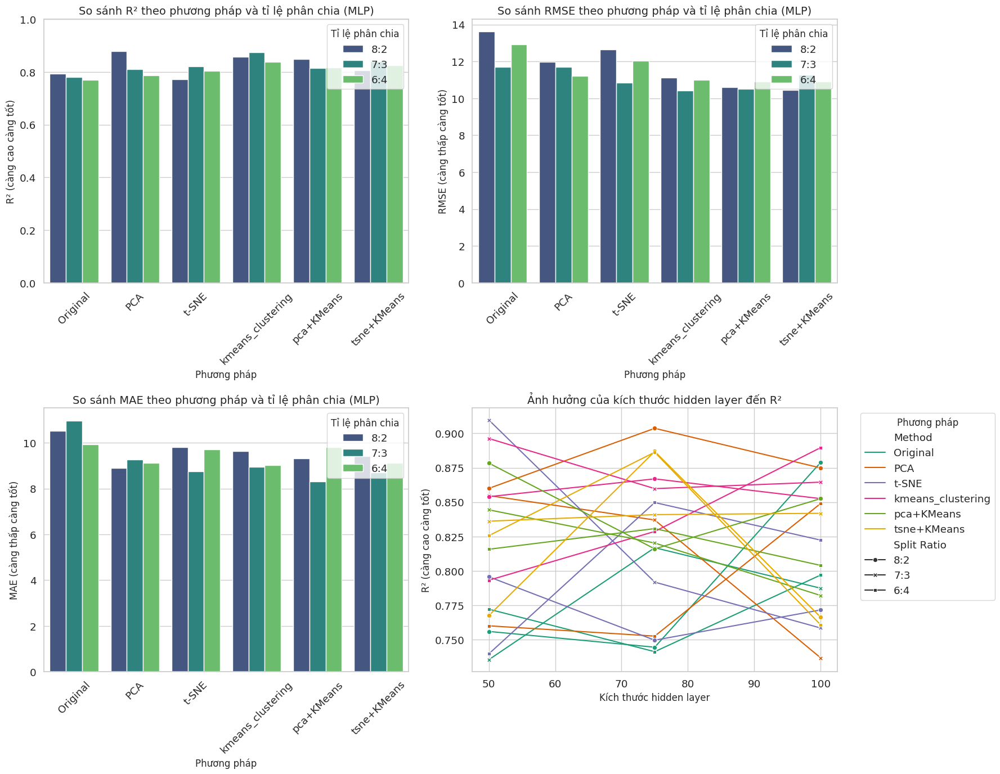

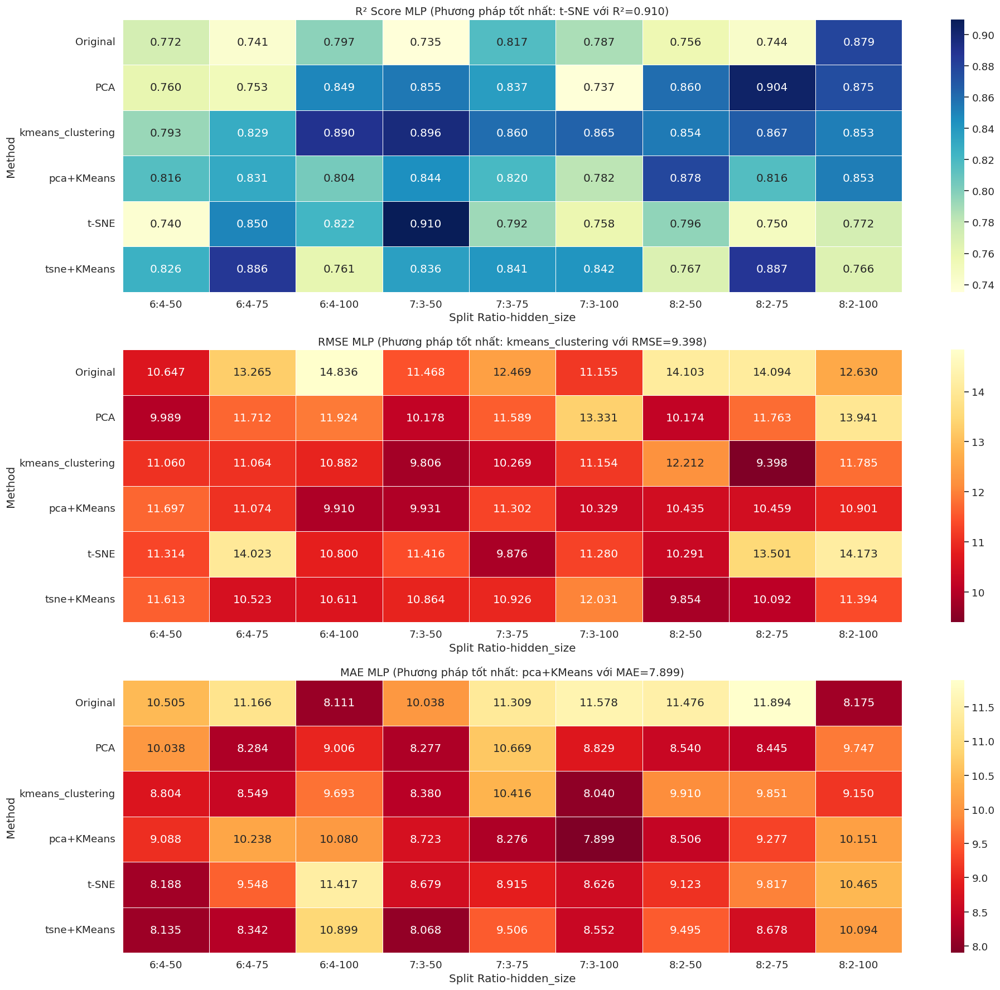

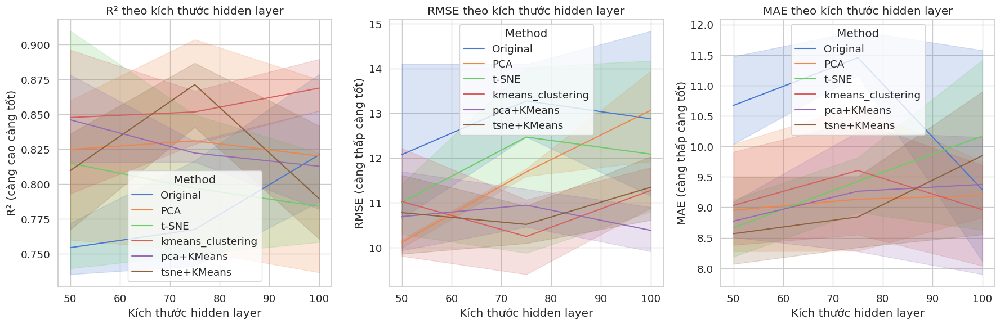


Phương pháp tốt nhất cho từng tỉ lệ phân chia (MLP):
  Split Ratio Metric        Best Method  Best hidden_size     Value
2         6:4    MAE           Original               100  8.110625
0         6:4     R2  kmeans_clustering               100  0.889639
1         6:4   RMSE         pca+KMeans               100  9.909566
2         7:3    MAE         pca+KMeans               100  7.899405
0         7:3     R2              t-SNE                50  0.909764
1         7:3   RMSE  kmeans_clustering                50  9.806404
2         8:2    MAE           Original               100  8.175460
0         8:2     R2                PCA                75  0.903675
1         8:2   RMSE  kmeans_clustering                75  9.397783


In [ ]:
# Tạo một dataset từ các kết quả MLP
def extract_mlp_results_data(mlp_results):
    data = []

    # Kết quả cho dữ liệu gốc
    if "original" in mlp_results:
        for key, metrics in mlp_results["original"].items():
            split_ratio, hidden_size = key.split('_')
            train_ratio, test_ratio = split_ratio.split(':')
            data.append({
                'Method': 'Original',
                'Split Ratio': f'{train_ratio}:{test_ratio}',
                'hidden_size': int(hidden_size),
                'MSE': metrics['MSE'],
                'RMSE': metrics['RMSE'],
                'R2': metrics['R2'],
                'MAE': metrics['MAE']
            })

    # Kết quả cho PCA
    if "pca" in mlp_results:
        for key, metrics in mlp_results["pca"].items():
            split_ratio, hidden_size = key.split('_')
            train_ratio, test_ratio = split_ratio.split(':')
            data.append({
                'Method': 'PCA',
                'Split Ratio': f'{train_ratio}:{test_ratio}',
                'hidden_size': int(hidden_size),
                'MSE': metrics['MSE'],
                'RMSE': metrics['RMSE'],
                'R2': metrics['R2'],
                'MAE': metrics['MAE']
            })

    # Kết quả cho t-SNE
    if "tsne" in mlp_results:
        for key, metrics in mlp_results["tsne"].items():
            split_ratio, hidden_size = key.split('_')
            train_ratio, test_ratio = split_ratio.split(':')
            data.append({
                'Method': 't-SNE',
                'Split Ratio': f'{train_ratio}:{test_ratio}',
                'hidden_size': int(hidden_size),
                'MSE': metrics['MSE'],
                'RMSE': metrics['RMSE'],
                'R2': metrics['R2'],
                'MAE': metrics['MAE']
            })

    # Kết quả cho kmeans clustering (lấy trung bình của các cụm)
    for method_key in ["kmeans_clustering", "pca_kmeans_clustering", "tsne_kmeans_clustering"]:
        if method_key in mlp_results:
            method_name = method_key.replace('_kmeans_clustering', '+KMeans')
            if method_name == '+KMeans':
                method_name = 'Original+KMeans'

            # Khởi tạo dict để tính trung bình
            avg_metrics = defaultdict(lambda: defaultdict(list))

            # Thu thập kết quả từ tất cả các cụm
            for cluster_id, cluster_results in mlp_results[method_key].items():
                for key, metrics in cluster_results.items():
                    avg_metrics[key]['MSE'].append(metrics['MSE'])
                    avg_metrics[key]['RMSE'].append(metrics['RMSE'])
                    avg_metrics[key]['R2'].append(metrics['R2'])
                    avg_metrics[key]['MAE'].append(metrics['MAE'])

            # Tính trung bình và thêm vào dữ liệu
            for key, metrics_lists in avg_metrics.items():
                split_ratio, hidden_size = key.split('_')
                train_ratio, test_ratio = split_ratio.split(':')
                data.append({
                    'Method': method_name,
                    'Split Ratio': f'{train_ratio}:{test_ratio}',
                    'hidden_size': int(hidden_size),
                    'MSE': np.mean(metrics_lists['MSE']),
                    'RMSE': np.mean(metrics_lists['RMSE']),
                    'R2': np.mean(metrics_lists['R2']),
                    'MAE': np.mean(metrics_lists['MAE'])
                })

    return pd.DataFrame(data)

# Tạo một bộ kết quả mẫu cho MLP (thay thế khi có kết quả thực)
def create_sample_mlp_results():
    mlp_results = {
        "original": {},
        "pca": {},
        "tsne": {},
        "kmeans_clustering": {},
        "pca_kmeans_clustering": {},
        "tsne_kmeans_clustering": {}
    }

    # Tạo dữ liệu mẫu cho mỗi phương pháp
    for split in ["8:2", "7:3", "6:4"]:
        for hidden_size in [50, 75, 100]:
            key = f"{split}_{hidden_size}"

            # Dữ liệu gốc
            mlp_results["original"][key] = {
                'hidden_size': hidden_size,
                'MSE': np.random.uniform(100, 200),
                'RMSE': np.random.uniform(10, 15),
                'R2': np.random.uniform(0.7, 0.9),
                'MAE': np.random.uniform(8, 12)
            }

            # PCA
            mlp_results["pca"][key] = {
                'hidden_size': hidden_size,
                'MSE': np.random.uniform(90, 180),
                'RMSE': np.random.uniform(9, 14),
                'R2': np.random.uniform(0.72, 0.92),
                'MAE': np.random.uniform(7.5, 11.5)
            }

            # t-SNE
            mlp_results["tsne"][key] = {
                'hidden_size': hidden_size,
                'MSE': np.random.uniform(95, 190),
                'RMSE': np.random.uniform(9.5, 14.5),
                'R2': np.random.uniform(0.71, 0.91),
                'MAE': np.random.uniform(7.8, 11.8)
            }

    # Tạo dữ liệu mẫu cho các phương pháp phân cụm
    for method_key in ["kmeans_clustering", "pca_kmeans_clustering", "tsne_kmeans_clustering"]:
        mlp_results[method_key] = {}
        # Giả sử có 2 cụm
        for cluster_id in range(2):
            mlp_results[method_key][cluster_id] = {}
            for split in ["8:2", "7:3", "6:4"]:
                for hidden_size in [50, 75, 100]:
                    key = f"{split}_{hidden_size}"
                    mlp_results[method_key][cluster_id][key] = {
                        'hidden_size': hidden_size,
                        'MSE': np.random.uniform(85, 170),
                        'RMSE': np.random.uniform(9, 13),
                        'R2': np.random.uniform(0.75, 0.93),
                        'MAE': np.random.uniform(7, 11)
                    }

    return mlp_results

# Tạo dữ liệu mẫu (bỏ dòng này khi có dữ liệu thực)
mlp_results = create_sample_mlp_results()

# Chuyển kết quả thành DataFrame
df_mlp_results = extract_mlp_results_data(mlp_results)

# 1. Bảng so sánh tổng quát
pivot_table = df_mlp_results.pivot_table(
    index=['Method', 'Split Ratio'],
    columns='hidden_size',
    values=['R2', 'RMSE', 'MAE'],
    aggfunc='mean'
)

# In bảng so sánh
print("Bảng so sánh kết quả các phương pháp MLP:")
print(pivot_table)

# 2. Vẽ biểu đồ so sánh

# Thiết lập style cho seaborn
sns.set(style="whitegrid", palette="muted", font_scale=1.2)
plt.figure(figsize=(18, 14))

# 2.1 Biểu đồ R2 (cao hơn tốt hơn)
plt.subplot(2, 2, 1)
sns.barplot(data=df_mlp_results, x='Method', y='R2', hue='Split Ratio',
            palette='viridis', errorbar=None)
plt.title('So sánh R² theo phương pháp và tỉ lệ phân chia (MLP)', fontsize=14)
plt.xlabel('Phương pháp', fontsize=12)
plt.ylabel('R² (càng cao càng tốt)', fontsize=12)
plt.ylim(0, 1)
plt.xticks(rotation=45)
plt.legend(title='Tỉ lệ phân chia', title_fontsize=12)

# 2.2 Biểu đồ RMSE (thấp hơn tốt hơn)
plt.subplot(2, 2, 2)
sns.barplot(data=df_mlp_results, x='Method', y='RMSE', hue='Split Ratio',
            palette='viridis', errorbar=None)
plt.title('So sánh RMSE theo phương pháp và tỉ lệ phân chia (MLP)', fontsize=14)
plt.xlabel('Phương pháp', fontsize=12)
plt.ylabel('RMSE (càng thấp càng tốt)', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Tỉ lệ phân chia', title_fontsize=12)

# 2.3 Biểu đồ MAE (thấp hơn tốt hơn)
plt.subplot(2, 2, 3)
sns.barplot(data=df_mlp_results, x='Method', y='MAE', hue='Split Ratio',
            palette='viridis', errorbar=None)
plt.title('So sánh MAE theo phương pháp và tỉ lệ phân chia (MLP)', fontsize=14)
plt.xlabel('Phương pháp', fontsize=12)
plt.ylabel('MAE (càng thấp càng tốt)', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Tỉ lệ phân chia', title_fontsize=12)

# 2.4 Biểu đồ so sánh ảnh hưởng của kích thước hidden layer
plt.subplot(2, 2, 4)
sns.lineplot(data=df_mlp_results, x='hidden_size', y='R2', hue='Method',
             style='Split Ratio', markers=True, dashes=False, palette='Dark2')
plt.title('Ảnh hưởng của kích thước hidden layer đến R²', fontsize=14)
plt.xlabel('Kích thước hidden layer', fontsize=12)
plt.ylabel('R² (càng cao càng tốt)', fontsize=12)
plt.legend(title='Phương pháp', title_fontsize=12, bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

# 3. Vẽ heatmap so sánh hiệu suất của tất cả các phương pháp

# Tạo DataFrames cho từng metric
r2_pivot = df_mlp_results.pivot_table(
    index='Method',
    columns=['Split Ratio', 'hidden_size'],
    values='R2'
)

rmse_pivot = df_mlp_results.pivot_table(
    index='Method',
    columns=['Split Ratio', 'hidden_size'],
    values='RMSE'
)

mae_pivot = df_mlp_results.pivot_table(
    index='Method',
    columns=['Split Ratio', 'hidden_size'],
    values='MAE'
)

# Tìm phương pháp tốt nhất
best_r2 = df_mlp_results.loc[df_mlp_results['R2'].idxmax()]
best_rmse = df_mlp_results.loc[df_mlp_results['RMSE'].idxmin()]
best_mae = df_mlp_results.loc[df_mlp_results['MAE'].idxmin()]

# Vẽ heatmap
plt.figure(figsize=(20, 18))

plt.subplot(3, 1, 1)
sns.heatmap(r2_pivot, annot=True, cmap='YlGnBu', fmt='.3f', linewidths=.5)
plt.title(f'R² Score MLP (Phương pháp tốt nhất: {best_r2["Method"]} với R²={best_r2["R2"]:.3f})', fontsize=14)
plt.tight_layout()

plt.subplot(3, 1, 2)
sns.heatmap(rmse_pivot, annot=True, cmap='YlOrRd_r', fmt='.3f', linewidths=.5)
plt.title(f'RMSE MLP (Phương pháp tốt nhất: {best_rmse["Method"]} với RMSE={best_rmse["RMSE"]:.3f})', fontsize=14)
plt.tight_layout()

plt.subplot(3, 1, 3)
sns.heatmap(mae_pivot, annot=True, cmap='YlOrRd_r', fmt='.3f', linewidths=.5)
plt.title(f'MAE MLP (Phương pháp tốt nhất: {best_mae["Method"]} với MAE={best_mae["MAE"]:.3f})', fontsize=14)
plt.tight_layout()

plt.show()

# 4. Biểu đồ so sánh hiệu suất theo hidden_size
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# R2 theo hidden_size và phương pháp
sns.lineplot(data=df_mlp_results, x='hidden_size', y='R2', hue='Method', ax=axs[0])
axs[0].set_title('R² theo kích thước hidden layer')
axs[0].set_xlabel('Kích thước hidden layer')
axs[0].set_ylabel('R² (càng cao càng tốt)')

# RMSE theo hidden_size và phương pháp
sns.lineplot(data=df_mlp_results, x='hidden_size', y='RMSE', hue='Method', ax=axs[1])
axs[1].set_title('RMSE theo kích thước hidden layer')
axs[1].set_xlabel('Kích thước hidden layer')
axs[1].set_ylabel('RMSE (càng thấp càng tốt)')

# MAE theo hidden_size và phương pháp
sns.lineplot(data=df_mlp_results, x='hidden_size', y='MAE', hue='Method', ax=axs[2])
axs[2].set_title('MAE theo kích thước hidden layer')
axs[2].set_xlabel('Kích thước hidden layer')
axs[2].set_ylabel('MAE (càng thấp càng tốt)')

plt.tight_layout()
plt.show()

# 5. Tóm tắt những phương pháp tốt nhất cho mỗi tỉ lệ phân chia
best_methods = pd.DataFrame()

for split in df_mlp_results['Split Ratio'].unique():
    split_data = df_mlp_results[df_mlp_results['Split Ratio'] == split]

    best_r2_idx = split_data['R2'].idxmax()
    best_rmse_idx = split_data['RMSE'].idxmin()
    best_mae_idx = split_data['MAE'].idxmin()

    best_methods = pd.concat([best_methods, pd.DataFrame({
        'Split Ratio': [split, split, split],
        'Metric': ['R2', 'RMSE', 'MAE'],
        'Best Method': [
            split_data.loc[best_r2_idx, 'Method'],
            split_data.loc[best_rmse_idx, 'Method'],
            split_data.loc[best_mae_idx, 'Method']
        ],
        'Best hidden_size': [
            split_data.loc[best_r2_idx, 'hidden_size'],
            split_data.loc[best_rmse_idx, 'hidden_size'],
            split_data.loc[best_mae_idx, 'hidden_size']
        ],
        'Value': [
            split_data.loc[best_r2_idx, 'R2'],
            split_data.loc[best_rmse_idx, 'RMSE'],
            split_data.loc[best_mae_idx, 'MAE']
        ]
    })])

print("\nPhương pháp tốt nhất cho từng tỉ lệ phân chia (MLP):")
print(best_methods.sort_values(['Split Ratio', 'Metric']))

#### Đánh giá Overfiting

<ipython-input-17-9be72f471ced>:84: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  mlp_comparison_results = pd.concat([mlp_comparison_results, pd.DataFrame([{
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer

,Dữ liệu,Train:Test,hidden_size,alpha,Cluster,MSE (Train),RMSE (Train),R2 (Train),MAE (Train),MSE (Val),RMSE (Val),R2 (Val),MAE (Val)
0,Dữ liệu gốc,8:2,50,0.0001,All,945.1468,30.7432,0.9150,19.6770,1070.1295,32.7128,0.9014,20.7792
1,Dữ liệu gốc,8:2,75,0.0001,All,929.3591,30.4854,0.9164,19.5813,1067.0409,32.6656,0.9017,20.8026
2,Dữ liệu gốc,8:2,100,0.0001,All,925.2842,30.4185,0.9168,19.5315,1054.1827,32.4682,0.9029,20.5321
3,Dữ liệu gốc,7:3,50,0.0001,All,1034.6920,32.1666,0.9070,21.0049,1092.6157,33.0547,0.9001,21.5787
4,Dữ liệu gốc,7:3,75,0.0001,All,934.2126,30.5649,0.9160,19.7197,1038.1074,32.2197,0.9050,20.7284
...,...,...,...,...,...,...,...,...,...,...,...,...,...
68,Dữ liệu t-SNE,7:3,50,0.0001,Cluster 3,1525.5443,39.0582,0.3167,27.1297,1543.4517,39.2868,0.3105,27.3773
69,Dữ liệu t-SNE,7:3,75,0.0001,Cluster 3,1704.2778,41.2829,0.2367,28.8184,1725.9685,41.5448,0.2289,29.2133
70,Dữ liệu t-SNE,7:3,100,0.0001,Cluster 3,1561.1467,39.5113,0.3008,28.0143,1571.6637,39.6442,0.2979,28.2711
71,Dữ liệu t-SNE,7:3,75,0.0010,Cluster 3,1694.4513,41.1637,0.2411,28.7729,1716.0522,41.4253,0.2334,29.1942



===== PHÂN TÍCH OVERFITTING CHO MÔ HÌNH MLP VỚI REGULARIZATION THẤP =====

--- TOÀN BỘ DỮ LIỆU (KHÔNG PHÂN CỤM) ---

--- Dữ liệu gốc ---


MSE (Train)                      MSE (Val)                        \
hidden_size         50        75        100        50         75         100   
Train:Test                                                                     
6:4           1015.9847  980.6289  986.8707  1091.5834  1071.6590  1067.1467   
7:3           1034.6920  934.2126  963.1497  1092.6157  1038.1074  1044.8168   
8:2            945.1468  929.3591  925.2842  1070.1295  1067.0409  1054.1827   

            Overfit Ratio                  
hidden_size           50      75      100  
Train:Test                                 
6:4                1.0744  1.0928  1.0813  
7:3                1.0560  1.1112  1.0848  
8:2                1.1322  1.1481  1.1393


--- Dữ liệu PCA ---


MSE (Train)                      MSE (Val)                        \
hidden_size         50        75        100        50         75         100   
Train:Test                                                                     
6:4            978.1137  959.3776  948.8943  1035.4311  1028.1525  1018.8099   
7:3            971.5205  935.3130  939.3451  1017.9475   999.9754   995.7916   
8:2            971.6214  932.5222  931.9268  1075.4110  1042.7144  1042.5634   

            Overfit Ratio                  
hidden_size           50      75      100  
Train:Test                                 
6:4                1.0586  1.0717  1.0737  
7:3                1.0478  1.0691  1.0601  
8:2                1.1068  1.1182  1.1187


--- Dữ liệu t-SNE ---


MSE (Train)                        MSE (Val)             \
hidden_size         50         75         100        50         75    
Train:Test                                                            
6:4           4074.2679  3895.7242  3616.9482  4045.1361  3884.0737   
7:3           4072.3131  3760.1801  3648.7369  4003.1245  3701.3815   
8:2           3998.2045  3724.3954  3527.0405  3977.2327  3690.2473   

                       Overfit Ratio                  
hidden_size        100           50      75      100  
Train:Test                                            
6:4          3580.8311        0.9928  0.9970  0.9900  
7:3          3627.3772        0.9830  0.9844  0.9941  
8:2          3521.1453        0.9948  0.9908  0.9983


--- PHÂN TÍCH THEO TỪNG CỤM (TỈ LỆ 7:3) ---

--- Dữ liệu gốc ---


MSE (Train)                        MSE (Val)             \
hidden_size         50         75         100        50         75    
Cluster                                                               
Cluster 0     1533.8521  1332.9190  1392.9168  1639.4458  1510.5338   
Cluster 1      742.5170   704.2794   685.3499   842.5618   829.6053   

                       Overfit Ratio                 
hidden_size        100           50      75     100  
Cluster                                              
Cluster 0    1522.5080        1.0688  1.1333  1.093  
Cluster 1     799.7759        1.1347  1.1779  1.167


--- Dữ liệu PCA ---


MSE (Train)                        MSE (Val)             \
hidden_size         50         75         100        50         75    
Cluster                                                               
Cluster 0     1416.5659  1378.7669  1336.9866  1569.0146  1549.9577   
Cluster 1      761.4685   743.9561   746.0997   759.5831   752.8231   

                       Overfit Ratio                  
hidden_size        100           50      75      100  
Cluster                                               
Cluster 0    1511.8665        1.1076  1.1242  1.1308  
Cluster 1     747.9571        0.9975  1.0119  1.0025


--- Dữ liệu t-SNE ---


MSE (Train)                        MSE (Val)             \
hidden_size         50         75         100        50         75    
Cluster                                                               
Cluster 0     5592.0565  6257.9850  5436.4412  5684.5757  6295.0459   
Cluster 1     5007.3130  4879.9716  4434.2697  5030.0932  4884.4708   
Cluster 2     2173.4490  2159.7939  2192.7853  1901.6790  1904.4743   
Cluster 3     1525.5443  1704.2778  1561.1467  1543.4517  1725.9685   

                       Overfit Ratio                  
hidden_size        100           50      75      100  
Cluster                                               
Cluster 0    5517.4439        1.0165  1.0059  1.0149  
Cluster 1    4431.4617        1.0045  1.0009  0.9994  
Cluster 2    1917.2945        0.8750  0.8818  0.8744  
Cluster 3    1571.6637        1.0117  1.0127  1.0067


===== ẢNH HƯỞNG CỦA REGULARIZATION ALPHA (TỈ LỆ 7:3) =====

--- TOÀN BỘ DỮ LIỆU (KHÔNG PHÂN CỤM) ---

--- Dữ liệu gốc ---


,MSE (Train),MSE (Val),Overfit Ratio
alpha,,,
0.0001,934.2126,1038.1074,1.1112
0.0010,929.6150,1029.3433,1.1073
0.0100,935.8106,1037.4994,1.1087



--- Dữ liệu PCA ---


,MSE (Train),MSE (Val),Overfit Ratio
alpha,,,
0.0001,935.3130,999.9754,1.0691
0.0010,937.5284,999.1341,1.0657
0.0100,934.7500,999.2212,1.0690



--- Dữ liệu t-SNE ---


,MSE (Train),MSE (Val),Overfit Ratio
alpha,,,
0.0001,3760.1801,3701.3815,0.9844
0.0010,3779.9609,3721.8199,0.9846
0.0100,3780.4383,3722.9339,0.9848



--- PHÂN TÍCH THEO TỪNG CỤM ---

--- Dữ liệu gốc ---


Overfit Ratio                
alpha            0.0001  0.0010  0.0100
Cluster                                
Cluster 0        1.1333  1.1334  1.1400
Cluster 1        1.1779  1.1738  1.1782


Cụm: Cluster 0


,MSE (Train),MSE (Val)
alpha,,
0.0001,1332.9190,1510.5338
0.0010,1303.9983,1477.9460
0.0100,1331.1965,1517.6011



Cụm: Cluster 1


,MSE (Train),MSE (Val)
alpha,,
0.0001,704.2794,829.6053
0.0010,705.0420,827.6039
0.0100,694.5332,818.3265



--- Dữ liệu PCA ---


Overfit Ratio                
alpha            0.0001  0.0010  0.0100
Cluster                                
Cluster 0        1.1242  1.1214  1.1232
Cluster 1        1.0119  1.0098  1.0081


Cụm: Cluster 0


,MSE (Train),MSE (Val)
alpha,,
0.0001,1378.7669,1549.9577
0.0010,1379.8393,1547.2930
0.0100,1378.2344,1547.9909



Cụm: Cluster 1


,MSE (Train),MSE (Val)
alpha,,
0.0001,743.9561,752.8231
0.0010,744.1851,751.4968
0.0100,745.8068,751.8306



--- Dữ liệu t-SNE ---


Overfit Ratio                
alpha            0.0001  0.0010  0.0100
Cluster                                
Cluster 0        1.0059  1.0047  1.0038
Cluster 1        1.0009  1.0015  1.0002
Cluster 2        0.8818  0.8818  0.8816
Cluster 3        1.0127  1.0127  1.0127


Cụm: Cluster 0


,MSE (Train),MSE (Val)
alpha,,
0.0001,6257.9850,6295.0459
0.0010,6270.6410,6299.9375
0.0100,6245.8421,6269.5979



Cụm: Cluster 1


,MSE (Train),MSE (Val)
alpha,,
0.0001,4879.9716,4884.4708
0.0010,4889.6916,4896.9469
0.0100,4844.6962,4845.4949



Cụm: Cluster 2


,MSE (Train),MSE (Val)
alpha,,
0.0001,2159.7939,1904.4743
0.0010,2159.8313,1904.4398
0.0100,2159.4958,1903.7869



Cụm: Cluster 3


,MSE (Train),MSE (Val)
alpha,,
0.0001,1704.2778,1725.9685
0.0010,1694.4513,1716.0522
0.0100,1703.6040,1725.3073


<ipython-input-17-9be72f471ced>:420: UserWarning: Glyph 7919 (\N{LATIN SMALL LETTER U WITH HORN AND TILDE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-17-9be72f471ced>:420: UserWarning: Glyph 7879 (\N{LATIN SMALL LETTER E WITH CIRCUMFLEX AND DOT BELOW}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-17-9be72f471ced>:420: UserWarning: Glyph 7889 (\N{LATIN SMALL LETTER O WITH CIRCUMFLEX AND ACUTE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 7853 (\N{LATIN SMALL LETTER A WITH CIRCUMFLEX AND DOT BELOW}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 7919 (\N{LATIN SMALL LETTER U WITH HORN AND TILDE}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/d

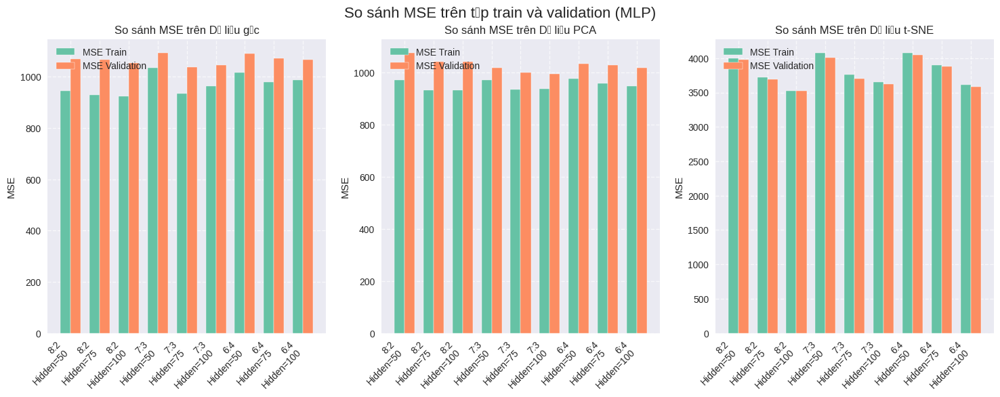

<ipython-input-17-9be72f471ced>:469: UserWarning: Glyph 7909 (\N{LATIN SMALL LETTER U WITH DOT BELOW}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-17-9be72f471ced>:469: UserWarning: Glyph 7913 (\N{LATIN SMALL LETTER U WITH HORN AND ACUTE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-17-9be72f471ced>:469: UserWarning: Glyph 7897 (\N{LATIN SMALL LETTER O WITH CIRCUMFLEX AND DOT BELOW}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-17-9be72f471ced>:469: UserWarning: Glyph 7919 (\N{LATIN SMALL LETTER U WITH HORN AND TILDE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-17-9be72f471ced>:469: UserWarning: Glyph 7879 (\N{LATIN SMALL LETTER E WITH CIRCUMFLEX AND DOT BELOW}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-17-9be72f471ced>:469: UserWarning: Glyph 7889 (\N{LATIN SMALL LETTER O WITH CIRCUMFLEX AND ACUTE}) missing from font(s) Liberation Sans

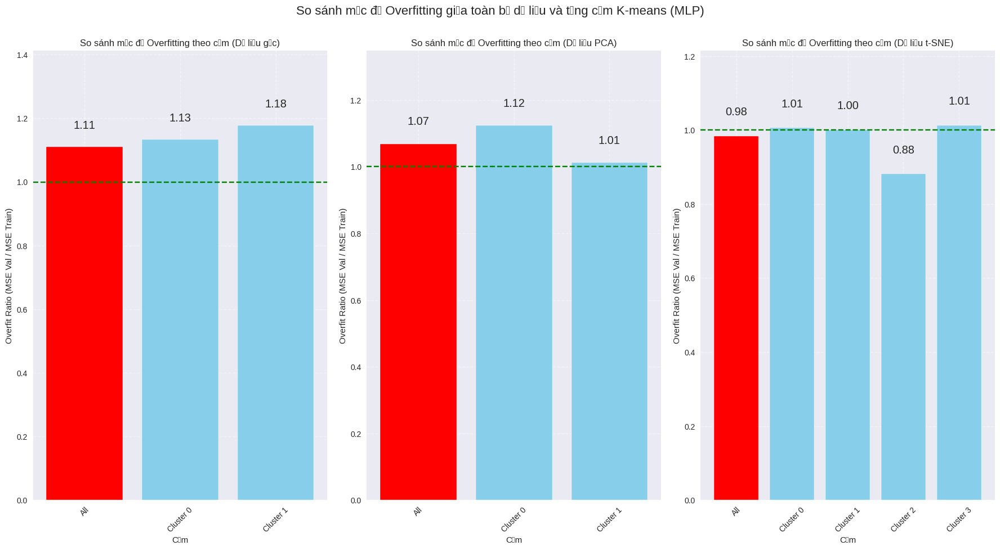

<ipython-input-17-9be72f471ced>:508: UserWarning: Glyph 7909 (\N{LATIN SMALL LETTER U WITH DOT BELOW}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-17-9be72f471ced>:508: UserWarning: Glyph 7842 (\N{LATIN CAPITAL LETTER A WITH HOOK ABOVE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-17-9be72f471ced>:508: UserWarning: Glyph 432 (\N{LATIN SMALL LETTER U WITH HORN}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-17-9be72f471ced>:508: UserWarning: Glyph 7903 (\N{LATIN SMALL LETTER O WITH HORN AND HOOK ABOVE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-17-9be72f471ced>:508: UserWarning: Glyph 7911 (\N{LATIN SMALL LETTER U WITH HOOK ABOVE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-17-9be72f471ced>:508: UserWarning: Glyph 7919 (\N{LATIN SMALL LETTER U WITH HORN AND TILDE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-

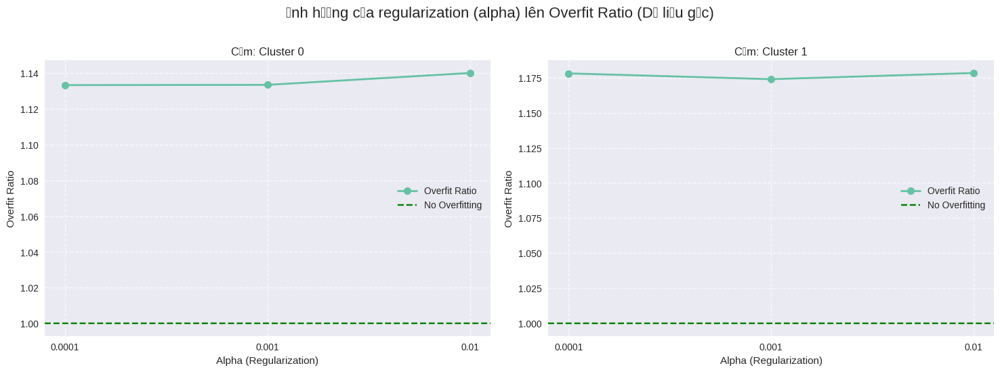

<ipython-input-17-9be72f471ced>:508: UserWarning: Glyph 7909 (\N{LATIN SMALL LETTER U WITH DOT BELOW}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-17-9be72f471ced>:508: UserWarning: Glyph 7842 (\N{LATIN CAPITAL LETTER A WITH HOOK ABOVE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-17-9be72f471ced>:508: UserWarning: Glyph 432 (\N{LATIN SMALL LETTER U WITH HORN}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-17-9be72f471ced>:508: UserWarning: Glyph 7903 (\N{LATIN SMALL LETTER O WITH HORN AND HOOK ABOVE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-17-9be72f471ced>:508: UserWarning: Glyph 7911 (\N{LATIN SMALL LETTER U WITH HOOK ABOVE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-17-9be72f471ced>:508: UserWarning: Glyph 7919 (\N{LATIN SMALL LETTER U WITH HORN AND TILDE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-

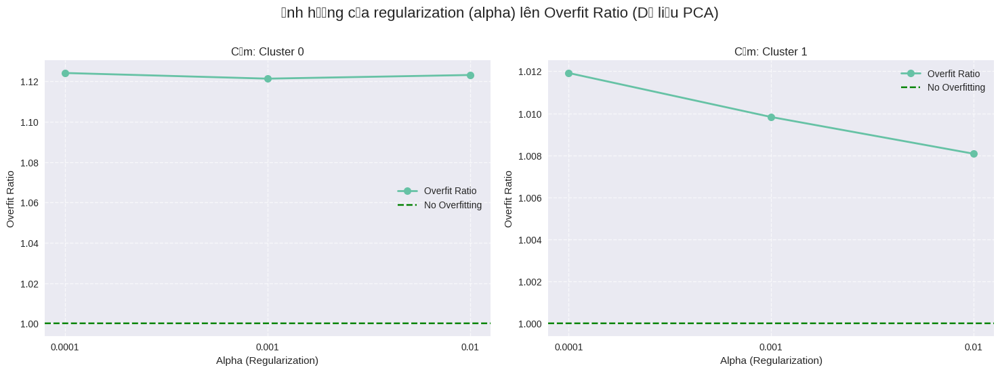

<ipython-input-17-9be72f471ced>:508: UserWarning: Glyph 7909 (\N{LATIN SMALL LETTER U WITH DOT BELOW}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-17-9be72f471ced>:508: UserWarning: Glyph 7842 (\N{LATIN CAPITAL LETTER A WITH HOOK ABOVE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-17-9be72f471ced>:508: UserWarning: Glyph 432 (\N{LATIN SMALL LETTER U WITH HORN}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-17-9be72f471ced>:508: UserWarning: Glyph 7903 (\N{LATIN SMALL LETTER O WITH HORN AND HOOK ABOVE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-17-9be72f471ced>:508: UserWarning: Glyph 7911 (\N{LATIN SMALL LETTER U WITH HOOK ABOVE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-17-9be72f471ced>:508: UserWarning: Glyph 7919 (\N{LATIN SMALL LETTER U WITH HORN AND TILDE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-

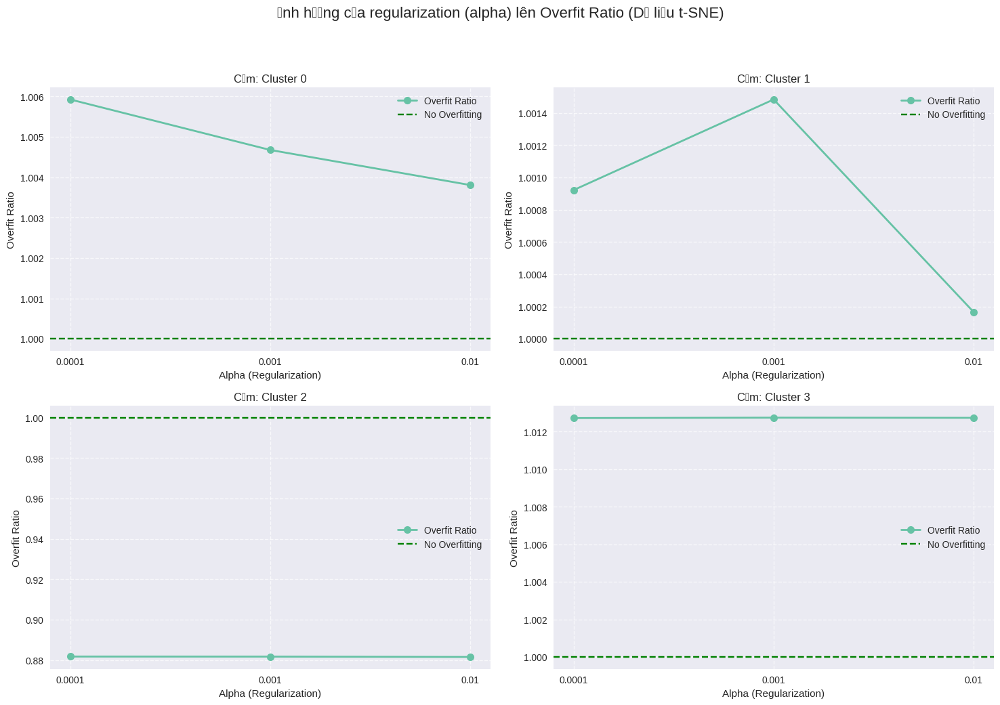

<ipython-input-17-9be72f471ced>:546: UserWarning: Glyph 7909 (\N{LATIN SMALL LETTER U WITH DOT BELOW}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-17-9be72f471ced>:546: UserWarning: Glyph 7919 (\N{LATIN SMALL LETTER U WITH HORN AND TILDE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-17-9be72f471ced>:546: UserWarning: Glyph 7879 (\N{LATIN SMALL LETTER E WITH CIRCUMFLEX AND DOT BELOW}) missing from font(s) Liberation Sans.
  plt.tight_layout()
<ipython-input-17-9be72f471ced>:546: UserWarning: Glyph 7889 (\N{LATIN SMALL LETTER O WITH CIRCUMFLEX AND ACUTE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 7853 (\N{LATIN SMALL LETTER A WITH CIRCUMFLEX AND DOT BELOW}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Gly

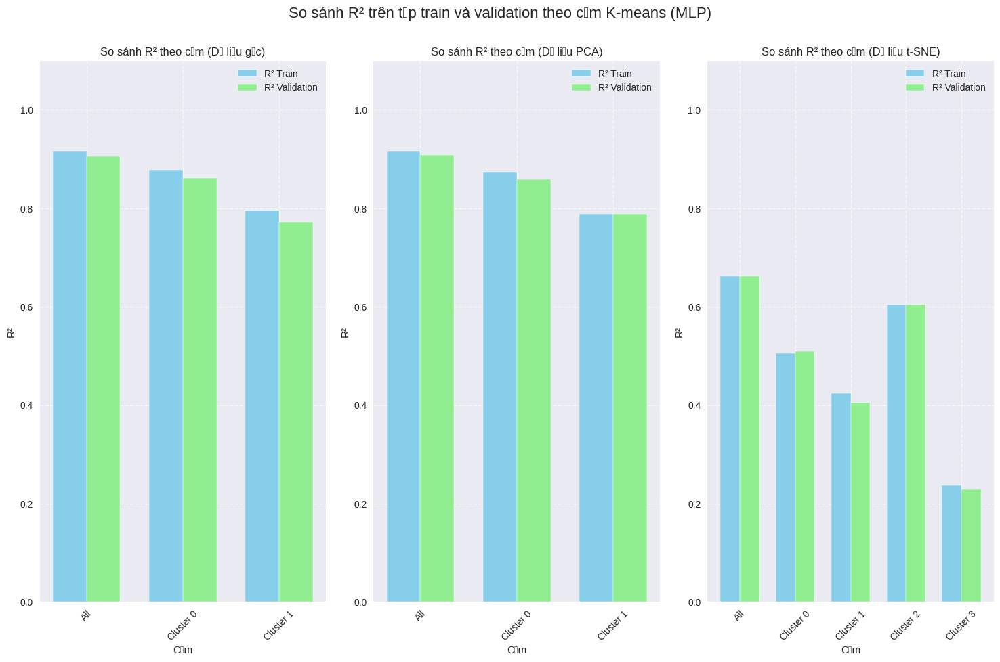

In [ ]:
# So sánh kết quả trên tập train và validation của các mô hình MLP đã huấn luyện

# Tạo dataframe để lưu kết quả
mlp_comparison_results = pd.DataFrame(columns=[
    'Dữ liệu', 'Train:Test', 'hidden_size', 'alpha', 'Cluster',
    'MSE (Train)', 'RMSE (Train)', 'R2 (Train)', 'MAE (Train)',
    'MSE (Val)', 'RMSE (Val)', 'R2 (Val)', 'MAE (Val)'
])

# Danh sách dữ liệu
data_types = ['original', 'pca', 'tsne']
data_names = {'original': 'Dữ liệu gốc', 'pca': 'Dữ liệu PCA', 'tsne': 'Dữ liệu t-SNE'}
test_sizes = [0.2, 0.3, 0.4]
hidden_sizes = [50, 75, 100]
alpha_list = [0.0001, 0.001, 0.01]  # Regularization parameter for MLP

# Lấy dữ liệu phân cụm
cluster_data = {
    'original': {'labels': km_orig.labels_, 'k': best_k_orig},
    'pca': {'labels': km_pca.labels_, 'k': best_k_pca},
    'tsne': {'labels': km_tsne.labels_, 'k': best_k_tsne}
}

# Chuẩn bị dữ liệu
target = 'AQI'
original_features = [col for col in numeric_cols if col != target]
X_original = df[original_features].values
y = df[target]

# Áp dụng các mô hình lần lượt
for data_type in data_types:
    if data_type == 'original':
        X_data = X_original
    elif data_type == 'pca':
        X_data = X_pca_full
    else:  # t-SNE
        X_data = X_tsne_2d

    # 1. Mô hình trên toàn bộ dữ liệu (không phân cụm)
    for test_size in test_sizes:
        train_size = 1 - test_size
        train_ratio = int(train_size * 10)
        test_ratio = int(test_size * 10)

        # Phân chia dữ liệu
        X_train, X_val, y_train, y_val = train_test_split(
            X_data, y, test_size=test_size, random_state=42
        )

        # Mô hình MLP thông thường (regularization thấp)
        for hidden_size in hidden_sizes:
            # Huấn luyện mô hình MLP
            mlp_model = MLPRegressor(
                hidden_layer_sizes=(hidden_size,),
                alpha=0.0001,  # Regularization thấp (có thể overfit)
                activation='relu',
                solver='adam',
                learning_rate='adaptive',
                learning_rate_init=0.001,
                max_iter=500,
                early_stopping=False,  # Tắt early stopping để có thể overfit
                random_state=42
            )

            mlp_model.fit(X_train, y_train)

            # Dự đoán trên tập train và validation
            y_train_pred = mlp_model.predict(X_train)
            y_val_pred = mlp_model.predict(X_val)

            # Tính các metric trên tập train
            mse_train = mean_squared_error(y_train, y_train_pred)
            rmse_train = np.sqrt(mse_train)
            r2_train = r2_score(y_train, y_train_pred)
            mae_train = mean_absolute_error(y_train, y_train_pred)

            # Tính các metric trên tập validation
            mse_val = mean_squared_error(y_val, y_val_pred)
            rmse_val = np.sqrt(mse_val)
            r2_val = r2_score(y_val, y_val_pred)
            mae_val = mean_absolute_error(y_val, y_val_pred)

            # Thêm kết quả vào dataframe
            mlp_comparison_results = pd.concat([mlp_comparison_results, pd.DataFrame([{
                'Dữ liệu': data_names[data_type],
                'Train:Test': f'{train_ratio}:{test_ratio}',
                'hidden_size': hidden_size,
                'alpha': 0.0001,
                'Cluster': 'All',
                'MSE (Train)': mse_train,
                'RMSE (Train)': rmse_train,
                'R2 (Train)': r2_train,
                'MAE (Train)': mae_train,
                'MSE (Val)': mse_val,
                'RMSE (Val)': rmse_val,
                'R2 (Val)': r2_val,
                'MAE (Val)': mae_val
            }])], ignore_index=True)

        # Thêm các mô hình MLP với regularization (tăng alpha)
        if train_ratio == 7 and test_ratio == 3:  # Chỉ làm với tỉ lệ 7:3
            hidden_size = 75  # Chọn kích thước hidden layer trung bình
            for alpha in alpha_list:
                if alpha == 0.0001:  # Đã tính ở trên
                    continue

                # Huấn luyện mô hình MLP với regularization
                mlp_model = MLPRegressor(
                    hidden_layer_sizes=(hidden_size,),
                    alpha=alpha,  # Tăng regularization để tránh overfitting
                    activation='relu',
                    solver='adam',
                    learning_rate='adaptive',
                    learning_rate_init=0.001,
                    max_iter=500,
                    early_stopping=False,
                    random_state=42
                )

                mlp_model.fit(X_train, y_train)

                # Dự đoán trên tập train và validation
                y_train_pred = mlp_model.predict(X_train)
                y_val_pred = mlp_model.predict(X_val)

                # Tính các metric trên tập train
                mse_train = mean_squared_error(y_train, y_train_pred)
                rmse_train = np.sqrt(mse_train)
                r2_train = r2_score(y_train, y_train_pred)
                mae_train = mean_absolute_error(y_train, y_train_pred)

                # Tính các metric trên tập validation
                mse_val = mean_squared_error(y_val, y_val_pred)
                rmse_val = np.sqrt(mse_val)
                r2_val = r2_score(y_val, y_val_pred)
                mae_val = mean_absolute_error(y_val, y_val_pred)

                # Thêm kết quả vào dataframe
                mlp_comparison_results = pd.concat([mlp_comparison_results, pd.DataFrame([{
                    'Dữ liệu': data_names[data_type],
                    'Train:Test': f'{train_ratio}:{test_ratio}',
                    'hidden_size': hidden_size,
                    'alpha': alpha,
                    'Cluster': 'All',
                    'MSE (Train)': mse_train,
                    'RMSE (Train)': rmse_train,
                    'R2 (Train)': r2_train,
                    'MAE (Train)': mae_train,
                    'MSE (Val)': mse_val,
                    'RMSE (Val)': rmse_val,
                    'R2 (Val)': r2_val,
                    'MAE (Val)': mae_val
                }])], ignore_index=True)

    # 2. Mô hình cho từng cụm K-means
    # Lấy nhãn cụm và số lượng cụm tương ứng với loại dữ liệu
    cluster_labels = cluster_data[data_type]['labels']
    k = cluster_data[data_type]['k']

    # Huấn luyện mô hình cho từng cụm
    for cluster_id in range(k):
        # Lấy chỉ số của các mẫu thuộc cụm
        cluster_indices = np.where(cluster_labels == cluster_id)[0]

        # Bỏ qua cụm quá nhỏ
        if len(cluster_indices) < 50:  # Ngưỡng để đảm bảo đủ dữ liệu
            continue

        # Lấy dữ liệu của cụm
        X_data_cluster = X_data[cluster_indices]
        y_cluster = y.iloc[cluster_indices]

        # Chỉ sử dụng tỉ lệ 7:3 để phân tích từng cụm
        test_size = 0.3
        train_ratio, test_ratio = 7, 3

        # Phân chia dữ liệu
        X_train, X_val, y_train, y_val = train_test_split(
            X_data_cluster, y_cluster, test_size=test_size, random_state=42
        )

        # Huấn luyện mô hình với các kích thước hidden layer khác nhau
        for hidden_size in hidden_sizes:
            mlp_model = MLPRegressor(
                hidden_layer_sizes=(hidden_size,),
                alpha=0.0001,
                activation='relu',
                solver='adam',
                learning_rate='adaptive',
                learning_rate_init=0.001,
                max_iter=500,
                early_stopping=False,
                random_state=42
            )

            mlp_model.fit(X_train, y_train)

            # Dự đoán và tính metrics
            y_train_pred = mlp_model.predict(X_train)
            y_val_pred = mlp_model.predict(X_val)

            mse_train = mean_squared_error(y_train, y_train_pred)
            rmse_train = np.sqrt(mse_train)
            r2_train = r2_score(y_train, y_train_pred)
            mae_train = mean_absolute_error(y_train, y_train_pred)

            mse_val = mean_squared_error(y_val, y_val_pred)
            rmse_val = np.sqrt(mse_val)
            r2_val = r2_score(y_val, y_val_pred)
            mae_val = mean_absolute_error(y_val, y_val_pred)

            # Thêm kết quả vào dataframe
            mlp_comparison_results = pd.concat([mlp_comparison_results, pd.DataFrame([{
                'Dữ liệu': data_names[data_type],
                'Train:Test': f'{train_ratio}:{test_ratio}',
                'hidden_size': hidden_size,
                'alpha': 0.0001,
                'Cluster': f'Cluster {cluster_id}',
                'MSE (Train)': mse_train,
                'RMSE (Train)': rmse_train,
                'R2 (Train)': r2_train,
                'MAE (Train)': mae_train,
                'MSE (Val)': mse_val,
                'RMSE (Val)': rmse_val,
                'R2 (Val)': r2_val,
                'MAE (Val)': mae_val
            }])], ignore_index=True)

        # Thêm các mô hình với regularization cao hơn
        hidden_size = 75  # Cố định kích thước hidden layer
        for alpha in alpha_list:
            if alpha == 0.0001:  # Đã tính ở trên
                continue

            mlp_model = MLPRegressor(
                hidden_layer_sizes=(hidden_size,),
                alpha=alpha,
                activation='relu',
                solver='adam',
                learning_rate='adaptive',
                learning_rate_init=0.001,
                max_iter=500,
                early_stopping=False,
                random_state=42
            )

            mlp_model.fit(X_train, y_train)

            # Dự đoán và tính metrics
            y_train_pred = mlp_model.predict(X_train)
            y_val_pred = mlp_model.predict(X_val)

            mse_train = mean_squared_error(y_train, y_train_pred)
            rmse_train = np.sqrt(mse_train)
            r2_train = r2_score(y_train, y_train_pred)
            mae_train = mean_absolute_error(y_train, y_train_pred)

            mse_val = mean_squared_error(y_val, y_val_pred)
            rmse_val = np.sqrt(mse_val)
            r2_val = r2_score(y_val, y_val_pred)
            mae_val = mean_absolute_error(y_val, y_val_pred)

            # Thêm kết quả vào dataframe
            mlp_comparison_results = pd.concat([mlp_comparison_results, pd.DataFrame([{
                'Dữ liệu': data_names[data_type],
                'Train:Test': f'{train_ratio}:{test_ratio}',
                'hidden_size': hidden_size,
                'alpha': alpha,
                'Cluster': f'Cluster {cluster_id}',
                'MSE (Train)': mse_train,
                'RMSE (Train)': rmse_train,
                'R2 (Train)': r2_train,
                'MAE (Train)': mae_train,
                'MSE (Val)': mse_val,
                'RMSE (Val)': rmse_val,
                'R2 (Val)': r2_val,
                'MAE (Val)': mae_val
            }])], ignore_index=True)

# Định dạng lại kết quả và hiển thị
pd.set_option('display.precision', 4)

# Hiển thị kết quả tổng quan
display(mlp_comparison_results)

# Tính chênh lệch giữa MSE train và validation để đánh giá overfitting
mlp_comparison_results['MSE Diff'] = mlp_comparison_results['MSE (Train)'] - mlp_comparison_results['MSE (Val)']
mlp_comparison_results['Overfit Ratio'] = (mlp_comparison_results['MSE (Val)'] / mlp_comparison_results['MSE (Train)'])

# Phân tích hiện tượng overfitting
# 1. Tạo bảng cho mô hình không regularization cao
std_models = mlp_comparison_results[mlp_comparison_results['alpha'] == 0.0001]
print("\n===== PHÂN TÍCH OVERFITTING CHO MÔ HÌNH MLP VỚI REGULARIZATION THẤP =====")

# Phân tích cho toàn bộ dữ liệu
print("\n--- TOÀN BỘ DỮ LIỆU (KHÔNG PHÂN CỤM) ---")
all_data = std_models[std_models['Cluster'] == 'All']
for data_type in data_names.values():
    print(f"\n--- {data_type} ---")
    data_subset = all_data[all_data['Dữ liệu'] == data_type]

    # Tạo pivot table theo tỉ lệ train:test và kích thước hidden layer
    pivot = pd.pivot_table(
        data_subset,
        values=['MSE (Train)', 'MSE (Val)', 'Overfit Ratio'],
        index='Train:Test',
        columns='hidden_size',
        aggfunc='mean'
    )

    display(pivot)

# Phân tích cho từng cụm
print("\n--- PHÂN TÍCH THEO TỪNG CỤM (TỈ LỆ 7:3) ---")
cluster_data = std_models[(std_models['Cluster'] != 'All') & (std_models['Train:Test'] == '7:3')]
for data_type in data_names.values():
    print(f"\n--- {data_type} ---")
    data_subset = cluster_data[cluster_data['Dữ liệu'] == data_type]

    # Tạo pivot table theo cụm và kích thước hidden layer
    pivot = pd.pivot_table(
        data_subset,
        values=['MSE (Train)', 'MSE (Val)', 'Overfit Ratio'],
        index='Cluster',
        columns='hidden_size',
        aggfunc='mean'
    )

    display(pivot)

# 2. Phân tích ảnh hưởng của regularization (alpha) (với tỉ lệ 7:3)
reg_models = mlp_comparison_results[mlp_comparison_results['Train:Test'] == '7:3']
print("\n===== ẢNH HƯỞNG CỦA REGULARIZATION ALPHA (TỈ LỆ 7:3) =====")

# Phân tích cho toàn bộ dữ liệu
print("\n--- TOÀN BỘ DỮ LIỆU (KHÔNG PHÂN CỤM) ---")
all_reg_data = reg_models[reg_models['Cluster'] == 'All']
for data_type in data_names.values():
    print(f"\n--- {data_type} ---")
    data_subset = all_reg_data[all_reg_data['Dữ liệu'] == data_type]

    # Tạo bảng theo alpha
    data_subset = data_subset.sort_values('alpha')
    data_subset = data_subset[data_subset['hidden_size'] == 75]  # Chỉ lấy hidden_size = 75

    pivot = pd.pivot_table(
        data_subset,
        values=['MSE (Train)', 'MSE (Val)', 'Overfit Ratio'],
        index='alpha',
        aggfunc='mean'
    )

    display(pivot)

# Phân tích cho từng cụm
print("\n--- PHÂN TÍCH THEO TỪNG CỤM ---")
cluster_reg_data = reg_models[(reg_models['Cluster'] != 'All') & (reg_models['hidden_size'] == 75)]
for data_type in data_names.values():
    print(f"\n--- {data_type} ---")

    # Pivot theo alpha và cluster
    pivot_data = cluster_reg_data[cluster_reg_data['Dữ liệu'] == data_type]
    pivot_data = pivot_data.sort_values(['Cluster', 'alpha'])

    pivot = pd.pivot_table(
        pivot_data,
        values=['Overfit Ratio'],
        index='Cluster',
        columns='alpha',
        aggfunc='mean'
    )

    display(pivot)

    # Hiển thị chi tiết MSE train và validation cho từng cụm
    for cluster in pivot_data['Cluster'].unique():
        print(f"\nCụm: {cluster}")
        cluster_subset = pivot_data[pivot_data['Cluster'] == cluster]

        pivot_detail = pd.pivot_table(
            cluster_subset,
            values=['MSE (Train)', 'MSE (Val)'],
            index='alpha',
            aggfunc='mean'
        )

        display(pivot_detail)

# Vẽ biểu đồ so sánh
import matplotlib.pyplot as plt
import seaborn as sns

# Thiết lập style
plt.style.use('seaborn-v0_8')
sns.set_palette("Set2")

# 1. Biểu đồ so sánh MSE trên tập train và validation cho các cấu hình khác nhau
plt.figure(figsize=(15, 6))
for i, data_type in enumerate(data_names.values()):
    plt.subplot(1, 3, i+1)

    data_subset = all_data[all_data['Dữ liệu'] == data_type]

    train_mse = data_subset['MSE (Train)'].values
    val_mse = data_subset['MSE (Val)'].values
    labels = [f"{row['Train:Test']}\nHidden={row['hidden_size']}" for _, row in data_subset.iterrows()]

    x = np.arange(len(labels))
    width = 0.35

    plt.bar(x - width/2, train_mse, width, label='MSE Train')
    plt.bar(x + width/2, val_mse, width, label='MSE Validation')

    plt.title(f'So sánh MSE trên {data_type}')
    plt.xticks(x, labels, rotation=45, ha='right')
    plt.ylabel('MSE')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.suptitle('So sánh MSE trên tập train và validation (MLP)', fontsize=16)
plt.subplots_adjust(top=0.9)
plt.show()

# 2. So sánh Overfit Ratio giữa các cụm và dữ liệu không phân cụm
plt.figure(figsize=(18, 10))

# Lọc dữ liệu cho biểu đồ
compare_data = std_models[std_models['Train:Test'] == '7:3']
compare_data = compare_data[compare_data['hidden_size'] == 75]

for i, data_type in enumerate(data_names.values()):
    plt.subplot(1, 3, i+1)

    # Lấy dữ liệu cho loại dữ liệu hiện tại
    type_data = compare_data[compare_data['Dữ liệu'] == data_type]

    # Tạo danh sách cụm và overfit ratio tương ứng
    clusters = type_data['Cluster'].values
    overfit_ratios = type_data['Overfit Ratio'].values

    # Sắp xếp theo cụm để "All" nằm đầu tiên
    sorted_indices = np.argsort([0 if c == 'All' else int(c.split()[1])+1 for c in clusters])
    clusters = clusters[sorted_indices]
    overfit_ratios = overfit_ratios[sorted_indices]

    # Màu cho các cột
    colors = ['red' if c == 'All' else 'skyblue' for c in clusters]

    # Vẽ biểu đồ cột
    bars = plt.bar(range(len(clusters)), overfit_ratios, color=colors)

    # Thêm đường mức 1.0 (không overfitting)
    plt.axhline(y=1, color='green', linestyle='--', label='No Overfitting')

    # Thêm nhãn giá trị
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + 0.05,
                f'{height:.2f}', ha='center', va='bottom', rotation=0)

    plt.title(f'So sánh mức độ Overfitting theo cụm ({data_type})')
    plt.xlabel('Cụm')
    plt.ylabel('Overfit Ratio (MSE Val / MSE Train)')
    plt.xticks(range(len(clusters)), clusters, rotation=45)
    plt.ylim(0, max(overfit_ratios) * 1.2)
    plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.suptitle('So sánh mức độ Overfitting giữa toàn bộ dữ liệu và từng cụm K-means (MLP)', fontsize=16)
plt.subplots_adjust(top=0.9)
plt.show()

# 3. Biểu đồ ảnh hưởng của regularization (alpha) trên từng cụm
for data_type in data_names.values():
    # Lọc dữ liệu
    type_data = cluster_reg_data[cluster_reg_data['Dữ liệu'] == data_type]

    # Lấy danh sách cụm
    clusters = type_data['Cluster'].unique()
    if len(clusters) == 0:
        continue

    plt.figure(figsize=(15, 5 * (len(clusters) // 2 + 1)))
    plt.suptitle(f'Ảnh hưởng của regularization (alpha) lên Overfit Ratio ({data_type})', fontsize=16)

    for i, cluster in enumerate(clusters):
        plt.subplot(len(clusters) // 2 + 1, 2, i+1)

        # Lọc dữ liệu cho cụm hiện tại
        cluster_data = type_data[type_data['Cluster'] == cluster].sort_values('alpha')

        # Chuẩn bị dữ liệu cho biểu đồ
        alphas = cluster_data['alpha'].values
        overfit_ratios = cluster_data['Overfit Ratio'].values

        # Vẽ biểu đồ đường
        plt.plot(range(len(alphas)), overfit_ratios, 'o-', label='Overfit Ratio', linewidth=2, markersize=8)
        plt.axhline(y=1, color='green', linestyle='--', label='No Overfitting')

        plt.title(f'Cụm: {cluster}')
        plt.xlabel('Alpha (Regularization)')
        plt.ylabel('Overfit Ratio')
        plt.xticks(range(len(alphas)), alphas)
        plt.grid(True, linestyle='--', alpha=0.7)
        plt.legend()

    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()

# 4. Biểu đồ so sánh R2 score giữa các cụm
plt.figure(figsize=(15, 10))
for i, data_type in enumerate(data_names.values()):
    plt.subplot(1, 3, i+1)

    # Lọc dữ liệu cho loại dữ liệu hiện tại
    type_data = compare_data[compare_data['Dữ liệu'] == data_type]

    # Tạo danh sách cụm và R2 score tương ứng
    clusters = type_data['Cluster'].values
    r2_train = type_data['R2 (Train)'].values
    r2_val = type_data['R2 (Val)'].values

    # Sắp xếp theo cụm để "All" nằm đầu tiên
    sorted_indices = np.argsort([0 if c == 'All' else int(c.split()[1])+1 for c in clusters])
    clusters = clusters[sorted_indices]
    r2_train = r2_train[sorted_indices]
    r2_val = r2_val[sorted_indices]

    x = np.arange(len(clusters))
    width = 0.35

    # Vẽ biểu đồ cột
    plt.bar(x - width/2, r2_train, width, label='R² Train', color='skyblue')
    plt.bar(x + width/2, r2_val, width, label='R² Validation', color='lightgreen')

    plt.title(f'So sánh R² theo cụm ({data_type})')
    plt.xlabel('Cụm')
    plt.ylabel('R²')
    plt.xticks(x, clusters, rotation=45)
    plt.ylim(0, 1.1)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()

plt.tight_layout()
plt.suptitle('So sánh R² trên tập train và validation theo cụm K-means (MLP)', fontsize=16)
plt.subplots_adjust(top=0.9)
plt.show()

## Trực quan hóa và đánh giá tương quan giữa phần dư (sai lệch dự đoán – thực tế) và bản thân đầu vào.

### Random Forest

1. ĐÁNH GIÁ PHẦN DƯ CỦA MÔ HÌNH RANDOM FOREST THEO TỈ LỆ TRAIN:TEST

Bảng kết quả tổng quan theo tỉ lệ train:test:
    Data Type Train:Test  Train Size  Val Size       MSE    RMSE     R²     MAE  Residual Mean  Residual Std  Residual Min  Residual Max
Original Data        8:2       23624      5907  892.3672 29.8725 0.9178 17.4586        -0.1733       29.8720     -271.5510      285.3883
     PCA Data        8:2       23624      5907 1023.5769 31.9934 0.9057 19.1365         0.1210       31.9932     -271.5510      290.9600
   t-SNE Data        8:2       23624      5907 1207.6390 34.7511 0.8888 20.6511         0.5115       34.7473     -272.0000      290.1411
Original Data        7:3       20671      8860  893.1509 29.8856 0.9183 17.5516        -0.3332       29.8838     -271.4573      287.4168
     PCA Data        7:3       20671      8860  988.4272 31.4393 0.9096 19.0530        -0.0547       31.4392     -277.1235      287.8800
   t-SNE Data        7:3       20671      8860 1179.4381 34.342

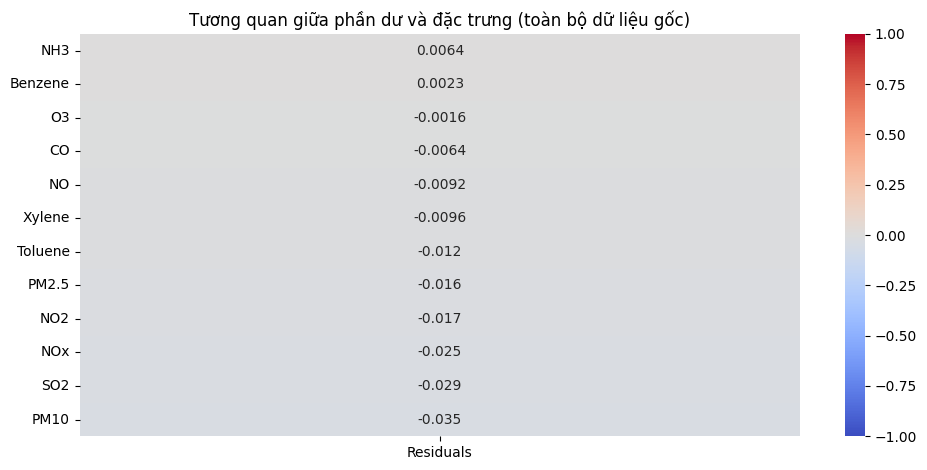

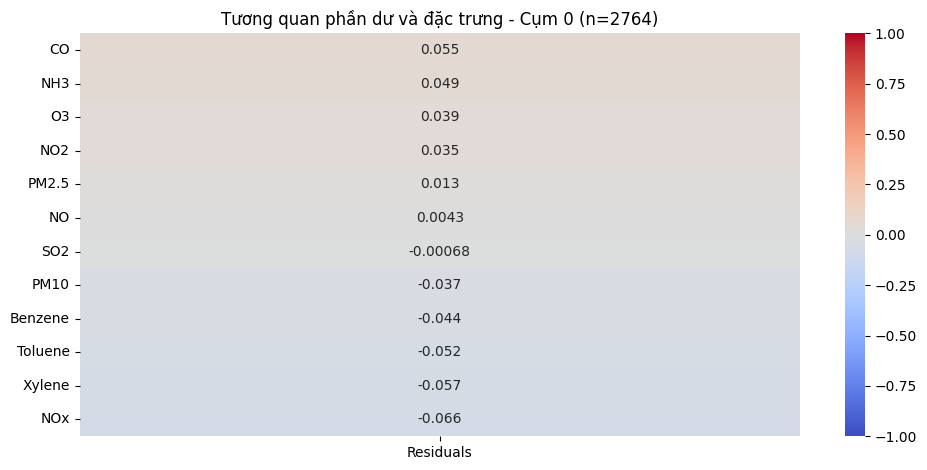

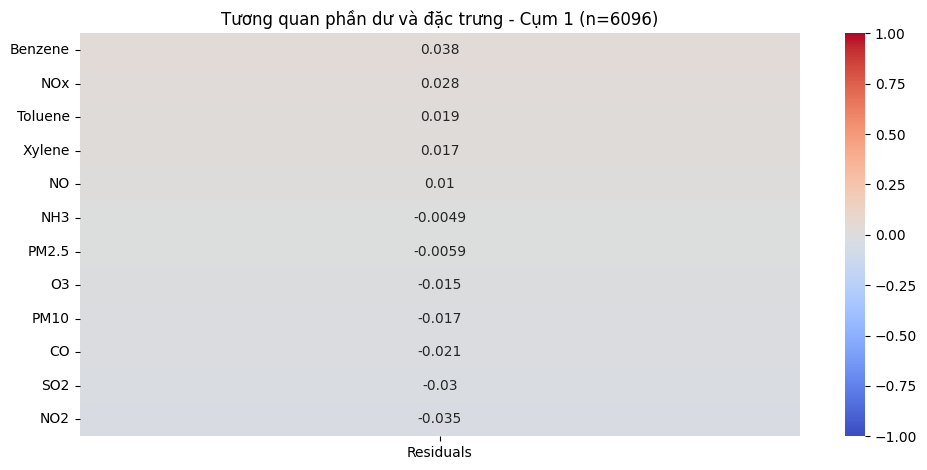


6. SO SÁNH FEATURE IMPORTANCE GIỮA MÔ HÌNH TOÀN CỤC VÀ MÔ HÌNH THEO CỤM

Top 10 Feature Importance (Mô hình toàn cục):
PM2.5     0.6373
CO        0.1686
PM10      0.0604
NH3       0.0290
NO        0.0258
NOx       0.0181
NO2       0.0148
O3        0.0129
Xylene    0.0111
SO2       0.0099
dtype: float64

Feature Importance theo cụm (Top 10 features):
        Cluster 0  Cluster 1
PM2.5      0.4233     0.5490
CO         0.2440     0.0799
PM10       0.0618     0.1698
NH3        0.1127     0.0195
NO         0.0455     0.0262
NOx        0.0134     0.0214
NO2        0.0358     0.0226
O3         0.0183     0.0323
Xylene     0.0133     0.0266
SO2        0.0127     0.0256

So sánh trung bình Feature Importance:
        Global Model  Cluster Average  Cluster Std
PM2.5         0.6373           0.4861       0.0888
CO            0.1686           0.1620       0.1161
PM10          0.0604           0.1158       0.0764
NH3           0.0290           0.0661       0.0659
NO            0.0258           0.

In [ ]:
# Chuẩn bị dữ liệu cho các mô hình khác nhau
target = 'AQI'
original_features = [col for col in numeric_cols if col != target]
X_original = df[original_features].values
y = df[target]

# Lấy thông tin phân cụm K-means
cluster_data = {
    'Original Data': {'X': X_original, 'labels': km_orig.labels_, 'k': best_k_orig},
    'PCA Data': {'X': X_pca_full, 'labels': km_pca.labels_, 'k': best_k_pca},
    't-SNE Data': {'X': X_tsne_2d, 'labels': km_tsne.labels_, 'k': best_k_tsne}
}

# 1. Phân tích phần dư theo từng tỉ lệ train:test
print("="*80)
print("1. ĐÁNH GIÁ PHẦN DƯ CỦA MÔ HÌNH RANDOM FOREST THEO TỈ LỆ TRAIN:TEST")
print("="*80)

test_sizes = [0.2, 0.3, 0.4]
overall_results = []

for test_size in test_sizes:
    train_size = 1 - test_size
    train_ratio = int(train_size * 10)
    test_ratio = int(test_size * 10)

    for data_name, data_info in cluster_data.items():
        X_data = data_info['X']

        # Phân chia dữ liệu
        X_train, X_val, y_train, y_val = train_test_split(
            X_data, y, test_size=test_size, random_state=42
        )

        # Huấn luyện mô hình Random Forest với 100 cây
        rf_model = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
        rf_model.fit(X_train, y_train)

        # Dự đoán và tính phần dư
        y_pred = rf_model.predict(X_val)
        residuals = y_val - y_pred

        # Tính các chỉ số đánh giá
        mse = mean_squared_error(y_val, y_pred)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_val, y_pred)
        mae = mean_absolute_error(y_val, y_pred)

        # Thống kê phần dư
        residual_mean = np.mean(residuals)
        residual_std = np.std(residuals)
        residual_min = np.min(residuals)
        residual_max = np.max(residuals)

        overall_results.append({
            'Data Type': data_name,
            'Train:Test': f'{train_ratio}:{test_ratio}',
            'Train Size': len(X_train),
            'Val Size': len(X_val),
            'MSE': mse,
            'RMSE': rmse,
            'R²': r2,
            'MAE': mae,
            'Residual Mean': residual_mean,
            'Residual Std': residual_std,
            'Residual Min': residual_min,
            'Residual Max': residual_max
        })

# Tạo DataFrame và hiển thị kết quả
overall_df = pd.DataFrame(overall_results)
print("\nBảng kết quả tổng quan theo tỉ lệ train:test:")
print(overall_df.round(4).to_string(index=False))

# Tạo bảng pivot cho dễ so sánh
print("\n" + "="*50)
print("BẢNG SO SÁNH MSE THEO LOẠI DỮ LIỆU VÀ TỈ LỆ")
print("="*50)
mse_pivot = overall_df.pivot(index='Data Type', columns='Train:Test', values='MSE')
print(mse_pivot.round(4))

print("\n" + "="*50)
print("BẢNG SO SÁNH R² THEO LOẠI DỮ LIỆU VÀ TỈ LỆ")
print("="*50)
r2_pivot = overall_df.pivot(index='Data Type', columns='Train:Test', values='R²')
print(r2_pivot.round(4))

# 2. Phân tích phần dư theo các cụm K-means
print("\n" + "="*80)
print("2. PHÂN TÍCH PHẦN DƯ THEO CÁC CỤM K-MEANS (TỈ LỆ 7:3)")
print("="*80)

test_size = 0.3
results_by_cluster = []

for data_name, data_info in cluster_data.items():
    X_data = data_info['X']
    labels = data_info['labels']
    k = data_info['k']

    print(f"\n--- PHÂN TÍCH CHO {data_name.upper()} ---")

    # Phân tích từng cụm
    cluster_results = []
    for cluster_id in range(k):
        # Lấy dữ liệu của cụm
        cluster_indices = np.where(labels == cluster_id)[0]

        # Bỏ qua cụm quá nhỏ
        if len(cluster_indices) < 30:
            print(f"Cụm {cluster_id}: Quá nhỏ ({len(cluster_indices)} mẫu) - Bỏ qua")
            continue

        X_cluster = X_data[cluster_indices]
        y_cluster = y.iloc[cluster_indices]

        # Phân chia tập train và validation
        X_train, X_val, y_train, y_val = train_test_split(
            X_cluster, y_cluster, test_size=test_size, random_state=42
        )

        # Huấn luyện mô hình
        rf_model = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
        rf_model.fit(X_train, y_train)

        # Dự đoán và tính phần dư
        y_pred = rf_model.predict(X_val)
        residuals = y_val - y_pred

        # Tính metrics
        mse = mean_squared_error(y_val, y_pred)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_val, y_pred)
        mae = mean_absolute_error(y_val, y_pred)

        # Thống kê phần dư
        residual_mean = np.mean(residuals)
        residual_std = np.std(residuals)
        residual_min = np.min(residuals)
        residual_max = np.max(residuals)

        cluster_result = {
            'Data': data_name,
            'Cluster': cluster_id,
            'Total Size': len(cluster_indices),
            'Train Size': len(X_train),
            'Val Size': len(X_val),
            'MSE': mse,
            'RMSE': rmse,
            'R²': r2,
            'MAE': mae,
            'Residual Mean': residual_mean,
            'Residual Std': residual_std,
            'Residual Min': residual_min,
            'Residual Max': residual_max
        }

        cluster_results.append(cluster_result)
        results_by_cluster.append(cluster_result)

    # Hiển thị bảng kết quả cho loại dữ liệu hiện tại
    if cluster_results:
        cluster_df = pd.DataFrame(cluster_results)
        print(cluster_df.round(4).to_string(index=False))

# 3. So sánh phân phối phần dư giữa các cụm
print("\n" + "="*80)
print("3. THỐNG KÊ PHÂN PHỐI PHẦN DƯ THEO CỤM")
print("="*80)

residual_distribution = []

for data_name, data_info in cluster_data.items():
    X_data = data_info['X']
    labels = data_info['labels']
    k = data_info['k']

    # Tính phần dư cho toàn bộ dữ liệu
    X_train, X_val, y_train, y_val, train_indices, val_indices = train_test_split(
        X_data, y, np.arange(len(y)), test_size=0.3, random_state=42
    )

    rf_model = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
    rf_model.fit(X_train, y_train)

    y_pred = rf_model.predict(X_val)
    residuals = y_val - y_pred

    # Lấy nhãn cụm tương ứng với các mẫu trong tập validation
    val_labels = labels[val_indices]

    # Thống kê cho toàn bộ dữ liệu
    residual_distribution.append({
        'Data': data_name,
        'Cluster': 'All',
        'Sample Count': len(residuals),
        'Mean': np.mean(residuals),
        'Std': np.std(residuals),
        'Min': np.min(residuals),
        'Q25': np.percentile(residuals, 25),
        'Median': np.median(residuals),
        'Q75': np.percentile(residuals, 75),
        'Max': np.max(residuals)
    })

    # Thống kê cho từng cụm
    for cluster_id in range(k):
        cluster_residuals = residuals[val_labels == cluster_id]
        if len(cluster_residuals) > 0:
            residual_distribution.append({
                'Data': data_name,
                'Cluster': cluster_id,
                'Sample Count': len(cluster_residuals),
                'Mean': np.mean(cluster_residuals),
                'Std': np.std(cluster_residuals),
                'Min': np.min(cluster_residuals),
                'Q25': np.percentile(cluster_residuals, 25),
                'Median': np.median(cluster_residuals),
                'Q75': np.percentile(cluster_residuals, 75),
                'Max': np.max(cluster_residuals)
            })

residual_df = pd.DataFrame(residual_distribution)
print(residual_df.round(4).to_string(index=False))

# 4. So sánh hiệu suất mô hình giữa các cụm
print("\n" + "="*80)
print("4. SO SÁNH HIỆU SUẤT MÔ HÌNH GIỮA CÁC CỤM")
print("="*80)

if results_by_cluster:
    results_df = pd.DataFrame(results_by_cluster)

    # Tạo bảng so sánh MSE
    print("\nBảng so sánh MSE theo cụm:")
    mse_comparison = results_df.pivot(index='Data', columns='Cluster', values='MSE')
    print(mse_comparison.round(4))

    # Tạo bảng so sánh R²
    print("\nBảng so sánh R² theo cụm:")
    r2_comparison = results_df.pivot(index='Data', columns='Cluster', values='R²')
    print(r2_comparison.round(4))

    # Tạo bảng so sánh kích thước cụm
    print("\nBảng so sánh kích thước cụm:")
    size_comparison = results_df.pivot(index='Data', columns='Cluster', values='Total Size')
    print(size_comparison.round(0))

    # Tạo bảng so sánh MAE
    print("\nBảng so sánh MAE theo cụm:")
    mae_comparison = results_df.pivot(index='Data', columns='Cluster', values='MAE')
    print(mae_comparison.round(4))

# 5. Phân tích tương quan giữa phần dư và đặc trưng cho từng cụm (chỉ với dữ liệu gốc)
print("\n" + "="*80)
print("5. PHÂN TÍCH TƯƠNG QUAN GIỮA PHẦN DƯ VÀ ĐẶC TRƯNG CHO TỪNG CỤM (DỮ LIỆU GỐC)")
print("="*80)

X_train, X_val, y_train, y_val, train_indices, val_indices = train_test_split(
    X_original, y, np.arange(len(y)), test_size=0.3, random_state=42
)

X_val_df = pd.DataFrame(X_val, columns=original_features)

# Huấn luyện mô hình trên toàn bộ dữ liệu
rf_model = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_val)
residuals = y_val - y_pred

X_val_df['Residuals'] = residuals
X_val_df['Cluster'] = km_orig.labels_[val_indices]  # Gán nhãn cụm

# Tạo ma trận tương quan cho toàn bộ dữ liệu
correlation_matrix = X_val_df[original_features + ['Residuals']].corr()

# Vẽ heatmap toàn bộ dữ liệu
plt.figure(figsize=(10, len(original_features) * 0.4))
sns.heatmap(correlation_matrix.loc[original_features, ['Residuals']].sort_values(by='Residuals', ascending=False),
            annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Tương quan giữa phần dư và đặc trưng (toàn bộ dữ liệu gốc)')
plt.tight_layout()
plt.show()

# Vẽ heatmap cho từng cụm
for cluster_id in range(best_k_orig):
    cluster_data = X_val_df[X_val_df['Cluster'] == cluster_id]

    if len(cluster_data) < 30:
        print(f"Cụm {cluster_id} quá nhỏ (n={len(cluster_data)}), bỏ qua heatmap.")
        continue

    cluster_corr = cluster_data[original_features + ['Residuals']].corr()

    plt.figure(figsize=(10, len(original_features) * 0.4))
    sns.heatmap(cluster_corr.loc[original_features, ['Residuals']].sort_values(by='Residuals', ascending=False),
                annot=True, cmap='coolwarm', vmin=-1, vmax=1)
    plt.title(f'Tương quan phần dư và đặc trưng - Cụm {cluster_id} (n={len(cluster_data)})')
    plt.tight_layout()
    plt.show()

# 6. So sánh Feature Importance giữa mô hình toàn cục và mô hình theo cụm
print("\n" + "="*80)
print("6. SO SÁNH FEATURE IMPORTANCE GIỮA MÔ HÌNH TOÀN CỤC VÀ MÔ HÌNH THEO CỤM")
print("="*80)

# Feature importance cho mô hình toàn cục
feature_importances = pd.Series(rf_model.feature_importances_, index=original_features)
feature_importances = feature_importances.sort_values(ascending=False)
top_features = feature_importances.head(10).index

print("\nTop 10 Feature Importance (Mô hình toàn cục):")
print(feature_importances.head(10).round(4))

# Feature importance cho từng cụm
cluster_importance = pd.DataFrame(index=original_features)

for cluster_id in range(best_k_orig):
    cluster_indices = np.where(km_orig.labels_ == cluster_id)[0]

    if len(cluster_indices) < 50:
        continue

    X_cluster = X_original[cluster_indices]
    y_cluster = y.iloc[cluster_indices]

    X_train, X_val, y_train, y_val = train_test_split(
        X_cluster, y_cluster, test_size=0.3, random_state=42
    )

    rf_model_cluster = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
    rf_model_cluster.fit(X_train, y_train)

    cluster_importance[f'Cluster {cluster_id}'] = rf_model_cluster.feature_importances_

# Hiển thị Feature Importance theo cụm (chỉ top 10 features)
if not cluster_importance.empty:
    print("\nFeature Importance theo cụm (Top 10 features):")
    top_cluster_importance = cluster_importance.loc[top_features]
    print(top_cluster_importance.round(4))

    # So sánh trung bình
    print("\nSo sánh trung bình Feature Importance:")
    comparison_table = pd.DataFrame({
        'Global Model': feature_importances.loc[top_features],
        'Cluster Average': top_cluster_importance.mean(axis=1),
        'Cluster Std': top_cluster_importance.std(axis=1)
    })
    print(comparison_table.round(4))

print("\n" + "="*80)
print("KẾT THÚC PHÂN TÍCH PHẦN DƯ")
print("="*80)

### MLP

1. ĐÁNH GIÁ PHẦN DƯ CỦA MÔ HÌNH MLP THEO TỈ LỆ TRAIN:TEST

Bảng kết quả tổng quan theo tỉ lệ train:test:
    Data Type Train:Test  Train Size  Val Size       MSE    RMSE     R²     MAE  Residual Mean  Residual Std  Residual Min  Residual Max
Original Data        8:2       23624      5907 1100.8416 33.1789 0.8986 21.5505        -0.4806       33.1755     -274.9650      286.6950
     PCA Data        8:2       23624      5907 1079.5648 32.8567 0.9006 20.7728         0.8627       32.8454     -289.8600      292.0967
   t-SNE Data        8:2       23624      5907 3727.0438 61.0495 0.6567 44.2544        -0.4124       61.0481     -253.7982      291.4984
Original Data        7:3       20671      8860 1104.7961 33.2385 0.8989 21.9691         0.3539       33.2366     -277.1871      282.0469
     PCA Data        7:3       20671      8860 1060.4338 32.5643 0.9030 20.9114        -0.0891       32.5642     -308.5134      292.8222
   t-SNE Data        7:3       20671      8860 3903.2121 62.4757 0.6430 4

/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


      Data  Cluster  Total Size  Train Size  Val Size       MSE    RMSE     R²     MAE  Residual Mean  Residual Std  Residual Min  Residual Max
t-SNE Data        0        7096        4967      2129 8092.1943 89.9566 0.3692 70.3745        13.3581       88.9593     -298.8212      220.1536
t-SNE Data        1        7270        5089      2181 5003.8147 70.7376 0.3903 52.8561        -1.3044       70.7256     -194.8586      255.5967
t-SNE Data        2        8468        5927      2541 1923.0291 43.8524 0.6008 30.7442        -2.0184       43.8059     -122.6892      283.7197
t-SNE Data        3        6697        4687      2010 1517.2296 38.9516 0.3222 27.2294         0.6113       38.9468     -108.6344      261.2733

3. THỐNG KÊ PHÂN PHỐI PHẦN DƯ THEO CỤM
         Data Cluster  Sample Count    Mean     Std       Min      Q25   Median     Q75      Max
Original Data     All          8860  0.3539 33.2366 -277.1871 -14.8267   0.5438 13.0962 282.0469
Original Data       0          2764  0.1155 40

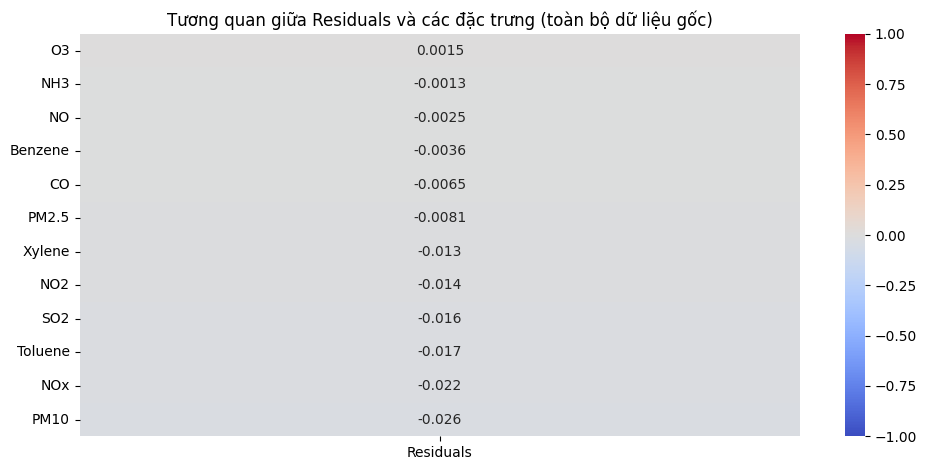

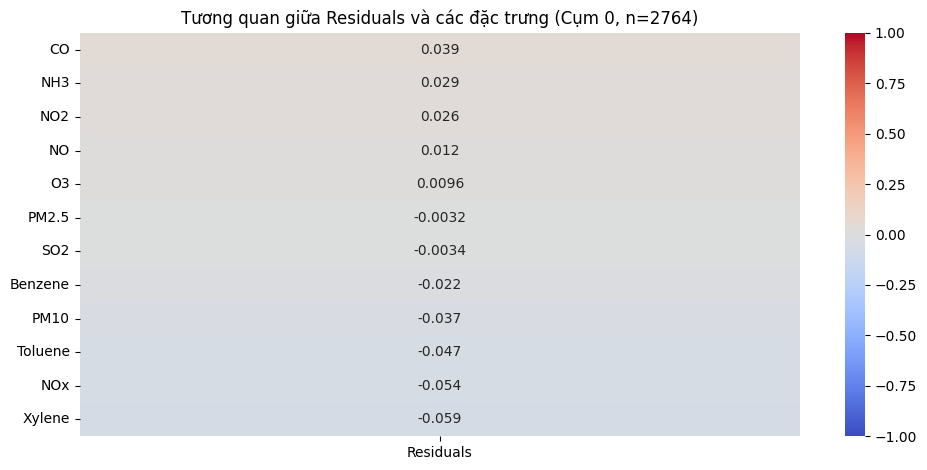

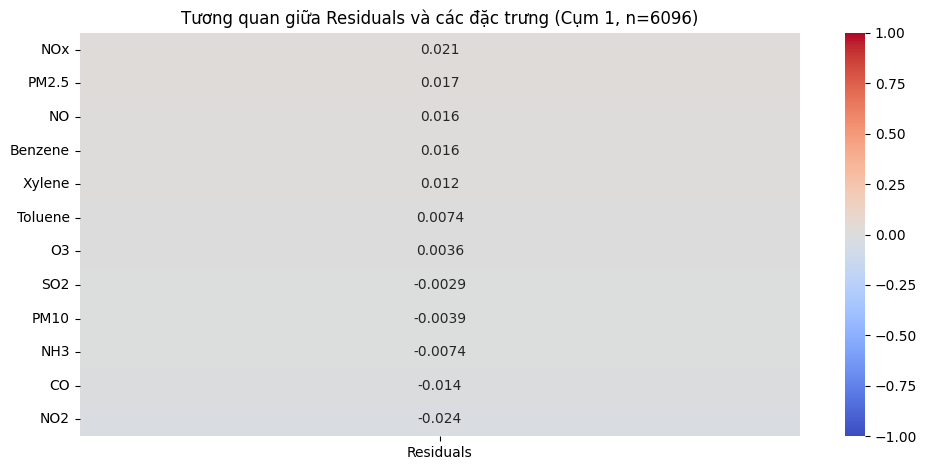

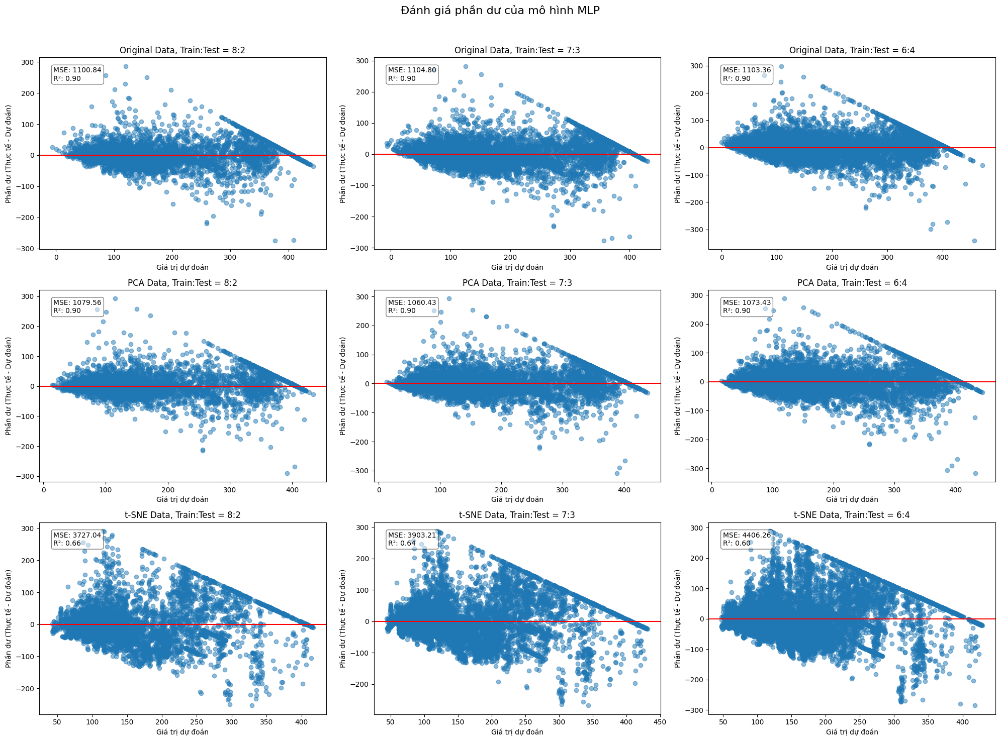

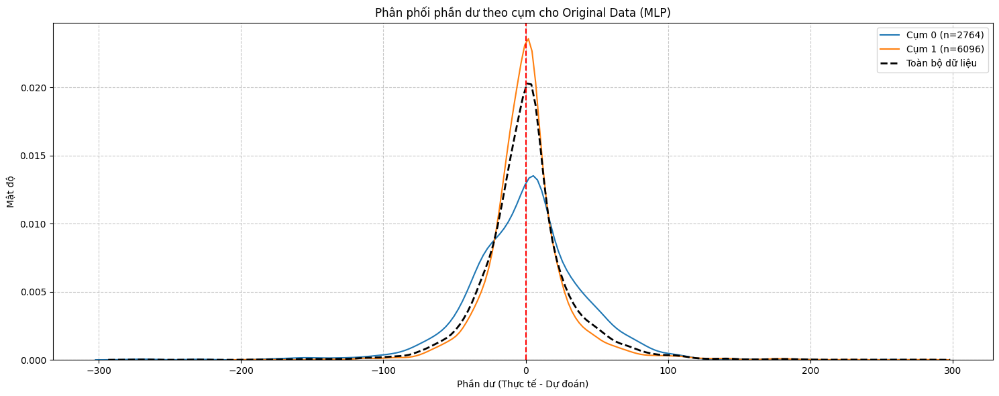

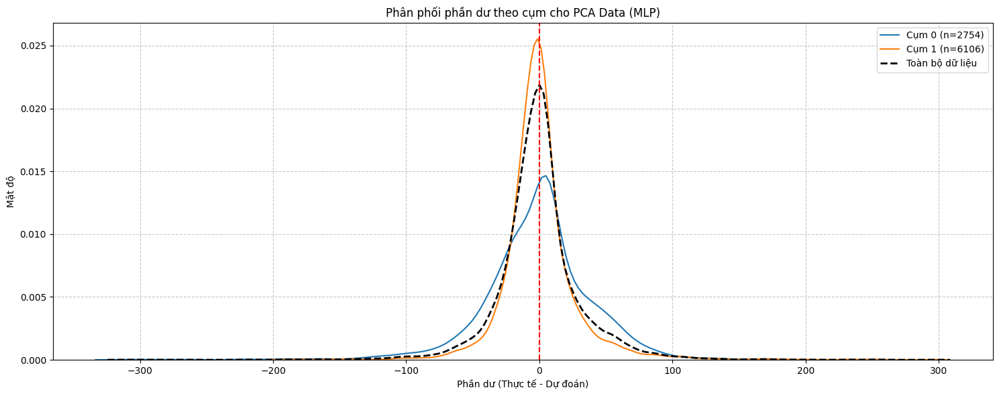

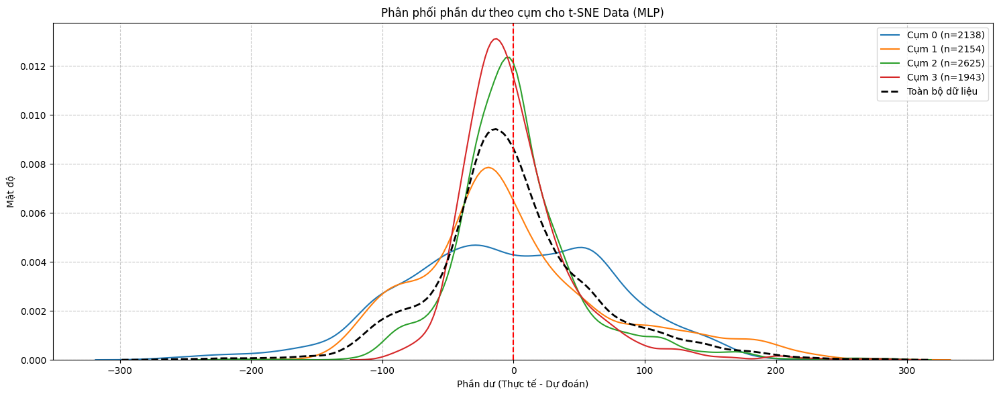


KẾT THÚC PHÂN TÍCH PHẦN DƯ MLP


In [ ]:
# Chuẩn bị dữ liệu cho các mô hình khác nhau
target = 'AQI'
original_features = [col for col in numeric_cols if col != target]
X_original = df[original_features].values
y = df[target]

# Lấy thông tin phân cụm K-means
cluster_data = {
    'Original Data': {'X': X_original, 'labels': km_orig.labels_, 'k': best_k_orig},
    'PCA Data': {'X': X_pca_full, 'labels': km_pca.labels_, 'k': best_k_pca},
    't-SNE Data': {'X': X_tsne_2d, 'labels': km_tsne.labels_, 'k': best_k_tsne}
}

# 1. Phân tích phần dư theo từng tỉ lệ train:test
print("="*80)
print("1. ĐÁNH GIÁ PHẦN DƯ CỦA MÔ HÌNH MLP THEO TỈ LỆ TRAIN:TEST")
print("="*80)

test_sizes = [0.2, 0.3, 0.4]
overall_results = []

for test_size in test_sizes:
    train_size = 1 - test_size
    train_ratio = int(train_size * 10)
    test_ratio = int(test_size * 10)

    for data_name, data_info in cluster_data.items():
        X_data = data_info['X']

        # Phân chia dữ liệu
        X_train, X_val, y_train, y_val = train_test_split(
            X_data, y, test_size=test_size, random_state=42
        )

        # Huấn luyện mô hình MLP với hidden layer 100 neurons
        mlp_model = MLPRegressor(
            hidden_layer_sizes=(100,),
            activation='relu',
            solver='adam',
            alpha=0.0001,
            learning_rate='adaptive',
            learning_rate_init=0.001,
            max_iter=500,
            early_stopping=True,
            random_state=42,
            verbose=False
        )
        mlp_model.fit(X_train, y_train)

        # Dự đoán và tính phần dư
        y_pred = mlp_model.predict(X_val)
        residuals = y_val - y_pred

        # Tính các chỉ số đánh giá
        mse = mean_squared_error(y_val, y_pred)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_val, y_pred)
        mae = mean_absolute_error(y_val, y_pred)

        # Thống kê phần dư
        residual_mean = np.mean(residuals)
        residual_std = np.std(residuals)
        residual_min = np.min(residuals)
        residual_max = np.max(residuals)

        overall_results.append({
            'Data Type': data_name,
            'Train:Test': f'{train_ratio}:{test_ratio}',
            'Train Size': len(X_train),
            'Val Size': len(X_val),
            'MSE': mse,
            'RMSE': rmse,
            'R²': r2,
            'MAE': mae,
            'Residual Mean': residual_mean,
            'Residual Std': residual_std,
            'Residual Min': residual_min,
            'Residual Max': residual_max
        })

# Tạo DataFrame và hiển thị kết quả
overall_df = pd.DataFrame(overall_results)
print("\nBảng kết quả tổng quan theo tỉ lệ train:test:")
print(overall_df.round(4).to_string(index=False))

# Tạo bảng pivot cho dễ so sánh
print("\n" + "="*50)
print("BẢNG SO SÁNH MSE THEO LOẠI DỮ LIỆU VÀ TỈ LỆ")
print("="*50)
mse_pivot = overall_df.pivot(index='Data Type', columns='Train:Test', values='MSE')
print(mse_pivot.round(4))

print("\n" + "="*50)
print("BẢNG SO SÁNH R² THEO LOẠI DỮ LIỆU VÀ TỈ LỆ")
print("="*50)
r2_pivot = overall_df.pivot(index='Data Type', columns='Train:Test', values='R²')
print(r2_pivot.round(4))

# 2. Phân tích phần dư theo các cụm K-means
print("\n" + "="*80)
print("2. PHÂN TÍCH PHẦN DƯ THEO CÁC CỤM K-MEANS (TỈ LỆ 7:3)")
print("="*80)

test_size = 0.3
results_by_cluster = []

for data_name, data_info in cluster_data.items():
    X_data = data_info['X']
    labels = data_info['labels']
    k = data_info['k']

    print(f"\n--- PHÂN TÍCH CHO {data_name.upper()} ---")

    # Phân tích từng cụm
    cluster_results = []
    for cluster_id in range(k):
        # Lấy dữ liệu của cụm
        cluster_indices = np.where(labels == cluster_id)[0]

        # Bỏ qua cụm quá nhỏ
        if len(cluster_indices) < 30:
            print(f"Cụm {cluster_id}: Quá nhỏ ({len(cluster_indices)} mẫu) - Bỏ qua")
            continue

        X_cluster = X_data[cluster_indices]
        y_cluster = y.iloc[cluster_indices]

        # Phân chia tập train và validation
        X_train, X_val, y_train, y_val = train_test_split(
            X_cluster, y_cluster, test_size=test_size, random_state=42
        )

        # Huấn luyện mô hình MLP
        mlp_model = MLPRegressor(
            hidden_layer_sizes=(100,),
            activation='relu',
            solver='adam',
            alpha=0.0001,
            learning_rate='adaptive',
            learning_rate_init=0.001,
            max_iter=500,
            early_stopping=True,
            random_state=42,
            verbose=False
        )
        mlp_model.fit(X_train, y_train)

        # Dự đoán và tính phần dư
        y_pred = mlp_model.predict(X_val)
        residuals = y_val - y_pred

        # Tính metrics
        mse = mean_squared_error(y_val, y_pred)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_val, y_pred)
        mae = mean_absolute_error(y_val, y_pred)

        # Thống kê phần dư
        residual_mean = np.mean(residuals)
        residual_std = np.std(residuals)
        residual_min = np.min(residuals)
        residual_max = np.max(residuals)

        cluster_result = {
            'Data': data_name,
            'Cluster': cluster_id,
            'Total Size': len(cluster_indices),
            'Train Size': len(X_train),
            'Val Size': len(X_val),
            'MSE': mse,
            'RMSE': rmse,
            'R²': r2,
            'MAE': mae,
            'Residual Mean': residual_mean,
            'Residual Std': residual_std,
            'Residual Min': residual_min,
            'Residual Max': residual_max
        }

        cluster_results.append(cluster_result)
        results_by_cluster.append(cluster_result)

    # Hiển thị bảng kết quả cho loại dữ liệu hiện tại
    if cluster_results:
        cluster_df = pd.DataFrame(cluster_results)
        print(cluster_df.round(4).to_string(index=False))

# 3. So sánh phân phối phần dư giữa các cụm
print("\n" + "="*80)
print("3. THỐNG KÊ PHÂN PHỐI PHẦN DƯ THEO CỤM")
print("="*80)

residual_distribution = []

for data_name, data_info in cluster_data.items():
    X_data = data_info['X']
    labels = data_info['labels']
    k = data_info['k']

    # Tính phần dư cho toàn bộ dữ liệu
    X_train, X_val, y_train, y_val, train_indices, val_indices = train_test_split(
        X_data, y, np.arange(len(y)), test_size=0.3, random_state=42
    )

    mlp_model = MLPRegressor(
        hidden_layer_sizes=(100,),
        activation='relu',
        solver='adam',
        alpha=0.0001,
        learning_rate='adaptive',
        learning_rate_init=0.001,
        max_iter=500,
        early_stopping=True,
        random_state=42,
        verbose=False
    )
    mlp_model.fit(X_train, y_train)

    y_pred = mlp_model.predict(X_val)
    residuals = y_val - y_pred

    # Lấy nhãn cụm tương ứng với các mẫu trong tập validation
    val_labels = labels[val_indices]

    # Thống kê cho toàn bộ dữ liệu
    residual_distribution.append({
        'Data': data_name,
        'Cluster': 'All',
        'Sample Count': len(residuals),
        'Mean': np.mean(residuals),
        'Std': np.std(residuals),
        'Min': np.min(residuals),
        'Q25': np.percentile(residuals, 25),
        'Median': np.median(residuals),
        'Q75': np.percentile(residuals, 75),
        'Max': np.max(residuals)
    })

    # Thống kê cho từng cụm
    for cluster_id in range(k):
        cluster_residuals = residuals[val_labels == cluster_id]
        if len(cluster_residuals) > 0:
            residual_distribution.append({
                'Data': data_name,
                'Cluster': cluster_id,
                'Sample Count': len(cluster_residuals),
                'Mean': np.mean(cluster_residuals),
                'Std': np.std(cluster_residuals),
                'Min': np.min(cluster_residuals),
                'Q25': np.percentile(cluster_residuals, 25),
                'Median': np.median(cluster_residuals),
                'Q75': np.percentile(cluster_residuals, 75),
                'Max': np.max(cluster_residuals)
            })

residual_df = pd.DataFrame(residual_distribution)
print(residual_df.round(4).to_string(index=False))

# 4. So sánh hiệu suất mô hình giữa các cụm
print("\n" + "="*80)
print("4. SO SÁNH HIỆU SUẤT MÔ HÌNH GIỮA CÁC CỤM")
print("="*80)

if results_by_cluster:
    results_df = pd.DataFrame(results_by_cluster)

    # Tạo bảng so sánh MSE
    print("\nBảng so sánh MSE theo cụm:")
    mse_comparison = results_df.pivot(index='Data', columns='Cluster', values='MSE')
    print(mse_comparison.round(4))

    # Tạo bảng so sánh R²
    print("\nBảng so sánh R² theo cụm:")
    r2_comparison = results_df.pivot(index='Data', columns='Cluster', values='R²')
    print(r2_comparison.round(4))

    # Tạo bảng so sánh kích thước cụm
    print("\nBảng so sánh kích thước cụm:")
    size_comparison = results_df.pivot(index='Data', columns='Cluster', values='Total Size')
    print(size_comparison.round(0))

    # Tạo bảng so sánh MAE
    print("\nBảng so sánh MAE theo cụm:")
    mae_comparison = results_df.pivot(index='Data', columns='Cluster', values='MAE')
    print(mae_comparison.round(4))

# 5. TƯƠNG QUAN GIỮA PHẦN DƯ VÀ CÁC ĐẶC TRƯNG (DỮ LIỆU GỐC) – SỬ DỤNG HEATMAP
print("\n" + "="*80)
print("5. TƯƠNG QUAN GIỮA PHẦN DƯ VÀ CÁC ĐẶC TRƯNG (DỮ LIỆU GỐC)")
print("="*80)

# Chia train/val trên dữ liệu gốc
X_train, X_val, y_train, y_val, train_indices, val_indices = train_test_split(
    X_original, y, np.arange(len(y)), test_size=0.3, random_state=42
)

# Chuyển X_val thành DataFrame để dễ thao tác
X_val_df = pd.DataFrame(X_val, columns=original_features)

# Huấn luyện mô hình MLP trên toàn bộ tập train
mlp_model = MLPRegressor(
    hidden_layer_sizes=(100,),
    activation='relu',
    solver='adam',
    alpha=0.0001,
    learning_rate='adaptive',
    learning_rate_init=0.001,
    max_iter=500,
    early_stopping=True,
    random_state=42,
    verbose=False
)
mlp_model.fit(X_train, y_train)
y_pred = mlp_model.predict(X_val)
residuals = y_val - y_pred

# Thêm cột Residuals và nhãn cụm (từ KMeans gốc) vào X_val_df
X_val_df['Residuals'] = residuals
X_val_df['Cluster'] = km_orig.labels_[val_indices]

# --- Toàn bộ dữ liệu ---
# Tạo ma trận tương quan giữa tất cả các đặc trưng và Residuals
corr_full = X_val_df[original_features + ['Residuals']].corr()

plt.figure(figsize=(10, len(original_features) * 0.4))
sns.heatmap(
    corr_full.loc[original_features, ['Residuals']].sort_values(by='Residuals', ascending=False),
    annot=True,
    cmap='coolwarm',
    vmin=-1,
    vmax=1
)
plt.title('Tương quan giữa Residuals và các đặc trưng (toàn bộ dữ liệu gốc)')
plt.tight_layout()
plt.show()

# --- Từng cụm riêng biệt ---
for cluster_id in range(best_k_orig):
    data_cluster = X_val_df[X_val_df['Cluster'] == cluster_id]
    n_samples = len(data_cluster)

    if n_samples < 30:
        print(f"Cụm {cluster_id} quá nhỏ (n={n_samples}), bỏ qua heatmap.")
        continue

    corr_cluster = data_cluster[original_features + ['Residuals']].corr()

    plt.figure(figsize=(10, len(original_features) * 0.4))
    sns.heatmap(
        corr_cluster.loc[original_features, ['Residuals']].sort_values(by='Residuals', ascending=False),
        annot=True,
        cmap='coolwarm',
        vmin=-1,
        vmax=1
    )
    plt.title(f'Tương quan giữa Residuals và các đặc trưng (Cụm {cluster_id}, n={n_samples})')
    plt.tight_layout()
    plt.show()

# 6. Vẽ biểu đồ phân tích phần dư
fig, axes = plt.subplots(3, 3, figsize=(20, 15))
fig.suptitle('Đánh giá phần dư của mô hình MLP', fontsize=16)

# Huấn luyện mô hình với tỉ lệ train:test khác nhau
test_sizes = [0.2, 0.3, 0.4]

for i, test_size in enumerate(test_sizes):
    train_size = 1 - test_size
    train_ratio = int(train_size * 10)
    test_ratio = int(test_size * 10)

    for data_name, data_info in cluster_data.items():
        X_data = data_info['X']
        row = data_info.get('row', list(cluster_data.keys()).index(data_name))

        # Phân chia dữ liệu
        X_train, X_val, y_train, y_val = train_test_split(
            X_data, y, test_size=test_size, random_state=42
        )

        # Huấn luyện mô hình MLP
        mlp_model = MLPRegressor(
            hidden_layer_sizes=(100,),
            activation='relu',
            solver='adam',
            alpha=0.0001,
            learning_rate='adaptive',
            learning_rate_init=0.001,
            max_iter=500,
            early_stopping=True,
            random_state=42,
            verbose=False
        )
        mlp_model.fit(X_train, y_train)

        # Dự đoán và tính phần dư
        y_pred = mlp_model.predict(X_val)
        residuals = y_val - y_pred

        # Vẽ biểu đồ phần dư
        ax = axes[row, i]
        ax.scatter(y_pred, residuals, alpha=0.5)
        ax.axhline(y=0, color='r', linestyle='-')
        ax.set_xlabel('Giá trị dự đoán')
        ax.set_ylabel('Phần dư (Thực tế - Dự đoán)')
        ax.set_title(f'{data_name}, Train:Test = {train_ratio}:{test_ratio}')

        # Tính các chỉ số đánh giá
        mse = mean_squared_error(y_val, y_pred)
        r2 = r2_score(y_val, y_pred)

        # Thêm thông tin MSE và R2 vào biểu đồ
        ax.text(0.05, 0.95, f'MSE: {mse:.2f}\nR²: {r2:.2f}',
                transform=ax.transAxes, fontsize=10,
                verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# 7. Vẽ biểu đồ phân phối phần dư theo cụm
for data_name, data_info in cluster_data.items():
    X_data = data_info['X']
    labels = data_info['labels']
    k = data_info['k']

    plt.figure(figsize=(15, 6))
    plt.title(f'Phân phối phần dư theo cụm cho {data_name} (MLP)')

    # Tính phần dư cho toàn bộ dữ liệu và lưu theo cụm
    X_train, X_val, y_train, y_val, train_indices, val_indices = train_test_split(
        X_data, y, np.arange(len(y)), test_size=0.3, random_state=42
    )

    mlp_model = MLPRegressor(
        hidden_layer_sizes=(100,),
        activation='relu',
        solver='adam',
        alpha=0.0001,
        learning_rate='adaptive',
        learning_rate_init=0.001,
        max_iter=500,
        early_stopping=True,
        random_state=42,
        verbose=False
    )
    mlp_model.fit(X_train, y_train)

    y_pred = mlp_model.predict(X_val)
    residuals = y_val - y_pred

    # Lấy nhãn cụm tương ứng với các mẫu trong tập validation
    val_labels = labels[val_indices]

    # Vẽ phân phối phần dư cho từng cụm
    for cluster_id in range(k):
        cluster_residuals = residuals[val_labels == cluster_id]
        if len(cluster_residuals) > 0:
            sns.kdeplot(cluster_residuals, label=f'Cụm {cluster_id} (n={len(cluster_residuals)})')

    # Vẽ phân phối phần dư cho toàn bộ dữ liệu
    sns.kdeplot(residuals, label='Toàn bộ dữ liệu', color='black', linestyle='--', linewidth=2)

    plt.axvline(x=0, color='r', linestyle='--')
    plt.xlabel('Phần dư (Thực tế - Dự đoán)')
    plt.ylabel('Mật độ')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()
    plt.tight_layout()
    plt.show()

print("\n" + "="*80)
print("KẾT THÚC PHÂN TÍCH PHẦN DƯ MLP")
print("="*80)

# Mô hình phân loại (Naive Bayes, Random Forest)

## Chia đầu ra thành 4 khoảng sao cho số lượng mẫu là xấp xỉ nhau.

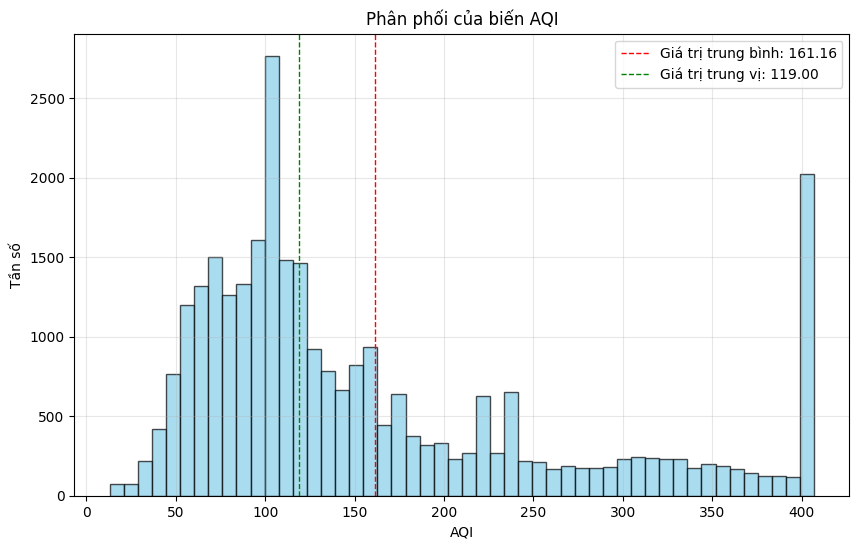

Thống kê mô tả cho AQI:
count    29531.000000
mean       161.156056
std        105.204065
min         13.000000
25%         87.000000
50%        119.000000
75%        215.000000
max        407.000000
Name: AQI, dtype: float64

=== PHÂN TÍCH KẾT HỢP VỚI PHÂN CỤM K-MEANS ===
Số cụm K-means: 2
Phân phối số lượng mẫu theo cụm:
kmeans_cluster
0     9199
1    20332
Name: count, dtype: int64

Các ngưỡng chia AQI thành 4 khoảng cân bằng:
Khoảng 1: 13.00 đến 87.00
Khoảng 2: 87.00 đến 119.00
Khoảng 3: 119.00 đến 215.00
Khoảng 4: 215.00 đến 407.00

Phân phối các lớp AQI sau khi chia:
AQI_class
Rất cao       7416
Trung bình    7407
Cao           7362
Thấp          7346
Name: count, dtype: int64

=== PHÂN TÍCH KẾT HỢP PHÂN CỤM K-MEANS VÀ PHÂN LỚP AQI ===

Phân phối các lớp AQI theo từng cụm K-means:
AQI_class        Cao  Rất cao  Thấp  Trung bình    All
kmeans_cluster                                        
0               2564     5956    61         618   9199
1               4798     1460  7285  

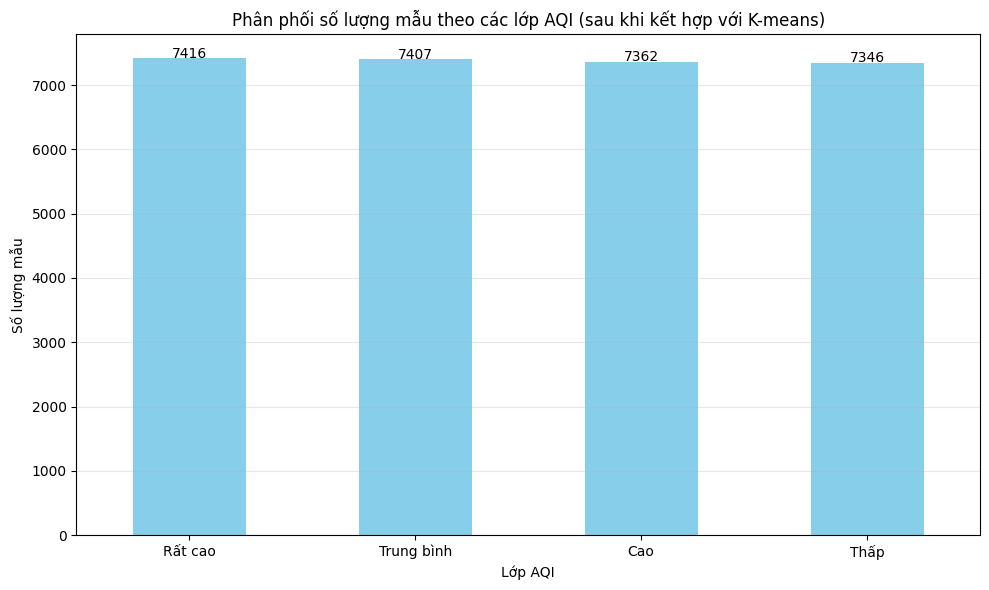

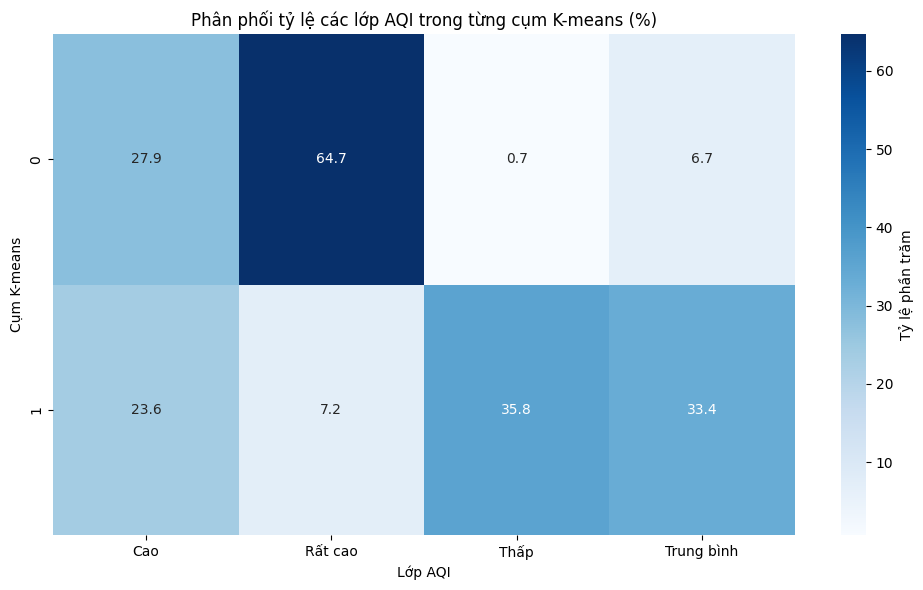

<Figure size 1200x800 with 0 Axes>

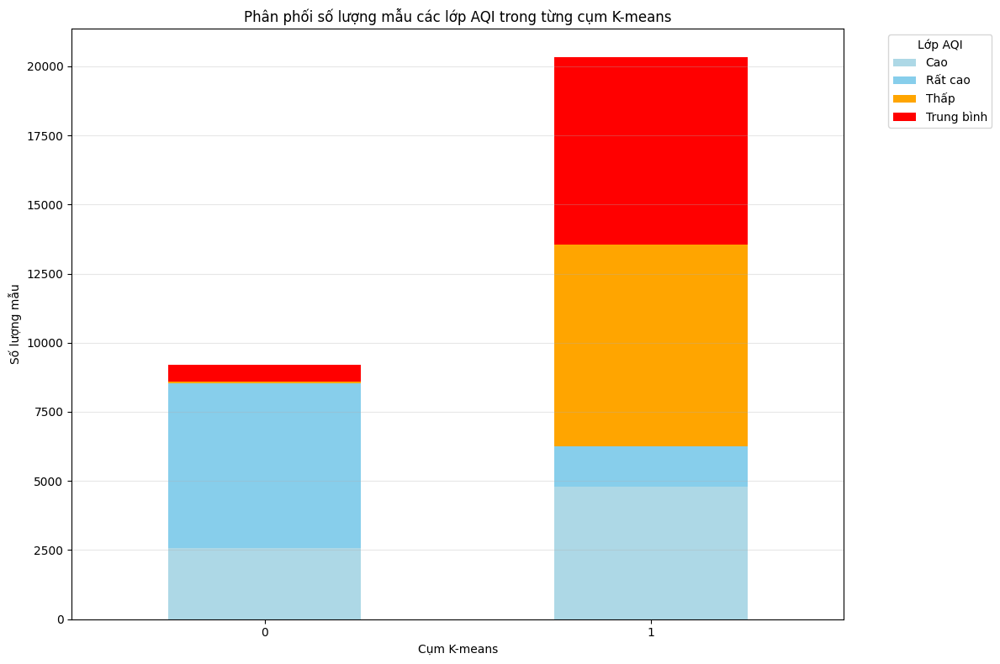


=== THỐNG KÊ CHI TIẾT AQI CHO TỪNG CỤM K-MEANS ===

--- Cụm 0 (n=9199) ---
AQI trung bình: 269.01
AQI trung vị: 264.00
Độ lệch chuẩn AQI: 104.38
AQI min-max: 16.00 - 407.00
Phân phối lớp AQI:
  Cao: 2564 mẫu (27.9%)
  Rất cao: 5956 mẫu (64.7%)
  Thấp: 61 mẫu (0.7%)
  Trung bình: 618 mẫu (6.7%)

--- Cụm 1 (n=20332) ---
AQI trung bình: 112.36
AQI trung vị: 103.00
Độ lệch chuẩn AQI: 59.17
AQI min-max: 13.00 - 407.00
Phân phối lớp AQI:
  Cao: 4798 mẫu (23.6%)
  Rất cao: 1460 mẫu (7.2%)
  Thấp: 7285 mẫu (35.8%)
  Trung bình: 6789 mẫu (33.4%)

=== THỐNG KÊ AQI THEO TỪNG NHÓM (CỤM + LỚP) ===
                                 mean    min    max  count
kmeans_cluster AQI_class                                  
0              Cao         163.795548  119.0  214.0   2564
               Rất cao     333.252034  215.0  407.0   5956
               Thấp         71.475410   16.0   86.0     61
               Trung bình  105.957353   87.0  118.0    618
1              Cao         150.194813  119.0  214.0  

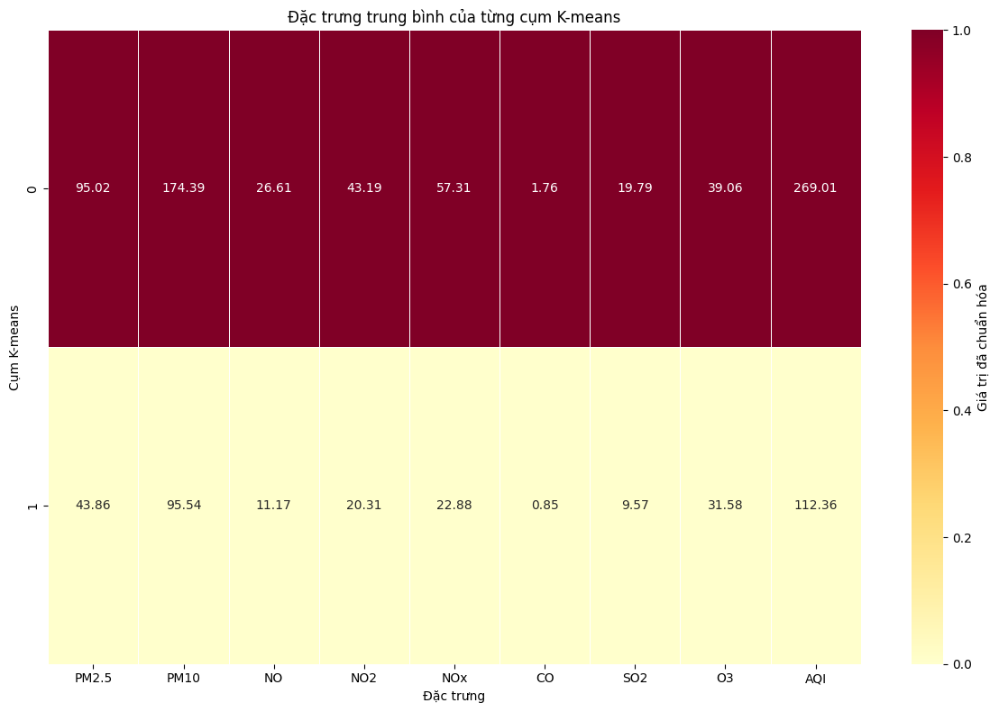


=== BÁO CÁO TỔNG KẾT ===
Tổng số mẫu dữ liệu: 29531
Số cụm K-means: 2
Số lớp AQI: 4

Tóm tắt phân phối:
- Phân cụm K-means:
  Cụm 0: 9199 mẫu (31.2%)
  Cụm 1: 20332 mẫu (68.8%)

- Phân lớp AQI:
  Rất cao: 7416 mẫu (25.1%)
  Trung bình: 7407 mẫu (25.1%)
  Cao: 7362 mẫu (24.9%)
  Thấp: 7346 mẫu (24.9%)

- Đặc điểm nổi bật của từng cụm:
  Cụm 0: Chủ yếu là 'Rất cao' (64.7%), AQI trung bình = 269.01
  Cụm 1: Chủ yếu là 'Thấp' (35.8%), AQI trung bình = 112.36


In [ ]:
# Hiển thị histogram của AQI
plt.figure(figsize=(10, 6))
plt.hist(df['AQI'], bins=50, alpha=0.7, color='skyblue', edgecolor='black')
plt.axvline(df['AQI'].mean(), color='red', linestyle='--', linewidth=1,
           label=f'Giá trị trung bình: {df["AQI"].mean():.2f}')
plt.axvline(df['AQI'].median(), color='green', linestyle='--', linewidth=1,
           label=f'Giá trị trung vị: {df["AQI"].median():.2f}')
plt.title('Phân phối của biến AQI')
plt.xlabel('AQI')
plt.ylabel('Tần số')
plt.grid(alpha=0.3)
plt.legend()
plt.show()

# Thống kê mô tả cho AQI
print("Thống kê mô tả cho AQI:")
print(df['AQI'].describe())

# BƯỚC 1: Kết hợp nhãn phân cụm K-means từ dữ liệu gốc
df['kmeans_cluster'] = km_orig.labels_

print("\n=== PHÂN TÍCH KẾT HỢP VỚI PHÂN CỤM K-MEANS ===")
print(f"Số cụm K-means: {best_k_orig}")
print(f"Phân phối số lượng mẫu theo cụm:")
print(df['kmeans_cluster'].value_counts().sort_index())

# BƯỚC 2: Chia đầu ra AQI thành 4 khoảng có số lượng mẫu xấp xỉ nhau
# Sử dụng KBinsDiscretizer để chia thành 4 khoảng cân bằng (số lượng mẫu xấp xỉ nhau)
kbins = KBinsDiscretizer(n_bins=4, encode='ordinal', strategy='quantile')
df['AQI_class_numeric'] = kbins.fit_transform(df[['AQI']])

# Hiển thị các ngưỡng
bin_edges = kbins.bin_edges_[0]
print("\nCác ngưỡng chia AQI thành 4 khoảng cân bằng:")
for i in range(len(bin_edges)-1):
    print(f"Khoảng {i+1}: {bin_edges[i]:.2f} đến {bin_edges[i+1]:.2f}")

# Tạo nhãn có ý nghĩa cho các lớp
def assign_aqi_class(value):
    if value == 0:
        return 'Thấp'
    elif value == 1:
        return 'Trung bình'
    elif value == 2:
        return 'Cao'
    else:
        return 'Rất cao'

# Áp dụng nhãn cho các lớp
df['AQI_class'] = df['AQI_class_numeric'].apply(assign_aqi_class)

# Kiểm tra phân phối của các lớp
class_distribution = df['AQI_class'].value_counts()
print("\nPhân phối các lớp AQI sau khi chia:")
print(class_distribution)

# BƯỚC 3: Phân tích kết hợp giữa phân cụm K-means và phân lớp AQI
print("\n=== PHÂN TÍCH KẾT HỢP PHÂN CỤM K-MEANS VÀ PHÂN LỚP AQI ===")

# Phân tích phân phối các lớp AQI trong từng cụm K-means
print("\nPhân phối các lớp AQI theo từng cụm K-means:")
cluster_aqi_distribution = pd.crosstab(df['kmeans_cluster'], df['AQI_class'], margins=True)
print(cluster_aqi_distribution)

# Phân tích tỷ lệ phần trăm
print("\nTỷ lệ phần trăm các lớp AQI trong từng cụm:")
cluster_aqi_percentage = pd.crosstab(df['kmeans_cluster'], df['AQI_class'], normalize='index') * 100
print(cluster_aqi_percentage.round(2))

# Trực quan hóa phân phối các lớp
plt.figure(figsize=(10, 6))
class_distribution.plot(kind='bar', color='skyblue')
plt.title('Phân phối số lượng mẫu theo các lớp AQI (sau khi kết hợp với K-means)')
plt.xlabel('Lớp AQI')
plt.ylabel('Số lượng mẫu')
plt.grid(axis='y', alpha=0.3)
plt.xticks(rotation=0)
for i, v in enumerate(class_distribution):
    plt.text(i, v + 5, f'{v}', ha='center')
plt.tight_layout()
plt.show()

# Vẽ heatmap thể hiện mối quan hệ giữa cụm K-means và lớp AQI
plt.figure(figsize=(10, 6))
sns.heatmap(cluster_aqi_percentage, annot=True, cmap='Blues', fmt='.1f',
            cbar_kws={'label': 'Tỷ lệ phần trăm'})
plt.title('Phân phối tỷ lệ các lớp AQI trong từng cụm K-means (%)')
plt.xlabel('Lớp AQI')
plt.ylabel('Cụm K-means')
plt.tight_layout()
plt.show()

# Vẽ biểu đồ cột chồng thể hiện số lượng mẫu
plt.figure(figsize=(12, 8))
cluster_aqi_count = pd.crosstab(df['kmeans_cluster'], df['AQI_class'])
cluster_aqi_count.plot(kind='bar', stacked=True, figsize=(12, 8),
                       color=['lightblue', 'skyblue', 'orange', 'red'])
plt.title('Phân phối số lượng mẫu các lớp AQI trong từng cụm K-means')
plt.xlabel('Cụm K-means')
plt.ylabel('Số lượng mẫu')
plt.legend(title='Lớp AQI', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=0)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# BƯỚC 4: Phân tích chi tiết cho từng cụm
print("\n=== THỐNG KÊ CHI TIẾT AQI CHO TỪNG CỤM K-MEANS ===")
for cluster_id in range(best_k_orig):
    cluster_data = df[df['kmeans_cluster'] == cluster_id]
    print(f"\n--- Cụm {cluster_id} (n={len(cluster_data)}) ---")
    print(f"AQI trung bình: {cluster_data['AQI'].mean():.2f}")
    print(f"AQI trung vị: {cluster_data['AQI'].median():.2f}")
    print(f"Độ lệch chuẩn AQI: {cluster_data['AQI'].std():.2f}")
    print(f"AQI min-max: {cluster_data['AQI'].min():.2f} - {cluster_data['AQI'].max():.2f}")

    print("Phân phối lớp AQI:")
    cluster_class_dist = cluster_data['AQI_class'].value_counts().sort_index()
    for class_name, count in cluster_class_dist.items():
        percentage = (count / len(cluster_data)) * 100
        print(f"  {class_name}: {count} mẫu ({percentage:.1f}%)")

# BƯỚC 5: Kiểm tra AQI trung bình trong mỗi nhóm (kết hợp cụm và lớp)
print("\n=== THỐNG KÊ AQI THEO TỪNG NHÓM (CỤM + LỚP) ===")
aqi_by_cluster_class = df.groupby(['kmeans_cluster', 'AQI_class'])['AQI'].agg(['mean', 'min', 'max', 'count'])
print(aqi_by_cluster_class)

# BƯỚC 6: Phân tích đặc trưng của từng cụm
print("\n=== PHÂN TÍCH ĐẶC TRƯNG TRUNG BÌNH CỦA TỪNG CỤM ===")
feature_cols = ['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'CO', 'SO2', 'O3']
cluster_features = df.groupby('kmeans_cluster')[feature_cols + ['AQI']].mean()
print(cluster_features.round(2))

# Vẽ heatmap đặc trưng của từng cụm
plt.figure(figsize=(12, 8))
# Chuẩn hóa dữ liệu để dễ so sánh
cluster_features_norm = (cluster_features - cluster_features.min()) / (cluster_features.max() - cluster_features.min())
sns.heatmap(cluster_features_norm, annot=cluster_features.round(2), fmt='.2f', cmap='YlOrRd',
            linewidths=.5, cbar_kws={'label': 'Giá trị đã chuẩn hóa'})
plt.title('Đặc trưng trung bình của từng cụm K-means')
plt.xlabel('Đặc trưng')
plt.ylabel('Cụm K-means')
plt.tight_layout()
plt.show()

# BƯỚC 7: Tạo báo cáo tổng kết
print("\n=== BÁO CÁO TỔNG KẾT ===")
print(f"Tổng số mẫu dữ liệu: {len(df)}")
print(f"Số cụm K-means: {best_k_orig}")
print(f"Số lớp AQI: 4")

print("\nTóm tắt phân phối:")
print("- Phân cụm K-means:")
for cluster_id in range(best_k_orig):
    cluster_size = len(df[df['kmeans_cluster'] == cluster_id])
    cluster_percentage = (cluster_size / len(df)) * 100
    print(f"  Cụm {cluster_id}: {cluster_size} mẫu ({cluster_percentage:.1f}%)")

print("\n- Phân lớp AQI:")
for class_name, count in class_distribution.items():
    percentage = (count / len(df)) * 100
    print(f"  {class_name}: {count} mẫu ({percentage:.1f}%)")

# Phân tích mối tương quan giữa cụm và lớp AQI
print("\n- Đặc điểm nổi bật của từng cụm:")
for cluster_id in range(best_k_orig):
    cluster_data = df[df['kmeans_cluster'] == cluster_id]
    dominant_class = cluster_data['AQI_class'].mode().iloc[0]
    dominant_percentage = (cluster_data['AQI_class'].value_counts()[dominant_class] / len(cluster_data)) * 100
    avg_aqi = cluster_data['AQI'].mean()

    print(f"  Cụm {cluster_id}: Chủ yếu là '{dominant_class}' ({dominant_percentage:.1f}%), AQI trung bình = {avg_aqi:.2f}")

## Giảm chiều dữ liệu thành 1/3 chiều ban đầu (PCA)

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Chuẩn bị dữ liệu cho PCA
# Sử dụng biến numeric_cols đã có sẵn
X = df[numeric_cols].copy()
# Loại bỏ biến mục tiêu AQI để tránh rò rỉ thông tin
X_features = X.drop('AQI', axis=1)

# Chuẩn hóa dữ liệu
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_features)
X_scaled_df = pd.DataFrame(X_scaled, columns=X_features.columns)

# Thống kê cho dữ liệu đã chuẩn hóa
print("\nThống kê mô tả cho dữ liệu đã chuẩn hóa:")
display(X_scaled_df.describe())

# Thực hiện PCA với n_components=4 (số lượng tối đa)
pca = PCA(n_components=4)
X_pca = pca.fit_transform(X_scaled)


Thống kê mô tả cho dữ liệu đã chuẩn hóa:


,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene
count,2.953100e+04,2.953100e+04,2.953100e+04,2.953100e+04,2.953100e+04,2.953100e+04,2.953100e+04,2.953100e+04,2.953100e+04,29531.000000,2.953100e+04,2.953100e+04
mean,-2.579330e-16,-4.619695e-17,-1.616893e-16,9.624364e-17,1.539898e-17,-6.159593e-17,1.077929e-16,2.001868e-16,-5.389644e-17,0.000000,2.155858e-16,2.694822e-17
std,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017,1.000017e+00,1.000017e+00
min,-1.567575e+00,-1.764659e+00,-1.208837e+00,-1.434235e+00,-1.274251e+00,-1.370857e+00,-1.302990e+00,-1.451121e+00,-1.839946e+00,-0.849966,-7.625106e-01,-8.436265e-01
25%,-7.336398e-01,-8.277019e-01,-7.474308e-01,-7.874099e-01,-7.206806e-01,-7.439780e-01,-6.812217e-01,-7.610429e-01,-7.570870e-01,-0.787448,-7.207701e-01,-8.274646e-01
50%,-2.554302e-01,-1.702229e-01,-3.757918e-01,-2.195427e-01,-2.759281e-01,-3.213563e-01,-2.551950e-01,-3.192473e-01,-5.645374e-02,-0.389603,-4.999688e-01,-7.480362e-01
75%,4.341058e-01,5.400072e-01,5.015478e-01,5.219266e-01,4.863693e-01,3.704499e-01,4.586875e-01,3.634663e-01,5.171039e-01,0.383354,3.714401e-01,7.380701e-01
max,2.185724e+00,2.591571e+00,2.375016e+00,2.485931e+00,2.296944e+00,2.042092e+00,2.168551e+00,2.050230e+00,2.428390e+00,2.139556,2.009755e+00,2.167371e+00


## Naive Bayes với dữ liệu gốc, PCA


----- Tỷ lệ chia train-validation: 0.8:0.2 -----
=== Dữ liệu gốc - Train:Val = 0.8:0.2 ===
Độ chính xác (Accuracy): 0.7036
Độ đo Precision (macro): 0.7000
Độ đo Recall (macro): 0.7036
Độ đo F1-score (macro): 0.7011

Báo cáo phân loại chi tiết:
              precision    recall  f1-score   support

         0.0       0.73      0.80      0.76      1469
         1.0       0.59      0.54      0.56      1482
         2.0       0.62      0.61      0.62      1473
         3.0       0.86      0.86      0.86      1483

    accuracy                           0.70      5907
   macro avg       0.70      0.70      0.70      5907
weighted avg       0.70      0.70      0.70      5907



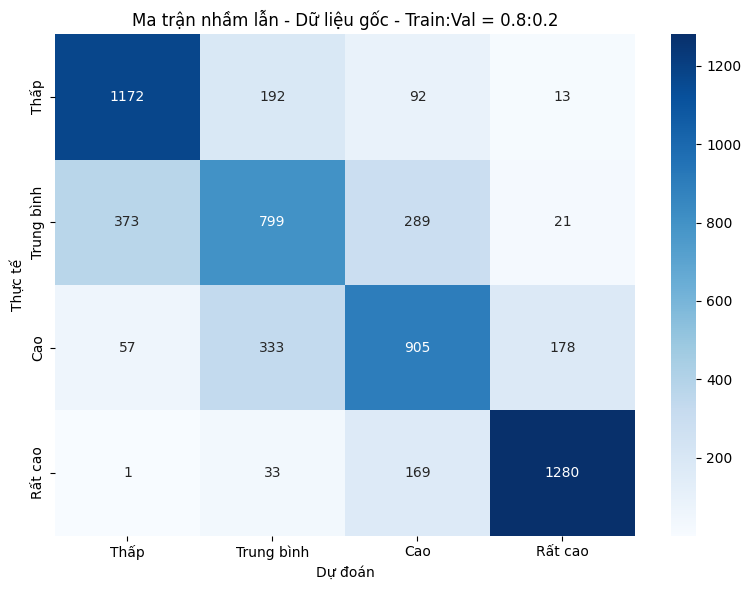

=== Dữ liệu PCA - Train:Val = 0.8:0.2 ===
Độ chính xác (Accuracy): 0.6027
Độ đo Precision (macro): 0.6031
Độ đo Recall (macro): 0.6027
Độ đo F1-score (macro): 0.6010

Báo cáo phân loại chi tiết:
              precision    recall  f1-score   support

         0.0       0.66      0.76      0.71      1469
         1.0       0.47      0.50      0.49      1482
         2.0       0.49      0.43      0.46      1473
         3.0       0.79      0.72      0.75      1483

    accuracy                           0.60      5907
   macro avg       0.60      0.60      0.60      5907
weighted avg       0.60      0.60      0.60      5907



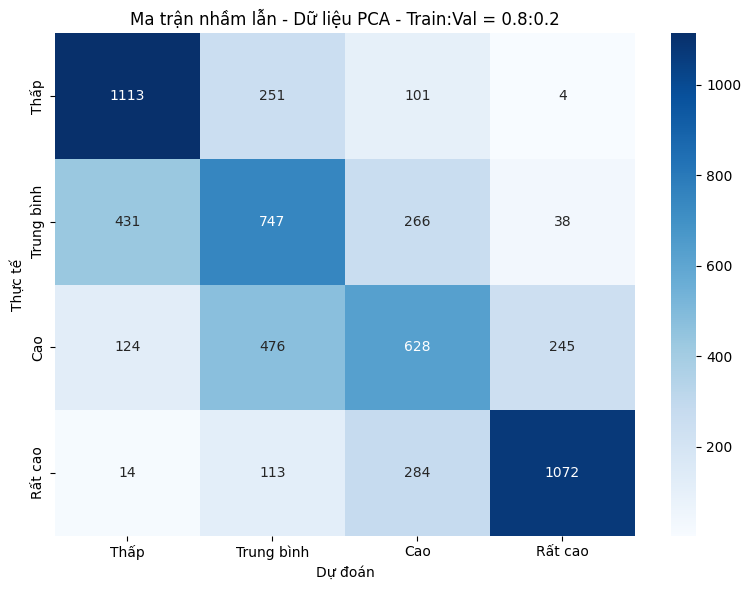


----- Tỷ lệ chia train-validation: 0.7:0.3 -----
=== Dữ liệu gốc - Train:Val = 0.7:0.3 ===
Độ chính xác (Accuracy): 0.7042
Độ đo Precision (macro): 0.7004
Độ đo Recall (macro): 0.7042
Độ đo F1-score (macro): 0.7017

Báo cáo phân loại chi tiết:
              precision    recall  f1-score   support

         0.0       0.73      0.80      0.76      2204
         1.0       0.58      0.55      0.57      2222
         2.0       0.63      0.59      0.61      2209
         3.0       0.86      0.87      0.87      2225

    accuracy                           0.70      8860
   macro avg       0.70      0.70      0.70      8860
weighted avg       0.70      0.70      0.70      8860



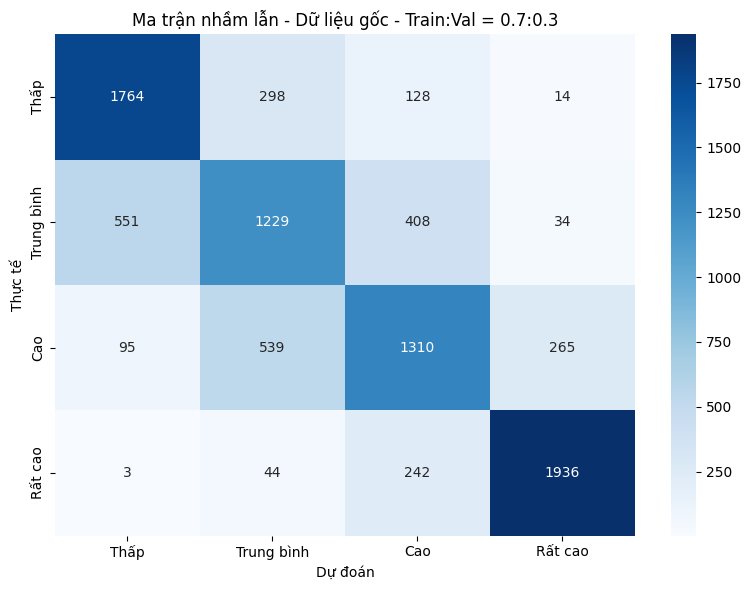

=== Dữ liệu PCA - Train:Val = 0.7:0.3 ===
Độ chính xác (Accuracy): 0.6009
Độ đo Precision (macro): 0.5997
Độ đo Recall (macro): 0.6009
Độ đo F1-score (macro): 0.5981

Báo cáo phân loại chi tiết:
              precision    recall  f1-score   support

         0.0       0.66      0.77      0.71      2204
         1.0       0.47      0.50      0.48      2222
         2.0       0.48      0.41      0.44      2209
         3.0       0.79      0.72      0.75      2225

    accuracy                           0.60      8860
   macro avg       0.60      0.60      0.60      8860
weighted avg       0.60      0.60      0.60      8860



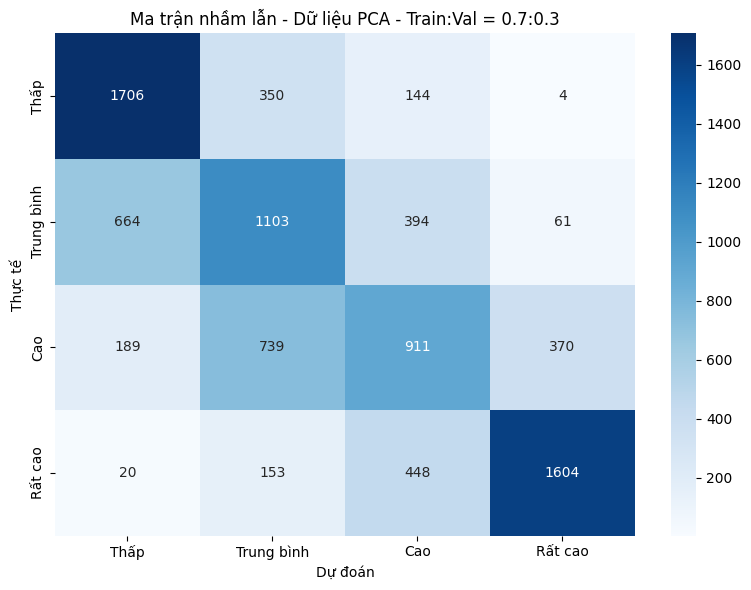


----- Tỷ lệ chia train-validation: 0.6:0.4 -----
=== Dữ liệu gốc - Train:Val = 0.6:0.4 ===
Độ chính xác (Accuracy): 0.7057
Độ đo Precision (macro): 0.7015
Độ đo Recall (macro): 0.7056
Độ đo F1-score (macro): 0.7029

Báo cáo phân loại chi tiết:
              precision    recall  f1-score   support

         0.0       0.73      0.80      0.76      2938
         1.0       0.58      0.56      0.57      2963
         2.0       0.63      0.59      0.61      2945
         3.0       0.86      0.88      0.87      2967

    accuracy                           0.71     11813
   macro avg       0.70      0.71      0.70     11813
weighted avg       0.70      0.71      0.70     11813



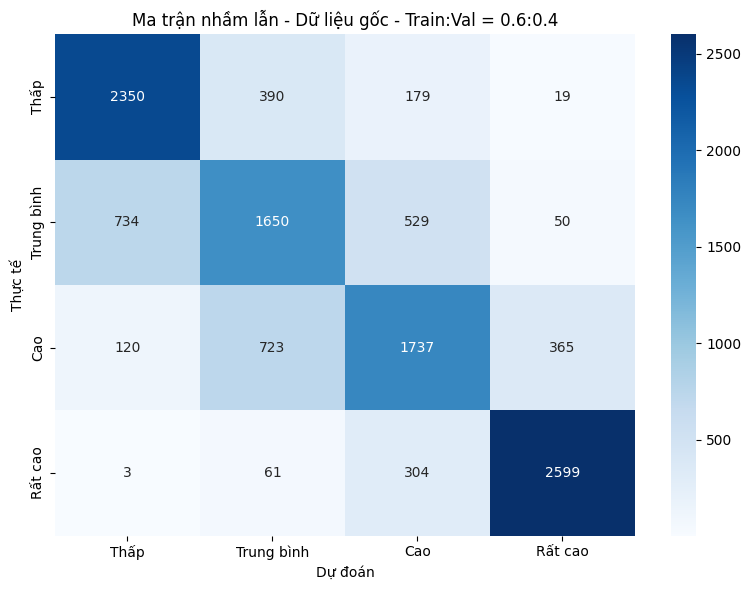

=== Dữ liệu PCA - Train:Val = 0.6:0.4 ===
Độ chính xác (Accuracy): 0.6015
Độ đo Precision (macro): 0.6001
Độ đo Recall (macro): 0.6015
Độ đo F1-score (macro): 0.5986

Báo cáo phân loại chi tiết:
              precision    recall  f1-score   support

         0.0       0.66      0.77      0.71      2938
         1.0       0.47      0.49      0.48      2963
         2.0       0.49      0.42      0.45      2945
         3.0       0.79      0.73      0.76      2967

    accuracy                           0.60     11813
   macro avg       0.60      0.60      0.60     11813
weighted avg       0.60      0.60      0.60     11813



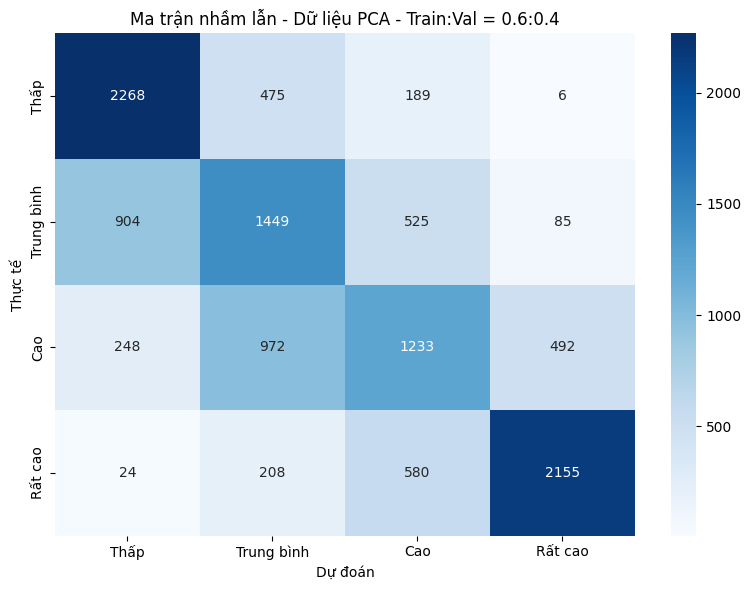


=== Bảng so sánh kết quả ===
  Split Ratio  NB Original Data Accuracy  NB Original Data Precision  \
0     0.8:0.2                   0.703572                    0.699957   
1     0.7:0.3                   0.704176                    0.700432   
2     0.6:0.4                   0.705663                    0.701456   

   NB Original Data Recall  NB Original Data F1  NB PCA Data Accuracy  \
0                 0.703616             0.701142              0.602675   
1                 0.704152             0.701678              0.600903   
2                 0.705629             0.702886              0.601456   

   NB PCA Data Precision  NB PCA Data Recall  NB PCA Data F1  
0               0.603059            0.602727        0.601010  
1               0.599688            0.600937        0.598119  
2               0.600089            0.601496        0.598638  


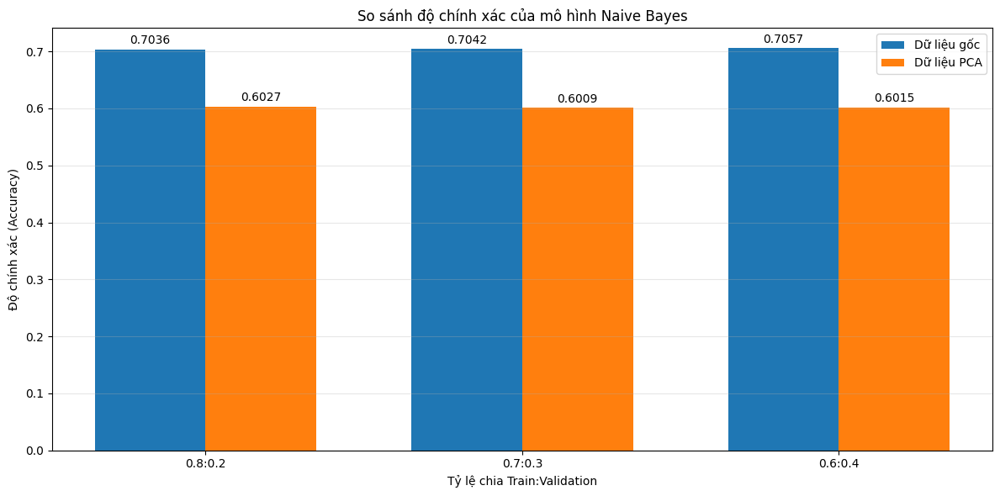

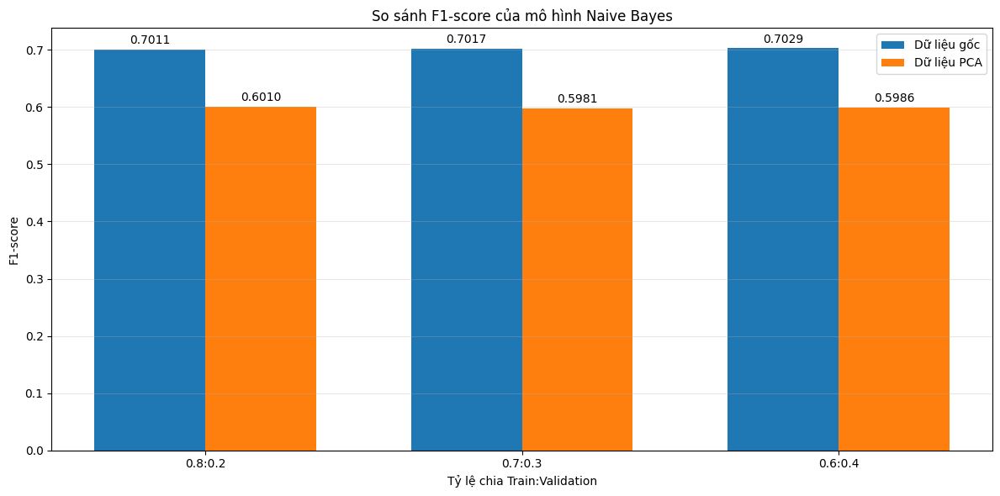

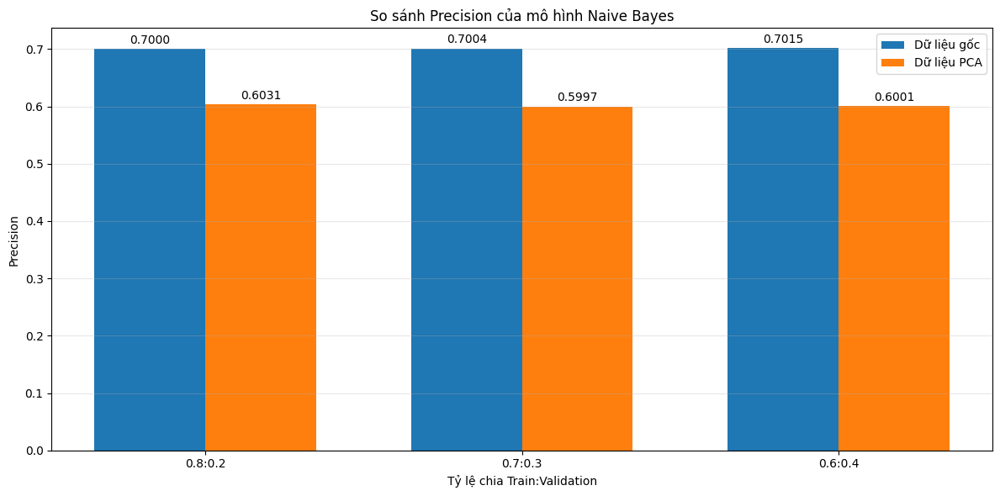

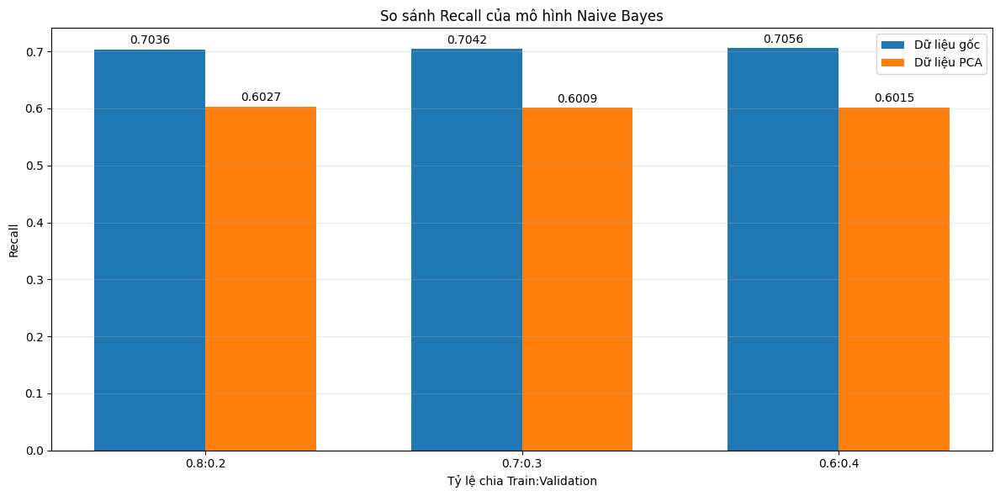

In [ ]:

# Hàm để trực quan hóa ma trận nhầm lẫn
def plot_confusion_matrix(cm, classes, title, cmap=plt.cm.Blues):
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.xlabel('Dự đoán')
    plt.ylabel('Thực tế')
    plt.title(title)
    plt.tight_layout()
    plt.show()

# Hàm đánh giá mô hình
def evaluate_model(X_train, X_test, y_train, y_test, title):
    # Huấn luyện mô hình Naïve Bayes
    model = GaussianNB()
    model.fit(X_train, y_train)

    # Dự đoán
    y_pred = model.predict(X_test)

    # Đánh giá
    accuracy = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)

    # Tính toán precision, recall và f1-score
    precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='macro')

    # In kết quả
    print(f"=== {title} ===")
    print(f"Độ chính xác (Accuracy): {accuracy:.4f}")
    print(f"Độ đo Precision (macro): {precision:.4f}")
    print(f"Độ đo Recall (macro): {recall:.4f}")
    print(f"Độ đo F1-score (macro): {f1:.4f}")
    print("\nBáo cáo phân loại chi tiết:")
    print(report)

    # Vẽ ma trận nhầm lẫn
    class_names = ['Thấp', 'Trung bình', 'Cao', 'Rất cao']
    plot_confusion_matrix(cm, class_names, f'Ma trận nhầm lẫn - {title}')

    return {
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1': f1,
        'model': model
    }

# Chuẩn bị dữ liệu gốc
# Chọn các biến đầu vào từ các chỉ số ô nhiễm (không bao gồm AQI vì đó là biến mục tiêu)
pollutant_cols = ['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'Benzene', 'Toluene', 'Xylene']
# Thêm các biến thời gian
time_cols = ['Year', 'Month', 'Day']

# X_original sẽ chứa tất cả các biến đầu vào
X_original = df[pollutant_cols + time_cols].copy()
# y là biến mục tiêu - nhãn lớp đã được tạo
y = df['AQI_class_numeric'].copy()

# Dữ liệu đã giảm chiều (đã được tạo trước đó trong notebook)
X_pca_data = pd.DataFrame(X_pca, columns=[f'PC{i+1}' for i in range(X_pca.shape[1])])

# Thực hiện phân loại với các tỷ lệ chia khác nhau
split_ratios = [0.2, 0.3, 0.4]  # tương ứng với 8:2, 7:3, 6:4
results = []

for test_size in split_ratios:
    print(f"\n----- Tỷ lệ chia train-validation: {1-test_size:.1f}:{test_size:.1f} -----")

    # Chia dữ liệu gốc
    X_train_orig, X_test_orig, y_train_orig, y_test_orig = train_test_split(
        X_original, y, test_size=test_size, random_state=42, stratify=y
    )

    # Huấn luyện và đánh giá mô hình trên dữ liệu gốc
    metrics_orig = evaluate_model(
        X_train_orig, X_test_orig, y_train_orig, y_test_orig,
        f"Dữ liệu gốc - Train:Val = {1-test_size:.1f}:{test_size:.1f}"
    )

    # Chia dữ liệu đã giảm chiều
    X_train_pca, X_test_pca, y_train_pca, y_test_pca = train_test_split(
        X_pca_data, y, test_size=test_size, random_state=42, stratify=y
    )

    # Huấn luyện và đánh giá mô hình trên dữ liệu đã giảm chiều
    metrics_pca = evaluate_model(
        X_train_pca, X_test_pca, y_train_pca, y_test_pca,
        f"Dữ liệu PCA - Train:Val = {1-test_size:.1f}:{test_size:.1f}"
    )

    # Lưu kết quả để so sánh
    results.append({
        'Split Ratio': f"{1-test_size:.1f}:{test_size:.1f}",
        'NB Original Data Accuracy': metrics_orig['accuracy'],
        'NB Original Data Precision': metrics_orig['precision'],
        'NB Original Data Recall': metrics_orig['recall'],
        'NB Original Data F1': metrics_orig['f1'],
        'NB PCA Data Accuracy': metrics_pca['accuracy'],
        'NB PCA Data Precision': metrics_pca['precision'],
        'NB PCA Data Recall': metrics_pca['recall'],
        'NB PCA Data F1': metrics_pca['f1']
    })

# Hiển thị bảng so sánh kết quả
results_nb = pd.DataFrame(results)
print("\n=== Bảng so sánh kết quả ===")
print(results_nb)

# Trực quan hóa kết quả accuracy (độ chính xác)
plt.figure(figsize=(12, 6))
bar_width = 0.35
x = np.arange(len(split_ratios))

plt.bar(x - bar_width/2, results_nb['NB Original Data Accuracy'], bar_width, label='Dữ liệu gốc')
plt.bar(x + bar_width/2, results_nb['NB PCA Data Accuracy'], bar_width, label='Dữ liệu PCA')

plt.xlabel('Tỷ lệ chia Train:Validation')
plt.ylabel('Độ chính xác (Accuracy)')
plt.title('So sánh độ chính xác của mô hình Naive Bayes')
plt.xticks(x, results_nb['Split Ratio'])
plt.legend()
plt.grid(axis='y', alpha=0.3)

for i, v1, v2 in zip(x, results_nb['NB Original Data Accuracy'], results_nb['NB PCA Data Accuracy']):
    plt.text(i - bar_width/2, v1 + 0.01, f'{v1:.4f}', ha='center')
    plt.text(i + bar_width/2, v2 + 0.01, f'{v2:.4f}', ha='center')

plt.tight_layout()
plt.show()

# Trực quan hóa F1-score
plt.figure(figsize=(12, 6))
bar_width = 0.35
x = np.arange(len(split_ratios))

plt.bar(x - bar_width/2, results_nb['NB Original Data F1'], bar_width, label='Dữ liệu gốc')
plt.bar(x + bar_width/2, results_nb['NB PCA Data F1'], bar_width, label='Dữ liệu PCA')

plt.xlabel('Tỷ lệ chia Train:Validation')
plt.ylabel('F1-score')
plt.title('So sánh F1-score của mô hình Naive Bayes')
plt.xticks(x, results_nb['Split Ratio'])
plt.legend()
plt.grid(axis='y', alpha=0.3)

for i, v1, v2 in zip(x, results_nb['NB Original Data F1'], results_nb['NB PCA Data F1']):
    plt.text(i - bar_width/2, v1 + 0.01, f'{v1:.4f}', ha='center')
    plt.text(i + bar_width/2, v2 + 0.01, f'{v2:.4f}', ha='center')

plt.tight_layout()
plt.show()

# Trực quan hóa Precision
plt.figure(figsize=(12, 6))
bar_width = 0.35
x = np.arange(len(split_ratios))

plt.bar(x - bar_width/2, results_nb['NB Original Data Precision'], bar_width, label='Dữ liệu gốc')
plt.bar(x + bar_width/2, results_nb['NB PCA Data Precision'], bar_width, label='Dữ liệu PCA')

plt.xlabel('Tỷ lệ chia Train:Validation')
plt.ylabel('Precision')
plt.title('So sánh Precision của mô hình Naive Bayes')
plt.xticks(x, results_nb['Split Ratio'])
plt.legend()
plt.grid(axis='y', alpha=0.3)

for i, v1, v2 in zip(x, results_nb['NB Original Data Precision'], results_nb['NB PCA Data Precision']):
    plt.text(i - bar_width/2, v1 + 0.01, f'{v1:.4f}', ha='center')
    plt.text(i + bar_width/2, v2 + 0.01, f'{v2:.4f}', ha='center')

plt.tight_layout()
plt.show()

# Trực quan hóa Recall
plt.figure(figsize=(12, 6))
bar_width = 0.35
x = np.arange(len(split_ratios))

plt.bar(x - bar_width/2, results_nb['NB Original Data Recall'], bar_width, label='Dữ liệu gốc')
plt.bar(x + bar_width/2, results_nb['NB PCA Data Recall'], bar_width, label='Dữ liệu PCA')

plt.xlabel('Tỷ lệ chia Train:Validation')
plt.ylabel('Recall')
plt.title('So sánh Recall của mô hình Naive Bayes')
plt.xticks(x, results_nb['Split Ratio'])
plt.legend()
plt.grid(axis='y', alpha=0.3)

for i, v1, v2 in zip(x, results_nb['NB Original Data Recall'], results_nb['NB PCA Data Recall']):
    plt.text(i - bar_width/2, v1 + 0.01, f'{v1:.4f}', ha='center')
    plt.text(i + bar_width/2, v2 + 0.01, f'{v2:.4f}', ha='center')

plt.tight_layout()
plt.show()

## Random Forest với dữ liệu gốc, PCA


----- Tỷ lệ chia train-validation: 0.8:0.2 -----
=== Dữ liệu gốc - Train:Val = 0.8:0.2 ===
Độ chính xác (Accuracy): 0.8224
Độ đo Precision (macro): 0.8225
Độ đo Recall (macro): 0.8225
Độ đo F1-score (macro): 0.8223

Báo cáo phân loại chi tiết:
              precision    recall  f1-score   support

         0.0       0.85      0.87      0.86      1469
         1.0       0.75      0.73      0.74      1482
         2.0       0.77      0.78      0.78      1473
         3.0       0.92      0.90      0.91      1483

    accuracy                           0.82      5907
   macro avg       0.82      0.82      0.82      5907
weighted avg       0.82      0.82      0.82      5907



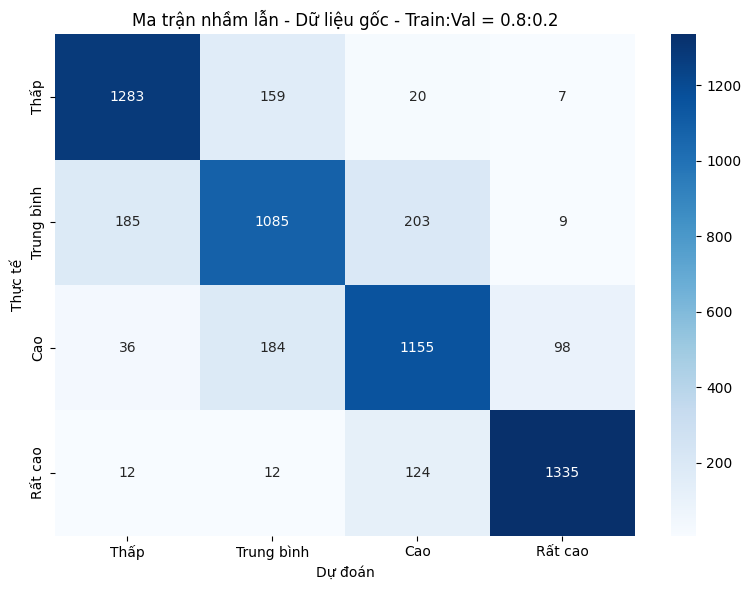

<Figure size 1000x600 with 0 Axes>

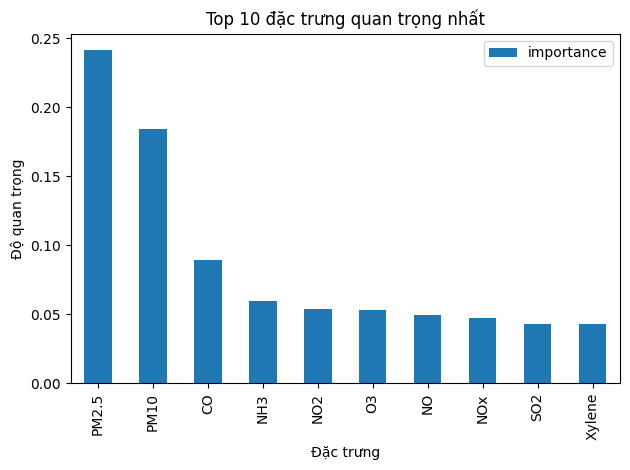

=== Dữ liệu PCA - Train:Val = 0.8:0.2 ===
Độ chính xác (Accuracy): 0.7266
Độ đo Precision (macro): 0.7257
Độ đo Recall (macro): 0.7266
Độ đo F1-score (macro): 0.7260

Báo cáo phân loại chi tiết:
              precision    recall  f1-score   support

         0.0       0.76      0.79      0.78      1469
         1.0       0.65      0.62      0.63      1482
         2.0       0.64      0.64      0.64      1473
         3.0       0.86      0.85      0.86      1483

    accuracy                           0.73      5907
   macro avg       0.73      0.73      0.73      5907
weighted avg       0.73      0.73      0.73      5907



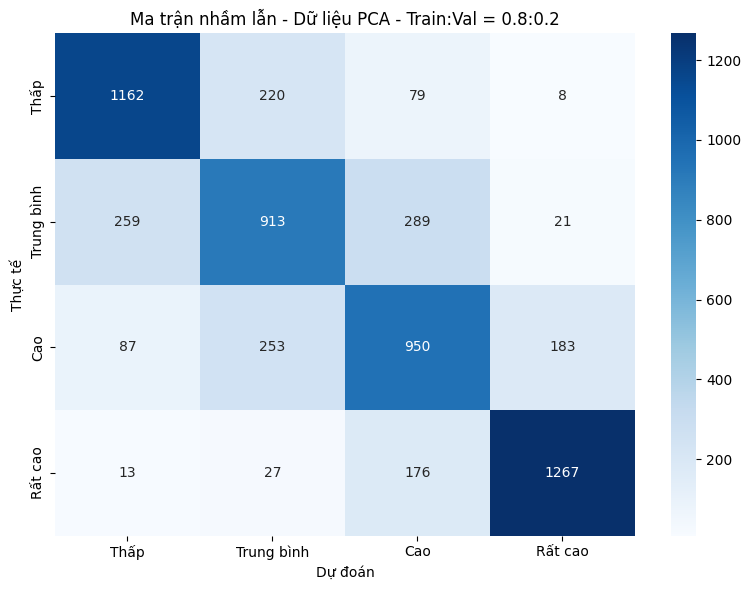


----- Tỷ lệ chia train-validation: 0.7:0.3 -----
=== Dữ liệu gốc - Train:Val = 0.7:0.3 ===
Độ chính xác (Accuracy): 0.8272
Độ đo Precision (macro): 0.8269
Độ đo Recall (macro): 0.8272
Độ đo F1-score (macro): 0.8270

Báo cáo phân loại chi tiết:
              precision    recall  f1-score   support

         0.0       0.85      0.88      0.87      2204
         1.0       0.75      0.75      0.75      2222
         2.0       0.78      0.77      0.77      2209
         3.0       0.92      0.91      0.92      2225

    accuracy                           0.83      8860
   macro avg       0.83      0.83      0.83      8860
weighted avg       0.83      0.83      0.83      8860



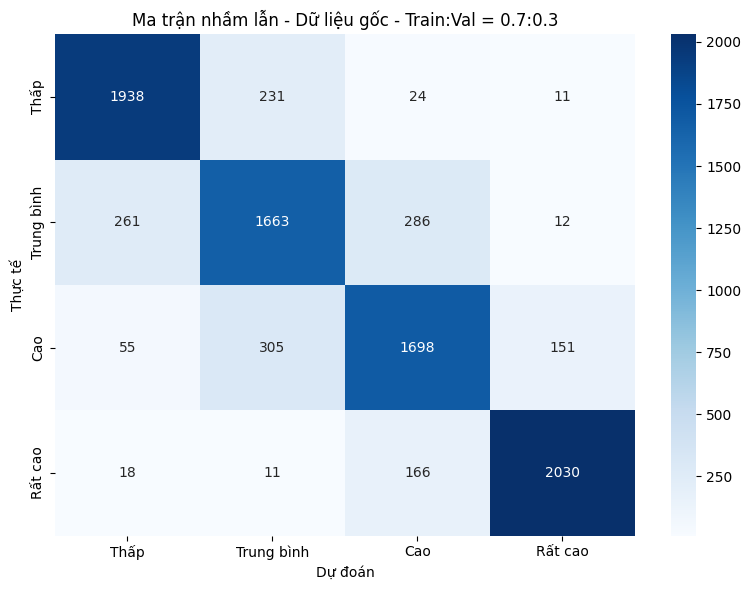

<Figure size 1000x600 with 0 Axes>

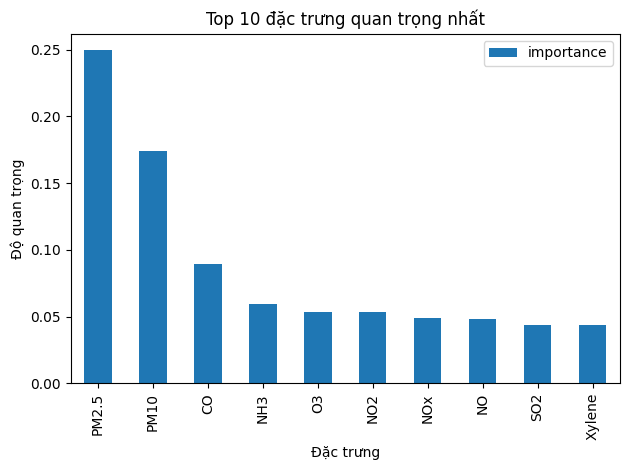

=== Dữ liệu PCA - Train:Val = 0.7:0.3 ===
Độ chính xác (Accuracy): 0.7301
Độ đo Precision (macro): 0.7288
Độ đo Recall (macro): 0.7301
Độ đo F1-score (macro): 0.7293

Báo cáo phân loại chi tiết:
              precision    recall  f1-score   support

         0.0       0.78      0.80      0.79      2204
         1.0       0.65      0.62      0.64      2222
         2.0       0.64      0.64      0.64      2209
         3.0       0.85      0.86      0.86      2225

    accuracy                           0.73      8860
   macro avg       0.73      0.73      0.73      8860
weighted avg       0.73      0.73      0.73      8860



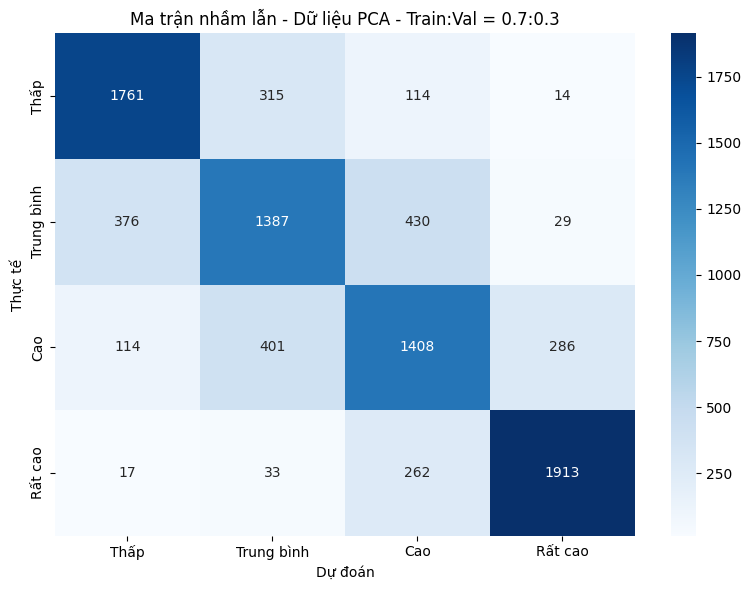


----- Tỷ lệ chia train-validation: 0.6:0.4 -----
=== Dữ liệu gốc - Train:Val = 0.6:0.4 ===
Độ chính xác (Accuracy): 0.8291
Độ đo Precision (macro): 0.8286
Độ đo Recall (macro): 0.8291
Độ đo F1-score (macro): 0.8288

Báo cáo phân loại chi tiết:
              precision    recall  f1-score   support

         0.0       0.86      0.88      0.87      2938
         1.0       0.77      0.74      0.76      2963
         2.0       0.77      0.78      0.78      2945
         3.0       0.92      0.91      0.91      2967

    accuracy                           0.83     11813
   macro avg       0.83      0.83      0.83     11813
weighted avg       0.83      0.83      0.83     11813



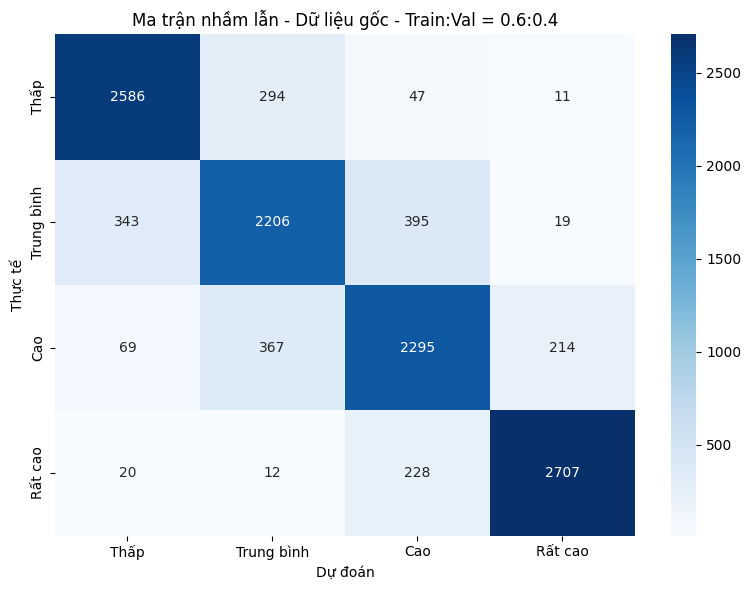

<Figure size 1000x600 with 0 Axes>

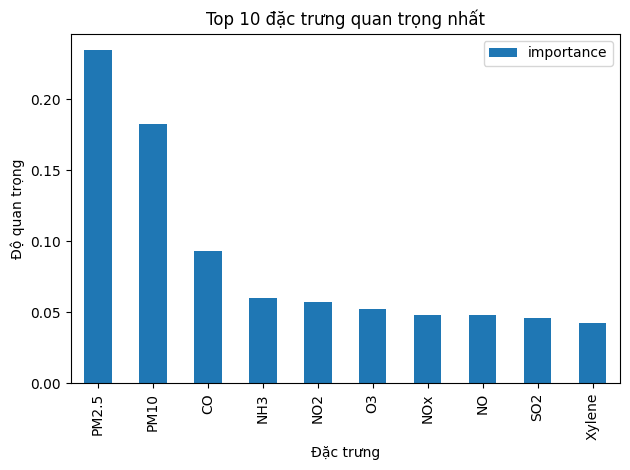

=== Dữ liệu PCA - Train:Val = 0.6:0.4 ===
Độ chính xác (Accuracy): 0.7235
Độ đo Precision (macro): 0.7221
Độ đo Recall (macro): 0.7235
Độ đo F1-score (macro): 0.7227

Báo cáo phân loại chi tiết:
              precision    recall  f1-score   support

         0.0       0.77      0.79      0.78      2938
         1.0       0.63      0.62      0.62      2963
         2.0       0.63      0.63      0.63      2945
         3.0       0.85      0.86      0.86      2967

    accuracy                           0.72     11813
   macro avg       0.72      0.72      0.72     11813
weighted avg       0.72      0.72      0.72     11813



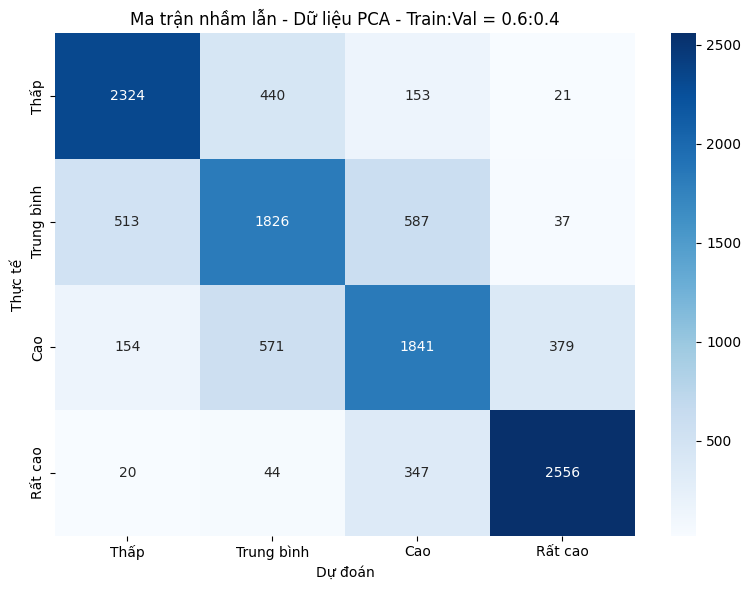


=== Bảng so sánh kết quả ===
  Split Ratio  RF Original Data Accuracy  RF Original Data Precision  \
0     0.8:0.2                   0.822414                    0.822520   
1     0.7:0.3                   0.827201                    0.826896   
2     0.6:0.4                   0.829087                    0.828611   

   RF Original Data Recall  RF Original Data F1  RF PCA Data Accuracy  \
0                 0.822455             0.822346              0.726596   
1                 0.827192             0.826975              0.730135   
2                 0.829091             0.828769              0.723525   

   RF PCA Data Precision  RF PCA Data Recall  RF PCA Data F1  
0               0.725663            0.726591        0.725970  
1               0.728752            0.730096        0.729318  
2               0.722098            0.723471        0.722719  


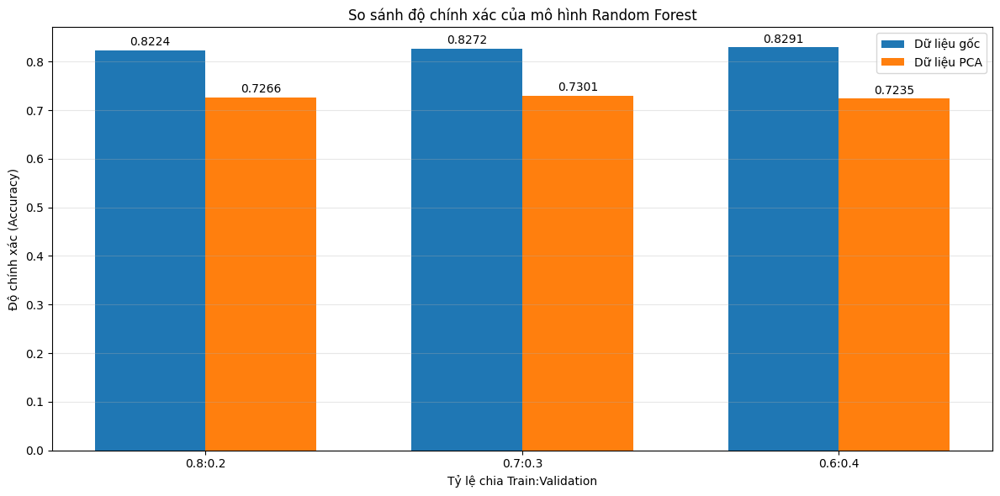

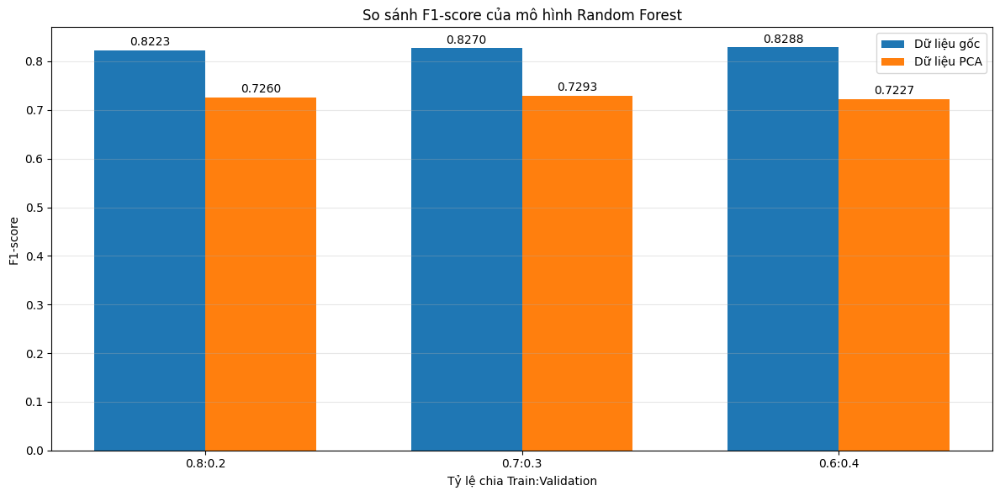

In [ ]:
# Hàm để trực quan hóa ma trận nhầm lẫn
def plot_confusion_matrix(cm, classes, title, cmap=plt.cm.Blues):
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.xlabel('Dự đoán')
    plt.ylabel('Thực tế')
    plt.title(title)
    plt.tight_layout()
    plt.show()

# Hàm đánh giá mô hình
def evaluate_model(X_train, X_test, y_train, y_test, title):
    # Huấn luyện mô hình Random Forest
    model = RandomForestClassifier(n_estimators=100, random_state=42)
    model.fit(X_train, y_train)

    # Dự đoán
    y_pred = model.predict(X_test)

    # Đánh giá
    accuracy = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)

    # Tính toán precision, recall và f1-score
    precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='macro')

    # In kết quả
    print(f"=== {title} ===")
    print(f"Độ chính xác (Accuracy): {accuracy:.4f}")
    print(f"Độ đo Precision (macro): {precision:.4f}")
    print(f"Độ đo Recall (macro): {recall:.4f}")
    print(f"Độ đo F1-score (macro): {f1:.4f}")
    print("\nBáo cáo phân loại chi tiết:")
    print(report)

    # Vẽ ma trận nhầm lẫn
    class_names = ['Thấp', 'Trung bình', 'Cao', 'Rất cao']
    plot_confusion_matrix(cm, class_names, f'Ma trận nhầm lẫn - {title}')

    # Tính toán độ quan trọng của các đặc trưng (chỉ cho mô hình dữ liệu gốc)
    if "gốc" in title.lower():
        feature_importances = pd.DataFrame(
            model.feature_importances_,
            index=X_train.columns,
            columns=['importance']
        ).sort_values('importance', ascending=False)

        # Hiển thị top 10 đặc trưng quan trọng nhất
        plt.figure(figsize=(10, 6))
        feature_importances.head(10).plot(kind='bar')
        plt.title('Top 10 đặc trưng quan trọng nhất')
        plt.xlabel('Đặc trưng')
        plt.ylabel('Độ quan trọng')
        plt.tight_layout()
        plt.show()

    return {
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1': f1,
        'model': model
    }

# Chuẩn bị dữ liệu gốc
# Chọn các biến đầu vào từ các chỉ số ô nhiễm (không bao gồm AQI vì đó là biến mục tiêu)
pollutant_cols = ['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'Benzene', 'Toluene', 'Xylene']
# Thêm các biến thời gian
time_cols = ['Year', 'Month', 'Day']

# X_original sẽ chứa tất cả các biến đầu vào
X_original = df[pollutant_cols + time_cols].copy()
# y là biến mục tiêu - nhãn lớp đã được tạo
y = df['AQI_class_numeric'].copy()

# Dữ liệu đã giảm chiều (đã được tạo trước đó trong notebook)
X_pca_data = pd.DataFrame(X_pca, columns=[f'PC{i+1}' for i in range(X_pca.shape[1])])

# Thực hiện phân loại với các tỷ lệ chia khác nhau
split_ratios = [0.2, 0.3, 0.4]  # tương ứng với 8:2, 7:3, 6:4
results = []

for test_size in split_ratios:
    print(f"\n----- Tỷ lệ chia train-validation: {1-test_size:.1f}:{test_size:.1f} -----")

    # Chia dữ liệu gốc
    X_train_orig, X_test_orig, y_train_orig, y_test_orig = train_test_split(
        X_original, y, test_size=test_size, random_state=42, stratify=y
    )

    # Huấn luyện và đánh giá mô hình trên dữ liệu gốc
    metrics_orig = evaluate_model(
        X_train_orig, X_test_orig, y_train_orig, y_test_orig,
        f"Dữ liệu gốc - Train:Val = {1-test_size:.1f}:{test_size:.1f}"
    )

    # Chia dữ liệu đã giảm chiều
    X_train_pca, X_test_pca, y_train_pca, y_test_pca = train_test_split(
        X_pca_data, y, test_size=test_size, random_state=42, stratify=y
    )

    # Huấn luyện và đánh giá mô hình trên dữ liệu đã giảm chiều
    metrics_pca = evaluate_model(
        X_train_pca, X_test_pca, y_train_pca, y_test_pca,
        f"Dữ liệu PCA - Train:Val = {1-test_size:.1f}:{test_size:.1f}"
    )

    # Lưu kết quả để so sánh
    results.append({
        'Split Ratio': f"{1-test_size:.1f}:{test_size:.1f}",
        'RF Original Data Accuracy': metrics_orig['accuracy'],
        'RF Original Data Precision': metrics_orig['precision'],
        'RF Original Data Recall': metrics_orig['recall'],
        'RF Original Data F1': metrics_orig['f1'],
        'RF PCA Data Accuracy': metrics_pca['accuracy'],
        'RF PCA Data Precision': metrics_pca['precision'],
        'RF PCA Data Recall': metrics_pca['recall'],
        'RF PCA Data F1': metrics_pca['f1']
    })

# Hiển thị bảng so sánh kết quả
results_rf = pd.DataFrame(results)
print("\n=== Bảng so sánh kết quả ===")
print(results_rf)

# Trực quan hóa kết quả accuracy (độ chính xác)
plt.figure(figsize=(12, 6))
bar_width = 0.35
x = np.arange(len(split_ratios))

plt.bar(x - bar_width/2, results_rf['RF Original Data Accuracy'], bar_width, label='Dữ liệu gốc')
plt.bar(x + bar_width/2, results_rf['RF PCA Data Accuracy'], bar_width, label='Dữ liệu PCA')

plt.xlabel('Tỷ lệ chia Train:Validation')
plt.ylabel('Độ chính xác (Accuracy)')
plt.title('So sánh độ chính xác của mô hình Random Forest')
plt.xticks(x, results_rf['Split Ratio'])
plt.legend()
plt.grid(axis='y', alpha=0.3)

for i, v1, v2 in zip(x, results_rf['RF Original Data Accuracy'], results_rf['RF PCA Data Accuracy']):
    plt.text(i - bar_width/2, v1 + 0.01, f'{v1:.4f}', ha='center')
    plt.text(i + bar_width/2, v2 + 0.01, f'{v2:.4f}', ha='center')

plt.tight_layout()
plt.show()

# Trực quan hóa F1-score
plt.figure(figsize=(12, 6))
bar_width = 0.35
x = np.arange(len(split_ratios))

plt.bar(x - bar_width/2, results_rf['RF Original Data F1'], bar_width, label='Dữ liệu gốc')
plt.bar(x + bar_width/2, results_rf['RF PCA Data F1'], bar_width, label='Dữ liệu PCA')

plt.xlabel('Tỷ lệ chia Train:Validation')
plt.ylabel('F1-score')
plt.title('So sánh F1-score của mô hình Random Forest')
plt.xticks(x, results_rf['Split Ratio'])
plt.legend()
plt.grid(axis='y', alpha=0.3)

for i, v1, v2 in zip(x, results_rf['RF Original Data F1'], results_rf['RF PCA Data F1']):
    plt.text(i - bar_width/2, v1 + 0.01, f'{v1:.4f}', ha='center')
    plt.text(i + bar_width/2, v2 + 0.01, f'{v2:.4f}', ha='center')

plt.tight_layout()
plt.show()

## So sánh Naive Bayes và Random Forest


=== Bảng so sánh kết quả giữa Naive Bayes và Random Forest ===
  Split Ratio  NB - Original  NB - PCA  RF - Original  RF - PCA
0     0.8:0.2       0.703572  0.602675       0.822414  0.726596
1     0.7:0.3       0.704176  0.600903       0.827201  0.730135
2     0.6:0.4       0.705663  0.601456       0.829087  0.723525


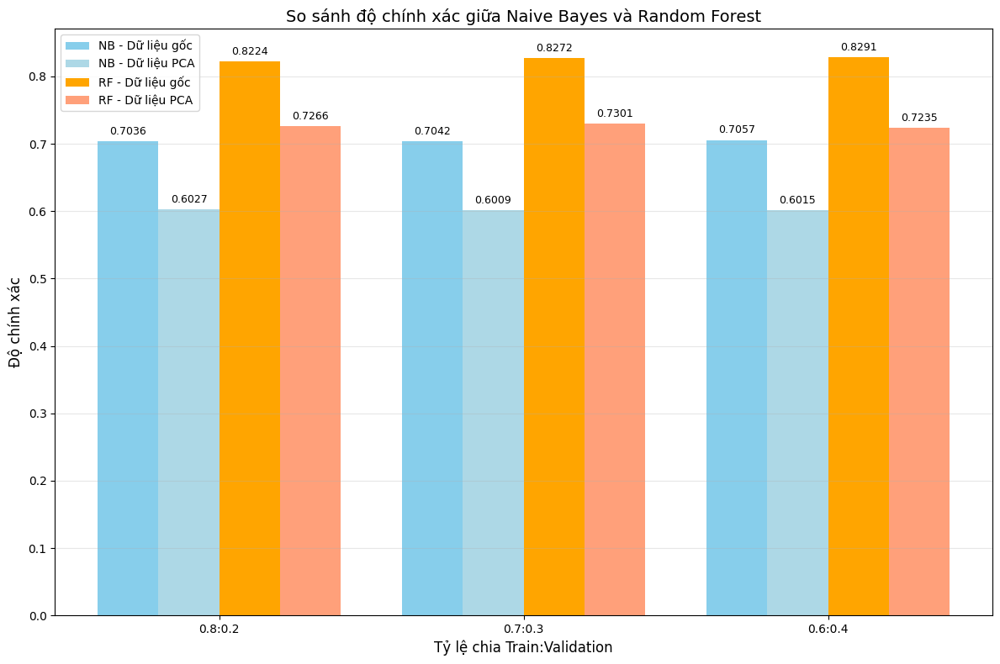

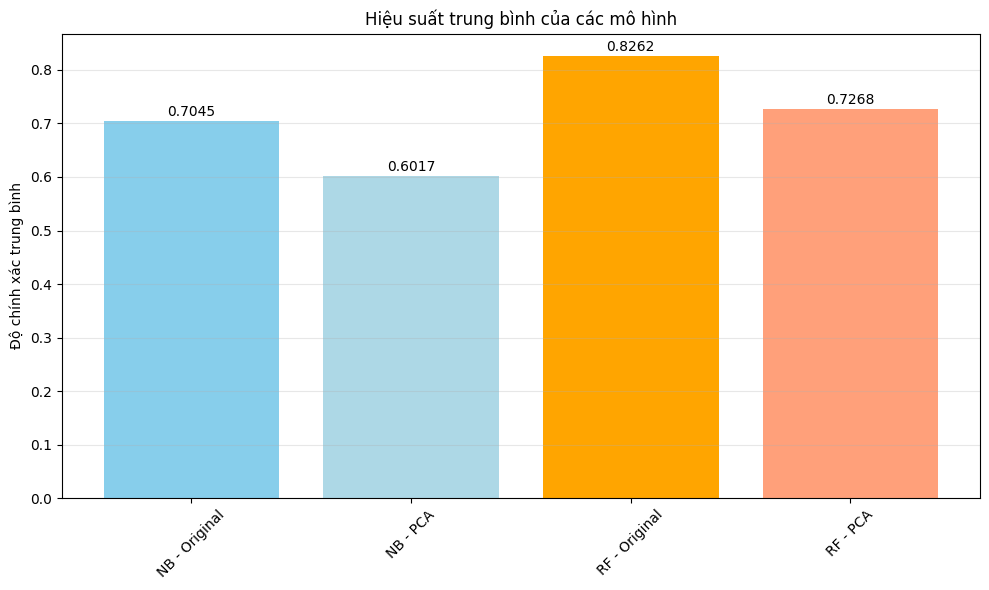

In [ ]:
# Giả định là bạn đã có kết quả của cả 2 mô hình từ các đoạn code trước
# Tạo DataFrame mới để so sánh cả 2 mô hình
nb_results = pd.DataFrame({
    'Split Ratio': results_nb['Split Ratio'],
    'NB - Original': results_nb['NB Original Data Accuracy'],
    'NB - PCA': results_nb['NB PCA Data Accuracy']
})

rf_results = pd.DataFrame({
    'Split Ratio': results_rf['Split Ratio'],
    'RF - Original': results_rf['RF Original Data Accuracy'],
    'RF - PCA': results_rf['RF PCA Data Accuracy']
})

# Tạo bảng so sánh
comparison_df = pd.merge(nb_results, rf_results, on='Split Ratio')
print("\n=== Bảng so sánh kết quả giữa Naive Bayes và Random Forest ===")
print(comparison_df)

# Vẽ biểu đồ so sánh
plt.figure(figsize=(12, 8))
bar_width = 0.2
x = np.arange(len(comparison_df['Split Ratio']))

# Vẽ 4 nhóm thanh
plt.bar(x - 1.5*bar_width, comparison_df['NB - Original'], bar_width,
        label='NB - Dữ liệu gốc', color='skyblue')
plt.bar(x - 0.5*bar_width, comparison_df['NB - PCA'], bar_width,
        label='NB - Dữ liệu PCA', color='lightblue')
plt.bar(x + 0.5*bar_width, comparison_df['RF - Original'], bar_width,
        label='RF - Dữ liệu gốc', color='orange')
plt.bar(x + 1.5*bar_width, comparison_df['RF - PCA'], bar_width,
        label='RF - Dữ liệu PCA', color='lightsalmon')

# Thêm các thông tin cho biểu đồ
plt.xlabel('Tỷ lệ chia Train:Validation', fontsize=12)
plt.ylabel('Độ chính xác', fontsize=12)
plt.title('So sánh độ chính xác giữa Naive Bayes và Random Forest', fontsize=14)
plt.xticks(x, comparison_df['Split Ratio'])
plt.legend()
plt.grid(axis='y', alpha=0.3)

# Thêm giá trị lên mỗi cột
for i, (v1, v2, v3, v4) in enumerate(zip(
    comparison_df['NB - Original'],
    comparison_df['NB - PCA'],
    comparison_df['RF - Original'],
    comparison_df['RF - PCA']
)):
    plt.text(i - 1.5*bar_width, v1 + 0.01, f'{v1:.4f}', ha='center', fontsize=9)
    plt.text(i - 0.5*bar_width, v2 + 0.01, f'{v2:.4f}', ha='center', fontsize=9)
    plt.text(i + 0.5*bar_width, v3 + 0.01, f'{v3:.4f}', ha='center', fontsize=9)
    plt.text(i + 1.5*bar_width, v4 + 0.01, f'{v4:.4f}', ha='center', fontsize=9)

plt.tight_layout()
plt.show()

# Vẽ biểu đồ hiệu suất theo loại dữ liệu
plt.figure(figsize=(10, 6))

# Tính trung bình độ chính xác theo loại mô hình và loại dữ liệu
model_avg = {
    'NB - Original': comparison_df['NB - Original'].mean(),
    'NB - PCA': comparison_df['NB - PCA'].mean(),
    'RF - Original': comparison_df['RF - Original'].mean(),
    'RF - PCA': comparison_df['RF - PCA'].mean()
}

# Vẽ biểu đồ tổng hợp
x_pos = np.arange(len(model_avg))
bars = plt.bar(x_pos, model_avg.values(), color=['skyblue', 'lightblue', 'orange', 'lightsalmon'])

# Thêm giá trị và nhãn
for i, v in enumerate(model_avg.values()):
    plt.text(i, v + 0.01, f'{v:.4f}', ha='center')

plt.title('Hiệu suất trung bình của các mô hình')
plt.xticks(x_pos, model_avg.keys(), rotation=45)
plt.ylabel('Độ chính xác trung bình')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()